# 52-Week High Pullback — Mean Reversion Strategy

## Idea

A stock that recently hit a **52-week high** has demonstrated momentum and investor interest. If it then pulls back by ~15% from that high, the thesis is:

1. The 52-week high acts as a **magnetic target** — stocks tend to retest levels that previously attracted buyers
2. A pullback from a recent high is often **temporary** (earnings miss, macro noise, sector rotation) rather than a structural breakdown
3. We sell once the stock recovers near its 52-week high, capturing the reversion

This is a **mean reversion** strategy using the 52-week high as the anchor.

## Entry & Exit Rules

| Parameter | Baseline | Sensitivity range |
|-----------|----------|-------------------|
| 52-week high lookback | 252 trading days | fixed |
| "Near high" threshold for entry eligibility | top 10% of range in last 252d | configurable |
| Pullback depth trigger | −15% from recent 52w high | −10%, −15%, −20%, −25%, −30% |
| Exit target | within 3% of 52w high | 3%, 5%, 8% |
| Stop-loss | −35% from entry (catastrophe protection) | fixed |
| Max hold | 63 trading days (~3 months) | fixed |
| Top-N concurrent positions | 20 | configurable |
| Transaction cost | 0.1% one-way | fixed |

In [1]:
import os, sys, warnings
sys.path.insert(0, os.path.abspath("../../../src"))
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

plt.rcParams.update({
    "figure.facecolor": "white",
    "axes.facecolor": "#f8f9fa",
    "axes.grid": True,
    "grid.color": "#e0e0e0",
    "grid.linewidth": 0.6,
    "font.size": 10,
})

UNIVERSE_FILE  = "../../../universe.csv"
INITIAL_CAPITAL = 100_000
BACKTEST_PERIOD = "4y"
TRANSACTION_COST = 0.001   # 0.1% one-way

# ── Baseline strategy parameters ────────────────────────────────────────────
HIGH_LOOKBACK    = 252    # 52-week high window (trading days)
NEAR_HIGH_PCT    = 0.90   # stock must have reached >= 90th percentile of its 252d range
                          # within the last 22 days ("was recently near its high")
NEAR_HIGH_WINDOW = 22     # days to look back for the "near high" event
PULLBACK_PCT     = 0.15   # current price must be >= 15% below its 52w high
EXIT_NEAR_HIGH   = 0.03   # sell when price is within 3% of the 52w high
STOP_LOSS        = 0.35   # stop if price drops 35% from our entry
MAX_HOLD_DAYS    = 63     # force-exit after 3 months regardless
TOP_N            = 20     # max concurrent positions
REBAL_FREQ       = 5      # check for new entries every 5 days (weekly)

print("Setup complete.")

Setup complete.


## 1. Load Full Universe

We use the **full S&P 1500 universe** (~1,392 stocks) — no sampling. The mean-reversion signal is selective enough that running on the full set is worth it.

In [2]:
universe_df = pd.read_csv(UNIVERSE_FILE)
ALL_TICKERS = universe_df["Symbol"].tolist()
print(f"Universe: {len(ALL_TICKERS)} stocks across {universe_df['Sector'].nunique()} sectors")
print(universe_df["Sector"].value_counts().to_string())

Universe: 1392 stocks across 11 sectors
Sector
Industrials               246
Financials                232
Consumer Discretionary    180
Information Technology    176
Health Care               159
Real Estate                89
Materials                  76
Consumer Staples           72
Energy                     62
Utilities                  57
Communication Services     43


## 2. Download Historical Data

Downloading ~1,400 stocks takes a few minutes. We download 4 years of daily close prices.

In [3]:
download_tickers = ALL_TICKERS + ["SPY"]

print(f"Downloading {len(download_tickers)} tickers for {BACKTEST_PERIOD}. This may take a few minutes…")
raw = yf.download(
    download_tickers,
    period=BACKTEST_PERIOD,
    group_by="ticker",
    progress=True,
    threads=True,
    auto_adjust=True,
)

def extract_close(raw, ticker):
    try:
        s = raw[ticker]["Close"].dropna()
        return s if not isinstance(s, pd.DataFrame) else s.iloc[:, 0]
    except Exception:
        return pd.Series(dtype=float)

MIN_BARS = HIGH_LOOKBACK + 60
close_dict = {t: extract_close(raw, t) for t in download_tickers}
valid = [t for t in ALL_TICKERS if len(close_dict.get(t, [])) >= MIN_BARS]

closes  = pd.DataFrame({t: close_dict[t] for t in valid}).sort_index()
spy_close = close_dict["SPY"].sort_index()

print(f"Valid tickers with enough history: {len(valid)}")
print(f"Price matrix: {closes.shape[0]} days × {closes.shape[1]} stocks")
print(f"Date range:   {closes.index[0].date()} → {closes.index[-1].date()}")


[                       0%                       ]


[                       0%                       ]


[                       0%                       ]  3 of 1393 completed


[                       0%                       ]  4 of 1393 completed


[                       0%                       ]  5 of 1393 completed
[                       0%                       ]  5 of 1393 completed


[                       1%                       ]  7 of 1393 completed


[                       1%                       ]  8 of 1393 completed


[                       1%                       ]  8 of 1393 completed


[                       1%                       ]  10 of 1393 completed


[                       1%                       ]  11 of 1393 completed


[                       1%                       ]  12 of 1393 completed


[                       1%                       ]  13 of 1393 completed


[                       1%                       ]  14 of 1393 completed


[                       1%                       ]  15 of 1393 completed


[                       1%                       ]  16 of 1393 completed
[                       1%                       ]  16 of 1393 completed


[                       1%                       ]  18 of 1393 completed


[                       1%                       ]  19 of 1393 completed


[                       1%                       ]  20 of 1393 completed


[*                      2%                       ]  21 of 1393 completed


[*                      2%                       ]  22 of 1393 completed


[*                      2%                       ]  23 of 1393 completed


[*                      2%                       ]  24 of 1393 completed


[*                      2%                       ]  25 of 1393 completed


[*                      2%                       ]  26 of 1393 completed


[*                      2%                       ]  27 of 1393 completed


[*                      2%                       ]  27 of 1393 completed


[*                      2%                       ]  29 of 1393 completed


[*                      2%                       ]  30 of 1393 completed


[*                      2%                       ]  31 of 1393 completed


[*                      2%                       ]  32 of 1393 completed


[*                      2%                       ]  32 of 1393 completed


[*                      2%                       ]  34 of 1393 completed


[*                      3%                       ]  35 of 1393 completed


[*                      3%                       ]  36 of 1393 completed


[*                      3%                       ]  37 of 1393 completed


[*                      3%                       ]  38 of 1393 completed


[*                      3%                       ]  39 of 1393 completed


[*                      3%                       ]  40 of 1393 completed


[*                      3%                       ]  41 of 1393 completed


[*                      3%                       ]  42 of 1393 completed


[*                      3%                       ]  42 of 1393 completed


[*                      3%                       ]  44 of 1393 completed


[*                      3%                       ]  45 of 1393 completed


[*                      3%                       ]  46 of 1393 completed


[*                      3%                       ]  47 of 1393 completed


[*                      3%                       ]  48 of 1393 completed


[**                     4%                       ]  49 of 1393 completed


[**                     4%                       ]  50 of 1393 completed


[**                     4%                       ]  51 of 1393 completed


[**                     4%                       ]  52 of 1393 completed


[**                     4%                       ]  53 of 1393 completed


[**                     4%                       ]  53 of 1393 completed


[**                     4%                       ]  55 of 1393 completed


[**                     4%                       ]  56 of 1393 completed


[**                     4%                       ]  57 of 1393 completed


[**                     4%                       ]  58 of 1393 completed


[**                     4%                       ]  59 of 1393 completed


[**                     4%                       ]  60 of 1393 completed


[**                     4%                       ]  61 of 1393 completed


[**                     4%                       ]  62 of 1393 completed


[**                     5%                       ]  63 of 1393 completed


[**                     5%                       ]  64 of 1393 completed


[**                     5%                       ]  65 of 1393 completed


[**                     5%                       ]  66 of 1393 completed


[**                     5%                       ]  67 of 1393 completed
[**                     5%                       ]  67 of 1393 completed


[**                     5%                       ]  69 of 1393 completed


[**                     5%                       ]  70 of 1393 completed


[**                     5%                       ]  71 of 1393 completed


[**                     5%                       ]  72 of 1393 completed


[**                     5%                       ]  73 of 1393 completed


[**                     5%                       ]  73 of 1393 completed


[**                     5%                       ]  75 of 1393 completed


[**                     5%                       ]  75 of 1393 completed


[***                    6%                       ]  77 of 1393 completed


[***                    6%                       ]  78 of 1393 completed


[***                    6%                       ]  79 of 1393 completed


[***                    6%                       ]  80 of 1393 completed


[***                    6%                       ]  81 of 1393 completed


[***                    6%                       ]  82 of 1393 completed


[***                    6%                       ]  83 of 1393 completed


[***                    6%                       ]  84 of 1393 completed


[***                    6%                       ]  85 of 1393 completed


[***                    6%                       ]  86 of 1393 completed


[***                    6%                       ]  87 of 1393 completed


[***                    6%                       ]  88 of 1393 completed


[***                    6%                       ]  89 of 1393 completed


[***                    6%                       ]  89 of 1393 completed


[***                    7%                       ]  91 of 1393 completed


[***                    7%                       ]  92 of 1393 completed


[***                    7%                       ]  93 of 1393 completed


[***                    7%                       ]  94 of 1393 completed


[***                    7%                       ]  95 of 1393 completed


[***                    7%                       ]  96 of 1393 completed


[***                    7%                       ]  97 of 1393 completed


[***                    7%                       ]  98 of 1393 completed


[***                    7%                       ]  99 of 1393 completed


[***                    7%                       ]  100 of 1393 completed


[***                    7%                       ]  100 of 1393 completed


[***                    7%                       ]  102 of 1393 completed


[***                    7%                       ]  103 of 1393 completed


[***                    7%                       ]  103 of 1393 completed
[***                    7%                       ]  103 of 1393 completed


[****                   8%                       ]  106 of 1393 completed


[****                   8%                       ]  107 of 1393 completed


[****                   8%                       ]  108 of 1393 completed


[****                   8%                       ]  109 of 1393 completed


[****                   8%                       ]  110 of 1393 completed


[****                   8%                       ]  111 of 1393 completed


[****                   8%                       ]  112 of 1393 completed


[****                   8%                       ]  113 of 1393 completed


[****                   8%                       ]  114 of 1393 completed


[****                   8%                       ]  115 of 1393 completed


[****                   8%                       ]  116 of 1393 completed


[****                   8%                       ]  117 of 1393 completed


[****                   8%                       ]  118 of 1393 completed


[****                   9%                       ]  119 of 1393 completed


[****                   9%                       ]  120 of 1393 completed


[****                   9%                       ]  121 of 1393 completed


[****                   9%                       ]  122 of 1393 completed


[****                   9%                       ]  123 of 1393 completed


[****                   9%                       ]  124 of 1393 completed


[****                   9%                       ]  125 of 1393 completed


[****                   9%                       ]  126 of 1393 completed


[****                   9%                       ]  127 of 1393 completed


[****                   9%                       ]  128 of 1393 completed


[****                   9%                       ]  128 of 1393 completed


[****                   9%                       ]  130 of 1393 completed


[****                   9%                       ]  131 of 1393 completed


[****                   9%                       ]  132 of 1393 completed


[*****                 10%                       ]  133 of 1393 completed


[*****                 10%                       ]  134 of 1393 completed


[*****                 10%                       ]  135 of 1393 completed


[*****                 10%                       ]  136 of 1393 completed


[*****                 10%                       ]  137 of 1393 completed


[*****                 10%                       ]  138 of 1393 completed


[*****                 10%                       ]  139 of 1393 completed


[*****                 10%                       ]  140 of 1393 completed


[*****                 10%                       ]  141 of 1393 completed
[*****                 10%                       ]  141 of 1393 completed


[*****                 10%                       ]  143 of 1393 completed


[*****                 10%                       ]  144 of 1393 completed


[*****                 10%                       ]  145 of 1393 completed


[*****                 10%                       ]  146 of 1393 completed


[*****                 11%                       ]  147 of 1393 completed


[*****                 11%                       ]  148 of 1393 completed


[*****                 11%                       ]  149 of 1393 completed


[*****                 11%                       ]  150 of 1393 completed


[*****                 11%                       ]  151 of 1393 completed
[*****                 11%                       ]  151 of 1393 completed


[*****                 11%                       ]  153 of 1393 completed


[*****                 11%                       ]  154 of 1393 completed


[*****                 11%                       ]  155 of 1393 completed


[*****                 11%                       ]  155 of 1393 completed


[*****                 11%                       ]  157 of 1393 completed


[*****                 11%                       ]  158 of 1393 completed


[*****                 11%                       ]  159 of 1393 completed


[*****                 11%                       ]  160 of 1393 completed


[*****                 11%                       ]  160 of 1393 completed


[******                12%                       ]  162 of 1393 completed


[******                12%                       ]  163 of 1393 completed


[******                12%                       ]  163 of 1393 completed


[******                12%                       ]  165 of 1393 completed


[******                12%                       ]  166 of 1393 completed


[******                12%                       ]  167 of 1393 completed


[******                12%                       ]  168 of 1393 completed


[******                12%                       ]  169 of 1393 completed


[******                12%                       ]  170 of 1393 completed


[******                12%                       ]  171 of 1393 completed


[******                12%                       ]  172 of 1393 completed


[******                12%                       ]  173 of 1393 completed


[******                12%                       ]  174 of 1393 completed


[******                13%                       ]  175 of 1393 completed


[******                13%                       ]  176 of 1393 completed


[******                13%                       ]  177 of 1393 completed


[******                13%                       ]  178 of 1393 completed


[******                13%                       ]  178 of 1393 completed


[******                13%                       ]  180 of 1393 completed


[******                13%                       ]  181 of 1393 completed


[******                13%                       ]  182 of 1393 completed


[******                13%                       ]  183 of 1393 completed


[******                13%                       ]  184 of 1393 completed


[******                13%                       ]  185 of 1393 completed


[******                13%                       ]  186 of 1393 completed


[******                13%                       ]  187 of 1393 completed


[******                13%                       ]  188 of 1393 completed


[*******               14%                       ]  189 of 1393 completed


[*******               14%                       ]  190 of 1393 completed


[*******               14%                       ]  190 of 1393 completed


[*******               14%                       ]  192 of 1393 completed


[*******               14%                       ]  193 of 1393 completed


[*******               14%                       ]  194 of 1393 completed


[*******               14%                       ]  195 of 1393 completed


[*******               14%                       ]  196 of 1393 completed
[*******               14%                       ]  196 of 1393 completed


[*******               14%                       ]  196 of 1393 completed


[*******               14%                       ]  199 of 1393 completed


[*******               14%                       ]  199 of 1393 completed


[*******               14%                       ]  201 of 1393 completed


[*******               15%                       ]  202 of 1393 completed


[*******               15%                       ]  203 of 1393 completed


[*******               15%                       ]  204 of 1393 completed


[*******               15%                       ]  205 of 1393 completed


[*******               15%                       ]  206 of 1393 completed


[*******               15%                       ]  207 of 1393 completed
[*******               15%                       ]  207 of 1393 completed


[*******               15%                       ]  209 of 1393 completed


[*******               15%                       ]  210 of 1393 completed


[*******               15%                       ]  211 of 1393 completed


[*******               15%                       ]  212 of 1393 completed


[*******               15%                       ]  213 of 1393 completed


[*******               15%                       ]  214 of 1393 completed


[*******               15%                       ]  215 of 1393 completed


[********              16%                       ]  216 of 1393 completed


[********              16%                       ]  217 of 1393 completed


[********              16%                       ]  217 of 1393 completed
[********              16%                       ]  217 of 1393 completed


[********              16%                       ]  220 of 1393 completed


[********              16%                       ]  221 of 1393 completed


[********              16%                       ]  222 of 1393 completed


[********              16%                       ]  223 of 1393 completed


[********              16%                       ]  224 of 1393 completed


[********              16%                       ]  225 of 1393 completed


[********              16%                       ]  225 of 1393 completed
[********              16%                       ]  225 of 1393 completed
[********              16%                       ]  225 of 1393 completed


[********              16%                       ]  229 of 1393 completed


[********              17%                       ]  230 of 1393 completed


[********              17%                       ]  231 of 1393 completed


[********              17%                       ]  232 of 1393 completed


[********              17%                       ]  233 of 1393 completed


[********              17%                       ]  234 of 1393 completed


[********              17%                       ]  235 of 1393 completed


[********              17%                       ]  236 of 1393 completed


[********              17%                       ]  237 of 1393 completed
[********              17%                       ]  237 of 1393 completed


[********              17%                       ]  239 of 1393 completed


[********              17%                       ]  240 of 1393 completed


[********              17%                       ]  241 of 1393 completed


[********              17%                       ]  242 of 1393 completed


[********              17%                       ]  243 of 1393 completed


[*********             18%                       ]  244 of 1393 completed


[*********             18%                       ]  245 of 1393 completed


[*********             18%                       ]  246 of 1393 completed


[*********             18%                       ]  247 of 1393 completed


[*********             18%                       ]  248 of 1393 completed


[*********             18%                       ]  249 of 1393 completed


[*********             18%                       ]  250 of 1393 completed
[*********             18%                       ]  250 of 1393 completed


[*********             18%                       ]  252 of 1393 completed


[*********             18%                       ]  253 of 1393 completed


[*********             18%                       ]  254 of 1393 completed


[*********             18%                       ]  255 of 1393 completed


[*********             18%                       ]  256 of 1393 completed


[*********             18%                       ]  257 of 1393 completed
[*********             18%                       ]  257 of 1393 completed


[*********             19%                       ]  259 of 1393 completed


[*********             19%                       ]  260 of 1393 completed


[*********             19%                       ]  261 of 1393 completed


[*********             19%                       ]  262 of 1393 completed


[*********             19%                       ]  263 of 1393 completed


[*********             19%                       ]  264 of 1393 completed


[*********             19%                       ]  265 of 1393 completed


[*********             19%                       ]  266 of 1393 completed


[*********             19%                       ]  267 of 1393 completed


[*********             19%                       ]  268 of 1393 completed


[*********             19%                       ]  269 of 1393 completed


[*********             19%                       ]  270 of 1393 completed
[*********             19%                       ]  270 of 1393 completed


[**********            20%                       ]  272 of 1393 completed


[**********            20%                       ]  273 of 1393 completed


[**********            20%                       ]  274 of 1393 completed


[**********            20%                       ]  275 of 1393 completed


[**********            20%                       ]  276 of 1393 completed


[**********            20%                       ]  277 of 1393 completed


[**********            20%                       ]  278 of 1393 completed


[**********            20%                       ]  279 of 1393 completed


[**********            20%                       ]  279 of 1393 completed


[**********            20%                       ]  281 of 1393 completed


[**********            20%                       ]  282 of 1393 completed


[**********            20%                       ]  283 of 1393 completed


[**********            20%                       ]  284 of 1393 completed


[**********            20%                       ]  285 of 1393 completed


[**********            20%                       ]  285 of 1393 completed


[**********            21%                       ]  287 of 1393 completed


[**********            21%                       ]  288 of 1393 completed


[**********            21%                       ]  289 of 1393 completed


[**********            21%                       ]  290 of 1393 completed
[**********            21%                       ]  290 of 1393 completed


[**********            21%                       ]  292 of 1393 completed


[**********            21%                       ]  293 of 1393 completed


[**********            21%                       ]  294 of 1393 completed


[**********            21%                       ]  295 of 1393 completed


[**********            21%                       ]  296 of 1393 completed


[**********            21%                       ]  297 of 1393 completed
[**********            21%                       ]  297 of 1393 completed


[**********            21%                       ]  297 of 1393 completed


[***********           22%                       ]  300 of 1393 completed


[***********           22%                       ]  301 of 1393 completed


[***********           22%                       ]  302 of 1393 completed


[***********           22%                       ]  303 of 1393 completed


[***********           22%                       ]  303 of 1393 completed


[***********           22%                       ]  305 of 1393 completed


[***********           22%                       ]  306 of 1393 completed


[***********           22%                       ]  306 of 1393 completed


[***********           22%                       ]  308 of 1393 completed


[***********           22%                       ]  309 of 1393 completed


[***********           22%                       ]  310 of 1393 completed


[***********           22%                       ]  311 of 1393 completed


[***********           22%                       ]  312 of 1393 completed


[***********           22%                       ]  312 of 1393 completed


[***********           23%                       ]  314 of 1393 completed


[***********           23%                       ]  315 of 1393 completed


[***********           23%                       ]  316 of 1393 completed


[***********           23%                       ]  317 of 1393 completed


[***********           23%                       ]  318 of 1393 completed


[***********           23%                       ]  319 of 1393 completed


[***********           23%                       ]  320 of 1393 completed


[***********           23%                       ]  320 of 1393 completed


[***********           23%                       ]  322 of 1393 completed


[***********           23%                       ]  323 of 1393 completed


[***********           23%                       ]  324 of 1393 completed


[***********           23%                       ]  325 of 1393 completed


[***********           23%                       ]  326 of 1393 completed


[***********           23%                       ]  327 of 1393 completed


[************          24%                       ]  328 of 1393 completed


[************          24%                       ]  329 of 1393 completed


[************          24%                       ]  330 of 1393 completed


[************          24%                       ]  331 of 1393 completed


[************          24%                       ]  332 of 1393 completed


[************          24%                       ]  332 of 1393 completed


[************          24%                       ]  334 of 1393 completed


[************          24%                       ]  335 of 1393 completed


[************          24%                       ]  336 of 1393 completed


[************          24%                       ]  337 of 1393 completed


[************          24%                       ]  338 of 1393 completed


[************          24%                       ]  339 of 1393 completed
[************          24%                       ]  339 of 1393 completed


[************          24%                       ]  341 of 1393 completed


[************          25%                       ]  342 of 1393 completed


[************          25%                       ]  343 of 1393 completed


[************          25%                       ]  344 of 1393 completed


[************          25%                       ]  345 of 1393 completed


[************          25%                       ]  346 of 1393 completed


[************          25%                       ]  347 of 1393 completed


[************          25%                       ]  348 of 1393 completed
[************          25%                       ]  348 of 1393 completed


[************          25%                       ]  350 of 1393 completed


[************          25%                       ]  351 of 1393 completed


[************          25%                       ]  352 of 1393 completed


[************          25%                       ]  353 of 1393 completed


[************          25%                       ]  354 of 1393 completed


[************          25%                       ]  355 of 1393 completed


[************          26%                       ]  356 of 1393 completed


[************          26%                       ]  357 of 1393 completed


[************          26%                       ]  357 of 1393 completed


[************          26%                       ]  359 of 1393 completed


[************          26%                       ]  360 of 1393 completed


[************          26%                       ]  361 of 1393 completed


[************          26%                       ]  362 of 1393 completed


[************          26%                       ]  363 of 1393 completed


[************          26%                       ]  364 of 1393 completed


[************          26%                       ]  365 of 1393 completed


[************          26%                       ]  366 of 1393 completed


[************          26%                       ]  366 of 1393 completed


[************          26%                       ]  368 of 1393 completed


[************          26%                       ]  369 of 1393 completed


[*************         27%                       ]  370 of 1393 completed


[*************         27%                       ]  371 of 1393 completed


[*************         27%                       ]  372 of 1393 completed


[*************         27%                       ]  373 of 1393 completed


[*************         27%                       ]  374 of 1393 completed


[*************         27%                       ]  375 of 1393 completed


[*************         27%                       ]  376 of 1393 completed


[*************         27%                       ]  377 of 1393 completed


[*************         27%                       ]  378 of 1393 completed


[*************         27%                       ]  379 of 1393 completed
[*************         27%                       ]  379 of 1393 completed


[*************         27%                       ]  381 of 1393 completed


[*************         27%                       ]  382 of 1393 completed


[*************         27%                       ]  383 of 1393 completed


[*************         28%                       ]  384 of 1393 completed


[*************         28%                       ]  385 of 1393 completed


[*************         28%                       ]  386 of 1393 completed


[*************         28%                       ]  387 of 1393 completed


[*************         28%                       ]  388 of 1393 completed


[*************         28%                       ]  389 of 1393 completed


[*************         28%                       ]  390 of 1393 completed


[*************         28%                       ]  391 of 1393 completed


[*************         28%                       ]  392 of 1393 completed


[*************         28%                       ]  393 of 1393 completed


[*************         28%                       ]  394 of 1393 completed


[*************         28%                       ]  395 of 1393 completed


[*************         28%                       ]  396 of 1393 completed


[*************         28%                       ]  397 of 1393 completed


[**************        29%                       ]  398 of 1393 completed


[**************        29%                       ]  399 of 1393 completed


[**************        29%                       ]  400 of 1393 completed


[**************        29%                       ]  401 of 1393 completed
[**************        29%                       ]  401 of 1393 completed


[**************        29%                       ]  403 of 1393 completed


[**************        29%                       ]  404 of 1393 completed


[**************        29%                       ]  405 of 1393 completed


[**************        29%                       ]  406 of 1393 completed


[**************        29%                       ]  407 of 1393 completed


[**************        29%                       ]  408 of 1393 completed


[**************        29%                       ]  409 of 1393 completed


[**************        29%                       ]  410 of 1393 completed


[**************        30%                       ]  411 of 1393 completed


[**************        30%                       ]  411 of 1393 completed


[**************        30%                       ]  413 of 1393 completed


[**************        30%                       ]  414 of 1393 completed


[**************        30%                       ]  415 of 1393 completed


[**************        30%                       ]  415 of 1393 completed


[**************        30%                       ]  417 of 1393 completed


[**************        30%                       ]  418 of 1393 completed


[**************        30%                       ]  419 of 1393 completed


[**************        30%                       ]  420 of 1393 completed


[**************        30%                       ]  421 of 1393 completed


[**************        30%                       ]  421 of 1393 completed


[**************        30%                       ]  423 of 1393 completed


[**************        30%                       ]  424 of 1393 completed


[***************       31%                       ]  425 of 1393 completed


[***************       31%                       ]  426 of 1393 completed


[***************       31%                       ]  427 of 1393 completed


[***************       31%                       ]  428 of 1393 completed
[***************       31%                       ]  428 of 1393 completed


[***************       31%                       ]  430 of 1393 completed


[***************       31%                       ]  430 of 1393 completed


[***************       31%                       ]  432 of 1393 completed


[***************       31%                       ]  433 of 1393 completed


[***************       31%                       ]  434 of 1393 completed


[***************       31%                       ]  435 of 1393 completed


[***************       31%                       ]  436 of 1393 completed


[***************       31%                       ]  437 of 1393 completed


[***************       31%                       ]  438 of 1393 completed


[***************       32%                       ]  439 of 1393 completed


[***************       32%                       ]  440 of 1393 completed


[***************       32%                       ]  441 of 1393 completed


[***************       32%                       ]  441 of 1393 completed


[***************       32%                       ]  443 of 1393 completed


[***************       32%                       ]  444 of 1393 completed


[***************       32%                       ]  445 of 1393 completed


[***************       32%                       ]  446 of 1393 completed


[***************       32%                       ]  447 of 1393 completed


[***************       32%                       ]  448 of 1393 completed
[***************       32%                       ]  448 of 1393 completed


[***************       32%                       ]  450 of 1393 completed


[***************       32%                       ]  451 of 1393 completed


[***************       32%                       ]  452 of 1393 completed


[****************      33%                       ]  453 of 1393 completed


[****************      33%                       ]  454 of 1393 completed


[****************      33%                       ]  455 of 1393 completed
[****************      33%                       ]  455 of 1393 completed


[****************      33%                       ]  457 of 1393 completed


[****************      33%                       ]  458 of 1393 completed


[****************      33%                       ]  459 of 1393 completed


[****************      33%                       ]  460 of 1393 completed


[****************      33%                       ]  461 of 1393 completed


[****************      33%                       ]  462 of 1393 completed


[****************      33%                       ]  462 of 1393 completed


[****************      33%                       ]  464 of 1393 completed


[****************      33%                       ]  465 of 1393 completed


[****************      33%                       ]  466 of 1393 completed


[****************      34%                       ]  467 of 1393 completed


[****************      34%                       ]  468 of 1393 completed


[****************      34%                       ]  469 of 1393 completed


[****************      34%                       ]  470 of 1393 completed


[****************      34%                       ]  471 of 1393 completed


[****************      34%                       ]  472 of 1393 completed
[****************      34%                       ]  472 of 1393 completed


[****************      34%                       ]  474 of 1393 completed


[****************      34%                       ]  475 of 1393 completed


[****************      34%                       ]  476 of 1393 completed


[****************      34%                       ]  477 of 1393 completed


[****************      34%                       ]  478 of 1393 completed
[****************      34%                       ]  478 of 1393 completed


[****************      34%                       ]  480 of 1393 completed


[*****************     35%                       ]  481 of 1393 completed


[*****************     35%                       ]  481 of 1393 completed


[*****************     35%                       ]  483 of 1393 completed


[*****************     35%                       ]  484 of 1393 completed
[*****************     35%                       ]  484 of 1393 completed


[*****************     35%                       ]  486 of 1393 completed
[*****************     35%                       ]  487 of 1393 completed


[*****************     35%                       ]  488 of 1393 completed


[*****************     35%                       ]  489 of 1393 completed


[*****************     35%                       ]  490 of 1393 completed


[*****************     35%                       ]  491 of 1393 completed


[*****************     35%                       ]  492 of 1393 completed
[*****************     35%                       ]  492 of 1393 completed


[*****************     35%                       ]  492 of 1393 completed


[*****************     36%                       ]  495 of 1393 completed


[*****************     36%                       ]  496 of 1393 completed


[*****************     36%                       ]  497 of 1393 completed


[*****************     36%                       ]  498 of 1393 completed


[*****************     36%                       ]  499 of 1393 completed


[*****************     36%                       ]  500 of 1393 completed


[*****************     36%                       ]  501 of 1393 completed


[*****************     36%                       ]  502 of 1393 completed


[*****************     36%                       ]  502 of 1393 completed
[*****************     36%                       ]  502 of 1393 completed


[*****************     36%                       ]  505 of 1393 completed


[*****************     36%                       ]  506 of 1393 completed


[*****************     36%                       ]  507 of 1393 completed


[*****************     36%                       ]  508 of 1393 completed


[******************    37%                       ]  509 of 1393 completed


[******************    37%                       ]  510 of 1393 completed


[******************    37%                       ]  511 of 1393 completed


[******************    37%                       ]  511 of 1393 completed


[******************    37%                       ]  513 of 1393 completed


[******************    37%                       ]  513 of 1393 completed


[******************    37%                       ]  515 of 1393 completed


[******************    37%                       ]  516 of 1393 completed


[******************    37%                       ]  517 of 1393 completed


[******************    37%                       ]  518 of 1393 completed


[******************    37%                       ]  519 of 1393 completed


[******************    37%                       ]  520 of 1393 completed


[******************    37%                       ]  521 of 1393 completed


[******************    37%                       ]  521 of 1393 completed


[******************    38%                       ]  523 of 1393 completed


[******************    38%                       ]  524 of 1393 completed


[******************    38%                       ]  525 of 1393 completed


[******************    38%                       ]  526 of 1393 completed


[******************    38%                       ]  527 of 1393 completed


[******************    38%                       ]  528 of 1393 completed


[******************    38%                       ]  529 of 1393 completed


[******************    38%                       ]  530 of 1393 completed


[******************    38%                       ]  531 of 1393 completed


[******************    38%                       ]  532 of 1393 completed


[******************    38%                       ]  533 of 1393 completed


[******************    38%                       ]  533 of 1393 completed


[******************    38%                       ]  535 of 1393 completed


[******************    38%                       ]  536 of 1393 completed


[*******************   39%                       ]  537 of 1393 completed


[*******************   39%                       ]  538 of 1393 completed


[*******************   39%                       ]  539 of 1393 completed


[*******************   39%                       ]  540 of 1393 completed


[*******************   39%                       ]  541 of 1393 completed


[*******************   39%                       ]  542 of 1393 completed


[*******************   39%                       ]  543 of 1393 completed


[*******************   39%                       ]  544 of 1393 completed


[*******************   39%                       ]  545 of 1393 completed


[*******************   39%                       ]  546 of 1393 completed


[*******************   39%                       ]  547 of 1393 completed


[*******************   39%                       ]  548 of 1393 completed


[*******************   39%                       ]  549 of 1393 completed
[*******************   39%                       ]  549 of 1393 completed


[*******************   40%                       ]  551 of 1393 completed


[*******************   40%                       ]  552 of 1393 completed


[*******************   40%                       ]  553 of 1393 completed


[*******************   40%                       ]  554 of 1393 completed
[*******************   40%                       ]  554 of 1393 completed


[*******************   40%                       ]  556 of 1393 completed


[*******************   40%                       ]  557 of 1393 completed


[*******************   40%                       ]  558 of 1393 completed


[*******************   40%                       ]  559 of 1393 completed


[*******************   40%                       ]  560 of 1393 completed


[*******************   40%                       ]  561 of 1393 completed


[*******************   40%                       ]  562 of 1393 completed


[*******************   40%                       ]  563 of 1393 completed


[*******************   40%                       ]  564 of 1393 completed


[********************  41%                       ]  565 of 1393 completed


[********************  41%                       ]  566 of 1393 completed


[********************  41%                       ]  566 of 1393 completed
[********************  41%                       ]  566 of 1393 completed


[********************  41%                       ]  569 of 1393 completed


[********************  41%                       ]  570 of 1393 completed


[********************  41%                       ]  571 of 1393 completed


[********************  41%                       ]  572 of 1393 completed


[********************  41%                       ]  573 of 1393 completed


[********************  41%                       ]  574 of 1393 completed


[********************  41%                       ]  575 of 1393 completed


[********************  41%                       ]  576 of 1393 completed


[********************  41%                       ]  577 of 1393 completed


[********************  41%                       ]  577 of 1393 completed


[********************  42%                       ]  579 of 1393 completed


[********************  42%                       ]  579 of 1393 completed
[********************  42%                       ]  579 of 1393 completed


[********************  42%                       ]  582 of 1393 completed


[********************  42%                       ]  583 of 1393 completed


[********************  42%                       ]  584 of 1393 completed


[********************  42%                       ]  585 of 1393 completed


[********************  42%                       ]  586 of 1393 completed


[********************  42%                       ]  587 of 1393 completed


[********************  42%                       ]  587 of 1393 completed


[********************  42%                       ]  589 of 1393 completed


[********************  42%                       ]  590 of 1393 completed


[********************  42%                       ]  591 of 1393 completed


[********************  42%                       ]  592 of 1393 completed


[********************* 43%                       ]  593 of 1393 completed


[********************* 43%                       ]  594 of 1393 completed


[********************* 43%                       ]  595 of 1393 completed


[********************* 43%                       ]  596 of 1393 completed


[********************* 43%                       ]  597 of 1393 completed


[********************* 43%                       ]  598 of 1393 completed


[********************* 43%                       ]  599 of 1393 completed


[********************* 43%                       ]  600 of 1393 completed


[********************* 43%                       ]  601 of 1393 completed


[********************* 43%                       ]  602 of 1393 completed


[********************* 43%                       ]  603 of 1393 completed


[********************* 43%                       ]  604 of 1393 completed


[********************* 43%                       ]  605 of 1393 completed


[********************* 44%                       ]  606 of 1393 completed


[********************* 44%                       ]  607 of 1393 completed


[********************* 44%                       ]  608 of 1393 completed


[********************* 44%                       ]  608 of 1393 completed


[********************* 44%                       ]  610 of 1393 completed


[********************* 44%                       ]  611 of 1393 completed


[********************* 44%                       ]  612 of 1393 completed


[********************* 44%                       ]  613 of 1393 completed
[********************* 44%                       ]  613 of 1393 completed


[********************* 44%                       ]  615 of 1393 completed


[********************* 44%                       ]  616 of 1393 completed
[********************* 44%                       ]  616 of 1393 completed


[********************* 44%                       ]  618 of 1393 completed


[********************* 44%                       ]  619 of 1393 completed


[**********************45%                       ]  620 of 1393 completed


[**********************45%                       ]  621 of 1393 completed


[**********************45%                       ]  622 of 1393 completed


[**********************45%                       ]  623 of 1393 completed


[**********************45%                       ]  624 of 1393 completed


[**********************45%                       ]  625 of 1393 completed


[**********************45%                       ]  626 of 1393 completed


[**********************45%                       ]  627 of 1393 completed


[**********************45%                       ]  628 of 1393 completed


[**********************45%                       ]  629 of 1393 completed


[**********************45%                       ]  630 of 1393 completed


[**********************45%                       ]  631 of 1393 completed


[**********************45%                       ]  632 of 1393 completed


[**********************45%                       ]  633 of 1393 completed


[**********************46%                       ]  634 of 1393 completed


[**********************46%                       ]  635 of 1393 completed


[**********************46%                       ]  636 of 1393 completed


[**********************46%                       ]  637 of 1393 completed


[**********************46%                       ]  638 of 1393 completed


[**********************46%                       ]  639 of 1393 completed


[**********************46%                       ]  640 of 1393 completed


[**********************46%                       ]  641 of 1393 completed


[**********************46%                       ]  642 of 1393 completed


[**********************46%                       ]  643 of 1393 completed


[**********************46%                       ]  644 of 1393 completed


[**********************46%                       ]  645 of 1393 completed


[**********************46%                       ]  646 of 1393 completed


[**********************46%                       ]  647 of 1393 completed


[**********************47%                       ]  648 of 1393 completed


[**********************47%                       ]  649 of 1393 completed
[**********************47%                       ]  649 of 1393 completed


[**********************47%                       ]  651 of 1393 completed


[**********************47%                       ]  652 of 1393 completed


[**********************47%                       ]  653 of 1393 completed


[**********************47%                       ]  654 of 1393 completed


[**********************47%                       ]  655 of 1393 completed


[**********************47%                       ]  656 of 1393 completed


[**********************47%                       ]  656 of 1393 completed


[**********************47%                       ]  658 of 1393 completed


[**********************47%                       ]  658 of 1393 completed


[**********************47%                       ]  660 of 1393 completed


[**********************47%                       ]  660 of 1393 completed


[**********************48%                       ]  662 of 1393 completed


[**********************48%                       ]  663 of 1393 completed


[**********************48%                       ]  664 of 1393 completed


[**********************48%                       ]  665 of 1393 completed


[**********************48%                       ]  666 of 1393 completed


[**********************48%                       ]  666 of 1393 completed
[**********************48%                       ]  666 of 1393 completed


[**********************48%                       ]  669 of 1393 completed


[**********************48%                       ]  670 of 1393 completed


[**********************48%                       ]  671 of 1393 completed


[**********************48%                       ]  672 of 1393 completed


[**********************48%                       ]  673 of 1393 completed


[**********************48%                       ]  674 of 1393 completed


[**********************48%                       ]  675 of 1393 completed
[**********************48%                       ]  675 of 1393 completed
[**********************48%                       ]  675 of 1393 completed


[**********************49%                       ]  678 of 1393 completed


[**********************49%                       ]  679 of 1393 completed


[**********************49%                       ]  680 of 1393 completed


[**********************49%                       ]  681 of 1393 completed


[**********************49%                       ]  682 of 1393 completed


[**********************49%                       ]  683 of 1393 completed


[**********************49%                       ]  684 of 1393 completed


[**********************49%                       ]  685 of 1393 completed


[**********************49%                       ]  686 of 1393 completed


[**********************49%                       ]  687 of 1393 completed


[**********************49%                       ]  688 of 1393 completed


[**********************49%                       ]  689 of 1393 completed


[**********************49%                       ]  689 of 1393 completed


[**********************49%                       ]  689 of 1393 completed


[**********************50%                       ]  692 of 1393 completed


[**********************50%                       ]  693 of 1393 completed


[**********************50%                       ]  694 of 1393 completed


[**********************50%                       ]  695 of 1393 completed


[**********************50%                       ]  696 of 1393 completed


[**********************50%                       ]  697 of 1393 completed


[**********************50%                       ]  698 of 1393 completed


[**********************50%                       ]  699 of 1393 completed


[**********************50%                       ]  700 of 1393 completed


[**********************50%                       ]  701 of 1393 completed


[**********************50%                       ]  702 of 1393 completed


[**********************50%                       ]  703 of 1393 completed


[**********************51%                       ]  704 of 1393 completed


[**********************51%                       ]  705 of 1393 completed


[**********************51%                       ]  706 of 1393 completed


[**********************51%                       ]  707 of 1393 completed


[**********************51%                       ]  708 of 1393 completed


[**********************51%                       ]  708 of 1393 completed


[**********************51%                       ]  710 of 1393 completed


[**********************51%                       ]  711 of 1393 completed
[**********************51%                       ]  711 of 1393 completed


[**********************51%                       ]  713 of 1393 completed


[**********************51%                       ]  714 of 1393 completed


[**********************51%                       ]  715 of 1393 completed


[**********************51%                       ]  715 of 1393 completed


[**********************51%                       ]  717 of 1393 completed


[**********************52%                       ]  718 of 1393 completed


[**********************52%                       ]  718 of 1393 completed


[**********************52%                       ]  720 of 1393 completed


[**********************52%                       ]  721 of 1393 completed


[**********************52%                       ]  722 of 1393 completed


[**********************52%                       ]  723 of 1393 completed


[**********************52%                       ]  724 of 1393 completed


[**********************52%                       ]  725 of 1393 completed


[**********************52%                       ]  726 of 1393 completed


[**********************52%                       ]  727 of 1393 completed


[**********************52%                       ]  727 of 1393 completed


[**********************52%                       ]  727 of 1393 completed


[**********************52%                       ]  730 of 1393 completed


[**********************52%                       ]  731 of 1393 completed


[**********************53%                       ]  732 of 1393 completed


[**********************53%                       ]  733 of 1393 completed


[**********************53%                       ]  734 of 1393 completed
[**********************53%                       ]  734 of 1393 completed


[**********************53%                       ]  736 of 1393 completed


[**********************53%                       ]  737 of 1393 completed


[**********************53%                       ]  738 of 1393 completed


[**********************53%                       ]  739 of 1393 completed


[**********************53%                       ]  740 of 1393 completed


[**********************53%                       ]  741 of 1393 completed


[**********************53%                       ]  742 of 1393 completed


[**********************53%                       ]  743 of 1393 completed


[**********************53%                       ]  744 of 1393 completed


[**********************53%                       ]  745 of 1393 completed


[**********************53%                       ]  745 of 1393 completed


[**********************54%*                      ]  747 of 1393 completed


[**********************54%*                      ]  748 of 1393 completed


[**********************54%*                      ]  749 of 1393 completed


[**********************54%*                      ]  750 of 1393 completed
[**********************54%*                      ]  750 of 1393 completed


[**********************54%*                      ]  752 of 1393 completed


[**********************54%*                      ]  753 of 1393 completed


[**********************54%*                      ]  754 of 1393 completed


[**********************54%*                      ]  755 of 1393 completed


[**********************54%*                      ]  756 of 1393 completed


[**********************54%*                      ]  757 of 1393 completed


[**********************54%*                      ]  758 of 1393 completed


[**********************54%*                      ]  759 of 1393 completed


[**********************55%*                      ]  760 of 1393 completed


[**********************55%*                      ]  761 of 1393 completed


[**********************55%*                      ]  762 of 1393 completed


[**********************55%*                      ]  763 of 1393 completed


[**********************55%*                      ]  764 of 1393 completed


[**********************55%*                      ]  765 of 1393 completed


[**********************55%*                      ]  766 of 1393 completed


[**********************55%*                      ]  767 of 1393 completed


[**********************55%*                      ]  768 of 1393 completed


[**********************55%*                      ]  769 of 1393 completed


[**********************55%*                      ]  770 of 1393 completed


[**********************55%*                      ]  771 of 1393 completed


[**********************55%*                      ]  772 of 1393 completed


[**********************55%*                      ]  773 of 1393 completed


[**********************56%**                     ]  774 of 1393 completed


[**********************56%**                     ]  774 of 1393 completed


[**********************56%**                     ]  776 of 1393 completed


[**********************56%**                     ]  777 of 1393 completed


[**********************56%**                     ]  778 of 1393 completed


[**********************56%**                     ]  779 of 1393 completed


[**********************56%**                     ]  780 of 1393 completed


[**********************56%**                     ]  781 of 1393 completed


[**********************56%**                     ]  782 of 1393 completed


[**********************56%**                     ]  783 of 1393 completed


[**********************56%**                     ]  784 of 1393 completed


[**********************56%**                     ]  785 of 1393 completed
[**********************56%**                     ]  785 of 1393 completed


[**********************56%**                     ]  787 of 1393 completed


[**********************57%**                     ]  788 of 1393 completed


[**********************57%**                     ]  789 of 1393 completed


[**********************57%**                     ]  790 of 1393 completed


[**********************57%**                     ]  791 of 1393 completed


[**********************57%**                     ]  792 of 1393 completed


[**********************57%**                     ]  793 of 1393 completed


[**********************57%**                     ]  794 of 1393 completed


[**********************57%**                     ]  795 of 1393 completed


[**********************57%**                     ]  796 of 1393 completed


[**********************57%**                     ]  797 of 1393 completed


[**********************57%**                     ]  798 of 1393 completed


[**********************57%**                     ]  799 of 1393 completed
[**********************57%**                     ]  799 of 1393 completed


[**********************58%***                    ]  801 of 1393 completed


[**********************58%***                    ]  802 of 1393 completed


[**********************58%***                    ]  803 of 1393 completed


[**********************58%***                    ]  804 of 1393 completed


[**********************58%***                    ]  805 of 1393 completed


[**********************58%***                    ]  806 of 1393 completed


[**********************58%***                    ]  807 of 1393 completed


[**********************58%***                    ]  808 of 1393 completed


[**********************58%***                    ]  809 of 1393 completed


[**********************58%***                    ]  810 of 1393 completed


[**********************58%***                    ]  811 of 1393 completed


[**********************58%***                    ]  812 of 1393 completed


[**********************58%***                    ]  813 of 1393 completed


[**********************58%***                    ]  814 of 1393 completed


[**********************58%***                    ]  814 of 1393 completed


[**********************59%***                    ]  816 of 1393 completed


[**********************59%***                    ]  817 of 1393 completed


[**********************59%***                    ]  818 of 1393 completed


[**********************59%***                    ]  819 of 1393 completed


[**********************59%***                    ]  820 of 1393 completed


[**********************59%***                    ]  821 of 1393 completed


[**********************59%***                    ]  822 of 1393 completed


[**********************59%***                    ]  823 of 1393 completed


[**********************59%***                    ]  824 of 1393 completed


[**********************59%***                    ]  825 of 1393 completed


[**********************59%***                    ]  826 of 1393 completed


[**********************59%***                    ]  827 of 1393 completed


[**********************59%***                    ]  828 of 1393 completed


[**********************59%***                    ]  828 of 1393 completed


[**********************60%****                   ]  830 of 1393 completed


[**********************60%****                   ]  831 of 1393 completed


[**********************60%****                   ]  832 of 1393 completed


[**********************60%****                   ]  833 of 1393 completed


[**********************60%****                   ]  834 of 1393 completed


[**********************60%****                   ]  835 of 1393 completed


[**********************60%****                   ]  836 of 1393 completed


[**********************60%****                   ]  837 of 1393 completed


[**********************60%****                   ]  838 of 1393 completed


[**********************60%****                   ]  839 of 1393 completed


[**********************60%****                   ]  840 of 1393 completed


[**********************60%****                   ]  841 of 1393 completed


[**********************60%****                   ]  842 of 1393 completed


[**********************61%****                   ]  843 of 1393 completed


[**********************61%****                   ]  844 of 1393 completed


[**********************61%****                   ]  845 of 1393 completed


[**********************61%****                   ]  846 of 1393 completed


[**********************61%****                   ]  847 of 1393 completed


[**********************61%****                   ]  847 of 1393 completed


[**********************61%****                   ]  849 of 1393 completed


[**********************61%****                   ]  850 of 1393 completed


[**********************61%****                   ]  851 of 1393 completed


[**********************61%****                   ]  852 of 1393 completed


[**********************61%****                   ]  853 of 1393 completed


[**********************61%****                   ]  854 of 1393 completed


[**********************61%****                   ]  855 of 1393 completed


[**********************61%****                   ]  856 of 1393 completed


[**********************62%*****                  ]  857 of 1393 completed


[**********************62%*****                  ]  857 of 1393 completed


[**********************62%*****                  ]  859 of 1393 completed


[**********************62%*****                  ]  860 of 1393 completed


[**********************62%*****                  ]  861 of 1393 completed


[**********************62%*****                  ]  862 of 1393 completed


[**********************62%*****                  ]  863 of 1393 completed


[**********************62%*****                  ]  864 of 1393 completed


[**********************62%*****                  ]  865 of 1393 completed


[**********************62%*****                  ]  866 of 1393 completed


[**********************62%*****                  ]  867 of 1393 completed


[**********************62%*****                  ]  868 of 1393 completed


[**********************62%*****                  ]  869 of 1393 completed


[**********************62%*****                  ]  870 of 1393 completed
[**********************62%*****                  ]  870 of 1393 completed


[**********************63%*****                  ]  872 of 1393 completed


[**********************63%*****                  ]  873 of 1393 completed


[**********************63%*****                  ]  874 of 1393 completed


[**********************63%*****                  ]  875 of 1393 completed


[**********************63%*****                  ]  876 of 1393 completed


[**********************63%*****                  ]  877 of 1393 completed


[**********************63%*****                  ]  878 of 1393 completed


[**********************63%*****                  ]  879 of 1393 completed


[**********************63%*****                  ]  880 of 1393 completed


[**********************63%*****                  ]  881 of 1393 completed


[**********************63%*****                  ]  882 of 1393 completed


[**********************63%*****                  ]  883 of 1393 completed
[**********************63%*****                  ]  883 of 1393 completed


[**********************63%*****                  ]  883 of 1393 completed
[**********************63%*****                  ]  883 of 1393 completed


[**********************64%******                 ]  887 of 1393 completed
[**********************64%******                 ]  887 of 1393 completed


[**********************64%******                 ]  889 of 1393 completed


[**********************64%******                 ]  890 of 1393 completed


[**********************64%******                 ]  891 of 1393 completed


[**********************64%******                 ]  892 of 1393 completed
[**********************64%******                 ]  892 of 1393 completed


[**********************64%******                 ]  894 of 1393 completed


[**********************64%******                 ]  895 of 1393 completed


[**********************64%******                 ]  896 of 1393 completed


[**********************64%******                 ]  897 of 1393 completed


[**********************64%******                 ]  898 of 1393 completed


[**********************65%******                 ]  899 of 1393 completed


[**********************65%******                 ]  900 of 1393 completed


[**********************65%******                 ]  901 of 1393 completed
[**********************65%******                 ]  901 of 1393 completed


[**********************65%******                 ]  901 of 1393 completed


[**********************65%******                 ]  904 of 1393 completed


[**********************65%******                 ]  905 of 1393 completed


[**********************65%******                 ]  906 of 1393 completed


[**********************65%******                 ]  907 of 1393 completed


[**********************65%******                 ]  908 of 1393 completed


[**********************65%******                 ]  909 of 1393 completed


[**********************65%******                 ]  910 of 1393 completed


[**********************65%******                 ]  911 of 1393 completed


[**********************65%******                 ]  912 of 1393 completed


[**********************66%*******                ]  913 of 1393 completed


[**********************66%*******                ]  914 of 1393 completed


[**********************66%*******                ]  915 of 1393 completed


[**********************66%*******                ]  916 of 1393 completed


[**********************66%*******                ]  917 of 1393 completed
[**********************66%*******                ]  917 of 1393 completed


[**********************66%*******                ]  919 of 1393 completed


[**********************66%*******                ]  920 of 1393 completed


[**********************66%*******                ]  921 of 1393 completed


[**********************66%*******                ]  922 of 1393 completed


[**********************66%*******                ]  923 of 1393 completed


[**********************66%*******                ]  924 of 1393 completed


[**********************66%*******                ]  925 of 1393 completed


[**********************66%*******                ]  926 of 1393 completed


[**********************67%*******                ]  927 of 1393 completed


[**********************67%*******                ]  928 of 1393 completed


[**********************67%*******                ]  929 of 1393 completed


[**********************67%*******                ]  930 of 1393 completed


[**********************67%*******                ]  931 of 1393 completed


[**********************67%*******                ]  932 of 1393 completed


[**********************67%*******                ]  932 of 1393 completed


[**********************67%*******                ]  934 of 1393 completed


[**********************67%*******                ]  935 of 1393 completed


[**********************67%*******                ]  936 of 1393 completed


[**********************67%*******                ]  937 of 1393 completed


[**********************67%*******                ]  938 of 1393 completed


[**********************67%*******                ]  938 of 1393 completed


[**********************67%*******                ]  940 of 1393 completed


[**********************68%********               ]  941 of 1393 completed


[**********************68%********               ]  942 of 1393 completed


[**********************68%********               ]  942 of 1393 completed


[**********************68%********               ]  944 of 1393 completed


[**********************68%********               ]  945 of 1393 completed


[**********************68%********               ]  946 of 1393 completed


[**********************68%********               ]  947 of 1393 completed


[**********************68%********               ]  948 of 1393 completed
[**********************68%********               ]  948 of 1393 completed


[**********************68%********               ]  950 of 1393 completed


[**********************68%********               ]  951 of 1393 completed


[**********************68%********               ]  952 of 1393 completed


[**********************68%********               ]  953 of 1393 completed


[**********************68%********               ]  954 of 1393 completed


[**********************69%********               ]  955 of 1393 completed


[**********************69%********               ]  956 of 1393 completed


[**********************69%********               ]  957 of 1393 completed


[**********************69%********               ]  958 of 1393 completed
[**********************69%********               ]  958 of 1393 completed


[**********************69%********               ]  958 of 1393 completed


[**********************69%********               ]  961 of 1393 completed


[**********************69%********               ]  962 of 1393 completed


[**********************69%********               ]  963 of 1393 completed


[**********************69%********               ]  964 of 1393 completed


[**********************69%********               ]  965 of 1393 completed


[**********************69%********               ]  966 of 1393 completed


[**********************69%********               ]  967 of 1393 completed


[**********************69%********               ]  968 of 1393 completed


[**********************70%*********              ]  969 of 1393 completed


[**********************70%*********              ]  970 of 1393 completed


[**********************70%*********              ]  971 of 1393 completed


[**********************70%*********              ]  972 of 1393 completed


[**********************70%*********              ]  973 of 1393 completed


[**********************70%*********              ]  974 of 1393 completed


[**********************70%*********              ]  975 of 1393 completed


[**********************70%*********              ]  976 of 1393 completed


[**********************70%*********              ]  977 of 1393 completed


[**********************70%*********              ]  978 of 1393 completed


[**********************70%*********              ]  979 of 1393 completed


[**********************70%*********              ]  980 of 1393 completed


[**********************70%*********              ]  981 of 1393 completed


[**********************70%*********              ]  982 of 1393 completed


[**********************71%*********              ]  983 of 1393 completed


[**********************71%*********              ]  984 of 1393 completed


[**********************71%*********              ]  985 of 1393 completed


[**********************71%*********              ]  986 of 1393 completed


[**********************71%*********              ]  987 of 1393 completed


[**********************71%*********              ]  988 of 1393 completed


[**********************71%*********              ]  989 of 1393 completed


[**********************71%*********              ]  990 of 1393 completed


[**********************71%*********              ]  991 of 1393 completed


[**********************71%*********              ]  992 of 1393 completed


[**********************71%*********              ]  993 of 1393 completed


[**********************71%*********              ]  993 of 1393 completed


[**********************71%*********              ]  995 of 1393 completed


[**********************72%**********             ]  996 of 1393 completed


[**********************72%**********             ]  997 of 1393 completed


[**********************72%**********             ]  998 of 1393 completed


[**********************72%**********             ]  999 of 1393 completed


[**********************72%**********             ]  1000 of 1393 completed


[**********************72%**********             ]  1001 of 1393 completed


[**********************72%**********             ]  1002 of 1393 completed


[**********************72%**********             ]  1003 of 1393 completed


[**********************72%**********             ]  1004 of 1393 completed
[**********************72%**********             ]  1004 of 1393 completed


[**********************72%**********             ]  1006 of 1393 completed


[**********************72%**********             ]  1007 of 1393 completed


[**********************72%**********             ]  1008 of 1393 completed


[**********************72%**********             ]  1008 of 1393 completed


[**********************73%**********             ]  1010 of 1393 completed


[**********************73%**********             ]  1011 of 1393 completed


[**********************73%**********             ]  1012 of 1393 completed


[**********************73%**********             ]  1013 of 1393 completed


[**********************73%**********             ]  1014 of 1393 completed


[**********************73%**********             ]  1014 of 1393 completed


[**********************73%**********             ]  1014 of 1393 completed


[**********************73%**********             ]  1017 of 1393 completed


[**********************73%**********             ]  1018 of 1393 completed


[**********************73%**********             ]  1019 of 1393 completed


[**********************73%**********             ]  1020 of 1393 completed


[**********************73%**********             ]  1021 of 1393 completed


[**********************73%**********             ]  1022 of 1393 completed


[**********************73%**********             ]  1023 of 1393 completed


[**********************74%***********            ]  1024 of 1393 completed


[**********************74%***********            ]  1025 of 1393 completed


[**********************74%***********            ]  1026 of 1393 completed
[**********************74%***********            ]  1026 of 1393 completed


[**********************74%***********            ]  1028 of 1393 completed


[**********************74%***********            ]  1029 of 1393 completed


[**********************74%***********            ]  1030 of 1393 completed


[**********************74%***********            ]  1031 of 1393 completed


[**********************74%***********            ]  1032 of 1393 completed


[**********************74%***********            ]  1033 of 1393 completed


[**********************74%***********            ]  1034 of 1393 completed
[**********************74%***********            ]  1034 of 1393 completed


[**********************74%***********            ]  1036 of 1393 completed


[**********************74%***********            ]  1037 of 1393 completed


[**********************75%***********            ]  1038 of 1393 completed


[**********************75%***********            ]  1039 of 1393 completed


[**********************75%***********            ]  1040 of 1393 completed


[**********************75%***********            ]  1041 of 1393 completed


[**********************75%***********            ]  1042 of 1393 completed


[**********************75%***********            ]  1043 of 1393 completed


[**********************75%***********            ]  1044 of 1393 completed


[**********************75%***********            ]  1045 of 1393 completed


[**********************75%***********            ]  1045 of 1393 completed
[**********************75%***********            ]  1045 of 1393 completed
[**********************75%***********            ]  1048 of 1393 completed


[**********************75%***********            ]  1049 of 1393 completed


[**********************75%***********            ]  1050 of 1393 completed


[**********************75%***********            ]  1051 of 1393 completed


[**********************76%***********            ]  1052 of 1393 completed
[**********************76%***********            ]  1052 of 1393 completed


[**********************76%***********            ]  1054 of 1393 completed


[**********************76%***********            ]  1055 of 1393 completed


[**********************76%***********            ]  1056 of 1393 completed


[**********************76%***********            ]  1057 of 1393 completed


[**********************76%***********            ]  1058 of 1393 completed


[**********************76%***********            ]  1059 of 1393 completed
[**********************76%***********            ]  1059 of 1393 completed


[**********************76%***********            ]  1061 of 1393 completed


[**********************76%***********            ]  1062 of 1393 completed


[**********************76%***********            ]  1063 of 1393 completed


[**********************76%***********            ]  1064 of 1393 completed


[**********************76%***********            ]  1065 of 1393 completed


[**********************77%************           ]  1066 of 1393 completed


[**********************77%************           ]  1067 of 1393 completed


[**********************77%************           ]  1067 of 1393 completed


[**********************77%************           ]  1069 of 1393 completed


[**********************77%************           ]  1070 of 1393 completed


[**********************77%************           ]  1071 of 1393 completed


[**********************77%************           ]  1072 of 1393 completed


[**********************77%************           ]  1073 of 1393 completed


[**********************77%************           ]  1074 of 1393 completed


[**********************77%************           ]  1075 of 1393 completed


[**********************77%************           ]  1076 of 1393 completed


[**********************77%************           ]  1076 of 1393 completed


[**********************77%************           ]  1078 of 1393 completed


[**********************77%************           ]  1079 of 1393 completed


[**********************78%************           ]  1080 of 1393 completed


[**********************78%************           ]  1081 of 1393 completed


[**********************78%************           ]  1081 of 1393 completed


[**********************78%************           ]  1083 of 1393 completed


[**********************78%************           ]  1084 of 1393 completed


[**********************78%************           ]  1085 of 1393 completed


[**********************78%************           ]  1086 of 1393 completed


[**********************78%************           ]  1087 of 1393 completed


[**********************78%************           ]  1088 of 1393 completed


[**********************78%************           ]  1089 of 1393 completed


[**********************78%************           ]  1090 of 1393 completed


[**********************78%************           ]  1091 of 1393 completed


[**********************78%************           ]  1092 of 1393 completed


[**********************78%************           ]  1093 of 1393 completed


[**********************79%*************          ]  1094 of 1393 completed


[**********************79%*************          ]  1095 of 1393 completed


[**********************79%*************          ]  1096 of 1393 completed


[**********************79%*************          ]  1097 of 1393 completed


[**********************79%*************          ]  1098 of 1393 completed


[**********************79%*************          ]  1099 of 1393 completed


[**********************79%*************          ]  1099 of 1393 completed


[**********************79%*************          ]  1101 of 1393 completed


[**********************79%*************          ]  1102 of 1393 completed


[**********************79%*************          ]  1103 of 1393 completed


[**********************79%*************          ]  1104 of 1393 completed


[**********************79%*************          ]  1105 of 1393 completed


[**********************79%*************          ]  1106 of 1393 completed


[**********************79%*************          ]  1107 of 1393 completed


[**********************80%*************          ]  1108 of 1393 completed


[**********************80%*************          ]  1108 of 1393 completed


[**********************80%*************          ]  1110 of 1393 completed
[**********************80%*************          ]  1110 of 1393 completed


[**********************80%*************          ]  1110 of 1393 completed


[**********************80%*************          ]  1110 of 1393 completed


[**********************80%*************          ]  1114 of 1393 completed


[**********************80%*************          ]  1115 of 1393 completed


[**********************80%*************          ]  1116 of 1393 completed


[**********************80%*************          ]  1116 of 1393 completed


[**********************80%*************          ]  1118 of 1393 completed
[**********************80%*************          ]  1118 of 1393 completed


[**********************80%*************          ]  1118 of 1393 completed


[**********************80%*************          ]  1121 of 1393 completed


[**********************81%**************         ]  1122 of 1393 completed


[**********************81%**************         ]  1123 of 1393 completed


[**********************81%**************         ]  1124 of 1393 completed


[**********************81%**************         ]  1125 of 1393 completed


[**********************81%**************         ]  1125 of 1393 completed


[**********************81%**************         ]  1127 of 1393 completed


[**********************81%**************         ]  1128 of 1393 completed


[**********************81%**************         ]  1129 of 1393 completed


[**********************81%**************         ]  1130 of 1393 completed


[**********************81%**************         ]  1131 of 1393 completed


[**********************81%**************         ]  1132 of 1393 completed


[**********************81%**************         ]  1133 of 1393 completed
[**********************81%**************         ]  1133 of 1393 completed


[**********************81%**************         ]  1135 of 1393 completed


[**********************82%**************         ]  1136 of 1393 completed


[**********************82%**************         ]  1137 of 1393 completed


[**********************82%**************         ]  1138 of 1393 completed


[**********************82%**************         ]  1139 of 1393 completed


[**********************82%**************         ]  1140 of 1393 completed


[**********************82%**************         ]  1141 of 1393 completed


[**********************82%**************         ]  1142 of 1393 completed


[**********************82%**************         ]  1143 of 1393 completed


[**********************82%**************         ]  1144 of 1393 completed


[**********************82%**************         ]  1145 of 1393 completed


[**********************82%**************         ]  1146 of 1393 completed


[**********************82%**************         ]  1147 of 1393 completed


[**********************82%**************         ]  1147 of 1393 completed
[**********************82%**************         ]  1149 of 1393 completed


[**********************83%***************        ]  1150 of 1393 completed


[**********************83%***************        ]  1151 of 1393 completed


[**********************83%***************        ]  1152 of 1393 completed


[**********************83%***************        ]  1153 of 1393 completed


[**********************83%***************        ]  1154 of 1393 completed
[**********************83%***************        ]  1154 of 1393 completed


[**********************83%***************        ]  1156 of 1393 completed


[**********************83%***************        ]  1157 of 1393 completed


[**********************83%***************        ]  1158 of 1393 completed


[**********************83%***************        ]  1158 of 1393 completed
[**********************83%***************        ]  1158 of 1393 completed


[**********************83%***************        ]  1161 of 1393 completed


[**********************83%***************        ]  1162 of 1393 completed


[**********************83%***************        ]  1163 of 1393 completed


[**********************84%***************        ]  1164 of 1393 completed


[**********************84%***************        ]  1165 of 1393 completed


[**********************84%***************        ]  1166 of 1393 completed


[**********************84%***************        ]  1167 of 1393 completed


[**********************84%***************        ]  1168 of 1393 completed


[**********************84%***************        ]  1169 of 1393 completed


[**********************84%***************        ]  1170 of 1393 completed


[**********************84%***************        ]  1171 of 1393 completed


[**********************84%***************        ]  1171 of 1393 completed


[**********************84%***************        ]  1173 of 1393 completed


[**********************84%***************        ]  1174 of 1393 completed


[**********************84%***************        ]  1175 of 1393 completed


[**********************84%***************        ]  1176 of 1393 completed


[**********************84%***************        ]  1177 of 1393 completed


[**********************85%****************       ]  1178 of 1393 completed


[**********************85%****************       ]  1179 of 1393 completed


[**********************85%****************       ]  1180 of 1393 completed


[**********************85%****************       ]  1180 of 1393 completed


[**********************85%****************       ]  1182 of 1393 completed


[**********************85%****************       ]  1183 of 1393 completed


[**********************85%****************       ]  1184 of 1393 completed


[**********************85%****************       ]  1185 of 1393 completed


[**********************85%****************       ]  1186 of 1393 completed


[**********************85%****************       ]  1187 of 1393 completed


[**********************85%****************       ]  1187 of 1393 completed


[**********************85%****************       ]  1189 of 1393 completed


[**********************85%****************       ]  1190 of 1393 completed


[**********************85%****************       ]  1191 of 1393 completed


[**********************86%****************       ]  1192 of 1393 completed


[**********************86%****************       ]  1192 of 1393 completed


[**********************86%****************       ]  1194 of 1393 completed


[**********************86%****************       ]  1195 of 1393 completed


[**********************86%****************       ]  1196 of 1393 completed
[**********************86%****************       ]  1196 of 1393 completed


[**********************86%****************       ]  1198 of 1393 completed


[**********************86%****************       ]  1199 of 1393 completed


[**********************86%****************       ]  1200 of 1393 completed


[**********************86%****************       ]  1201 of 1393 completed


[**********************86%****************       ]  1202 of 1393 completed


[**********************86%****************       ]  1203 of 1393 completed


[**********************86%****************       ]  1204 of 1393 completed


[**********************87%*****************      ]  1205 of 1393 completed


[**********************87%*****************      ]  1206 of 1393 completed


[**********************87%*****************      ]  1207 of 1393 completed


[**********************87%*****************      ]  1207 of 1393 completed


[**********************87%*****************      ]  1209 of 1393 completed


[**********************87%*****************      ]  1210 of 1393 completed


[**********************87%*****************      ]  1211 of 1393 completed


[**********************87%*****************      ]  1212 of 1393 completed


[**********************87%*****************      ]  1213 of 1393 completed


[**********************87%*****************      ]  1214 of 1393 completed


[**********************87%*****************      ]  1215 of 1393 completed


[**********************87%*****************      ]  1216 of 1393 completed


[**********************87%*****************      ]  1217 of 1393 completed


[**********************87%*****************      ]  1217 of 1393 completed


[**********************88%*****************      ]  1219 of 1393 completed


[**********************88%*****************      ]  1220 of 1393 completed


[**********************88%*****************      ]  1221 of 1393 completed


[**********************88%*****************      ]  1222 of 1393 completed


[**********************88%*****************      ]  1223 of 1393 completed


[**********************88%*****************      ]  1224 of 1393 completed


[**********************88%*****************      ]  1225 of 1393 completed


[**********************88%*****************      ]  1226 of 1393 completed


[**********************88%*****************      ]  1227 of 1393 completed


[**********************88%*****************      ]  1227 of 1393 completed


[**********************88%*****************      ]  1227 of 1393 completed
[**********************88%*****************      ]  1230 of 1393 completed


[**********************88%*****************      ]  1231 of 1393 completed


[**********************88%*****************      ]  1232 of 1393 completed
[**********************88%*****************      ]  1232 of 1393 completed


[**********************89%******************     ]  1234 of 1393 completed


[**********************89%******************     ]  1235 of 1393 completed


[**********************89%******************     ]  1235 of 1393 completed


[**********************89%******************     ]  1237 of 1393 completed


[**********************89%******************     ]  1238 of 1393 completed


[**********************89%******************     ]  1239 of 1393 completed


[**********************89%******************     ]  1240 of 1393 completed


[**********************89%******************     ]  1241 of 1393 completed


[**********************89%******************     ]  1241 of 1393 completed
[**********************89%******************     ]  1243 of 1393 completed


[**********************89%******************     ]  1244 of 1393 completed


[**********************89%******************     ]  1245 of 1393 completed


[**********************89%******************     ]  1246 of 1393 completed
[**********************89%******************     ]  1246 of 1393 completed


[**********************90%******************     ]  1248 of 1393 completed


[**********************90%******************     ]  1249 of 1393 completed


[**********************90%******************     ]  1250 of 1393 completed


[**********************90%******************     ]  1251 of 1393 completed


[**********************90%******************     ]  1252 of 1393 completed


[**********************90%******************     ]  1252 of 1393 completed


[**********************90%******************     ]  1254 of 1393 completed


[**********************90%******************     ]  1255 of 1393 completed


[**********************90%******************     ]  1256 of 1393 completed


[**********************90%******************     ]  1257 of 1393 completed


[**********************90%******************     ]  1258 of 1393 completed


[**********************90%******************     ]  1259 of 1393 completed


[**********************90%******************     ]  1260 of 1393 completed
[**********************90%******************     ]  1260 of 1393 completed


[**********************91%*******************    ]  1262 of 1393 completed
[**********************91%*******************    ]  1262 of 1393 completed


[**********************91%*******************    ]  1264 of 1393 completed
[**********************91%*******************    ]  1264 of 1393 completed


[**********************91%*******************    ]  1266 of 1393 completed


[**********************91%*******************    ]  1267 of 1393 completed


[**********************91%*******************    ]  1268 of 1393 completed


[**********************91%*******************    ]  1269 of 1393 completed


[**********************91%*******************    ]  1270 of 1393 completed


[**********************91%*******************    ]  1271 of 1393 completed
[**********************91%*******************    ]  1271 of 1393 completed


[**********************91%*******************    ]  1271 of 1393 completed


[**********************91%*******************    ]  1274 of 1393 completed


[**********************91%*******************    ]  1274 of 1393 completed


[**********************92%*******************    ]  1276 of 1393 completed


[**********************92%*******************    ]  1277 of 1393 completed


[**********************92%*******************    ]  1278 of 1393 completed


[**********************92%*******************    ]  1279 of 1393 completed
[**********************92%*******************    ]  1279 of 1393 completed


[**********************92%*******************    ]  1279 of 1393 completed


[**********************92%*******************    ]  1282 of 1393 completed


[**********************92%*******************    ]  1283 of 1393 completed


[**********************92%*******************    ]  1284 of 1393 completed


[**********************92%*******************    ]  1285 of 1393 completed


[**********************92%*******************    ]  1286 of 1393 completed


[**********************92%*******************    ]  1287 of 1393 completed


[**********************92%*******************    ]  1288 of 1393 completed


[**********************93%********************   ]  1289 of 1393 completed


[**********************93%********************   ]  1290 of 1393 completed


[**********************93%********************   ]  1291 of 1393 completed


[**********************93%********************   ]  1292 of 1393 completed


[**********************93%********************   ]  1293 of 1393 completed


[**********************93%********************   ]  1294 of 1393 completed


[**********************93%********************   ]  1295 of 1393 completed


[**********************93%********************   ]  1295 of 1393 completed


[**********************93%********************   ]  1297 of 1393 completed


[**********************93%********************   ]  1298 of 1393 completed


[**********************93%********************   ]  1299 of 1393 completed


[**********************93%********************   ]  1300 of 1393 completed


[**********************93%********************   ]  1301 of 1393 completed


[**********************93%********************   ]  1302 of 1393 completed


[**********************94%********************   ]  1303 of 1393 completed


[**********************94%********************   ]  1304 of 1393 completed


[**********************94%********************   ]  1305 of 1393 completed


[**********************94%********************   ]  1305 of 1393 completed


[**********************94%********************   ]  1307 of 1393 completed


[**********************94%********************   ]  1308 of 1393 completed


[**********************94%********************   ]  1309 of 1393 completed


[**********************94%********************   ]  1310 of 1393 completed


[**********************94%********************   ]  1310 of 1393 completed


[**********************94%********************   ]  1312 of 1393 completed


[**********************94%********************   ]  1313 of 1393 completed


[**********************94%********************   ]  1314 of 1393 completed


[**********************94%********************   ]  1315 of 1393 completed


[**********************94%********************   ]  1316 of 1393 completed


[**********************95%*********************  ]  1317 of 1393 completed


[**********************95%*********************  ]  1318 of 1393 completed


[**********************95%*********************  ]  1319 of 1393 completed


[**********************95%*********************  ]  1320 of 1393 completed


[**********************95%*********************  ]  1321 of 1393 completed


[**********************95%*********************  ]  1322 of 1393 completed


[**********************95%*********************  ]  1323 of 1393 completed


[**********************95%*********************  ]  1324 of 1393 completed


[**********************95%*********************  ]  1325 of 1393 completed


[**********************95%*********************  ]  1326 of 1393 completed


[**********************95%*********************  ]  1327 of 1393 completed


[**********************95%*********************  ]  1328 of 1393 completed


[**********************95%*********************  ]  1329 of 1393 completed


[**********************95%*********************  ]  1329 of 1393 completed


[**********************96%*********************  ]  1331 of 1393 completed


[**********************96%*********************  ]  1332 of 1393 completed


[**********************96%*********************  ]  1333 of 1393 completed


[**********************96%*********************  ]  1334 of 1393 completed


[**********************96%*********************  ]  1335 of 1393 completed


[**********************96%*********************  ]  1336 of 1393 completed


[**********************96%*********************  ]  1337 of 1393 completed
[**********************96%*********************  ]  1337 of 1393 completed


[**********************96%*********************  ]  1339 of 1393 completed


[**********************96%*********************  ]  1340 of 1393 completed


[**********************96%*********************  ]  1341 of 1393 completed


[**********************96%*********************  ]  1342 of 1393 completed


[**********************96%*********************  ]  1343 of 1393 completed


[**********************96%*********************  ]  1344 of 1393 completed


[**********************97%********************** ]  1345 of 1393 completed


[**********************97%********************** ]  1346 of 1393 completed


[**********************97%********************** ]  1347 of 1393 completed
[**********************97%********************** ]  1347 of 1393 completed


[**********************97%********************** ]  1349 of 1393 completed


[**********************97%********************** ]  1350 of 1393 completed


[**********************97%********************** ]  1351 of 1393 completed


[**********************97%********************** ]  1352 of 1393 completed


[**********************97%********************** ]  1353 of 1393 completed
[**********************97%********************** ]  1353 of 1393 completed


[**********************97%********************** ]  1353 of 1393 completed


[**********************97%********************** ]  1356 of 1393 completed


[**********************97%********************** ]  1357 of 1393 completed


[**********************97%********************** ]  1358 of 1393 completed


[**********************98%********************** ]  1359 of 1393 completed


[**********************98%********************** ]  1360 of 1393 completed


[**********************98%********************** ]  1361 of 1393 completed


[**********************98%********************** ]  1362 of 1393 completed


[**********************98%********************** ]  1363 of 1393 completed


[**********************98%********************** ]  1364 of 1393 completed


[**********************98%********************** ]  1365 of 1393 completed


[**********************98%********************** ]  1366 of 1393 completed


[**********************98%********************** ]  1366 of 1393 completed


[**********************98%********************** ]  1368 of 1393 completed


[**********************98%********************** ]  1369 of 1393 completed


[**********************98%********************** ]  1370 of 1393 completed


[**********************98%********************** ]  1371 of 1393 completed
[**********************98%********************** ]  1371 of 1393 completed


[**********************99%***********************]  1373 of 1393 completed


[**********************99%***********************]  1374 of 1393 completed


[**********************99%***********************]  1375 of 1393 completed


[**********************99%***********************]  1376 of 1393 completed


[**********************99%***********************]  1377 of 1393 completed


[**********************99%***********************]  1378 of 1393 completed


[**********************99%***********************]  1379 of 1393 completed


[**********************99%***********************]  1380 of 1393 completed


[**********************99%***********************]  1381 of 1393 completed


[**********************99%***********************]  1381 of 1393 completed


[**********************99%***********************]  1383 of 1393 completed


[**********************99%***********************]  1384 of 1393 completed


[**********************99%***********************]  1385 of 1393 completed


[**********************99%***********************]  1386 of 1393 completed


[*********************100%***********************]  1387 of 1393 completed


[*********************100%***********************]  1388 of 1393 completed


[*********************100%***********************]  1389 of 1393 completed


[*********************100%***********************]  1390 of 1393 completed


[*********************100%***********************]  1391 of 1393 completed


[*********************100%***********************]  1392 of 1393 completed


[*********************100%***********************]  1393 of 1393 completed



1 Failed download:


['REG']: TypeError("'NoneType' object is not subscriptable")


Valid tickers with enough history: 1385
Price matrix: 1002 days × 1385 stocks
Date range:   2022-03-21 → 2026-03-18


## 3. Signal Computation

For each stock on each day:
1. **52-week high** = rolling max of last 252 days
2. **Was near high recently** = in the last 22 trading days, did the price reach ≥ 90% of its range position? (confirms the high was *recently tested*, not ancient history)
3. **Current pullback** = how far below the 252d high is the stock today?
4. **Entry signal** = pullback ≥ 15% AND stock was near its high within the last 22 days
5. **Exit condition** (per position, tracked in backtest): price is within 3% of its 52w high at time of entry

In [4]:
def compute_signals(closes: pd.DataFrame,
                    high_lookback: int = HIGH_LOOKBACK,
                    near_high_pct: float = NEAR_HIGH_PCT,
                    near_high_window: int = NEAR_HIGH_WINDOW,
                    pullback_pct: float = PULLBACK_PCT) -> tuple:
    """
    Returns:
        high_52w    : rolling 252d high
        pullback    : (high_52w - close) / high_52w  — positive = below high
        entry_mask  : bool DataFrame, True where entry conditions are met
    """
    high_52w  = closes.rolling(high_lookback, min_periods=high_lookback).max()
    low_252   = closes.rolling(high_lookback, min_periods=high_lookback).min()

    # How far current price is below the 52w high (0 = at high, 0.15 = 15% below)
    pullback  = (high_52w - closes) / high_52w

    # Range position: 0 = at low, 1 = at high
    rng       = high_52w - low_252
    range_pos = (closes - low_252) / rng.replace(0, np.nan)

    # "Was near its high recently": in the past NEAR_HIGH_WINDOW days,
    # range_pos was >= near_high_pct (e.g. top 10% of its annual range)
    was_near_high = (
        range_pos
        .rolling(near_high_window, min_periods=1)
        .max()
        >= near_high_pct
    )

    # Entry: currently pulled back >= pullback_pct AND was near high recently
    entry_mask = (pullback >= pullback_pct) & was_near_high

    return high_52w, pullback, entry_mask


high_52w, pullback, entry_mask = compute_signals(closes)

daily_signals = entry_mask.sum(axis=1)
print(f"Avg stocks triggering entry signal per day: {daily_signals.mean():.1f}")
print(f"Max on any single day: {daily_signals.max():.0f}")
print(f"\nRecent signals as of {closes.index[-1].date()}:")
today_entry = entry_mask.iloc[-1]
today_pb    = pullback.iloc[-1]
sig_today   = pd.DataFrame({
    "pullback_%": (today_pb[today_entry] * 100).round(1)
}).sort_values("pullback_%", ascending=False)
print(sig_today.head(20).to_string())

Avg stocks triggering entry signal per day: 20.3
Max on any single day: 223

Recent signals as of 2026-03-18:
      pullback_%
RUN         40.3
MNRO        35.5
THO         35.2
BLD         35.0
ACMR        34.1
KWR         33.3
ALGT        32.8
SCL         32.1
XPEL        30.9
PRG         30.5
WAL         30.3
CCL         28.6
YETI        28.5
EL          27.9
ESAB        27.9
VSCO        27.6
SNCY        26.8
ALGM        26.4
LUV         26.3
ULTA        26.3


## 4. Backtest Engine

The backtest tracks **active positions** individually (not just portfolio weights), because exits are signal-driven (price recovers to near-high) rather than time-driven.

Rules:
- Every `REBAL_FREQ` days: scan for new entry signals, add up to `TOP_N` total positions (equal weight based on current portfolio value)
- Exit each position when **any** of these trigger:
  - Price recovers to within `EXIT_NEAR_HIGH` of the 52w high at time of entry ✅
  - Stop-loss: price drops `STOP_LOSS` below entry price ❌
  - Time-stop: held for `MAX_HOLD_DAYS` days ⏰

In [5]:
def backtest_mean_reversion(
    closes: pd.DataFrame,
    entry_mask: pd.DataFrame,
    high_52w: pd.DataFrame,
    pullback: pd.DataFrame,
    initial_capital: float = INITIAL_CAPITAL,
    top_n: int = TOP_N,
    rebal_freq: int = REBAL_FREQ,
    exit_near_high: float = EXIT_NEAR_HIGH,
    stop_loss: float = STOP_LOSS,
    max_hold_days: int = MAX_HOLD_DAYS,
    tc: float = TRANSACTION_COST,
) -> pd.DataFrame:
    dates = closes.index
    start_idx = HIGH_LOOKBACK + NEAR_HIGH_WINDOW + 5

    capital   = initial_capital
    # positions: dict of symbol -> {shares, entry_price, target_high, entry_day}
    positions = {}
    portfolio_values = []
    portfolio_dates  = []

    for i, date in enumerate(dates[start_idx:], start=start_idx):
        prices = closes.iloc[i]

        # ── Check exits first ──────────────────────────────────────────
        to_exit = []
        for sym, pos in positions.items():
            px = prices.get(sym, np.nan)
            if np.isnan(px) or px <= 0:
                to_exit.append(sym)
                continue
            days_held = i - pos["entry_idx"]
            # Exit rule 1: price recovered to near the 52w high at entry
            if px >= pos["target_price"]:
                to_exit.append(sym)
            # Exit rule 2: stop-loss
            elif px <= pos["entry_price"] * (1 - stop_loss):
                to_exit.append(sym)
            # Exit rule 3: time stop
            elif days_held >= max_hold_days:
                to_exit.append(sym)

        for sym in to_exit:
            pos = positions.pop(sym)
            px  = max(prices.get(sym, pos["entry_price"]), 0.01)
            proceeds = pos["shares"] * px * (1 - tc)
            capital += proceeds

        # ── Check new entries on rebalance days ───────────────────────
        if (i - start_idx) % rebal_freq == 0:
            slots_free = top_n - len(positions)
            if slots_free > 0:
                # Candidate signals today: sort by pullback depth (deepest first)
                day_signals = entry_mask.iloc[i]
                candidates = (
                    pullback.iloc[i]
                    .where(day_signals)
                    .dropna()
                    .sort_values(ascending=False)  # largest pullback first
                )
                # Exclude stocks we already hold
                candidates = candidates[~candidates.index.isin(positions.keys())]

                # Total portfolio value for position sizing
                port_val = capital + sum(
                    pos["shares"] * prices.get(sym, pos["entry_price"])
                    for sym, pos in positions.items()
                )
                per_position = port_val / top_n  # equal weight based on target N

                for sym in candidates.index[:slots_free]:
                    px = prices.get(sym, 0)
                    if px <= 0:
                        continue
                    shares = int((per_position * (1 - tc)) / px)
                    cost   = shares * px * (1 + tc)
                    if shares < 1 or cost > capital:
                        continue
                    hi = high_52w.iloc[i].get(sym, px)
                    positions[sym] = {
                        "shares":       shares,
                        "entry_price":  px,
                        "entry_idx":    i,
                        # Target: price within EXIT_NEAR_HIGH of 52w high
                        "target_price": hi * (1 - exit_near_high),
                    }
                    capital -= cost

        # ── Mark-to-market ────────────────────────────────────────────
        port_val = capital + sum(
            pos["shares"] * max(prices.get(sym, pos["entry_price"]), 0)
            for sym, pos in positions.items()
        )
        portfolio_values.append(port_val)
        portfolio_dates.append(date)

    result = pd.DataFrame({"strategy": portfolio_values}, index=portfolio_dates)
    result["spy"] = (
        spy_close.reindex(portfolio_dates).ffill()
        / spy_close.reindex(portfolio_dates).ffill().iloc[0]
        * initial_capital
    )
    return result


print("Running baseline backtest (−15% pullback, exit at −3% from high)…")
equity = backtest_mean_reversion(closes, entry_mask, high_52w, pullback)
print(f"Done. Final value: ${equity['strategy'].iloc[-1]:,.0f}  |  SPY: ${equity['spy'].iloc[-1]:,.0f}")

Running baseline backtest (−15% pullback, exit at −3% from high)…


Done. Final value: $156,416  |  SPY: $164,970


## 5. Performance Metrics

In [6]:
def perf_metrics(series: pd.Series, label: str, initial: float = INITIAL_CAPITAL) -> dict:
    rets     = series.pct_change().dropna()
    total_r  = (series.iloc[-1] / initial) - 1
    n_years  = len(rets) / 252
    cagr     = (1 + total_r) ** (1 / n_years) - 1
    sharpe   = (rets.mean() / rets.std()) * np.sqrt(252) if rets.std() > 0 else 0
    roll_max = series.cummax()
    dd       = (series - roll_max) / roll_max
    max_dd   = dd.min()
    calmar   = cagr / abs(max_dd) if max_dd != 0 else 0
    win_rate = (rets > 0).mean()
    return {
        "Label":         label,
        "Total Return":  f"{total_r:.1%}",
        "CAGR":          f"{cagr:.1%}",
        "Sharpe Ratio":  f"{sharpe:.2f}",
        "Max Drawdown":  f"{max_dd:.1%}",
        "Calmar Ratio":  f"{calmar:.2f}",
        "Win Rate":      f"{win_rate:.1%}",
    }

m_baseline = perf_metrics(equity["strategy"], "Mean Reversion −15% pullback (baseline)")
m_spy      = perf_metrics(equity["spy"],      "SPY (benchmark)")

print(pd.DataFrame([m_baseline, m_spy]).set_index("Label").to_string())

                                        Total Return   CAGR Sharpe Ratio Max Drawdown Calmar Ratio Win Rate
Label                                                                                                      
Mean Reversion −15% pullback (baseline)        56.4%  16.9%         0.76       -28.7%         0.59    52.9%
SPY (benchmark)                                65.0%  19.1%         1.23       -18.8%         1.02    56.9%


## 6. Equity & Drawdown Charts

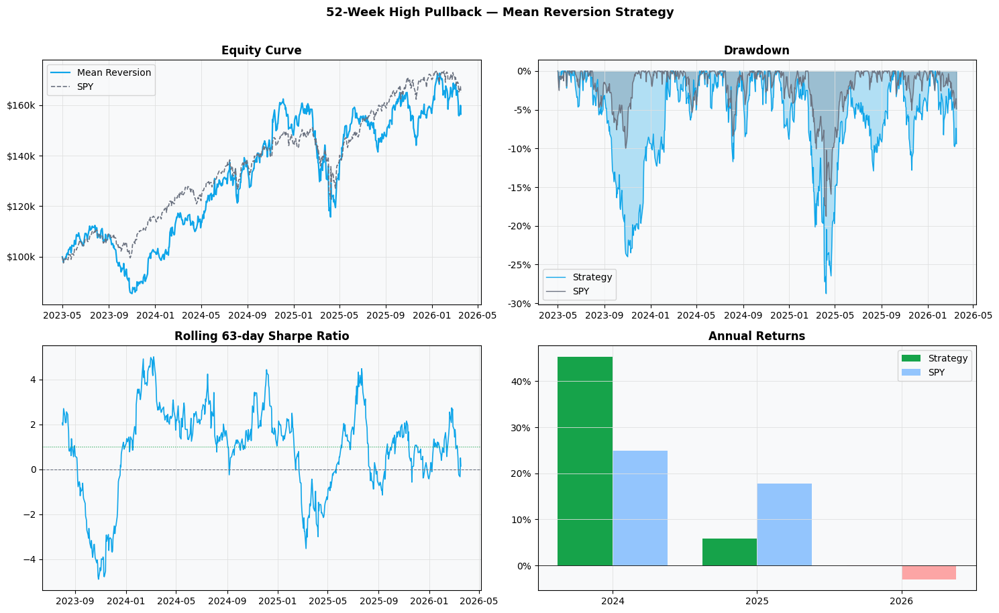

In [7]:
fig, axes = plt.subplots(2, 2, figsize=(15, 9))

# Panel 1: Equity curve
ax = axes[0, 0]
ax.plot(equity.index, equity["strategy"], label="Mean Reversion", color="#0ea5e9", linewidth=1.6)
ax.plot(equity.index, equity["spy"],      label="SPY",            color="#6b7280", linewidth=1.2, linestyle="--")
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"${x/1000:.0f}k"))
ax.set_title("Equity Curve", fontweight="bold")
ax.legend()

# Panel 2: Drawdown
ax = axes[0, 1]
for label, ser, color in [("Strategy", equity["strategy"], "#0ea5e9"), ("SPY", equity["spy"], "#6b7280")]:
    dd = (ser - ser.cummax()) / ser.cummax()
    ax.fill_between(dd.index, dd, 0, alpha=0.3, color=color)
    ax.plot(dd.index, dd, color=color, linewidth=1.0, label=label)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))
ax.set_title("Drawdown", fontweight="bold")
ax.legend()

# Panel 3: Rolling 63-day Sharpe
ax = axes[1, 0]
strat_rets = equity["strategy"].pct_change()
roll_sharpe = (strat_rets.rolling(63).mean() / strat_rets.rolling(63).std()) * np.sqrt(252)
ax.plot(roll_sharpe.index, roll_sharpe, color="#0ea5e9", linewidth=1.2)
ax.axhline(0, color="#6b7280", linewidth=0.8, linestyle="--")
ax.axhline(1, color="#16a34a", linewidth=0.8, linestyle=":")
ax.set_title("Rolling 63-day Sharpe Ratio", fontweight="bold")

# Panel 4: Annual returns bar chart
ax = axes[1, 1]
strat_annual = equity["strategy"].resample("YE").last().pct_change().dropna()
spy_annual   = equity["spy"].resample("YE").last().pct_change().dropna()
years = strat_annual.index.year.tolist()
x = np.arange(len(years))
w = 0.38
ax.bar(x - w/2, strat_annual.values, width=w, label="Strategy",
       color=["#16a34a" if v > 0 else "#dc2626" for v in strat_annual.values])
ax.bar(x + w/2, spy_annual.values, width=w, label="SPY",
       color=["#93c5fd" if v > 0 else "#fca5a5" for v in spy_annual.values])
ax.set_xticks(x)
ax.set_xticklabels(years)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))
ax.axhline(0, color="black", linewidth=0.6)
ax.set_title("Annual Returns", fontweight="bold")
ax.legend()

plt.suptitle("52-Week High Pullback — Mean Reversion Strategy", fontsize=13, fontweight="bold", y=1.01)
plt.tight_layout()
plt.show()

## 7. Sensitivity Analysis

Testing two dimensions simultaneously:
- **Pullback depth**: how far the stock must have dropped from its 52w high before we buy (10%, 15%, 20%, 25%, 30%)
- **Exit target**: how close to the 52w high we sell (3%, 5%, 8%)

In [8]:
pullback_levels = [0.10, 0.15, 0.20, 0.25, 0.30]
exit_levels     = [0.03, 0.05, 0.08]

sens_rows = []
for pb in pullback_levels:
    _, pb_matrix, em = compute_signals(closes, pullback_pct=pb)
    for ex in exit_levels:
        eq_s = backtest_mean_reversion(
            closes, em, high_52w, pb_matrix,
            exit_near_high=ex
        )
        m = perf_metrics(eq_s["strategy"], f"pb={pb:.0%} exit={ex:.0%}")
        m["Pullback"] = f"{pb:.0%}"
        m["Exit Within"] = f"{ex:.0%} of high"
        sens_rows.append(m)
        print(f"  pb={pb:.0%}  exit={ex:.0%}  →  CAGR {m['CAGR']}  Sharpe {m['Sharpe Ratio']}  MaxDD {m['Max Drawdown']}")

sens_df = pd.DataFrame(sens_rows).set_index("Label")
print("\n── Sensitivity table ────────────────────────────────────────────────")
print(sens_df[["Pullback", "Exit Within", "Total Return", "CAGR", "Sharpe Ratio", "Max Drawdown", "Calmar Ratio"]].to_string())

  pb=10%  exit=3%  →  CAGR 18.6%  Sharpe 0.82  MaxDD -32.6%
  pb=10%  exit=5%  →  CAGR 20.9%  Sharpe 0.90  MaxDD -30.3%
  pb=10%  exit=8%  →  CAGR 9.0%  Sharpe 0.48  MaxDD -33.7%


  pb=15%  exit=3%  →  CAGR 16.9%  Sharpe 0.76  MaxDD -28.7%
  pb=15%  exit=5%  →  CAGR 18.4%  Sharpe 0.82  MaxDD -31.7%
  pb=15%  exit=8%  →  CAGR 12.7%  Sharpe 0.62  MaxDD -32.1%


  pb=20%  exit=3%  →  CAGR 7.7%  Sharpe 0.43  MaxDD -37.3%
  pb=20%  exit=5%  →  CAGR 12.4%  Sharpe 0.60  MaxDD -32.6%
  pb=20%  exit=8%  →  CAGR 6.4%  Sharpe 0.38  MaxDD -34.0%


  pb=25%  exit=3%  →  CAGR 8.6%  Sharpe 0.48  MaxDD -28.5%
  pb=25%  exit=5%  →  CAGR 8.7%  Sharpe 0.48  MaxDD -29.6%
  pb=25%  exit=8%  →  CAGR 8.8%  Sharpe 0.48  MaxDD -29.3%


  pb=30%  exit=3%  →  CAGR 12.6%  Sharpe 0.74  MaxDD -23.1%
  pb=30%  exit=5%  →  CAGR 12.8%  Sharpe 0.76  MaxDD -23.1%
  pb=30%  exit=8%  →  CAGR 12.2%  Sharpe 0.73  MaxDD -24.6%

── Sensitivity table ────────────────────────────────────────────────
               Pullback Exit Within Total Return   CAGR Sharpe Ratio Max Drawdown Calmar Ratio
Label                                                                                         
pb=10% exit=3%      10%  3% of high        63.1%  18.6%         0.82       -32.6%         0.57
pb=10% exit=5%      10%  5% of high        72.2%  20.9%         0.90       -30.3%         0.69
pb=10% exit=8%      10%  8% of high        28.0%   9.0%         0.48       -33.7%         0.27
pb=15% exit=3%      15%  3% of high        56.4%  16.9%         0.76       -28.7%         0.59
pb=15% exit=5%      15%  5% of high        62.1%  18.4%         0.82       -31.7%         0.58
pb=15% exit=8%      15%  8% of high        41.0%  12.7%         0.62       -32.1%   

## 8. Sensitivity Heatmap — CAGR by Pullback × Exit Target

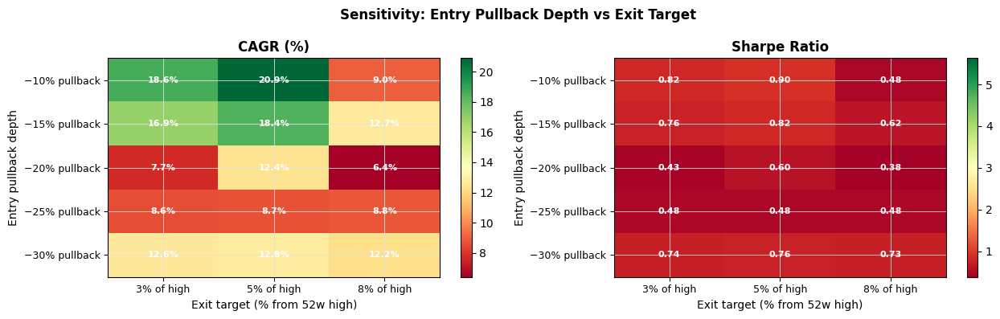

In [9]:
import matplotlib.colors as mcolors

# Build CAGR and Sharpe pivot tables
cagr_vals   = {}
sharpe_vals = {}
for row in sens_rows:
    pb  = row["Pullback"]
    ex  = row["Exit Within"]
    cagr_vals[(pb, ex)]   = float(row["CAGR"].rstrip("%"))
    sharpe_vals[(pb, ex)] = float(row["Sharpe Ratio"])

pb_labels  = [f"{pb:.0%}" for pb in pullback_levels]
ex_labels  = [f"{ex:.0%} of high" for ex in exit_levels]
cagr_grid   = np.array([[cagr_vals[(p, e)]   for e in ex_labels] for p in pb_labels])
sharpe_grid = np.array([[sharpe_vals[(p, e)] for e in ex_labels] for p in pb_labels])

fig, axes = plt.subplots(1, 2, figsize=(13, 4))

for ax, grid, title, fmt in [
    (axes[0], cagr_grid,   "CAGR (%)",    "{:.1f}%"),
    (axes[1], sharpe_grid, "Sharpe Ratio", "{:.2f}"),
]:
    im = ax.imshow(grid, cmap="RdYlGn", aspect="auto",
                   vmin=max(grid.min(), -5), vmax=max(grid.max(), grid.mean() + 5))
    ax.set_xticks(range(len(ex_labels)))
    ax.set_xticklabels(ex_labels, fontsize=9)
    ax.set_yticks(range(len(pb_labels)))
    ax.set_yticklabels([f"−{p} pullback" for p in pb_labels], fontsize=9)
    ax.set_xlabel("Exit target (% from 52w high)")
    ax.set_ylabel("Entry pullback depth")
    ax.set_title(title, fontweight="bold")
    plt.colorbar(im, ax=ax)
    for r in range(len(pb_labels)):
        for c in range(len(ex_labels)):
            ax.text(c, r, fmt.format(grid[r, c]),
                    ha="center", va="center", fontsize=8, fontweight="bold",
                    color="white" if abs(grid[r, c]) > grid.std() else "black")

plt.suptitle("Sensitivity: Entry Pullback Depth vs Exit Target", fontweight="bold")
plt.tight_layout()
plt.show()

## 9. Equity Curves — All Pullback Depths vs SPY

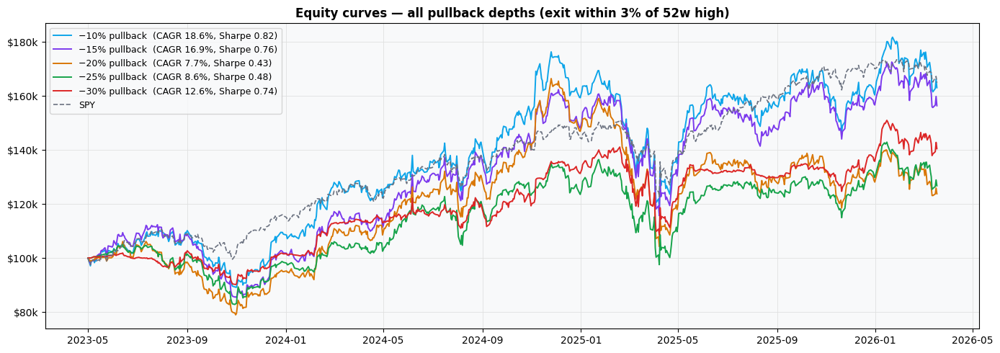

In [10]:
fig, ax = plt.subplots(figsize=(14, 5))

colors_pb = ["#0ea5e9", "#7c3aed", "#d97706", "#16a34a", "#dc2626"]

for pb, color in zip(pullback_levels, colors_pb):
    _, pb_matrix, em = compute_signals(closes, pullback_pct=pb)
    eq_s = backtest_mean_reversion(closes, em, high_52w, pb_matrix, exit_near_high=EXIT_NEAR_HIGH)
    m    = perf_metrics(eq_s["strategy"], "")
    ax.plot(eq_s.index, eq_s["strategy"],
            label=f"−{pb:.0%} pullback  (CAGR {m['CAGR']}, Sharpe {m['Sharpe Ratio']})",
            color=color, linewidth=1.4)

ax.plot(equity.index, equity["spy"], label="SPY", color="#6b7280", linewidth=1.2, linestyle="--")
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"${x/1000:.0f}k"))
ax.set_title("Equity curves — all pullback depths (exit within 3% of 52w high)", fontweight="bold")
ax.legend(fontsize=9)
plt.tight_layout()
plt.show()

## 10. Today's Live Signals

Stocks in the universe that are currently triggering the baseline entry signal (−15% from 52w high, was near high within 22 days).

In [11]:
last = closes.index[-1]
today_high = high_52w.iloc[-1]
today_close = closes.iloc[-1]
today_pb    = pullback.iloc[-1]
today_entry = entry_mask.iloc[-1]

live = pd.DataFrame({
    "Price":      today_close[today_entry],
    "52w High":   today_high[today_entry],
    "Pullback %": (today_pb[today_entry] * 100).round(1),
    "Target (exit)": (today_high[today_entry] * (1 - EXIT_NEAR_HIGH)).round(2),
    "Upside to target %": ((today_high[today_entry] * (1 - EXIT_NEAR_HIGH) / today_close[today_entry] - 1) * 100).round(1),
}).sort_values("Pullback %", ascending=False)

live = live.merge(universe_df[["Symbol", "Sector", "Industry"]].set_index("Symbol"),
                  left_index=True, right_index=True, how="left")

print(f"Live signals as of {last.date()} — {len(live)} stocks qualifying:")
print(live.head(30).to_string())

Live signals as of 2026-03-18 — 184 stocks qualifying:
           Price    52w High  Pullback %  Target (exit)  Upside to target %                  Sector                                        Industry
RUN    12.790000   21.410000        40.3          20.77                62.4             Industrials                               Building Products
MNRO   15.160000   23.516048        35.5          22.81                50.5  Consumer Discretionary                               Automotive Retail
THO    78.000000  120.339996        35.2         116.73                49.7  Consumer Discretionary                                Leisure Products
BLD   357.859985  550.900024        35.0         534.37                49.3  Consumer Discretionary                                    Homebuilding
ACMR   46.599998   70.680000        34.1          68.56                47.1  Information Technology             Semiconductor Materials & Equipment
KWR   120.500000  180.570007        33.3         175.15  

---

## V2+ Variants — What I'm testing next

### Clarification on exits
You are correct — "exit within 8% of high" means the stock only needs to reach 92% of its high, which is **easier and faster** to achieve than 3% (needing to reach 97%). The reason 8% still performed worse is that you're **cutting winners short**: stocks that bounce to 92% often keep running to 97–100%, and by exiting early you miss that final profitable leg. The 3% tight exit essentially lets the full recovery play out before you sell.

---

### Variant A — Distance Band: Buy at −20%, Sell at −10%, Stop at −30%  *(your idea)*
Instead of using the 52w high as both entry reference AND exit target, we use a **distance band**:
- Entry: stock is 20% below its 52w high
- Exit (target): stock has recovered back to only 10% below its 52w high (captured ~10% of the recovery)
- Stop-loss: if stock falls further to 30% below high, cut the loss

This is cleaner than the baseline because the exit is symmetric — you're defining a price band, not chasing the high itself.

---

### Variant B — Distance Band Sweep
Same concept as Variant A but sweeping across all combinations:
- Entry pullback: −15%, −20%, −25%
- Exit pullback (when to sell): −5%, −10%, −15% from high *(always tighter than entry)*
- Stop: always entry_depth + 15% (e.g. enter at −20% → stop at −35%)

This tells us whether the distance-band concept holds up across many param choices or only at one lucky combination.

---

### Variant C — Regime Filter (only enter when market is healthy)
The big −31% drawdown in 2024–2025 happened because the strategy kept buying pullbacks during a market-wide selloff — those stocks weren't "dipping", they were breaking down. Fix: **only enter new positions when SPY is above its 200-day SMA** (bull market mode). During bear markets, hold cash instead of catching falling knives. We keep open positions but stop adding new ones.

---

### Variant D — Regime + Tighter Band Combined
Best of both worlds: regime filter + the optimal distance-band from Variant B.

In [12]:
## Updated backtest engine — supports distance-band exits
# 
# New parameter: exit_pullback (float or None)
#   - None (default) → old behaviour: exit when price >= high * (1 - exit_near_high)
#   - float, e.g. 0.10 → exit when pullback from 52w high has recovered to <= exit_pullback
#     i.e. exit when current price >= high * (1 - exit_pullback)
#
# Also new: regime_filter (bool) — only enter when SPY > SPY 200d SMA

def _safe_px(prices, sym, fallback):
    """Return price for sym, or fallback if the price is missing/NaN."""
    v = prices.get(sym, fallback)
    return fallback if (v is None or (isinstance(v, float) and np.isnan(v))) else v

def backtest_v2(
    closes: pd.DataFrame,
    entry_mask: pd.DataFrame,
    high_52w: pd.DataFrame,
    pullback: pd.DataFrame,
    spy_close: pd.Series,
    initial_capital: float = INITIAL_CAPITAL,
    top_n: int = TOP_N,
    rebal_freq: int = REBAL_FREQ,
    # Exit A: original — price within X% of 52w high
    exit_near_high: float = EXIT_NEAR_HIGH,
    # Exit B: distance band — exit when pullback recovers to this level (e.g. 0.10 = stock is only 10% below high)
    exit_pullback: float = None,
    # Stop-loss: fraction below *52w high* (e.g. 0.30 → stop if stock falls 30% below its 52w high)
    stop_from_high: float = None,
    # Original stop: fraction below entry price
    stop_loss: float = STOP_LOSS,
    max_hold_days: int = MAX_HOLD_DAYS,
    tc: float = TRANSACTION_COST,
    regime_filter: bool = False,
) -> pd.DataFrame:

    dates = closes.index
    start_idx = HIGH_LOOKBACK + NEAR_HIGH_WINDOW + 5

    # Precompute regime (SPY above 200d SMA)
    if regime_filter:
        spy_sma200 = spy_close.rolling(200, min_periods=200).mean()
        in_bull = (spy_close > spy_sma200).reindex(closes.index).fillna(False)
    else:
        in_bull = pd.Series(True, index=closes.index)

    capital   = initial_capital
    positions = {}
    portfolio_values = []
    portfolio_dates  = []

    for i, date in enumerate(dates[start_idx:], start=start_idx):
        prices = closes.iloc[i]

        # ── Check exits ─────────────────────────────────────────────────
        to_exit = []
        for sym, pos in positions.items():
            px = _safe_px(prices, sym, np.nan)
            if np.isnan(px) or px <= 0:
                to_exit.append(sym); continue
            days_held = i - pos["entry_idx"]
            cur_high  = _safe_px(high_52w.iloc[i], sym, pos["ref_high"])
            cur_pb    = (cur_high - px) / cur_high if cur_high > 0 else 1

            hit_target  = False
            hit_stop    = False
            hit_time    = days_held >= max_hold_days

            if exit_pullback is not None:
                # Distance-band: exit when pullback has shrunk to <= exit_pullback
                hit_target = cur_pb <= exit_pullback
            else:
                # Original: exit when price >= high * (1 - exit_near_high)
                hit_target = px >= pos["target_price"]

            if stop_from_high is not None:
                # Stop relative to 52w high at entry
                hit_stop = cur_pb >= stop_from_high
            else:
                hit_stop = px <= pos["entry_price"] * (1 - stop_loss)

            if hit_target or hit_stop or hit_time:
                to_exit.append(sym)

        for sym in to_exit:
            pos = positions.pop(sym)
            px  = max(_safe_px(prices, sym, pos["entry_price"]), 0.01)
            capital += pos["shares"] * px * (1 - tc)

        # ── New entries on rebalance day (only in bull market) ───────────
        if (i - start_idx) % rebal_freq == 0 and in_bull.iloc[i]:
            slots_free = top_n - len(positions)
            if slots_free > 0:
                day_signals = entry_mask.iloc[i]
                candidates = (
                    pullback.iloc[i].where(day_signals).dropna()
                    .sort_values(ascending=False)
                )
                candidates = candidates[~candidates.index.isin(positions.keys())]
                port_val = capital + sum(
                    pos["shares"] * _safe_px(prices, sym, pos["entry_price"])
                    for sym, pos in positions.items()
                )
                if np.isnan(port_val):
                    port_val = capital
                per_position = port_val / top_n

                for sym in candidates.index[:slots_free]:
                    px = _safe_px(prices, sym, 0)
                    if not (px > 0): continue
                    shares = int((per_position * (1 - tc)) / px)
                    cost   = shares * px * (1 + tc)
                    if shares < 1 or cost > capital: continue
                    hi = _safe_px(high_52w.iloc[i], sym, px)
                    positions[sym] = {
                        "shares":       shares,
                        "entry_price":  px,
                        "entry_idx":    i,
                        "ref_high":     hi,
                        "target_price": hi * (1 - exit_near_high),
                    }
                    capital -= cost

        # ── Mark-to-market ───────────────────────────────────────────────
        port_val = capital + sum(
            pos["shares"] * max(_safe_px(prices, sym, pos["entry_price"]), 0)
            for sym, pos in positions.items()
        )
        portfolio_values.append(port_val)
        portfolio_dates.append(date)

    result = pd.DataFrame({"strategy": portfolio_values}, index=portfolio_dates)
    result["spy"] = (
        spy_close.reindex(portfolio_dates).ffill()
        / spy_close.reindex(portfolio_dates).ffill().iloc[0]
        * initial_capital
    )
    return result

print("Updated backtest engine (v2.1 — NaN-safe) ready.")


Updated backtest engine (v2.1 — NaN-safe) ready.


Variant A: Buy −20%, Sell at −10% from high, Stop at −30% from high


                                         Total Return   CAGR Sharpe Ratio Max Drawdown Calmar Ratio Win Rate
Label                                                                                                       
Variant A: Buy−20% → Sell−10% → Stop−30%       -10.4%  -3.8%        -0.16       -23.8%        -0.16    49.4%
SPY (benchmark)                                 65.0%  19.1%         1.23       -18.8%         1.02    56.9%


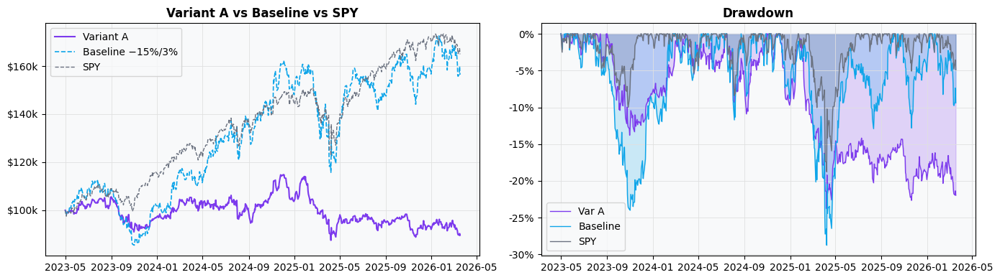

In [13]:
## ── Variant A: Your idea — Buy −20%, Sell −10%, Stop −30% ──────────────────
#
# Entry:  stock is 20% below 52w high
# Exit:   stock recovers back to only 10% below 52w high (captured ~12% gain from entry)
# Stop:   stock falls to 30% below 52w high from 52w high (not from entry)
#         at entry we're at -20%, so stop triggers if it drops another ~12.5%

_, pb_20, em_20 = compute_signals(closes, pullback_pct=0.20)

print("Variant A: Buy −20%, Sell at −10% from high, Stop at −30% from high")
eq_A = backtest_v2(
    closes, em_20, high_52w, pb_20, spy_close,
    exit_pullback=0.10,      # exit when stock is only 10% below its 52w high
    stop_from_high=0.30,     # stop when stock falls to 30% below 52w high
)
m_A = perf_metrics(eq_A["strategy"], "Variant A: Buy−20% → Sell−10% → Stop−30%")
m_spy = perf_metrics(eq_A["spy"], "SPY (benchmark)")

print(pd.DataFrame([m_A, m_spy]).set_index("Label").to_string())

# Quick equity chart
fig, axes = plt.subplots(1, 2, figsize=(14, 4))
ax = axes[0]
ax.plot(eq_A.index, eq_A["strategy"], label="Variant A", color="#7c3aed", linewidth=1.5)
ax.plot(equity.index, equity["strategy"], label="Baseline −15%/3%", color="#0ea5e9", linewidth=1.2, linestyle="--")
ax.plot(eq_A.index, eq_A["spy"], label="SPY", color="#6b7280", linewidth=1.0, linestyle="--")
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"${x/1000:.0f}k"))
ax.set_title("Variant A vs Baseline vs SPY", fontweight="bold")
ax.legend()

ax = axes[1]
for lbl, ser, col in [("Var A", eq_A["strategy"], "#7c3aed"), ("Baseline", equity["strategy"], "#0ea5e9"), ("SPY", eq_A["spy"], "#6b7280")]:
    dd = (ser - ser.cummax()) / ser.cummax()
    ax.fill_between(dd.index, dd, 0, alpha=0.2, color=col)
    ax.plot(dd.index, dd, color=col, linewidth=1.0, label=lbl)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))
ax.set_title("Drawdown", fontweight="bold")
ax.legend()
plt.tight_layout()
plt.show()


  Entry 15% → Exit 5% → Stop 30%  |  CAGR 6.0%  Sharpe 0.40  MaxDD -28.1%


  Entry 15% → Exit 10% → Stop 30%  |  CAGR 1.2%  Sharpe 0.16  MaxDD -30.2%


  Entry 20% → Exit 5% → Stop 35%  |  CAGR 3.9%  Sharpe 0.29  MaxDD -28.9%


  Entry 20% → Exit 10% → Stop 35%  |  CAGR 0.1%  Sharpe 0.10  MaxDD -30.6%
  Entry 20% → Exit 15% → Stop 35%  |  CAGR 0.2%  Sharpe 0.10  MaxDD -30.7%


  Entry 25% → Exit 5% → Stop 40%  |  CAGR 5.1%  Sharpe 0.37  MaxDD -25.0%


  Entry 25% → Exit 10% → Stop 40%  |  CAGR 1.7%  Sharpe 0.19  MaxDD -26.7%
  Entry 25% → Exit 15% → Stop 40%  |  CAGR 8.7%  Sharpe 0.61  MaxDD -24.3%

── Distance-band sweep ──────────────────────────────────────────────
                                 Entry depth     Exit target            Stop Total Return  CAGR Sharpe Ratio Max Drawdown Calmar Ratio
Label                                                                                                                                 
Entry−15% → Exit−5% (stop −30%)         −15%   −5% from high  −30% from high        18.0%  6.0%         0.40       -28.1%         0.21
Entry−15% → Exit−10% (stop −30%)        −15%  −10% from high  −30% from high         3.6%  1.2%         0.16       -30.2%         0.04
Entry−20% → Exit−5% (stop −35%)         −20%   −5% from high  −35% from high        11.6%  3.9%         0.29       -28.9%         0.13
Entry−20% → Exit−10% (stop −35%)        −20%  −10% from high  −35% from high         0.4%  0.1%         

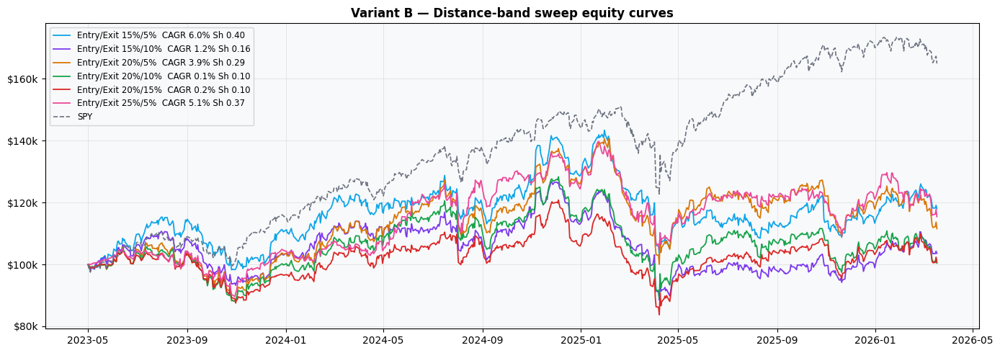

In [14]:
## ── Variant B: Distance-Band Sweep ─────────────────────────────────────────
#
# Entry pullbacks:  15%, 20%, 25%
# Exit targets:      5%, 10%, 15% from high  (always shallower than entry)
# Stop: entry_depth + 15pp  (e.g. buy at -20% → stop at -35%)

entry_depths = [0.15, 0.20, 0.25]
exit_targets = [0.05, 0.10, 0.15]

band_rows = []
equities_B = {}

for entry_d in entry_depths:
    _, pb_mat, em_mat = compute_signals(closes, pullback_pct=entry_d)
    for exit_t in exit_targets:
        if exit_t >= entry_d:
            continue  # exit must be shallower (less below high) than entry
        stop_d = entry_d + 0.15  # stop = entry depth + 15pp
        eq_b = backtest_v2(
            closes, em_mat, high_52w, pb_mat, spy_close,
            exit_pullback=exit_t,
            stop_from_high=stop_d,
        )
        m = perf_metrics(eq_b["strategy"],
                         f"Entry−{entry_d:.0%} → Exit−{exit_t:.0%} (stop −{stop_d:.0%})")
        m["Entry depth"] = f"−{entry_d:.0%}"
        m["Exit target"] = f"−{exit_t:.0%} from high"
        m["Stop"]        = f"−{stop_d:.0%} from high"
        band_rows.append(m)
        equities_B[f"{entry_d:.0%}/{exit_t:.0%}"] = eq_b
        print(f"  Entry {entry_d:.0%} → Exit {exit_t:.0%} → Stop {stop_d:.0%}  |  "
              f"CAGR {m['CAGR']}  Sharpe {m['Sharpe Ratio']}  MaxDD {m['Max Drawdown']}")

band_df = pd.DataFrame(band_rows).set_index("Label")
print("\n── Distance-band sweep ──────────────────────────────────────────────")
print(band_df[["Entry depth", "Exit target", "Stop", "Total Return", "CAGR", "Sharpe Ratio", "Max Drawdown", "Calmar Ratio"]].to_string())

# Chart: all distance-band equity curves
fig, ax = plt.subplots(figsize=(14, 5))
palette = ["#0ea5e9", "#7c3aed", "#d97706", "#16a34a", "#dc2626", "#ec4899"]
for (key, eq_b), color in zip(equities_B.items(), palette):
    m_ = perf_metrics(eq_b["strategy"], "")
    ax.plot(eq_b.index, eq_b["strategy"],
            label=f"Entry/Exit {key}  CAGR {m_['CAGR']} Sh {m_['Sharpe Ratio']}",
            color=color, linewidth=1.3)
ax.plot(equity.index, equity["spy"], label="SPY", color="#6b7280", linestyle="--", linewidth=1.2)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"${x/1000:.0f}k"))
ax.set_title("Variant B — Distance-band sweep equity curves", fontweight="bold")
ax.legend(fontsize=8.5)
plt.tight_layout()
plt.show()


Variant C: Baseline + regime filter (no new entries when SPY < 200d SMA)


SPY above 200d SMA: 74.5% of the backtest period

                                        Total Return   CAGR Sharpe Ratio Max Drawdown Calmar Ratio Win Rate
Label                                                                                                      
Mean Reversion −15% pullback (baseline)        56.4%  16.9%         0.76       -28.7%         0.59    52.9%
Variant C: Baseline + Regime Filter            57.3%  17.1%         0.80       -28.6%         0.60    54.7%
SPY (benchmark)                                65.0%  19.1%         1.23       -18.8%         1.02    56.9%


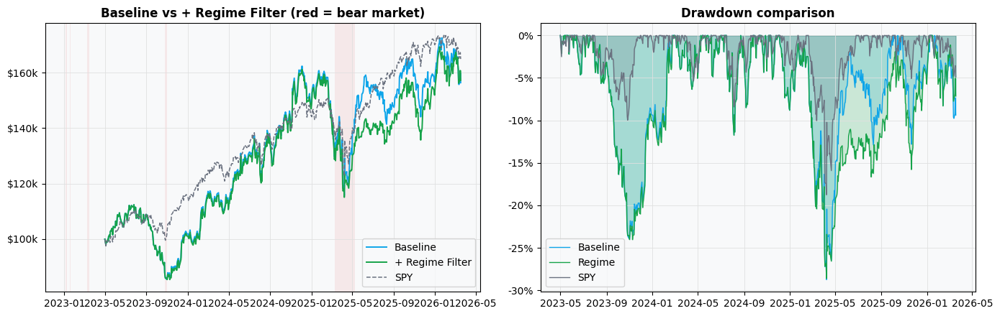

In [15]:
## ── Variant C: Regime Filter (stop adding positions in bear markets) ────────
#
# Same as baseline (−15% pullback, exit within 3% of high)
# but NO new entries when SPY < its 200d SMA.
# Existing positions still run to their exits/stops — we just don't add new ones.

print("Variant C: Baseline + regime filter (no new entries when SPY < 200d SMA)")
eq_C = backtest_v2(
    closes, entry_mask, high_52w, pullback, spy_close,
    exit_near_high=0.03,
    stop_loss=0.35,
    regime_filter=True,
)
m_C = perf_metrics(eq_C["strategy"], "Variant C: Baseline + Regime Filter")

# Check regime: how often are we in "invest" mode?
spy_sma200 = spy_close.rolling(200, min_periods=200).mean()
bull_pct = (spy_close > spy_sma200).mean() * 100
print(f"SPY above 200d SMA: {bull_pct:.1f}% of the backtest period")
print()
print(pd.DataFrame([m_baseline, m_C, m_spy]).set_index("Label").to_string())

# Chart
fig, axes = plt.subplots(1, 2, figsize=(14, 4.5))
ax = axes[0]
ax.plot(equity.index,  equity["strategy"], label="Baseline",        color="#0ea5e9", linewidth=1.4)
ax.plot(eq_C.index,    eq_C["strategy"],   label="+ Regime Filter", color="#16a34a", linewidth=1.4)
ax.plot(equity.index,  equity["spy"],      label="SPY",             color="#6b7280", linestyle="--", linewidth=1.1)
# Shade bear-market periods (regime off) in light red
bear_dates = spy_close.index[(spy_close <= spy_sma200) & spy_close.notna() & spy_sma200.notna()]
for i_d in range(len(bear_dates) - 1):
    if (bear_dates[i_d + 1] - bear_dates[i_d]).days <= 5:
        ax.axvspan(bear_dates[i_d], bear_dates[i_d + 1], alpha=0.08, color="#dc2626", linewidth=0)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"${x/1000:.0f}k"))
ax.set_title("Baseline vs + Regime Filter (red = bear market)", fontweight="bold")
ax.legend()

ax = axes[1]
for lbl, ser, col in [("Baseline", equity["strategy"], "#0ea5e9"), ("Regime", eq_C["strategy"], "#16a34a"), ("SPY", equity["spy"], "#6b7280")]:
    dd = (ser - ser.cummax()) / ser.cummax()
    ax.fill_between(dd.index, dd, 0, alpha=0.2, color=col)
    ax.plot(dd.index, dd, color=col, linewidth=1.0, label=lbl)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))
ax.set_title("Drawdown comparison", fontweight="bold")
ax.legend()
plt.tight_layout()
plt.show()


Variant D: Entry−15% → Exit−5% + Regime Filter + Stop −30%



════════════════════════════════════════════════════════════════════════════════
GRAND COMPARISON — ALL VARIANTS
════════════════════════════════════════════════════════════════════════════════
                                        Total Return   CAGR Sharpe Ratio Max Drawdown Calmar Ratio Win Rate
Label                                                                                                      
Mean Reversion −15% pullback (baseline)        56.4%  16.9%         0.76       -28.7%         0.59    52.9%
Var A: −20%→−10% stop−30%                     -10.4%  -3.8%        -0.16       -23.8%        -0.16    49.4%
Best Band (25%/15%)                            26.8%   8.7%         0.61       -24.3%         0.36    53.0%
Variant C: Baseline + Regime Filter            57.3%  17.1%         0.80       -28.6%         0.60    54.7%
Variant D: −15%→−5% + Regime Filter            18.7%   6.2%         0.43       -24.7%         0.25    53.0%
SPY (benchmark)                                65

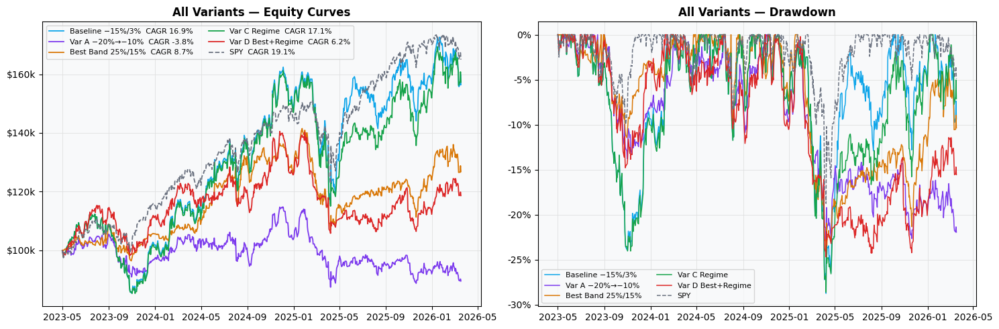

In [16]:
## ── Variant D: Best Distance-Band + Regime Filter ──────────────────────────
#
# Take the best setup from Variant B and add the regime filter on top.
# We'll use Entry −15%, Exit −5% from high (strong recovery), Stop −30%
# plus only enter during bull markets.

print("Variant D: Entry−15% → Exit−5% + Regime Filter + Stop −30%")
_, pb_15_D, em_15_D = compute_signals(closes, pullback_pct=0.15)
eq_D = backtest_v2(
    closes, em_15_D, high_52w, pb_15_D, spy_close,
    exit_pullback=0.05,    # exit when stock has recovered to within 5% of its high
    stop_from_high=0.30,   # stop if stock falls 30% from 52w high
    regime_filter=True,
)
m_D = perf_metrics(eq_D["strategy"], "Variant D: −15%→−5% + Regime Filter")

# ── Grand final comparison table ────────────────────────────────────────────
# Pick best from band sweep too
best_band_key = max(equities_B.items(), key=lambda kv: float(perf_metrics(kv[1]["strategy"], "")["Sharpe Ratio"].replace("nan","0")))[0]
eq_best_band  = equities_B[best_band_key]
m_best_band   = perf_metrics(eq_best_band["strategy"], f"Best Band ({best_band_key})")
m_var_A       = perf_metrics(eq_A["strategy"], "Var A: −20%→−10% stop−30%")

all_results = pd.DataFrame([
    m_baseline,
    m_var_A,
    m_best_band,
    m_C,
    m_D,
    m_spy,
]).set_index("Label")

print("\n" + "═" * 80)
print("GRAND COMPARISON — ALL VARIANTS")
print("═" * 80)
print(all_results.to_string())

# ── Final equity chart ───────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
plot_items = [
    ("Baseline −15%/3%",       equity["strategy"],        "#0ea5e9", "-"),
    ("Var A −20%→−10%",        eq_A["strategy"],           "#7c3aed", "-"),
    (f"Best Band {best_band_key}", eq_best_band["strategy"], "#d97706", "-"),
    ("Var C Regime",            eq_C["strategy"],           "#16a34a", "-"),
    ("Var D Best+Regime",       eq_D["strategy"],           "#dc2626", "-"),
    ("SPY",                     equity["spy"],              "#6b7280", "--"),
]
ax = axes[0]
for lbl, ser, col, ls in plot_items:
    m_ = perf_metrics(ser, "")
    ax.plot(ser.index, ser, label=f"{lbl}  CAGR {m_['CAGR']}", color=col, linestyle=ls, linewidth=1.3)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"${x/1000:.0f}k"))
ax.set_title("All Variants — Equity Curves", fontweight="bold")
ax.legend(fontsize=8, ncol=2)

ax = axes[1]
for lbl, ser, col, ls in plot_items:
    dd = (ser - ser.cummax()) / ser.cummax()
    ax.plot(dd.index, dd, color=col, linestyle=ls, linewidth=1.1, label=lbl)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))
ax.set_title("All Variants — Drawdown", fontweight="bold")
ax.legend(fontsize=8, ncol=2)
plt.tight_layout()
plt.show()


## Deep Distress Strategy — 50% down from 52w High

**New framing (user request):** Instead of buying stocks that dipped ~15% below their 52-week high, buy only deeply distressed stocks that have fallen **≥ 50% from their 52-week high**.

Exit targets (distance still remaining to 52w high):

| Exit level | Meaning |
|---|---|
| 30% | Stock recovered from −50% to within 30% of high |
| 25% | Recovered to within 25% of high |
| 20% | Recovered to within 20% of high |
| 15% | Recovered to within 15% of high |
| 10% | Recovered to within 10% of high |

Then a full **entry depth × exit target** grid sweep to find the best combo.

Avg daily entry candidates (≥50% below high): 0.0
Total unique tickers ever triggered:           6



=== Deep Distress (−50% entry) — Exit Sweep ===
                    Total Return  CAGR Sharpe Ratio Max Drawdown Calmar Ratio Win Rate
Label                                                                                 
exit ≤30% from high         5.6%  1.9%         0.53        -5.4%         0.36    11.8%
exit ≤25%                   6.0%  2.1%         0.57        -5.4%         0.39    11.8%
exit ≤20%                   6.6%  2.3%         0.61        -5.4%         0.42    11.9%
exit ≤15%                   5.9%  2.0%         0.55        -5.4%         0.38    11.9%
exit ≤10%                   5.9%  2.0%         0.55        -5.4%         0.38    11.9%


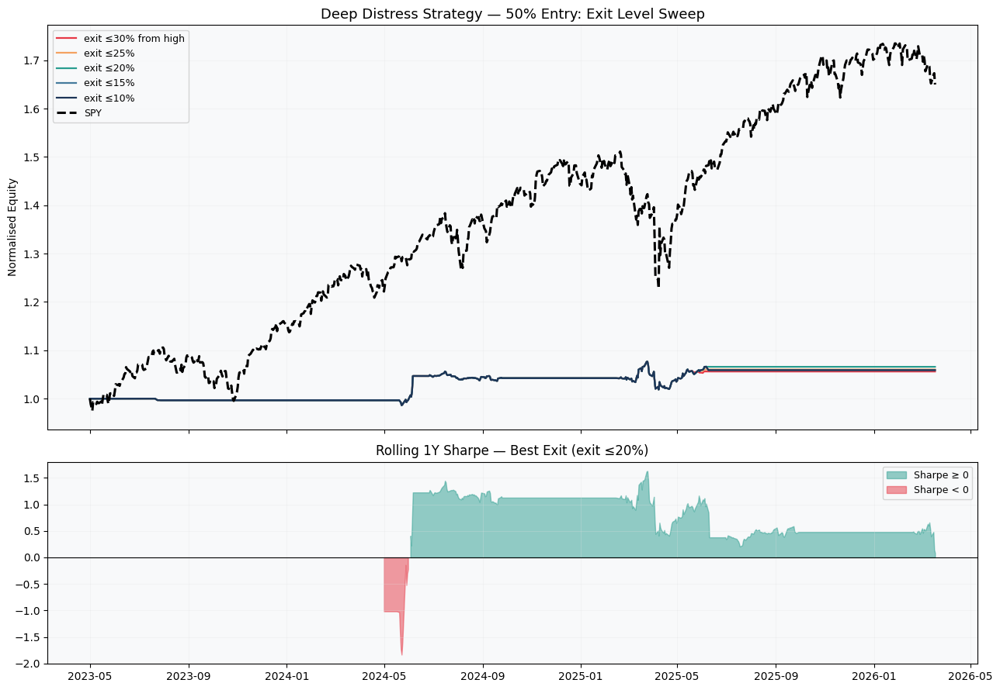

In [17]:
# ── Deep distress entry: stock ≥50% below 52w high ─────────────────────────
_, _, entry_mask_50 = compute_signals(
    closes,
    high_lookback=HIGH_LOOKBACK,
    near_high_pct=NEAR_HIGH_PCT,
    near_high_window=NEAR_HIGH_WINDOW,
    pullback_pct=0.50,          # new: must be 50%+ below 52w high
)

print(f"Avg daily entry candidates (≥50% below high): {entry_mask_50.sum(axis=1).mean():.1f}")
print(f"Total unique tickers ever triggered:           {entry_mask_50.any().sum()}")

# ── Sweep exit targets ────────────────────────────────────────────────────────
exit_sweep = [0.30, 0.25, 0.20, 0.15, 0.10]
exit_labels = ["exit ≤30% from high", "exit ≤25%", "exit ≤20%", "exit ≤15%", "exit ≤10%"]

deep_rows = []
equities_deep = {}
for et, lbl in zip(exit_sweep, exit_labels):
    eq = backtest_v2(
        closes, entry_mask_50, high_52w, pullback,
        spy_close,
        exit_pullback=et,
        stop_from_high=0.65,   # stop if stock falls to 65% below its 52w high
        stop_loss=0.35,
        regime_filter=False,
    )
    m = perf_metrics(eq["strategy"], lbl)
    deep_rows.append(m)
    equities_deep[lbl] = eq["strategy"]

deep_df = pd.DataFrame(deep_rows).set_index("Label")
print("\n=== Deep Distress (−50% entry) — Exit Sweep ===")
print(deep_df.to_string())

# ── Plot equity curves ────────────────────────────────────────────────────────
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(13, 9), sharex=True,
                                gridspec_kw={"height_ratios": [2, 1]})
palette_deep = ["#e63946", "#f4a261", "#2a9d8f", "#457b9d", "#1d3557"]
for (lbl, eq_s), col in zip(equities_deep.items(), palette_deep):
    norm = eq_s / eq_s.iloc[0]
    ax1.plot(norm.index, norm, label=lbl, color=col, lw=1.6)
spy_norm = spy_close.reindex(eq_s.index).ffill()
spy_norm = spy_norm / spy_norm.iloc[0]
ax1.plot(spy_norm.index, spy_norm, label="SPY", color="black", lw=2.2, ls="--")
ax1.set_title("Deep Distress Strategy — 50% Entry: Exit Level Sweep", fontsize=13)
ax1.set_ylabel("Normalised Equity"); ax1.legend(fontsize=9); ax1.grid(alpha=0.3)

# Rolling 252-day Sharpe of best exit level
best_lbl = deep_df["CAGR"].idxmax()
best_eq = equities_deep[best_lbl]
rets = best_eq.pct_change().dropna()
roll_sh = rets.rolling(252).mean() / rets.rolling(252).std() * np.sqrt(252)
ax2.fill_between(roll_sh.index, roll_sh, 0,
                 where=roll_sh >= 0, color="#2a9d8f", alpha=0.5, label="Sharpe ≥ 0")
ax2.fill_between(roll_sh.index, roll_sh, 0,
                 where=roll_sh < 0,  color="#e63946", alpha=0.5, label="Sharpe < 0")
ax2.axhline(0, color="black", lw=0.8)
ax2.set_title(f"Rolling 1Y Sharpe — Best Exit ({best_lbl})")
ax2.legend(fontsize=9); ax2.grid(alpha=0.3)
plt.tight_layout()
plt.show()


In [18]:
# ── Diagnose: pullback distribution in our backtest window ──────────────────
flat_pb = pullback.values.flatten()
flat_pb = flat_pb[~np.isnan(flat_pb)]

print("Pullback distribution (distance below 52w high):")
for pct in [0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.40, 0.45, 0.50]:
    n_days = (pullback >= pct).sum(axis=1).mean()
    n_tickers = int((pullback >= pct).any().sum())
    print(f"  >= {pct:.0%} below high: {n_days:.1f} avg stocks/day  |  {n_tickers} unique tickers ever")

print(f"\nMax pullback in dataset:  {flat_pb.max():.1%}")
print(f"99th percentile:          {np.percentile(flat_pb, 99):.1%}")
print(f"95th percentile:          {np.percentile(flat_pb, 95):.1%}")
start_date = pullback.dropna(how='all').index[0].date()
end_date = pullback.index[-1].date()
print(f"Backtest window:          {start_date}  →  {end_date}")


Pullback distribution (distance below 52w high):
  >= 10% below high: 581.0 avg stocks/day  |  1384 unique tickers ever
  >= 15% below high: 433.3 avg stocks/day  |  1377 unique tickers ever
  >= 20% below high: 315.3 avg stocks/day  |  1327 unique tickers ever
  >= 25% below high: 226.6 avg stocks/day  |  1213 unique tickers ever
  >= 30% below high: 158.5 avg stocks/day  |  1067 unique tickers ever
  >= 35% below high: 108.9 avg stocks/day  |  890 unique tickers ever
  >= 40% below high: 73.4 avg stocks/day  |  707 unique tickers ever
  >= 45% below high: 48.3 avg stocks/day  |  545 unique tickers ever
  >= 50% below high: 31.4 avg stocks/day  |  400 unique tickers ever

Max pullback in dataset:  94.7%
99th percentile:          60.1%
95th percentile:          44.3%
Backtest window:          2023-03-21  →  2026-03-18


Avg daily candidates: 31.4  |  Unique tickers: 400



=== Deep Distress (entry ≥50% below 52w high) — Exit Sweep ===
          Total Return   CAGR Sharpe Ratio Max Drawdown Calmar Ratio Win Rate
Label                                                                        
exit ≤30%        79.1%  22.6%         0.88       -27.3%         0.83    51.1%
exit ≤25%        84.3%  23.8%         0.92       -25.5%         0.93    49.7%
exit ≤20%        57.8%  17.3%         0.73       -26.3%         0.66    50.0%
exit ≤15%        73.5%  21.2%         0.85       -24.2%         0.88    49.9%
exit ≤10%        85.1%  24.0%         0.94       -23.7%         1.01    50.8%


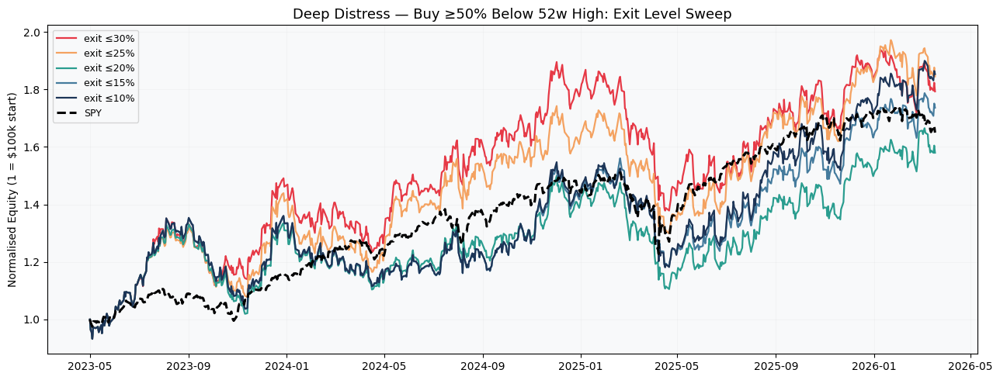

In [19]:
# ── Deep distress sweep: entry ≥50% below 52w high (raw pullback, no extra filter) ──
entry_mask_50 = (pullback >= 0.50)
print(f"Avg daily candidates: {entry_mask_50.sum(axis=1).mean():.1f}  |  Unique tickers: {int(entry_mask_50.any().sum())}")

exit_sweep  = [0.30, 0.25, 0.20, 0.15, 0.10]
exit_labels = ["exit ≤30%", "exit ≤25%", "exit ≤20%", "exit ≤15%", "exit ≤10%"]

deep_rows     = []
equities_deep = {}
for et, lbl in zip(exit_sweep, exit_labels):
    eq = backtest_v2(
        closes, entry_mask_50, high_52w, pullback, spy_close,
        exit_pullback=et,
        stop_from_high=0.70,
        stop_loss=0.35,
        regime_filter=False,
    )
    m = perf_metrics(eq["strategy"], lbl)
    deep_rows.append(m)
    equities_deep[lbl] = eq["strategy"]

deep_df = pd.DataFrame(deep_rows).set_index("Label")
print("\n=== Deep Distress (entry ≥50% below 52w high) — Exit Sweep ===")
print(deep_df.to_string())

fig, ax = plt.subplots(figsize=(13, 5))
palette_deep = ["#e63946", "#f4a261", "#2a9d8f", "#457b9d", "#1d3557"]
for (lbl, eq_s), col in zip(equities_deep.items(), palette_deep):
    norm = eq_s / eq_s.iloc[0]
    ax.plot(norm.index, norm, label=lbl, color=col, lw=1.6)
spy_norm = spy_close.reindex(eq_s.index).ffill()
ax.plot(spy_norm.index, spy_norm / spy_norm.iloc[0], label="SPY", color="black", lw=2.2, ls="--")
ax.set_title("Deep Distress — Buy ≥50% Below 52w High: Exit Level Sweep", fontsize=13)
ax.set_ylabel("Normalised Equity (1 = $100k start)")
ax.legend(fontsize=9); ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()


=== CAGR Grid (%) ===
              Sell ≤30% down Sell ≤25% down Sell ≤20% down Sell ≤15% down Sell ≤10% down Sell ≤5% down
Buy ≥25% down              —              —          -9.6%          -9.9%          -9.9%         -9.5%
Buy ≥30% down              —          -8.7%          -9.0%          -9.2%          -9.0%         -8.7%
Buy ≥40% down          -2.9%          -4.8%          -5.8%          -7.7%          -7.7%         -7.9%
Buy ≥50% down          22.6%          23.8%          17.3%          21.2%          24.0%         25.3%
Buy ≥60% down          50.2%          53.3%          49.2%          47.8%          48.4%         49.3%

=== Sharpe Grid ===
              Sell ≤30% down Sell ≤25% down Sell ≤20% down Sell ≤15% down Sell ≤10% down Sell ≤5% down
Buy ≥25% down              —              —          -0.67          -0.70          -0.70         -0.65
Buy ≥30% down              —          -0.59          -0.61          -0.62          -0.61         -0.58
Buy ≥40% down          -0.06  

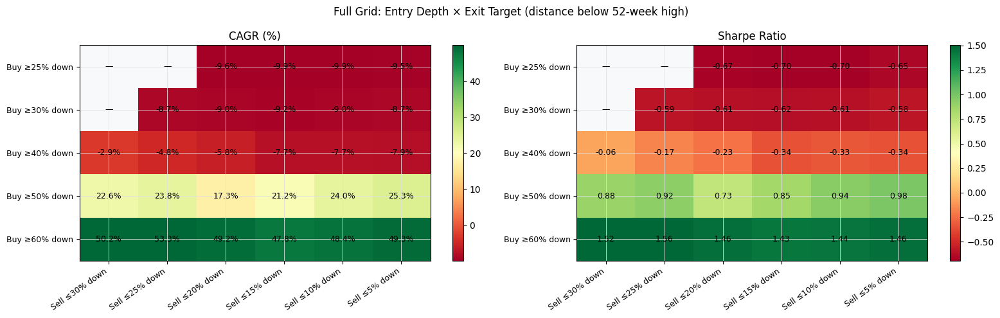

In [20]:
# ── Full combo sweep: entry depth × exit distance (all using raw pullback mask) ──
entry_depths_full = [0.25, 0.30, 0.40, 0.50, 0.60]
exit_targets_full  = [0.30, 0.25, 0.20, 0.15, 0.10, 0.05]

combo_cagr   = np.full((len(entry_depths_full), len(exit_targets_full)), np.nan)
combo_sharpe = np.full((len(entry_depths_full), len(exit_targets_full)), np.nan)
combo_dd     = np.full((len(entry_depths_full), len(exit_targets_full)), np.nan)

for r, ed in enumerate(entry_depths_full):
    em_combo = (pullback >= ed)
    for c, et in enumerate(exit_targets_full):
        if et >= ed:
            continue      # exit level must be less than entry depth
        eq_c = backtest_v2(
            closes, em_combo, high_52w, pullback, spy_close,
            exit_pullback=et,
            stop_from_high=min(ed + 0.20, 0.80),  # stop = entry+20pp below high
            stop_loss=0.35,
            regime_filter=False,
        )
        m_c = perf_metrics(eq_c["strategy"], f"{ed:.0%}/{et:.0%}")
        combo_cagr[r, c]   = m_c["CAGR"].rstrip("%")  if isinstance(m_c["CAGR"], str) else float(str(m_c["CAGR"]).rstrip("%"))
        combo_sharpe[r, c] = float(m_c["Sharpe Ratio"])
        combo_dd[r, c]     = float(str(m_c["Max Drawdown"]).rstrip("%"))

# Convert string percentages that perf_metrics returns
import re
def _pct(v):
    if isinstance(v, str):
        return float(v.rstrip("%"))
    return float(v)

combo_cagr_f   = np.full_like(combo_cagr, np.nan)
combo_sharpe_f = np.full_like(combo_sharpe, np.nan)
combo_dd_f     = np.full_like(combo_dd, np.nan)

for r, ed in enumerate(entry_depths_full):
    em_combo = (pullback >= ed)
    for c, et in enumerate(exit_targets_full):
        if et >= ed:
            continue
        eq_c = backtest_v2(
            closes, em_combo, high_52w, pullback, spy_close,
            exit_pullback=et,
            stop_from_high=min(ed + 0.20, 0.80),
            stop_loss=0.35,
            regime_filter=False,
        )
        m_c = perf_metrics(eq_c["strategy"], f"{ed:.0%}/{et:.0%}")
        combo_cagr_f[r, c]   = _pct(m_c["CAGR"])
        combo_sharpe_f[r, c] = float(m_c["Sharpe Ratio"])
        combo_dd_f[r, c]     = _pct(m_c["Max Drawdown"])

row_labels = [f"Buy ≥{d:.0%} down" for d in entry_depths_full]
col_labels  = [f"Sell ≤{t:.0%} down" for t in exit_targets_full]

print("=== CAGR Grid (%) ===")
df_cagr = pd.DataFrame(combo_cagr_f, index=row_labels, columns=col_labels)
print(df_cagr.applymap(lambda x: f"{x:.1f}%" if not np.isnan(x) else "—").to_string())

print("\n=== Sharpe Grid ===")
df_sh = pd.DataFrame(combo_sharpe_f, index=row_labels, columns=col_labels)
print(df_sh.applymap(lambda x: f"{x:.2f}" if not np.isnan(x) else "—").to_string())

print("\n=== Max Drawdown Grid (%) ===")
df_dd = pd.DataFrame(combo_dd_f, index=row_labels, columns=col_labels)
print(df_dd.applymap(lambda x: f"{x:.1f}%" if not np.isnan(x) else "—").to_string())

flat_cagr = [(entry_depths_full[r], exit_targets_full[c], combo_cagr_f[r, c])
             for r in range(len(entry_depths_full))
             for c in range(len(exit_targets_full))
             if not np.isnan(combo_cagr_f[r, c])]
best_ed, best_et, best_cagr = max(flat_cagr, key=lambda x: x[2])
print(f"\n>>> BEST COMBO: Buy ≥{best_ed:.0%} below 52w high  |  Sell ≤{best_et:.0%} below high  |  CAGR {best_cagr:.1f}%")

# ── Heatmaps ─────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
for ax_h, data, title in [
    (axes[0], combo_cagr_f,   "CAGR (%)"),
    (axes[1], combo_sharpe_f, "Sharpe Ratio"),
]:
    valid_vals = data[~np.isnan(data)]
    im = ax_h.imshow(data, cmap="RdYlGn", aspect="auto",
                     vmin=np.percentile(valid_vals, 5) if len(valid_vals) else 0,
                     vmax=np.percentile(valid_vals, 95) if len(valid_vals) else 1)
    ax_h.set_xticks(range(len(col_labels))); ax_h.set_xticklabels(col_labels, rotation=35, ha="right", fontsize=9)
    ax_h.set_yticks(range(len(row_labels))); ax_h.set_yticklabels(row_labels, fontsize=9)
    ax_h.set_title(title)
    fmt = "%.1f%%" if "CAGR" in title else "%.2f"
    for r2 in range(len(entry_depths_full)):
        for c2 in range(len(exit_targets_full)):
            val = data[r2, c2]
            txt = (fmt % val) if not np.isnan(val) else "—"
            ax_h.text(c2, r2, txt, ha="center", va="center", fontsize=9, color="black")
    plt.colorbar(im, ax=ax_h)

plt.suptitle("Full Grid: Entry Depth × Exit Target (distance below 52-week high)", fontsize=12)
plt.tight_layout()
plt.show()


---
## Long-Term Backtest (2011–2026) — 50% & 60% Entry Depth

Re-downloading ~15 years of data for the full universe, then testing:
- **Entry**: ≥50% and ≥60% below 52-week high
- **Exit**: stock recovers to within 30 / 25 / 20 / 15 / 10% of its 52-week high (5 levels)
- **Annual breakdown**: return, Sharpe, max drawdown per year vs SPY
- **CAGR comparison plot** across all combos
- **Average hold time**: how many days did trades typically last?

In [21]:
# ── Download 15-year data (2011–present) ─────────────────────────────────────
print("Downloading 15y data for full universe (~1,400 tickers). Takes a few minutes…")

raw_lt = yf.download(
    download_tickers,          # same ticker list as before
    start="2010-01-01",        # start 2010 to allow the 252-day warmup
    end="2026-03-11",
    group_by="ticker",
    progress=True,
    threads=True,
    auto_adjust=True,
)

MIN_BARS_LT = HIGH_LOOKBACK * 2   # need at least 2 years to be included

close_dict_lt = {t: extract_close(raw_lt, t) for t in download_tickers}
valid_lt  = [t for t in ALL_TICKERS if len(close_dict_lt.get(t, [])) >= MIN_BARS_LT]

closes_lt  = pd.DataFrame({t: close_dict_lt[t] for t in valid_lt}).sort_index()
spy_lt     = close_dict_lt["SPY"].reindex(closes_lt.index).ffill()

print(f"\nValid tickers: {len(valid_lt)}")
print(f"Price matrix : {closes_lt.shape[0]} days × {closes_lt.shape[1]} stocks")
print(f"Date range   : {closes_lt.index[0].date()} → {closes_lt.index[-1].date()}")

# ── Recompute signals on long-term data ───────────────────────────────────────
high_lt  = closes_lt.rolling(HIGH_LOOKBACK, min_periods=HIGH_LOOKBACK).max()
pb_lt    = (high_lt - closes_lt) / high_lt          # pullback fraction (0 = at high)

em_50_lt = (pb_lt >= 0.50)                           # entry: ≥50% below 52w high
em_60_lt = (pb_lt >= 0.60)                           # entry: ≥60% below 52w high

print(f"\nEntry signals in long-term data:")
print(f"  ≥50% entry: {em_50_lt.sum(axis=1).mean():.1f} stocks/day  |  {int(em_50_lt.any().sum())} unique tickers")
print(f"  ≥60% entry: {em_60_lt.sum(axis=1).mean():.1f} stocks/day  |  {int(em_60_lt.any().sum())} unique tickers")



[                       0%                       ]


[                       0%                       ]  2 of 1393 completed


[                       0%                       ]  2 of 1393 completed


[                       0%                       ]  4 of 1393 completed


[                       0%                       ]  5 of 1393 completed


[                       0%                       ]  6 of 1393 completed
[                       0%                       ]  6 of 1393 completed


[                       1%                       ]  8 of 1393 completed


[                       1%                       ]  9 of 1393 completed
[                       1%                       ]  9 of 1393 completed


[                       1%                       ]  11 of 1393 completed


[                       1%                       ]  12 of 1393 completed


[                       1%                       ]  13 of 1393 completed


[                       1%                       ]  13 of 1393 completed


[                       1%                       ]  15 of 1393 completed


[                       1%                       ]  16 of 1393 completed


[                       1%                       ]  17 of 1393 completed


[                       1%                       ]  18 of 1393 completed


[                       1%                       ]  19 of 1393 completed


[                       1%                       ]  20 of 1393 completed


[*                      2%                       ]  21 of 1393 completed


[*                      2%                       ]  22 of 1393 completed


[*                      2%                       ]  22 of 1393 completed


[*                      2%                       ]  24 of 1393 completed


[*                      2%                       ]  24 of 1393 completed


[*                      2%                       ]  26 of 1393 completed


[*                      2%                       ]  27 of 1393 completed


[*                      2%                       ]  28 of 1393 completed


[*                      2%                       ]  29 of 1393 completed


[*                      2%                       ]  30 of 1393 completed


[*                      2%                       ]  31 of 1393 completed


[*                      2%                       ]  32 of 1393 completed


[*                      2%                       ]  32 of 1393 completed


[*                      2%                       ]  34 of 1393 completed


[*                      3%                       ]  35 of 1393 completed


[*                      3%                       ]  35 of 1393 completed


[*                      3%                       ]  37 of 1393 completed


[*                      3%                       ]  38 of 1393 completed


[*                      3%                       ]  39 of 1393 completed


[*                      3%                       ]  40 of 1393 completed


[*                      3%                       ]  41 of 1393 completed


[*                      3%                       ]  41 of 1393 completed


[*                      3%                       ]  43 of 1393 completed


[*                      3%                       ]  44 of 1393 completed


[*                      3%                       ]  45 of 1393 completed


[*                      3%                       ]  46 of 1393 completed


[*                      3%                       ]  47 of 1393 completed


[*                      3%                       ]  48 of 1393 completed


[**                     4%                       ]  49 of 1393 completed


[**                     4%                       ]  50 of 1393 completed


[**                     4%                       ]  51 of 1393 completed


[**                     4%                       ]  52 of 1393 completed


[**                     4%                       ]  52 of 1393 completed
[**                     4%                       ]  52 of 1393 completed


[**                     4%                       ]  55 of 1393 completed


[**                     4%                       ]  56 of 1393 completed


[**                     4%                       ]  56 of 1393 completed


[**                     4%                       ]  58 of 1393 completed


[**                     4%                       ]  59 of 1393 completed


[**                     4%                       ]  60 of 1393 completed


[**                     4%                       ]  61 of 1393 completed


[**                     4%                       ]  62 of 1393 completed


[**                     4%                       ]  62 of 1393 completed


[**                     5%                       ]  64 of 1393 completed


[**                     5%                       ]  64 of 1393 completed


[**                     5%                       ]  66 of 1393 completed


[**                     5%                       ]  67 of 1393 completed


[**                     5%                       ]  67 of 1393 completed


[**                     5%                       ]  69 of 1393 completed


[**                     5%                       ]  70 of 1393 completed


[**                     5%                       ]  71 of 1393 completed


[**                     5%                       ]  72 of 1393 completed
[**                     5%                       ]  72 of 1393 completed


[**                     5%                       ]  74 of 1393 completed


[**                     5%                       ]  75 of 1393 completed


[**                     5%                       ]  76 of 1393 completed


[***                    6%                       ]  77 of 1393 completed


[***                    6%                       ]  78 of 1393 completed


[***                    6%                       ]  79 of 1393 completed


[***                    6%                       ]  80 of 1393 completed


[***                    6%                       ]  81 of 1393 completed


[***                    6%                       ]  82 of 1393 completed


[***                    6%                       ]  83 of 1393 completed
[***                    6%                       ]  83 of 1393 completed


[***                    6%                       ]  85 of 1393 completed
[***                    6%                       ]  85 of 1393 completed


[***                    6%                       ]  87 of 1393 completed


[***                    6%                       ]  88 of 1393 completed


[***                    6%                       ]  89 of 1393 completed


[***                    6%                       ]  90 of 1393 completed


[***                    7%                       ]  91 of 1393 completed


[***                    7%                       ]  92 of 1393 completed


[***                    7%                       ]  93 of 1393 completed


[***                    7%                       ]  94 of 1393 completed


[***                    7%                       ]  95 of 1393 completed


[***                    7%                       ]  96 of 1393 completed
[***                    7%                       ]  96 of 1393 completed


[***                    7%                       ]  98 of 1393 completed


[***                    7%                       ]  99 of 1393 completed


[***                    7%                       ]  100 of 1393 completed


[***                    7%                       ]  100 of 1393 completed


[***                    7%                       ]  102 of 1393 completed


[***                    7%                       ]  103 of 1393 completed


[***                    7%                       ]  104 of 1393 completed


[****                   8%                       ]  105 of 1393 completed


[****                   8%                       ]  106 of 1393 completed


[****                   8%                       ]  107 of 1393 completed


[****                   8%                       ]  108 of 1393 completed


[****                   8%                       ]  109 of 1393 completed


[****                   8%                       ]  110 of 1393 completed


[****                   8%                       ]  111 of 1393 completed


[****                   8%                       ]  112 of 1393 completed


[****                   8%                       ]  113 of 1393 completed


[****                   8%                       ]  114 of 1393 completed


[****                   8%                       ]  115 of 1393 completed


[****                   8%                       ]  115 of 1393 completed


[****                   8%                       ]  117 of 1393 completed


[****                   8%                       ]  118 of 1393 completed


[****                   9%                       ]  119 of 1393 completed


[****                   9%                       ]  120 of 1393 completed
[****                   9%                       ]  120 of 1393 completed


[****                   9%                       ]  122 of 1393 completed


[****                   9%                       ]  123 of 1393 completed


[****                   9%                       ]  124 of 1393 completed


[****                   9%                       ]  125 of 1393 completed


[****                   9%                       ]  125 of 1393 completed


[****                   9%                       ]  127 of 1393 completed


[****                   9%                       ]  128 of 1393 completed


[****                   9%                       ]  129 of 1393 completed


[****                   9%                       ]  130 of 1393 completed


[****                   9%                       ]  130 of 1393 completed


[****                   9%                       ]  132 of 1393 completed


[*****                 10%                       ]  133 of 1393 completed


[*****                 10%                       ]  134 of 1393 completed


[*****                 10%                       ]  135 of 1393 completed


[*****                 10%                       ]  136 of 1393 completed


[*****                 10%                       ]  137 of 1393 completed


[*****                 10%                       ]  138 of 1393 completed
[*****                 10%                       ]  138 of 1393 completed


[*****                 10%                       ]  140 of 1393 completed


[*****                 10%                       ]  140 of 1393 completed


[*****                 10%                       ]  142 of 1393 completed


[*****                 10%                       ]  143 of 1393 completed


[*****                 10%                       ]  144 of 1393 completed


[*****                 10%                       ]  145 of 1393 completed


[*****                 10%                       ]  146 of 1393 completed


[*****                 11%                       ]  147 of 1393 completed


[*****                 11%                       ]  148 of 1393 completed


[*****                 11%                       ]  148 of 1393 completed


[*****                 11%                       ]  150 of 1393 completed


[*****                 11%                       ]  151 of 1393 completed


[*****                 11%                       ]  152 of 1393 completed
[*****                 11%                       ]  152 of 1393 completed


[*****                 11%                       ]  154 of 1393 completed


[*****                 11%                       ]  155 of 1393 completed


[*****                 11%                       ]  156 of 1393 completed


[*****                 11%                       ]  157 of 1393 completed


[*****                 11%                       ]  158 of 1393 completed


[*****                 11%                       ]  159 of 1393 completed


[*****                 11%                       ]  160 of 1393 completed


[******                12%                       ]  161 of 1393 completed


[******                12%                       ]  162 of 1393 completed


[******                12%                       ]  163 of 1393 completed


[******                12%                       ]  164 of 1393 completed


[******                12%                       ]  165 of 1393 completed


[******                12%                       ]  166 of 1393 completed


[******                12%                       ]  167 of 1393 completed


[******                12%                       ]  168 of 1393 completed


[******                12%                       ]  169 of 1393 completed


[******                12%                       ]  170 of 1393 completed
[******                12%                       ]  170 of 1393 completed


[******                12%                       ]  172 of 1393 completed


[******                12%                       ]  173 of 1393 completed


[******                12%                       ]  174 of 1393 completed


[******                13%                       ]  175 of 1393 completed


[******                13%                       ]  176 of 1393 completed


[******                13%                       ]  177 of 1393 completed


[******                13%                       ]  178 of 1393 completed


[******                13%                       ]  179 of 1393 completed


[******                13%                       ]  180 of 1393 completed


[******                13%                       ]  181 of 1393 completed


[******                13%                       ]  181 of 1393 completed


[******                13%                       ]  183 of 1393 completed


[******                13%                       ]  184 of 1393 completed


[******                13%                       ]  185 of 1393 completed


[******                13%                       ]  186 of 1393 completed


[******                13%                       ]  187 of 1393 completed


[******                13%                       ]  188 of 1393 completed


[*******               14%                       ]  189 of 1393 completed


[*******               14%                       ]  190 of 1393 completed


[*******               14%                       ]  191 of 1393 completed


[*******               14%                       ]  192 of 1393 completed


[*******               14%                       ]  193 of 1393 completed


[*******               14%                       ]  194 of 1393 completed
[*******               14%                       ]  194 of 1393 completed


[*******               14%                       ]  196 of 1393 completed


[*******               14%                       ]  197 of 1393 completed


[*******               14%                       ]  197 of 1393 completed
[*******               14%                       ]  199 of 1393 completed


[*******               14%                       ]  200 of 1393 completed


[*******               14%                       ]  201 of 1393 completed


[*******               15%                       ]  202 of 1393 completed


[*******               15%                       ]  203 of 1393 completed


[*******               15%                       ]  204 of 1393 completed


[*******               15%                       ]  205 of 1393 completed


[*******               15%                       ]  206 of 1393 completed


[*******               15%                       ]  207 of 1393 completed


[*******               15%                       ]  208 of 1393 completed
[*******               15%                       ]  208 of 1393 completed


[*******               15%                       ]  210 of 1393 completed


[*******               15%                       ]  211 of 1393 completed


[*******               15%                       ]  212 of 1393 completed


[*******               15%                       ]  213 of 1393 completed


[*******               15%                       ]  214 of 1393 completed


[*******               15%                       ]  215 of 1393 completed


[********              16%                       ]  216 of 1393 completed


[********              16%                       ]  216 of 1393 completed


[********              16%                       ]  218 of 1393 completed


[********              16%                       ]  219 of 1393 completed


[********              16%                       ]  220 of 1393 completed


[********              16%                       ]  220 of 1393 completed


[********              16%                       ]  222 of 1393 completed


[********              16%                       ]  223 of 1393 completed


[********              16%                       ]  224 of 1393 completed


[********              16%                       ]  225 of 1393 completed


[********              16%                       ]  226 of 1393 completed


[********              16%                       ]  227 of 1393 completed


[********              16%                       ]  227 of 1393 completed


[********              16%                       ]  229 of 1393 completed


[********              17%                       ]  230 of 1393 completed


[********              17%                       ]  231 of 1393 completed


[********              17%                       ]  232 of 1393 completed


[********              17%                       ]  233 of 1393 completed


[********              17%                       ]  234 of 1393 completed


[********              17%                       ]  235 of 1393 completed


[********              17%                       ]  236 of 1393 completed


[********              17%                       ]  236 of 1393 completed


[********              17%                       ]  238 of 1393 completed


[********              17%                       ]  239 of 1393 completed


[********              17%                       ]  240 of 1393 completed


[********              17%                       ]  241 of 1393 completed


[********              17%                       ]  242 of 1393 completed


[********              17%                       ]  243 of 1393 completed


[*********             18%                       ]  244 of 1393 completed


[*********             18%                       ]  245 of 1393 completed


[*********             18%                       ]  246 of 1393 completed


[*********             18%                       ]  247 of 1393 completed


[*********             18%                       ]  248 of 1393 completed


[*********             18%                       ]  249 of 1393 completed


[*********             18%                       ]  250 of 1393 completed


[*********             18%                       ]  251 of 1393 completed


[*********             18%                       ]  252 of 1393 completed


[*********             18%                       ]  253 of 1393 completed


[*********             18%                       ]  254 of 1393 completed


[*********             18%                       ]  255 of 1393 completed


[*********             18%                       ]  256 of 1393 completed


[*********             18%                       ]  257 of 1393 completed


[*********             19%                       ]  258 of 1393 completed


[*********             19%                       ]  259 of 1393 completed


[*********             19%                       ]  260 of 1393 completed


[*********             19%                       ]  261 of 1393 completed


[*********             19%                       ]  262 of 1393 completed


[*********             19%                       ]  263 of 1393 completed


[*********             19%                       ]  264 of 1393 completed


[*********             19%                       ]  265 of 1393 completed


[*********             19%                       ]  266 of 1393 completed


[*********             19%                       ]  266 of 1393 completed


[*********             19%                       ]  268 of 1393 completed


[*********             19%                       ]  269 of 1393 completed


[*********             19%                       ]  270 of 1393 completed
[*********             19%                       ]  270 of 1393 completed


[**********            20%                       ]  272 of 1393 completed


[**********            20%                       ]  272 of 1393 completed


[**********            20%                       ]  274 of 1393 completed


[**********            20%                       ]  275 of 1393 completed


[**********            20%                       ]  276 of 1393 completed


[**********            20%                       ]  277 of 1393 completed


[**********            20%                       ]  278 of 1393 completed


[**********            20%                       ]  279 of 1393 completed
[**********            20%                       ]  279 of 1393 completed


[**********            20%                       ]  281 of 1393 completed


[**********            20%                       ]  282 of 1393 completed


[**********            20%                       ]  283 of 1393 completed
[**********            20%                       ]  283 of 1393 completed
[**********            20%                       ]  283 of 1393 completed


[**********            21%                       ]  286 of 1393 completed


[**********            21%                       ]  287 of 1393 completed


[**********            21%                       ]  288 of 1393 completed


[**********            21%                       ]  289 of 1393 completed


[**********            21%                       ]  290 of 1393 completed


[**********            21%                       ]  291 of 1393 completed


[**********            21%                       ]  292 of 1393 completed


[**********            21%                       ]  293 of 1393 completed


[**********            21%                       ]  294 of 1393 completed


[**********            21%                       ]  295 of 1393 completed


[**********            21%                       ]  296 of 1393 completed


[**********            21%                       ]  297 of 1393 completed


[**********            21%                       ]  298 of 1393 completed


[**********            21%                       ]  299 of 1393 completed


[***********           22%                       ]  300 of 1393 completed


[***********           22%                       ]  300 of 1393 completed


[***********           22%                       ]  302 of 1393 completed
[***********           22%                       ]  302 of 1393 completed


[***********           22%                       ]  304 of 1393 completed
[***********           22%                       ]  304 of 1393 completed


[***********           22%                       ]  306 of 1393 completed


[***********           22%                       ]  307 of 1393 completed


[***********           22%                       ]  308 of 1393 completed


[***********           22%                       ]  309 of 1393 completed


[***********           22%                       ]  310 of 1393 completed


[***********           22%                       ]  310 of 1393 completed


[***********           22%                       ]  312 of 1393 completed


[***********           22%                       ]  313 of 1393 completed


[***********           23%                       ]  314 of 1393 completed


[***********           23%                       ]  315 of 1393 completed


[***********           23%                       ]  316 of 1393 completed


[***********           23%                       ]  317 of 1393 completed


[***********           23%                       ]  318 of 1393 completed
[***********           23%                       ]  318 of 1393 completed


[***********           23%                       ]  320 of 1393 completed


[***********           23%                       ]  320 of 1393 completed


[***********           23%                       ]  322 of 1393 completed


[***********           23%                       ]  323 of 1393 completed


[***********           23%                       ]  324 of 1393 completed
[***********           23%                       ]  324 of 1393 completed


[***********           23%                       ]  326 of 1393 completed


[***********           23%                       ]  327 of 1393 completed


[************          24%                       ]  328 of 1393 completed


[************          24%                       ]  329 of 1393 completed


[************          24%                       ]  330 of 1393 completed


[************          24%                       ]  331 of 1393 completed


[************          24%                       ]  332 of 1393 completed


[************          24%                       ]  332 of 1393 completed


[************          24%                       ]  334 of 1393 completed


[************          24%                       ]  335 of 1393 completed


[************          24%                       ]  336 of 1393 completed


[************          24%                       ]  336 of 1393 completed


[************          24%                       ]  338 of 1393 completed


[************          24%                       ]  339 of 1393 completed


[************          24%                       ]  340 of 1393 completed


[************          24%                       ]  341 of 1393 completed


[************          25%                       ]  342 of 1393 completed


[************          25%                       ]  343 of 1393 completed


[************          25%                       ]  344 of 1393 completed


[************          25%                       ]  345 of 1393 completed


[************          25%                       ]  346 of 1393 completed


[************          25%                       ]  347 of 1393 completed


[************          25%                       ]  348 of 1393 completed


[************          25%                       ]  349 of 1393 completed


[************          25%                       ]  350 of 1393 completed


[************          25%                       ]  351 of 1393 completed


[************          25%                       ]  352 of 1393 completed


[************          25%                       ]  353 of 1393 completed


[************          25%                       ]  354 of 1393 completed


[************          25%                       ]  355 of 1393 completed


[************          26%                       ]  356 of 1393 completed


[************          26%                       ]  357 of 1393 completed


[************          26%                       ]  357 of 1393 completed


[************          26%                       ]  359 of 1393 completed
[************          26%                       ]  359 of 1393 completed


[************          26%                       ]  361 of 1393 completed


[************          26%                       ]  362 of 1393 completed


[************          26%                       ]  363 of 1393 completed


[************          26%                       ]  364 of 1393 completed


[************          26%                       ]  365 of 1393 completed


[************          26%                       ]  366 of 1393 completed


[************          26%                       ]  367 of 1393 completed


[************          26%                       ]  368 of 1393 completed


[************          26%                       ]  369 of 1393 completed


[*************         27%                       ]  370 of 1393 completed


[*************         27%                       ]  371 of 1393 completed


[*************         27%                       ]  372 of 1393 completed


[*************         27%                       ]  373 of 1393 completed


[*************         27%                       ]  374 of 1393 completed


[*************         27%                       ]  375 of 1393 completed


[*************         27%                       ]  376 of 1393 completed


[*************         27%                       ]  377 of 1393 completed


[*************         27%                       ]  378 of 1393 completed


[*************         27%                       ]  379 of 1393 completed


[*************         27%                       ]  380 of 1393 completed


[*************         27%                       ]  381 of 1393 completed


[*************         27%                       ]  382 of 1393 completed


[*************         27%                       ]  383 of 1393 completed


[*************         28%                       ]  384 of 1393 completed


[*************         28%                       ]  384 of 1393 completed


[*************         28%                       ]  386 of 1393 completed
[*************         28%                       ]  386 of 1393 completed


[*************         28%                       ]  388 of 1393 completed


[*************         28%                       ]  389 of 1393 completed


[*************         28%                       ]  390 of 1393 completed


[*************         28%                       ]  391 of 1393 completed


[*************         28%                       ]  392 of 1393 completed


[*************         28%                       ]  393 of 1393 completed


[*************         28%                       ]  394 of 1393 completed


[*************         28%                       ]  395 of 1393 completed


[*************         28%                       ]  396 of 1393 completed


[*************         28%                       ]  397 of 1393 completed


[**************        29%                       ]  398 of 1393 completed


[**************        29%                       ]  399 of 1393 completed


[**************        29%                       ]  400 of 1393 completed


[**************        29%                       ]  401 of 1393 completed


[**************        29%                       ]  402 of 1393 completed


[**************        29%                       ]  403 of 1393 completed


[**************        29%                       ]  404 of 1393 completed


[**************        29%                       ]  405 of 1393 completed


[**************        29%                       ]  406 of 1393 completed


[**************        29%                       ]  407 of 1393 completed


[**************        29%                       ]  408 of 1393 completed


[**************        29%                       ]  409 of 1393 completed


[**************        29%                       ]  410 of 1393 completed


[**************        30%                       ]  411 of 1393 completed


[**************        30%                       ]  412 of 1393 completed


[**************        30%                       ]  413 of 1393 completed


[**************        30%                       ]  413 of 1393 completed


[**************        30%                       ]  415 of 1393 completed


[**************        30%                       ]  416 of 1393 completed


[**************        30%                       ]  417 of 1393 completed


[**************        30%                       ]  417 of 1393 completed


[**************        30%                       ]  419 of 1393 completed


[**************        30%                       ]  420 of 1393 completed


[**************        30%                       ]  421 of 1393 completed


[**************        30%                       ]  422 of 1393 completed


[**************        30%                       ]  423 of 1393 completed


[**************        30%                       ]  424 of 1393 completed


[***************       31%                       ]  425 of 1393 completed


[***************       31%                       ]  426 of 1393 completed


[***************       31%                       ]  427 of 1393 completed


[***************       31%                       ]  428 of 1393 completed


[***************       31%                       ]  429 of 1393 completed
[***************       31%                       ]  429 of 1393 completed


[***************       31%                       ]  431 of 1393 completed


[***************       31%                       ]  432 of 1393 completed


[***************       31%                       ]  433 of 1393 completed


[***************       31%                       ]  434 of 1393 completed


[***************       31%                       ]  435 of 1393 completed


[***************       31%                       ]  436 of 1393 completed


[***************       31%                       ]  437 of 1393 completed


[***************       31%                       ]  438 of 1393 completed


[***************       32%                       ]  439 of 1393 completed


[***************       32%                       ]  439 of 1393 completed


[***************       32%                       ]  441 of 1393 completed


[***************       32%                       ]  442 of 1393 completed


[***************       32%                       ]  443 of 1393 completed


[***************       32%                       ]  444 of 1393 completed


[***************       32%                       ]  445 of 1393 completed


[***************       32%                       ]  446 of 1393 completed


[***************       32%                       ]  447 of 1393 completed


[***************       32%                       ]  448 of 1393 completed


[***************       32%                       ]  449 of 1393 completed


[***************       32%                       ]  450 of 1393 completed


[***************       32%                       ]  451 of 1393 completed


[***************       32%                       ]  452 of 1393 completed


[****************      33%                       ]  453 of 1393 completed


[****************      33%                       ]  454 of 1393 completed


[****************      33%                       ]  454 of 1393 completed


[****************      33%                       ]  456 of 1393 completed


[****************      33%                       ]  457 of 1393 completed


[****************      33%                       ]  458 of 1393 completed


[****************      33%                       ]  459 of 1393 completed


[****************      33%                       ]  460 of 1393 completed


[****************      33%                       ]  461 of 1393 completed


[****************      33%                       ]  462 of 1393 completed


[****************      33%                       ]  462 of 1393 completed


[****************      33%                       ]  464 of 1393 completed


[****************      33%                       ]  465 of 1393 completed


[****************      33%                       ]  466 of 1393 completed


[****************      34%                       ]  467 of 1393 completed


[****************      34%                       ]  468 of 1393 completed


[****************      34%                       ]  469 of 1393 completed


[****************      34%                       ]  470 of 1393 completed


[****************      34%                       ]  471 of 1393 completed


[****************      34%                       ]  472 of 1393 completed


[****************      34%                       ]  473 of 1393 completed


[****************      34%                       ]  474 of 1393 completed


[****************      34%                       ]  475 of 1393 completed


[****************      34%                       ]  476 of 1393 completed


[****************      34%                       ]  477 of 1393 completed


[****************      34%                       ]  478 of 1393 completed


[****************      34%                       ]  479 of 1393 completed


[****************      34%                       ]  480 of 1393 completed


[*****************     35%                       ]  481 of 1393 completed


[*****************     35%                       ]  482 of 1393 completed


[*****************     35%                       ]  483 of 1393 completed


[*****************     35%                       ]  484 of 1393 completed


[*****************     35%                       ]  485 of 1393 completed


[*****************     35%                       ]  485 of 1393 completed


[*****************     35%                       ]  487 of 1393 completed


[*****************     35%                       ]  488 of 1393 completed


[*****************     35%                       ]  489 of 1393 completed


[*****************     35%                       ]  490 of 1393 completed


[*****************     35%                       ]  491 of 1393 completed


[*****************     35%                       ]  492 of 1393 completed


[*****************     35%                       ]  493 of 1393 completed


[*****************     35%                       ]  494 of 1393 completed


[*****************     36%                       ]  495 of 1393 completed


[*****************     36%                       ]  496 of 1393 completed


[*****************     36%                       ]  497 of 1393 completed


[*****************     36%                       ]  498 of 1393 completed


[*****************     36%                       ]  499 of 1393 completed


[*****************     36%                       ]  500 of 1393 completed
[*****************     36%                       ]  500 of 1393 completed


[*****************     36%                       ]  502 of 1393 completed


[*****************     36%                       ]  503 of 1393 completed


[*****************     36%                       ]  504 of 1393 completed


[*****************     36%                       ]  505 of 1393 completed


[*****************     36%                       ]  506 of 1393 completed


[*****************     36%                       ]  507 of 1393 completed


[*****************     36%                       ]  507 of 1393 completed
[*****************     36%                       ]  507 of 1393 completed
[******************    37%                       ]  510 of 1393 completed


[******************    37%                       ]  511 of 1393 completed


[******************    37%                       ]  512 of 1393 completed


[******************    37%                       ]  512 of 1393 completed


[******************    37%                       ]  514 of 1393 completed


[******************    37%                       ]  515 of 1393 completed


[******************    37%                       ]  516 of 1393 completed


[******************    37%                       ]  517 of 1393 completed


[******************    37%                       ]  518 of 1393 completed


[******************    37%                       ]  519 of 1393 completed
[******************    37%                       ]  519 of 1393 completed


[******************    37%                       ]  521 of 1393 completed


[******************    37%                       ]  522 of 1393 completed


[******************    38%                       ]  523 of 1393 completed


[******************    38%                       ]  524 of 1393 completed


[******************    38%                       ]  525 of 1393 completed


[******************    38%                       ]  526 of 1393 completed


[******************    38%                       ]  527 of 1393 completed


[******************    38%                       ]  528 of 1393 completed


[******************    38%                       ]  529 of 1393 completed


[******************    38%                       ]  530 of 1393 completed


[******************    38%                       ]  531 of 1393 completed


[******************    38%                       ]  531 of 1393 completed


[******************    38%                       ]  533 of 1393 completed


[******************    38%                       ]  534 of 1393 completed


[******************    38%                       ]  535 of 1393 completed


[******************    38%                       ]  536 of 1393 completed


[*******************   39%                       ]  537 of 1393 completed
[*******************   39%                       ]  537 of 1393 completed


[*******************   39%                       ]  539 of 1393 completed


[*******************   39%                       ]  540 of 1393 completed


[*******************   39%                       ]  541 of 1393 completed


[*******************   39%                       ]  542 of 1393 completed
[*******************   39%                       ]  542 of 1393 completed


[*******************   39%                       ]  544 of 1393 completed
[*******************   39%                       ]  544 of 1393 completed


[*******************   39%                       ]  546 of 1393 completed


[*******************   39%                       ]  547 of 1393 completed


[*******************   39%                       ]  548 of 1393 completed
[*******************   39%                       ]  548 of 1393 completed


[*******************   39%                       ]  550 of 1393 completed


[*******************   40%                       ]  551 of 1393 completed


[*******************   40%                       ]  552 of 1393 completed


[*******************   40%                       ]  553 of 1393 completed


[*******************   40%                       ]  554 of 1393 completed


[*******************   40%                       ]  555 of 1393 completed


[*******************   40%                       ]  556 of 1393 completed
[*******************   40%                       ]  556 of 1393 completed


[*******************   40%                       ]  558 of 1393 completed


[*******************   40%                       ]  559 of 1393 completed


[*******************   40%                       ]  560 of 1393 completed


[*******************   40%                       ]  561 of 1393 completed


[*******************   40%                       ]  562 of 1393 completed


[*******************   40%                       ]  563 of 1393 completed


[*******************   40%                       ]  564 of 1393 completed


[********************  41%                       ]  565 of 1393 completed


[********************  41%                       ]  566 of 1393 completed


[********************  41%                       ]  567 of 1393 completed


[********************  41%                       ]  568 of 1393 completed


[********************  41%                       ]  569 of 1393 completed


[********************  41%                       ]  570 of 1393 completed


[********************  41%                       ]  571 of 1393 completed


[********************  41%                       ]  572 of 1393 completed


[********************  41%                       ]  573 of 1393 completed


[********************  41%                       ]  574 of 1393 completed


[********************  41%                       ]  575 of 1393 completed


[********************  41%                       ]  576 of 1393 completed


[********************  41%                       ]  577 of 1393 completed


[********************  41%                       ]  578 of 1393 completed


[********************  42%                       ]  579 of 1393 completed


[********************  42%                       ]  580 of 1393 completed


[********************  42%                       ]  581 of 1393 completed


[********************  42%                       ]  582 of 1393 completed


[********************  42%                       ]  583 of 1393 completed


[********************  42%                       ]  584 of 1393 completed


[********************  42%                       ]  585 of 1393 completed


[********************  42%                       ]  586 of 1393 completed
[********************  42%                       ]  586 of 1393 completed


[********************  42%                       ]  586 of 1393 completed


[********************  42%                       ]  589 of 1393 completed


[********************  42%                       ]  590 of 1393 completed


[********************  42%                       ]  591 of 1393 completed


[********************  42%                       ]  592 of 1393 completed


[********************* 43%                       ]  593 of 1393 completed


[********************* 43%                       ]  594 of 1393 completed


[********************* 43%                       ]  595 of 1393 completed


[********************* 43%                       ]  596 of 1393 completed


[********************* 43%                       ]  597 of 1393 completed


[********************* 43%                       ]  598 of 1393 completed


[********************* 43%                       ]  598 of 1393 completed


[********************* 43%                       ]  600 of 1393 completed
[********************* 43%                       ]  600 of 1393 completed


[********************* 43%                       ]  602 of 1393 completed


[********************* 43%                       ]  603 of 1393 completed


[********************* 43%                       ]  604 of 1393 completed


[********************* 43%                       ]  605 of 1393 completed


[********************* 43%                       ]  605 of 1393 completed


[********************* 44%                       ]  607 of 1393 completed


[********************* 44%                       ]  608 of 1393 completed


[********************* 44%                       ]  609 of 1393 completed


[********************* 44%                       ]  610 of 1393 completed


[********************* 44%                       ]  611 of 1393 completed


[********************* 44%                       ]  612 of 1393 completed


[********************* 44%                       ]  613 of 1393 completed


[********************* 44%                       ]  614 of 1393 completed


[********************* 44%                       ]  614 of 1393 completed


[********************* 44%                       ]  616 of 1393 completed


[********************* 44%                       ]  617 of 1393 completed


[********************* 44%                       ]  618 of 1393 completed


[********************* 44%                       ]  619 of 1393 completed


[**********************45%                       ]  620 of 1393 completed


[**********************45%                       ]  621 of 1393 completed


[**********************45%                       ]  622 of 1393 completed


[**********************45%                       ]  623 of 1393 completed


[**********************45%                       ]  624 of 1393 completed


[**********************45%                       ]  625 of 1393 completed


[**********************45%                       ]  626 of 1393 completed


[**********************45%                       ]  627 of 1393 completed


[**********************45%                       ]  628 of 1393 completed


[**********************45%                       ]  629 of 1393 completed


[**********************45%                       ]  630 of 1393 completed
[**********************45%                       ]  630 of 1393 completed


[**********************45%                       ]  632 of 1393 completed


[**********************45%                       ]  632 of 1393 completed


[**********************46%                       ]  634 of 1393 completed


[**********************46%                       ]  635 of 1393 completed


[**********************46%                       ]  636 of 1393 completed


[**********************46%                       ]  637 of 1393 completed


[**********************46%                       ]  638 of 1393 completed
[**********************46%                       ]  638 of 1393 completed


[**********************46%                       ]  640 of 1393 completed


[**********************46%                       ]  641 of 1393 completed


[**********************46%                       ]  642 of 1393 completed


[**********************46%                       ]  643 of 1393 completed
[**********************46%                       ]  643 of 1393 completed


[**********************46%                       ]  645 of 1393 completed


[**********************46%                       ]  646 of 1393 completed


[**********************46%                       ]  647 of 1393 completed
[**********************46%                       ]  647 of 1393 completed


[**********************46%                       ]  647 of 1393 completed


[**********************47%                       ]  650 of 1393 completed


[**********************47%                       ]  651 of 1393 completed


[**********************47%                       ]  652 of 1393 completed


[**********************47%                       ]  653 of 1393 completed


[**********************47%                       ]  654 of 1393 completed


[**********************47%                       ]  655 of 1393 completed


[**********************47%                       ]  656 of 1393 completed


[**********************47%                       ]  657 of 1393 completed
[**********************47%                       ]  657 of 1393 completed


[**********************47%                       ]  659 of 1393 completed


[**********************47%                       ]  660 of 1393 completed


[**********************47%                       ]  661 of 1393 completed


[**********************48%                       ]  662 of 1393 completed


[**********************48%                       ]  663 of 1393 completed


[**********************48%                       ]  664 of 1393 completed


[**********************48%                       ]  665 of 1393 completed


[**********************48%                       ]  666 of 1393 completed


[**********************48%                       ]  667 of 1393 completed


[**********************48%                       ]  668 of 1393 completed
[**********************48%                       ]  668 of 1393 completed


[**********************48%                       ]  670 of 1393 completed


[**********************48%                       ]  671 of 1393 completed


[**********************48%                       ]  672 of 1393 completed


[**********************48%                       ]  673 of 1393 completed


[**********************48%                       ]  674 of 1393 completed


[**********************48%                       ]  675 of 1393 completed


[**********************49%                       ]  676 of 1393 completed


[**********************49%                       ]  677 of 1393 completed


[**********************49%                       ]  678 of 1393 completed


[**********************49%                       ]  679 of 1393 completed


[**********************49%                       ]  680 of 1393 completed


[**********************49%                       ]  681 of 1393 completed


[**********************49%                       ]  682 of 1393 completed


[**********************49%                       ]  683 of 1393 completed


[**********************49%                       ]  684 of 1393 completed


[**********************49%                       ]  685 of 1393 completed
[**********************49%                       ]  685 of 1393 completed


[**********************49%                       ]  687 of 1393 completed


[**********************49%                       ]  688 of 1393 completed


[**********************49%                       ]  689 of 1393 completed


[**********************50%                       ]  690 of 1393 completed


[**********************50%                       ]  691 of 1393 completed


[**********************50%                       ]  692 of 1393 completed


[**********************50%                       ]  693 of 1393 completed


[**********************50%                       ]  694 of 1393 completed
[**********************50%                       ]  694 of 1393 completed


[**********************50%                       ]  696 of 1393 completed


[**********************50%                       ]  697 of 1393 completed


[**********************50%                       ]  697 of 1393 completed


[**********************50%                       ]  699 of 1393 completed


[**********************50%                       ]  700 of 1393 completed


[**********************50%                       ]  701 of 1393 completed


[**********************50%                       ]  702 of 1393 completed


[**********************50%                       ]  703 of 1393 completed


[**********************51%                       ]  704 of 1393 completed


[**********************51%                       ]  705 of 1393 completed


[**********************51%                       ]  706 of 1393 completed


[**********************51%                       ]  707 of 1393 completed
[**********************51%                       ]  707 of 1393 completed


[**********************51%                       ]  707 of 1393 completed


[**********************51%                       ]  710 of 1393 completed


[**********************51%                       ]  710 of 1393 completed


[**********************51%                       ]  712 of 1393 completed


[**********************51%                       ]  713 of 1393 completed


[**********************51%                       ]  714 of 1393 completed


[**********************51%                       ]  715 of 1393 completed


[**********************51%                       ]  716 of 1393 completed
[**********************51%                       ]  716 of 1393 completed


[**********************52%                       ]  718 of 1393 completed


[**********************52%                       ]  719 of 1393 completed


[**********************52%                       ]  720 of 1393 completed


[**********************52%                       ]  721 of 1393 completed


[**********************52%                       ]  722 of 1393 completed


[**********************52%                       ]  723 of 1393 completed


[**********************52%                       ]  724 of 1393 completed


[**********************52%                       ]  725 of 1393 completed


[**********************52%                       ]  726 of 1393 completed


[**********************52%                       ]  727 of 1393 completed


[**********************52%                       ]  728 of 1393 completed
[**********************52%                       ]  728 of 1393 completed


[**********************52%                       ]  730 of 1393 completed


[**********************52%                       ]  731 of 1393 completed


[**********************53%                       ]  732 of 1393 completed


[**********************53%                       ]  733 of 1393 completed


[**********************53%                       ]  734 of 1393 completed


[**********************53%                       ]  735 of 1393 completed


[**********************53%                       ]  736 of 1393 completed


[**********************53%                       ]  737 of 1393 completed


[**********************53%                       ]  738 of 1393 completed


[**********************53%                       ]  739 of 1393 completed


[**********************53%                       ]  740 of 1393 completed


[**********************53%                       ]  741 of 1393 completed


[**********************53%                       ]  742 of 1393 completed


[**********************53%                       ]  743 of 1393 completed


[**********************53%                       ]  744 of 1393 completed


[**********************53%                       ]  745 of 1393 completed


[**********************53%                       ]  745 of 1393 completed


[**********************54%*                      ]  747 of 1393 completed


[**********************54%*                      ]  748 of 1393 completed


[**********************54%*                      ]  748 of 1393 completed


[**********************54%*                      ]  750 of 1393 completed


[**********************54%*                      ]  751 of 1393 completed
[**********************54%*                      ]  751 of 1393 completed


[**********************54%*                      ]  753 of 1393 completed


[**********************54%*                      ]  754 of 1393 completed


[**********************54%*                      ]  755 of 1393 completed


[**********************54%*                      ]  756 of 1393 completed
[**********************54%*                      ]  756 of 1393 completed


[**********************54%*                      ]  758 of 1393 completed


[**********************54%*                      ]  759 of 1393 completed


[**********************55%*                      ]  760 of 1393 completed


[**********************55%*                      ]  761 of 1393 completed


[**********************55%*                      ]  762 of 1393 completed
[**********************55%*                      ]  762 of 1393 completed


[**********************55%*                      ]  764 of 1393 completed


[**********************55%*                      ]  765 of 1393 completed


[**********************55%*                      ]  766 of 1393 completed


[**********************55%*                      ]  767 of 1393 completed


[**********************55%*                      ]  768 of 1393 completed


[**********************55%*                      ]  769 of 1393 completed


[**********************55%*                      ]  770 of 1393 completed


[**********************55%*                      ]  771 of 1393 completed


[**********************55%*                      ]  772 of 1393 completed


[**********************55%*                      ]  773 of 1393 completed


[**********************56%**                     ]  774 of 1393 completed


[**********************56%**                     ]  775 of 1393 completed


[**********************56%**                     ]  776 of 1393 completed


[**********************56%**                     ]  777 of 1393 completed


[**********************56%**                     ]  778 of 1393 completed


[**********************56%**                     ]  779 of 1393 completed


[**********************56%**                     ]  780 of 1393 completed


[**********************56%**                     ]  781 of 1393 completed


[**********************56%**                     ]  782 of 1393 completed


[**********************56%**                     ]  782 of 1393 completed


[**********************56%**                     ]  784 of 1393 completed


[**********************56%**                     ]  785 of 1393 completed


[**********************56%**                     ]  786 of 1393 completed


[**********************56%**                     ]  786 of 1393 completed


[**********************57%**                     ]  788 of 1393 completed


[**********************57%**                     ]  789 of 1393 completed


[**********************57%**                     ]  790 of 1393 completed


[**********************57%**                     ]  791 of 1393 completed
[**********************57%**                     ]  791 of 1393 completed


[**********************57%**                     ]  793 of 1393 completed


[**********************57%**                     ]  794 of 1393 completed


[**********************57%**                     ]  795 of 1393 completed


[**********************57%**                     ]  796 of 1393 completed


[**********************57%**                     ]  797 of 1393 completed


[**********************57%**                     ]  798 of 1393 completed


[**********************57%**                     ]  799 of 1393 completed


[**********************57%**                     ]  800 of 1393 completed


[**********************58%***                    ]  801 of 1393 completed


[**********************58%***                    ]  802 of 1393 completed


[**********************58%***                    ]  803 of 1393 completed
[**********************58%***                    ]  803 of 1393 completed


[**********************58%***                    ]  803 of 1393 completed


[**********************58%***                    ]  806 of 1393 completed


[**********************58%***                    ]  807 of 1393 completed


[**********************58%***                    ]  808 of 1393 completed


[**********************58%***                    ]  809 of 1393 completed


[**********************58%***                    ]  810 of 1393 completed


[**********************58%***                    ]  811 of 1393 completed


[**********************58%***                    ]  811 of 1393 completed


[**********************58%***                    ]  813 of 1393 completed


[**********************58%***                    ]  814 of 1393 completed


[**********************59%***                    ]  815 of 1393 completed


[**********************59%***                    ]  816 of 1393 completed


[**********************59%***                    ]  817 of 1393 completed


[**********************59%***                    ]  818 of 1393 completed


[**********************59%***                    ]  819 of 1393 completed


[**********************59%***                    ]  820 of 1393 completed


[**********************59%***                    ]  821 of 1393 completed


[**********************59%***                    ]  822 of 1393 completed


[**********************59%***                    ]  823 of 1393 completed


[**********************59%***                    ]  823 of 1393 completed


[**********************59%***                    ]  825 of 1393 completed


[**********************59%***                    ]  826 of 1393 completed


[**********************59%***                    ]  826 of 1393 completed


[**********************59%***                    ]  828 of 1393 completed
[**********************59%***                    ]  828 of 1393 completed


[**********************60%****                   ]  830 of 1393 completed


[**********************60%****                   ]  831 of 1393 completed


[**********************60%****                   ]  832 of 1393 completed


[**********************60%****                   ]  833 of 1393 completed


[**********************60%****                   ]  834 of 1393 completed


[**********************60%****                   ]  835 of 1393 completed


[**********************60%****                   ]  836 of 1393 completed


[**********************60%****                   ]  837 of 1393 completed


[**********************60%****                   ]  838 of 1393 completed


[**********************60%****                   ]  839 of 1393 completed


[**********************60%****                   ]  840 of 1393 completed


[**********************60%****                   ]  841 of 1393 completed


[**********************60%****                   ]  842 of 1393 completed


[**********************61%****                   ]  843 of 1393 completed


[**********************61%****                   ]  843 of 1393 completed


[**********************61%****                   ]  845 of 1393 completed


[**********************61%****                   ]  846 of 1393 completed


[**********************61%****                   ]  847 of 1393 completed


[**********************61%****                   ]  848 of 1393 completed


[**********************61%****                   ]  849 of 1393 completed


[**********************61%****                   ]  850 of 1393 completed


[**********************61%****                   ]  850 of 1393 completed


[**********************61%****                   ]  852 of 1393 completed


[**********************61%****                   ]  853 of 1393 completed


[**********************61%****                   ]  854 of 1393 completed


[**********************61%****                   ]  855 of 1393 completed


[**********************61%****                   ]  856 of 1393 completed


[**********************62%*****                  ]  857 of 1393 completed


[**********************62%*****                  ]  857 of 1393 completed


[**********************62%*****                  ]  859 of 1393 completed


[**********************62%*****                  ]  860 of 1393 completed


[**********************62%*****                  ]  861 of 1393 completed


[**********************62%*****                  ]  861 of 1393 completed


[**********************62%*****                  ]  863 of 1393 completed


[**********************62%*****                  ]  864 of 1393 completed


[**********************62%*****                  ]  865 of 1393 completed
[**********************62%*****                  ]  865 of 1393 completed


[**********************62%*****                  ]  867 of 1393 completed
[**********************62%*****                  ]  867 of 1393 completed


[**********************62%*****                  ]  869 of 1393 completed


[**********************62%*****                  ]  870 of 1393 completed


[**********************63%*****                  ]  871 of 1393 completed


[**********************63%*****                  ]  872 of 1393 completed


[**********************63%*****                  ]  873 of 1393 completed


[**********************63%*****                  ]  874 of 1393 completed


[**********************63%*****                  ]  875 of 1393 completed


[**********************63%*****                  ]  876 of 1393 completed


[**********************63%*****                  ]  877 of 1393 completed


[**********************63%*****                  ]  878 of 1393 completed


[**********************63%*****                  ]  879 of 1393 completed


[**********************63%*****                  ]  880 of 1393 completed


[**********************63%*****                  ]  881 of 1393 completed


[**********************63%*****                  ]  882 of 1393 completed


[**********************63%*****                  ]  883 of 1393 completed


[**********************63%*****                  ]  884 of 1393 completed


[**********************64%******                 ]  885 of 1393 completed


[**********************64%******                 ]  886 of 1393 completed
[**********************64%******                 ]  886 of 1393 completed


[**********************64%******                 ]  888 of 1393 completed


[**********************64%******                 ]  889 of 1393 completed


[**********************64%******                 ]  890 of 1393 completed


[**********************64%******                 ]  891 of 1393 completed


[**********************64%******                 ]  892 of 1393 completed


[**********************64%******                 ]  893 of 1393 completed


[**********************64%******                 ]  894 of 1393 completed


[**********************64%******                 ]  895 of 1393 completed


[**********************64%******                 ]  896 of 1393 completed


[**********************64%******                 ]  897 of 1393 completed


[**********************64%******                 ]  897 of 1393 completed
[**********************64%******                 ]  897 of 1393 completed


[**********************65%******                 ]  900 of 1393 completed


[**********************65%******                 ]  901 of 1393 completed


[**********************65%******                 ]  902 of 1393 completed


[**********************65%******                 ]  903 of 1393 completed


[**********************65%******                 ]  904 of 1393 completed


[**********************65%******                 ]  905 of 1393 completed


[**********************65%******                 ]  906 of 1393 completed


[**********************65%******                 ]  907 of 1393 completed


[**********************65%******                 ]  908 of 1393 completed


[**********************65%******                 ]  909 of 1393 completed


[**********************65%******                 ]  910 of 1393 completed


[**********************65%******                 ]  910 of 1393 completed


[**********************65%******                 ]  912 of 1393 completed
[**********************65%******                 ]  912 of 1393 completed


[**********************66%*******                ]  914 of 1393 completed


[**********************66%*******                ]  915 of 1393 completed


[**********************66%*******                ]  916 of 1393 completed


[**********************66%*******                ]  917 of 1393 completed


[**********************66%*******                ]  918 of 1393 completed


[**********************66%*******                ]  919 of 1393 completed


[**********************66%*******                ]  920 of 1393 completed


[**********************66%*******                ]  921 of 1393 completed


[**********************66%*******                ]  922 of 1393 completed
[**********************66%*******                ]  922 of 1393 completed


[**********************66%*******                ]  924 of 1393 completed


[**********************66%*******                ]  925 of 1393 completed


[**********************66%*******                ]  926 of 1393 completed


[**********************67%*******                ]  927 of 1393 completed


[**********************67%*******                ]  928 of 1393 completed


[**********************67%*******                ]  929 of 1393 completed


[**********************67%*******                ]  930 of 1393 completed


[**********************67%*******                ]  931 of 1393 completed


[**********************67%*******                ]  932 of 1393 completed


[**********************67%*******                ]  933 of 1393 completed


[**********************67%*******                ]  934 of 1393 completed


[**********************67%*******                ]  935 of 1393 completed


[**********************67%*******                ]  936 of 1393 completed


[**********************67%*******                ]  937 of 1393 completed


[**********************67%*******                ]  938 of 1393 completed


[**********************67%*******                ]  939 of 1393 completed


[**********************67%*******                ]  940 of 1393 completed


[**********************68%********               ]  941 of 1393 completed


[**********************68%********               ]  941 of 1393 completed


[**********************68%********               ]  941 of 1393 completed


[**********************68%********               ]  944 of 1393 completed


[**********************68%********               ]  945 of 1393 completed


[**********************68%********               ]  946 of 1393 completed


[**********************68%********               ]  946 of 1393 completed


[**********************68%********               ]  948 of 1393 completed


[**********************68%********               ]  949 of 1393 completed


[**********************68%********               ]  950 of 1393 completed


[**********************68%********               ]  951 of 1393 completed


[**********************68%********               ]  952 of 1393 completed
[**********************68%********               ]  952 of 1393 completed


[**********************68%********               ]  952 of 1393 completed


[**********************69%********               ]  955 of 1393 completed


[**********************69%********               ]  955 of 1393 completed


[**********************69%********               ]  957 of 1393 completed


[**********************69%********               ]  958 of 1393 completed


[**********************69%********               ]  959 of 1393 completed


[**********************69%********               ]  960 of 1393 completed


[**********************69%********               ]  961 of 1393 completed
[**********************69%********               ]  961 of 1393 completed


[**********************69%********               ]  963 of 1393 completed
[**********************69%********               ]  963 of 1393 completed


[**********************69%********               ]  965 of 1393 completed


[**********************69%********               ]  966 of 1393 completed


[**********************69%********               ]  967 of 1393 completed


[**********************69%********               ]  968 of 1393 completed
[**********************69%********               ]  968 of 1393 completed


[**********************70%*********              ]  970 of 1393 completed


[**********************70%*********              ]  971 of 1393 completed


[**********************70%*********              ]  972 of 1393 completed


[**********************70%*********              ]  973 of 1393 completed


[**********************70%*********              ]  974 of 1393 completed


[**********************70%*********              ]  975 of 1393 completed


[**********************70%*********              ]  976 of 1393 completed


[**********************70%*********              ]  977 of 1393 completed


[**********************70%*********              ]  978 of 1393 completed


[**********************70%*********              ]  979 of 1393 completed
[**********************70%*********              ]  979 of 1393 completed


[**********************70%*********              ]  981 of 1393 completed


[**********************70%*********              ]  982 of 1393 completed


[**********************71%*********              ]  983 of 1393 completed
[**********************71%*********              ]  983 of 1393 completed
[**********************71%*********              ]  983 of 1393 completed


[**********************71%*********              ]  986 of 1393 completed


[**********************71%*********              ]  987 of 1393 completed


[**********************71%*********              ]  988 of 1393 completed


[**********************71%*********              ]  989 of 1393 completed


[**********************71%*********              ]  990 of 1393 completed


[**********************71%*********              ]  991 of 1393 completed


[**********************71%*********              ]  992 of 1393 completed


[**********************71%*********              ]  993 of 1393 completed


[**********************71%*********              ]  994 of 1393 completed


[**********************71%*********              ]  995 of 1393 completed


[**********************72%**********             ]  996 of 1393 completed


[**********************72%**********             ]  997 of 1393 completed


[**********************72%**********             ]  998 of 1393 completed


[**********************72%**********             ]  999 of 1393 completed


[**********************72%**********             ]  1000 of 1393 completed


[**********************72%**********             ]  1001 of 1393 completed


[**********************72%**********             ]  1002 of 1393 completed


[**********************72%**********             ]  1002 of 1393 completed


[**********************72%**********             ]  1004 of 1393 completed


[**********************72%**********             ]  1005 of 1393 completed


[**********************72%**********             ]  1006 of 1393 completed


[**********************72%**********             ]  1007 of 1393 completed


[**********************72%**********             ]  1008 of 1393 completed


[**********************72%**********             ]  1009 of 1393 completed


[**********************73%**********             ]  1010 of 1393 completed


[**********************73%**********             ]  1011 of 1393 completed


[**********************73%**********             ]  1012 of 1393 completed


[**********************73%**********             ]  1013 of 1393 completed


[**********************73%**********             ]  1014 of 1393 completed


[**********************73%**********             ]  1015 of 1393 completed
[**********************73%**********             ]  1015 of 1393 completed


[**********************73%**********             ]  1017 of 1393 completed


[**********************73%**********             ]  1018 of 1393 completed
[**********************73%**********             ]  1018 of 1393 completed


[**********************73%**********             ]  1020 of 1393 completed


[**********************73%**********             ]  1021 of 1393 completed


[**********************73%**********             ]  1022 of 1393 completed


[**********************73%**********             ]  1023 of 1393 completed


[**********************74%***********            ]  1024 of 1393 completed


[**********************74%***********            ]  1025 of 1393 completed


[**********************74%***********            ]  1026 of 1393 completed


[**********************74%***********            ]  1027 of 1393 completed


[**********************74%***********            ]  1028 of 1393 completed


[**********************74%***********            ]  1029 of 1393 completed


[**********************74%***********            ]  1030 of 1393 completed


[**********************74%***********            ]  1031 of 1393 completed


[**********************74%***********            ]  1032 of 1393 completed


[**********************74%***********            ]  1033 of 1393 completed


[**********************74%***********            ]  1034 of 1393 completed


[**********************74%***********            ]  1035 of 1393 completed


[**********************74%***********            ]  1036 of 1393 completed


[**********************74%***********            ]  1037 of 1393 completed


[**********************75%***********            ]  1038 of 1393 completed


[**********************75%***********            ]  1039 of 1393 completed


[**********************75%***********            ]  1040 of 1393 completed


[**********************75%***********            ]  1041 of 1393 completed
[**********************75%***********            ]  1041 of 1393 completed


[**********************75%***********            ]  1043 of 1393 completed


[**********************75%***********            ]  1044 of 1393 completed


[**********************75%***********            ]  1045 of 1393 completed


[**********************75%***********            ]  1046 of 1393 completed


[**********************75%***********            ]  1047 of 1393 completed
[**********************75%***********            ]  1047 of 1393 completed


[**********************75%***********            ]  1049 of 1393 completed


[**********************75%***********            ]  1050 of 1393 completed


[**********************75%***********            ]  1051 of 1393 completed


[**********************76%***********            ]  1052 of 1393 completed


[**********************76%***********            ]  1053 of 1393 completed


[**********************76%***********            ]  1054 of 1393 completed


[**********************76%***********            ]  1055 of 1393 completed


[**********************76%***********            ]  1056 of 1393 completed


[**********************76%***********            ]  1057 of 1393 completed
[**********************76%***********            ]  1057 of 1393 completed


[**********************76%***********            ]  1059 of 1393 completed


[**********************76%***********            ]  1060 of 1393 completed


[**********************76%***********            ]  1061 of 1393 completed


[**********************76%***********            ]  1062 of 1393 completed


[**********************76%***********            ]  1063 of 1393 completed


[**********************76%***********            ]  1064 of 1393 completed


[**********************76%***********            ]  1065 of 1393 completed


[**********************77%************           ]  1066 of 1393 completed


[**********************77%************           ]  1067 of 1393 completed


[**********************77%************           ]  1068 of 1393 completed


[**********************77%************           ]  1069 of 1393 completed


[**********************77%************           ]  1070 of 1393 completed


[**********************77%************           ]  1071 of 1393 completed


[**********************77%************           ]  1072 of 1393 completed


[**********************77%************           ]  1073 of 1393 completed


[**********************77%************           ]  1074 of 1393 completed


[**********************77%************           ]  1075 of 1393 completed


[**********************77%************           ]  1076 of 1393 completed


[**********************77%************           ]  1076 of 1393 completed


[**********************77%************           ]  1078 of 1393 completed


[**********************77%************           ]  1079 of 1393 completed


[**********************77%************           ]  1079 of 1393 completed


[**********************78%************           ]  1081 of 1393 completed


[**********************78%************           ]  1082 of 1393 completed


[**********************78%************           ]  1083 of 1393 completed


[**********************78%************           ]  1084 of 1393 completed


[**********************78%************           ]  1085 of 1393 completed


[**********************78%************           ]  1086 of 1393 completed


[**********************78%************           ]  1087 of 1393 completed


[**********************78%************           ]  1088 of 1393 completed


[**********************78%************           ]  1089 of 1393 completed


[**********************78%************           ]  1090 of 1393 completed


[**********************78%************           ]  1091 of 1393 completed


[**********************78%************           ]  1092 of 1393 completed


[**********************78%************           ]  1093 of 1393 completed


[**********************79%*************          ]  1094 of 1393 completed


[**********************79%*************          ]  1095 of 1393 completed


[**********************79%*************          ]  1096 of 1393 completed


[**********************79%*************          ]  1097 of 1393 completed


[**********************79%*************          ]  1098 of 1393 completed


[**********************79%*************          ]  1099 of 1393 completed


[**********************79%*************          ]  1100 of 1393 completed
[**********************79%*************          ]  1100 of 1393 completed


[**********************79%*************          ]  1102 of 1393 completed


[**********************79%*************          ]  1103 of 1393 completed


[**********************79%*************          ]  1104 of 1393 completed


[**********************79%*************          ]  1105 of 1393 completed


[**********************79%*************          ]  1105 of 1393 completed


[**********************79%*************          ]  1107 of 1393 completed


[**********************79%*************          ]  1107 of 1393 completed


[**********************80%*************          ]  1109 of 1393 completed


[**********************80%*************          ]  1110 of 1393 completed


[**********************80%*************          ]  1111 of 1393 completed


[**********************80%*************          ]  1112 of 1393 completed


[**********************80%*************          ]  1113 of 1393 completed


[**********************80%*************          ]  1114 of 1393 completed


[**********************80%*************          ]  1115 of 1393 completed


[**********************80%*************          ]  1116 of 1393 completed


[**********************80%*************          ]  1117 of 1393 completed


[**********************80%*************          ]  1118 of 1393 completed


[**********************80%*************          ]  1119 of 1393 completed


[**********************80%*************          ]  1120 of 1393 completed


[**********************80%*************          ]  1121 of 1393 completed


[**********************81%**************         ]  1122 of 1393 completed


[**********************81%**************         ]  1123 of 1393 completed


[**********************81%**************         ]  1124 of 1393 completed


[**********************81%**************         ]  1125 of 1393 completed


[**********************81%**************         ]  1126 of 1393 completed


[**********************81%**************         ]  1127 of 1393 completed


[**********************81%**************         ]  1128 of 1393 completed


[**********************81%**************         ]  1129 of 1393 completed


[**********************81%**************         ]  1130 of 1393 completed


[**********************81%**************         ]  1131 of 1393 completed


[**********************81%**************         ]  1132 of 1393 completed


[**********************81%**************         ]  1133 of 1393 completed


[**********************81%**************         ]  1134 of 1393 completed


[**********************81%**************         ]  1134 of 1393 completed


[**********************82%**************         ]  1136 of 1393 completed


[**********************82%**************         ]  1137 of 1393 completed


[**********************82%**************         ]  1138 of 1393 completed


[**********************82%**************         ]  1139 of 1393 completed


[**********************82%**************         ]  1140 of 1393 completed


[**********************82%**************         ]  1141 of 1393 completed


[**********************82%**************         ]  1142 of 1393 completed


[**********************82%**************         ]  1143 of 1393 completed


[**********************82%**************         ]  1144 of 1393 completed


[**********************82%**************         ]  1145 of 1393 completed


[**********************82%**************         ]  1146 of 1393 completed


[**********************82%**************         ]  1147 of 1393 completed


[**********************82%**************         ]  1147 of 1393 completed


[**********************82%**************         ]  1149 of 1393 completed


[**********************83%***************        ]  1150 of 1393 completed


[**********************83%***************        ]  1151 of 1393 completed


[**********************83%***************        ]  1152 of 1393 completed


[**********************83%***************        ]  1153 of 1393 completed


[**********************83%***************        ]  1154 of 1393 completed


[**********************83%***************        ]  1155 of 1393 completed


[**********************83%***************        ]  1156 of 1393 completed


[**********************83%***************        ]  1157 of 1393 completed


[**********************83%***************        ]  1158 of 1393 completed


[**********************83%***************        ]  1159 of 1393 completed


[**********************83%***************        ]  1160 of 1393 completed


[**********************83%***************        ]  1161 of 1393 completed


[**********************83%***************        ]  1162 of 1393 completed
[**********************83%***************        ]  1162 of 1393 completed
[**********************83%***************        ]  1162 of 1393 completed


[**********************84%***************        ]  1165 of 1393 completed


[**********************84%***************        ]  1166 of 1393 completed


[**********************84%***************        ]  1167 of 1393 completed


[**********************84%***************        ]  1168 of 1393 completed


[**********************84%***************        ]  1169 of 1393 completed


[**********************84%***************        ]  1169 of 1393 completed


[**********************84%***************        ]  1171 of 1393 completed


[**********************84%***************        ]  1172 of 1393 completed


[**********************84%***************        ]  1173 of 1393 completed


[**********************84%***************        ]  1174 of 1393 completed


[**********************84%***************        ]  1175 of 1393 completed


[**********************84%***************        ]  1176 of 1393 completed


[**********************84%***************        ]  1177 of 1393 completed


[**********************85%****************       ]  1178 of 1393 completed


[**********************85%****************       ]  1179 of 1393 completed


[**********************85%****************       ]  1180 of 1393 completed


[**********************85%****************       ]  1181 of 1393 completed


[**********************85%****************       ]  1182 of 1393 completed


[**********************85%****************       ]  1182 of 1393 completed


[**********************85%****************       ]  1184 of 1393 completed


[**********************85%****************       ]  1185 of 1393 completed


[**********************85%****************       ]  1186 of 1393 completed
[**********************85%****************       ]  1186 of 1393 completed


[**********************85%****************       ]  1188 of 1393 completed


[**********************85%****************       ]  1189 of 1393 completed


[**********************85%****************       ]  1190 of 1393 completed


[**********************85%****************       ]  1191 of 1393 completed
[**********************85%****************       ]  1191 of 1393 completed


[**********************86%****************       ]  1193 of 1393 completed


[**********************86%****************       ]  1194 of 1393 completed


[**********************86%****************       ]  1195 of 1393 completed
[**********************86%****************       ]  1195 of 1393 completed


[**********************86%****************       ]  1197 of 1393 completed


[**********************86%****************       ]  1198 of 1393 completed


[**********************86%****************       ]  1199 of 1393 completed


[**********************86%****************       ]  1200 of 1393 completed


[**********************86%****************       ]  1201 of 1393 completed


[**********************86%****************       ]  1202 of 1393 completed


[**********************86%****************       ]  1203 of 1393 completed


[**********************86%****************       ]  1203 of 1393 completed


[**********************87%*****************      ]  1205 of 1393 completed


[**********************87%*****************      ]  1206 of 1393 completed


[**********************87%*****************      ]  1207 of 1393 completed


[**********************87%*****************      ]  1208 of 1393 completed


[**********************87%*****************      ]  1209 of 1393 completed


[**********************87%*****************      ]  1210 of 1393 completed


[**********************87%*****************      ]  1211 of 1393 completed


[**********************87%*****************      ]  1211 of 1393 completed


[**********************87%*****************      ]  1213 of 1393 completed


[**********************87%*****************      ]  1214 of 1393 completed


[**********************87%*****************      ]  1215 of 1393 completed


[**********************87%*****************      ]  1216 of 1393 completed


[**********************87%*****************      ]  1217 of 1393 completed


[**********************87%*****************      ]  1218 of 1393 completed


[**********************88%*****************      ]  1219 of 1393 completed


[**********************88%*****************      ]  1219 of 1393 completed


[**********************88%*****************      ]  1221 of 1393 completed


[**********************88%*****************      ]  1222 of 1393 completed


[**********************88%*****************      ]  1222 of 1393 completed


[**********************88%*****************      ]  1224 of 1393 completed


[**********************88%*****************      ]  1225 of 1393 completed


[**********************88%*****************      ]  1226 of 1393 completed


[**********************88%*****************      ]  1227 of 1393 completed


[**********************88%*****************      ]  1228 of 1393 completed


[**********************88%*****************      ]  1229 of 1393 completed


[**********************88%*****************      ]  1230 of 1393 completed


[**********************88%*****************      ]  1231 of 1393 completed


[**********************88%*****************      ]  1232 of 1393 completed


[**********************89%******************     ]  1233 of 1393 completed


[**********************89%******************     ]  1234 of 1393 completed


[**********************89%******************     ]  1235 of 1393 completed


[**********************89%******************     ]  1236 of 1393 completed


[**********************89%******************     ]  1236 of 1393 completed


[**********************89%******************     ]  1238 of 1393 completed


[**********************89%******************     ]  1239 of 1393 completed
[**********************89%******************     ]  1239 of 1393 completed


[**********************89%******************     ]  1241 of 1393 completed


[**********************89%******************     ]  1241 of 1393 completed


[**********************89%******************     ]  1243 of 1393 completed


[**********************89%******************     ]  1244 of 1393 completed


[**********************89%******************     ]  1245 of 1393 completed


[**********************89%******************     ]  1246 of 1393 completed


[**********************90%******************     ]  1247 of 1393 completed


[**********************90%******************     ]  1248 of 1393 completed


[**********************90%******************     ]  1249 of 1393 completed


[**********************90%******************     ]  1250 of 1393 completed
[**********************90%******************     ]  1250 of 1393 completed


[**********************90%******************     ]  1252 of 1393 completed


[**********************90%******************     ]  1253 of 1393 completed


[**********************90%******************     ]  1254 of 1393 completed


[**********************90%******************     ]  1255 of 1393 completed


[**********************90%******************     ]  1256 of 1393 completed


[**********************90%******************     ]  1257 of 1393 completed


[**********************90%******************     ]  1258 of 1393 completed


[**********************90%******************     ]  1259 of 1393 completed


[**********************90%******************     ]  1260 of 1393 completed


[**********************91%*******************    ]  1261 of 1393 completed


[**********************91%*******************    ]  1262 of 1393 completed


[**********************91%*******************    ]  1263 of 1393 completed


[**********************91%*******************    ]  1264 of 1393 completed


[**********************91%*******************    ]  1265 of 1393 completed


[**********************91%*******************    ]  1266 of 1393 completed


[**********************91%*******************    ]  1267 of 1393 completed


[**********************91%*******************    ]  1268 of 1393 completed


[**********************91%*******************    ]  1269 of 1393 completed


[**********************91%*******************    ]  1270 of 1393 completed


[**********************91%*******************    ]  1271 of 1393 completed


[**********************91%*******************    ]  1272 of 1393 completed


[**********************91%*******************    ]  1273 of 1393 completed


[**********************91%*******************    ]  1274 of 1393 completed


[**********************92%*******************    ]  1275 of 1393 completed


[**********************92%*******************    ]  1276 of 1393 completed


[**********************92%*******************    ]  1277 of 1393 completed


[**********************92%*******************    ]  1278 of 1393 completed


[**********************92%*******************    ]  1279 of 1393 completed


[**********************92%*******************    ]  1280 of 1393 completed


[**********************92%*******************    ]  1281 of 1393 completed


[**********************92%*******************    ]  1282 of 1393 completed


[**********************92%*******************    ]  1283 of 1393 completed


[**********************92%*******************    ]  1284 of 1393 completed
[**********************92%*******************    ]  1284 of 1393 completed


[**********************92%*******************    ]  1286 of 1393 completed


[**********************92%*******************    ]  1287 of 1393 completed


[**********************92%*******************    ]  1288 of 1393 completed


[**********************93%********************   ]  1289 of 1393 completed


[**********************93%********************   ]  1289 of 1393 completed


[**********************93%********************   ]  1291 of 1393 completed


[**********************93%********************   ]  1292 of 1393 completed


[**********************93%********************   ]  1293 of 1393 completed


[**********************93%********************   ]  1294 of 1393 completed


[**********************93%********************   ]  1295 of 1393 completed


[**********************93%********************   ]  1296 of 1393 completed


[**********************93%********************   ]  1297 of 1393 completed


[**********************93%********************   ]  1298 of 1393 completed


[**********************93%********************   ]  1299 of 1393 completed


[**********************93%********************   ]  1300 of 1393 completed


[**********************93%********************   ]  1301 of 1393 completed


[**********************93%********************   ]  1302 of 1393 completed


[**********************94%********************   ]  1303 of 1393 completed


[**********************94%********************   ]  1304 of 1393 completed
[**********************94%********************   ]  1304 of 1393 completed


[**********************94%********************   ]  1306 of 1393 completed


[**********************94%********************   ]  1307 of 1393 completed


[**********************94%********************   ]  1308 of 1393 completed


[**********************94%********************   ]  1309 of 1393 completed


[**********************94%********************   ]  1309 of 1393 completed


[**********************94%********************   ]  1311 of 1393 completed


[**********************94%********************   ]  1312 of 1393 completed


[**********************94%********************   ]  1313 of 1393 completed


[**********************94%********************   ]  1314 of 1393 completed


[**********************94%********************   ]  1315 of 1393 completed


[**********************94%********************   ]  1316 of 1393 completed


[**********************95%*********************  ]  1317 of 1393 completed


[**********************95%*********************  ]  1318 of 1393 completed


[**********************95%*********************  ]  1319 of 1393 completed


[**********************95%*********************  ]  1320 of 1393 completed


[**********************95%*********************  ]  1321 of 1393 completed


[**********************95%*********************  ]  1322 of 1393 completed


[**********************95%*********************  ]  1323 of 1393 completed


[**********************95%*********************  ]  1324 of 1393 completed


[**********************95%*********************  ]  1325 of 1393 completed


[**********************95%*********************  ]  1325 of 1393 completed


[**********************95%*********************  ]  1327 of 1393 completed
[**********************95%*********************  ]  1327 of 1393 completed


[**********************95%*********************  ]  1327 of 1393 completed


[**********************95%*********************  ]  1330 of 1393 completed


[**********************96%*********************  ]  1331 of 1393 completed


[**********************96%*********************  ]  1332 of 1393 completed


[**********************96%*********************  ]  1333 of 1393 completed


[**********************96%*********************  ]  1334 of 1393 completed


[**********************96%*********************  ]  1335 of 1393 completed


[**********************96%*********************  ]  1336 of 1393 completed


[**********************96%*********************  ]  1337 of 1393 completed


[**********************96%*********************  ]  1338 of 1393 completed


[**********************96%*********************  ]  1339 of 1393 completed


[**********************96%*********************  ]  1340 of 1393 completed


[**********************96%*********************  ]  1341 of 1393 completed


[**********************96%*********************  ]  1342 of 1393 completed


[**********************96%*********************  ]  1343 of 1393 completed


[**********************96%*********************  ]  1344 of 1393 completed


[**********************97%********************** ]  1345 of 1393 completed


[**********************97%********************** ]  1346 of 1393 completed


[**********************97%********************** ]  1347 of 1393 completed


[**********************97%********************** ]  1348 of 1393 completed


[**********************97%********************** ]  1349 of 1393 completed


[**********************97%********************** ]  1350 of 1393 completed


[**********************97%********************** ]  1350 of 1393 completed


[**********************97%********************** ]  1352 of 1393 completed


[**********************97%********************** ]  1353 of 1393 completed


[**********************97%********************** ]  1354 of 1393 completed


[**********************97%********************** ]  1355 of 1393 completed


[**********************97%********************** ]  1356 of 1393 completed


[**********************97%********************** ]  1357 of 1393 completed


[**********************97%********************** ]  1358 of 1393 completed


[**********************98%********************** ]  1359 of 1393 completed


[**********************98%********************** ]  1360 of 1393 completed


[**********************98%********************** ]  1361 of 1393 completed


[**********************98%********************** ]  1362 of 1393 completed


[**********************98%********************** ]  1363 of 1393 completed


[**********************98%********************** ]  1364 of 1393 completed


[**********************98%********************** ]  1365 of 1393 completed


[**********************98%********************** ]  1366 of 1393 completed


[**********************98%********************** ]  1367 of 1393 completed


[**********************98%********************** ]  1368 of 1393 completed


[**********************98%********************** ]  1369 of 1393 completed


[**********************98%********************** ]  1370 of 1393 completed


[**********************98%********************** ]  1371 of 1393 completed


[**********************98%********************** ]  1372 of 1393 completed


[**********************99%***********************]  1373 of 1393 completed


[**********************99%***********************]  1374 of 1393 completed


[**********************99%***********************]  1375 of 1393 completed


[**********************99%***********************]  1376 of 1393 completed


[**********************99%***********************]  1377 of 1393 completed


[**********************99%***********************]  1378 of 1393 completed


[**********************99%***********************]  1379 of 1393 completed


[**********************99%***********************]  1380 of 1393 completed


[**********************99%***********************]  1381 of 1393 completed


[**********************99%***********************]  1381 of 1393 completed
[**********************99%***********************]  1381 of 1393 completed


[**********************99%***********************]  1384 of 1393 completed


[**********************99%***********************]  1385 of 1393 completed


[**********************99%***********************]  1386 of 1393 completed


[*********************100%***********************]  1387 of 1393 completed


[*********************100%***********************]  1388 of 1393 completed


[*********************100%***********************]  1389 of 1393 completed


[*********************100%***********************]  1390 of 1393 completed


[*********************100%***********************]  1391 of 1393 completed


[*********************100%***********************]  1392 of 1393 completed


[*********************100%***********************]  1393 of 1393 completed


Valid tickers: 1377
Price matrix : 4070 days × 1377 stocks
Date range   : 2010-01-04 → 2026-03-10



Entry signals in long-term data:
  ≥50% entry: 35.0 stocks/day  |  921 unique tickers
  ≥60% entry: 14.6 stocks/day  |  603 unique tickers


In [22]:
# ── Extended backtest engine: tracks trade hold times ─────────────────────────
def backtest_lt(
    closes, high_52w, pullback, spy_close,
    entry_mask,
    exit_pullback,               # sell when pullback ≤ this  (e.g. 0.25 = within 25% of high)
    stop_from_high=0.80,         # stop if falls more than this below 52w high
    initial_capital=100_000,
    top_n=TOP_N,
    rebal_freq=REBAL_FREQ,
    max_hold_days=MAX_HOLD_DAYS,
    tc=TRANSACTION_COST,
):
    """
    Returns:
        equity     : pd.Series of daily portfolio value
        hold_times : list of (entry_date, exit_date, days_held, exit_reason) per closed trade
    """
    dates     = closes.index
    start_idx = HIGH_LOOKBACK + 5

    capital       = initial_capital
    positions     = {}
    port_vals     = []
    port_dates    = []
    hold_times    = []

    for i, date in enumerate(dates[start_idx:], start=start_idx):
        prices = closes.iloc[i]

        # ── Exits ────────────────────────────────────────────────────
        to_exit = []
        for sym, pos in positions.items():
            px = _safe_px(prices, sym, np.nan)
            if np.isnan(px) or px <= 0:
                to_exit.append((sym, "delisted")); continue
            days_held = i - pos["entry_idx"]
            cur_high  = _safe_px(high_52w.iloc[i], sym, pos["ref_high"])
            cur_pb    = (cur_high - px) / cur_high if cur_high > 0 else 1

            reason = None
            if cur_pb <= exit_pullback:
                reason = "target"
            elif cur_pb >= stop_from_high:
                reason = "stop"
            elif days_held >= max_hold_days:
                reason = "timeout"

            if reason:
                to_exit.append((sym, reason))

        for sym, reason in to_exit:
            pos = positions.pop(sym)
            px  = max(_safe_px(prices, sym, pos["entry_price"]), 0.01)
            capital += pos["shares"] * px * (1 - tc)
            hold_times.append({
                "entry_date":  pos["entry_date"],
                "exit_date":   date,
                "days_held":   i - pos["entry_idx"],
                "exit_reason": reason,
            })

        # ── Entries ───────────────────────────────────────────────────
        if (i - start_idx) % rebal_freq == 0:
            slots_free = top_n - len(positions)
            if slots_free > 0:
                candidates = (
                    pullback.iloc[i]
                    .where(entry_mask.iloc[i])
                    .dropna()
                    .sort_values(ascending=False)
                )
                candidates = candidates[~candidates.index.isin(positions.keys())]
                port_val = capital + sum(
                    pos["shares"] * _safe_px(prices, s, pos["entry_price"])
                    for s, pos in positions.items()
                )
                if np.isnan(port_val): port_val = capital
                per_pos = port_val / top_n
                for sym in candidates.index[:slots_free]:
                    px = _safe_px(prices, sym, 0)
                    if not (px > 0): continue
                    shares = int((per_pos * (1 - tc)) / px)
                    cost   = shares * px * (1 + tc)
                    if shares < 1 or cost > capital: continue
                    hi = _safe_px(high_52w.iloc[i], sym, px)
                    positions[sym] = {
                        "shares":       shares,
                        "entry_price":  px,
                        "entry_idx":    i,
                        "entry_date":   date,
                        "ref_high":     hi,
                    }
                    capital -= cost

        # ── MTM ───────────────────────────────────────────────────────
        pv = capital + sum(
            pos["shares"] * max(_safe_px(prices, s, pos["entry_price"]), 0)
            for s, pos in positions.items()
        )
        port_vals.append(pv)
        port_dates.append(date)

    return pd.Series(port_vals, index=port_dates, name="strategy"), hold_times


print("Long-term backtest engine ready.")


Long-term backtest engine ready.


In [23]:
# ── Run 50% + 60% entries × 5 exit levels ────────────────────────────────────
entry_configs = [
    ("50% entry", em_50_lt, 0.70),   # (label, mask, stop_from_high)
    ("60% entry", em_60_lt, 0.80),
]
exit_configs = [0.30, 0.25, 0.20, 0.15, 0.10]
exit_labels_lt = ["exit ≤30%", "exit ≤25%", "exit ≤20%", "exit ≤15%", "exit ≤10%"]

results_lt    = {}   # key: (entry_label, exit_label) → equity Series
holdtime_lt   = {}   # key: (entry_label, exit_label) → list of trade dicts

for entry_lbl, em, stop in entry_configs:
    for et, ex_lbl in zip(exit_configs, exit_labels_lt):
        key = f"{entry_lbl} / {ex_lbl}"
        print(f"Running {key}…", end=" ", flush=True)
        eq_s, ht = backtest_lt(closes_lt, high_lt, pb_lt, spy_lt, em, et, stop_from_high=stop)
        results_lt[key] = eq_s
        holdtime_lt[key] = ht
        rets_s = eq_s.pct_change().dropna()
        cagr_val = (eq_s.iloc[-1] / eq_s.iloc[0]) ** (252 / len(eq_s)) - 1
        sharpe_val = rets_s.mean() / rets_s.std() * np.sqrt(252) if rets_s.std() > 0 else 0
        dd_val = ((eq_s / eq_s.cummax()) - 1).min()
        print(f"CAGR {cagr_val:.1%}  Sharpe {sharpe_val:.2f}  MaxDD {dd_val:.1%}")

print("\nAll runs complete.")


Running 50% entry / exit ≤30%… 

CAGR 33.5%  Sharpe 0.93  MaxDD -52.9%
Running 50% entry / exit ≤25%… 

CAGR 38.2%  Sharpe 1.00  MaxDD -54.1%
Running 50% entry / exit ≤20%… 

CAGR 35.4%  Sharpe 0.95  MaxDD -55.3%
Running 50% entry / exit ≤15%… 

CAGR 32.3%  Sharpe 0.89  MaxDD -54.8%
Running 50% entry / exit ≤10%… 

CAGR 32.1%  Sharpe 0.88  MaxDD -54.4%
Running 60% entry / exit ≤30%… 

CAGR 41.1%  Sharpe 1.01  MaxDD -51.1%
Running 60% entry / exit ≤25%… 

CAGR 42.4%  Sharpe 1.02  MaxDD -53.4%
Running 60% entry / exit ≤20%… 

CAGR 43.0%  Sharpe 1.03  MaxDD -53.9%
Running 60% entry / exit ≤15%… 

CAGR 41.8%  Sharpe 1.01  MaxDD -54.1%
Running 60% entry / exit ≤10%… 

CAGR 42.0%  Sharpe 1.01  MaxDD -53.9%

All runs complete.


In [24]:
# ── Annual breakdown table: return / Sharpe / MaxDD per year vs SPY ──────────
def annual_stats(equity: pd.Series) -> pd.DataFrame:
    """Returns DataFrame with year-by-year return, Sharpe, MaxDD."""
    rows = []
    for yr, grp in equity.groupby(equity.index.year):
        if len(grp) < 20:
            continue
        rets = grp.pct_change().dropna()
        ann_ret   = grp.iloc[-1] / grp.iloc[0] - 1
        sharpe    = rets.mean() / rets.std() * np.sqrt(252) if rets.std() > 0 else np.nan
        max_dd    = ((grp / grp.cummax()) - 1).min()
        rows.append({"Year": yr, "Return": ann_ret, "Sharpe": sharpe, "MaxDD": max_dd})
    return pd.DataFrame(rows).set_index("Year")

# SPY annual stats
spy_annual_stats = annual_stats(spy_lt)

# Print per-combo annual tables
all_annual = {}
for key, eq_s in results_lt.items():
    all_annual[key] = annual_stats(eq_s)

print("=" * 90)
print(f"{'Year':<6}  {'SPY Ret':>8}  {'SPY Sh':>7}  {'SPY DD':>8}", end="")
for key in results_lt:
    short = key.replace(" entry", "").replace("exit ", "")
    print(f"  {short[:16]:>16} Ret  Sh  DD", end="")
print()
print("-" * 90)

years_lt = sorted(spy_annual_stats.index)
for yr in years_lt:
    spy_r = spy_annual_stats.loc[yr, "Return"]
    spy_s = spy_annual_stats.loc[yr, "Sharpe"]
    spy_d = spy_annual_stats.loc[yr, "MaxDD"]
    print(f"{yr:<6}  {spy_r:>7.1%}  {spy_s:>6.2f}  {spy_d:>7.1%}", end="")
    for key in results_lt:
        if yr in all_annual[key].index:
            r = all_annual[key].loc[yr, "Return"]
            s = all_annual[key].loc[yr, "Sharpe"]
            d = all_annual[key].loc[yr, "MaxDD"]
            print(f"  {r:>6.1%} {s:>5.2f} {d:>6.1%}", end="")
        else:
            print(f"  {'—':>6} {'—':>5} {'—':>6}", end="")
    print()


Year     SPY Ret   SPY Sh    SPY DD        50% / ≤30% Ret  Sh  DD        50% / ≤25% Ret  Sh  DD        50% / ≤20% Ret  Sh  DD        50% / ≤15% Ret  Sh  DD        50% / ≤10% Ret  Sh  DD        60% / ≤30% Ret  Sh  DD        60% / ≤25% Ret  Sh  DD        60% / ≤20% Ret  Sh  DD        60% / ≤15% Ret  Sh  DD        60% / ≤10% Ret  Sh  DD
------------------------------------------------------------------------------------------
2010      13.1%    0.78   -15.7%       —     —      —       —     —      —       —     —      —       —     —      —       —     —      —       —     —      —       —     —      —       —     —      —       —     —      —       —     —      —
2011       0.9%    0.15   -18.6%    7.2%  0.38 -24.4%   -2.9%  0.08 -24.8%   -5.6% -0.01 -24.8%   -5.7% -0.01 -24.9%   -3.9%  0.05 -24.9%    6.1%  0.35 -19.9%   -5.5%  0.01 -19.9%   -2.8%  0.09 -19.9%   -2.8%  0.09 -19.9%   -3.6%  0.07 -19.9%
2012      14.2%    1.12    -9.7%   59.1%  1.98 -21.6%   72.8%  2.30 -24.0%   78.0%  2.4

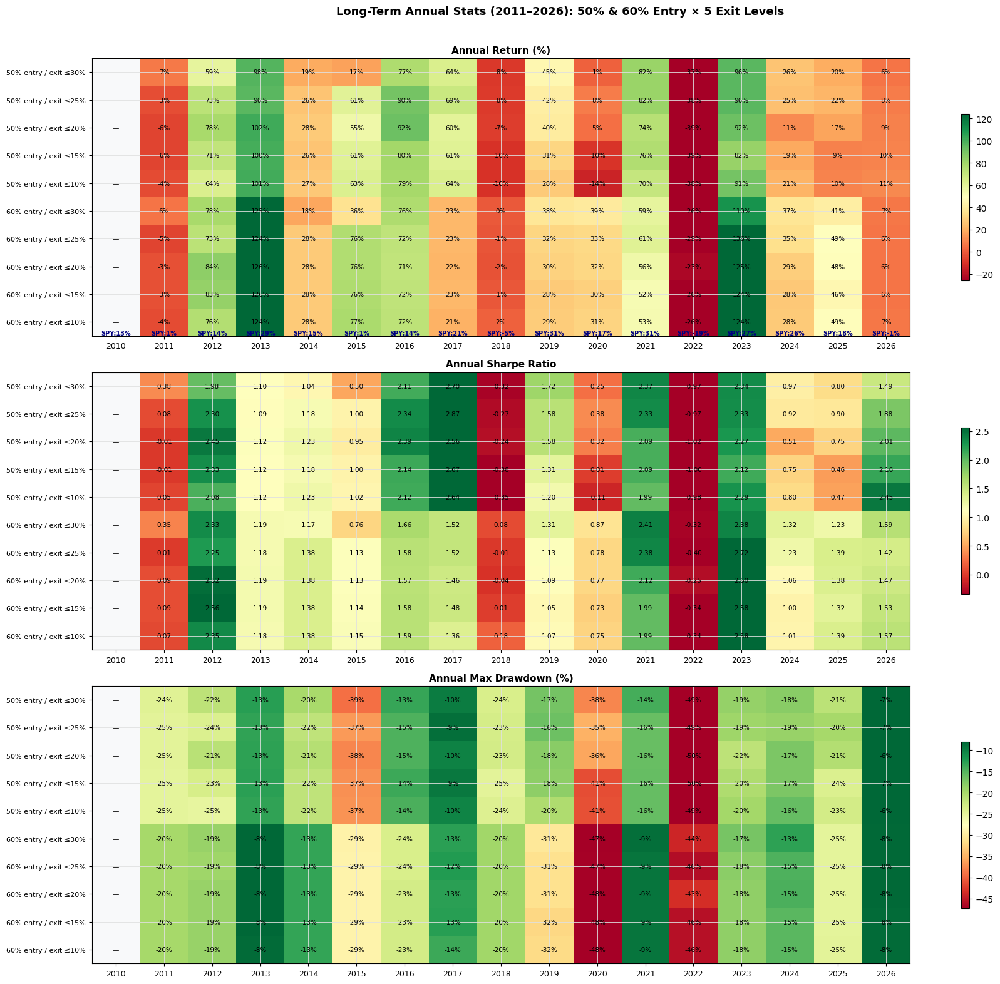

In [25]:
# ── Annual heatmaps: Return and Sharpe per combo per year ─────────────────────
combo_keys = list(results_lt.keys())
short_keys = [k.replace(" entry / exit ", "\n") for k in combo_keys]

# Build matrices: rows=combos, cols=years
years_arr = sorted(spy_annual_stats.index)
ret_matrix  = np.full((len(combo_keys), len(years_arr)), np.nan)
sh_matrix   = np.full((len(combo_keys), len(years_arr)), np.nan)
dd_matrix   = np.full((len(combo_keys), len(years_arr)), np.nan)

for r_idx, key in enumerate(combo_keys):
    for c_idx, yr in enumerate(years_arr):
        if yr in all_annual[key].index:
            ret_matrix[r_idx, c_idx] = all_annual[key].loc[yr, "Return"] * 100
            sh_matrix[r_idx,  c_idx] = all_annual[key].loc[yr, "Sharpe"]
            dd_matrix[r_idx,  c_idx] = all_annual[key].loc[yr, "MaxDD"]  * 100

spy_rets = [spy_annual_stats.loc[yr, "Return"] * 100 if yr in spy_annual_stats.index else np.nan for yr in years_arr]

fig, axes = plt.subplots(3, 1, figsize=(18, 16))

for ax_i, (data, title, center, fmt, add_spy) in enumerate([
    (ret_matrix,  "Annual Return (%)",        0,   "%.0f%%", True),
    (sh_matrix,   "Annual Sharpe Ratio",      0,   "%.2f",   False),
    (dd_matrix,   "Annual Max Drawdown (%)", -10,  "%.0f%%", False),
]):
    ax_h = axes[ax_i]
    vmin = np.nanpercentile(data, 5)
    vmax = np.nanpercentile(data, 95)
    im = ax_h.imshow(data, cmap="RdYlGn", aspect="auto", vmin=vmin, vmax=vmax)
    ax_h.set_xticks(range(len(years_arr)))
    ax_h.set_xticklabels([str(y) for y in years_arr], fontsize=9, rotation=0)
    ax_h.set_yticks(range(len(combo_keys)))
    ax_h.set_yticklabels(combo_keys, fontsize=8)
    ax_h.set_title(title, fontsize=11, fontweight="bold")
    for ri in range(len(combo_keys)):
        for ci in range(len(years_arr)):
            v = data[ri, ci]
            ax_h.text(ci, ri, fmt % v if not np.isnan(v) else "—",
                      ha="center", va="center", fontsize=7.5,
                      color="black")
    if add_spy:
        # Add SPY as an extra "row" overlay (text below)
        for ci, sv in enumerate(spy_rets):
            if not np.isnan(sv):
                ax_h.text(ci, len(combo_keys) - 0.5, f"SPY:{sv:.0f}%",
                          ha="center", va="bottom", fontsize=7, color="navy", fontweight="bold")
    plt.colorbar(im, ax=ax_h, shrink=0.6)

plt.suptitle("Long-Term Annual Stats (2011–2026): 50% & 60% Entry × 5 Exit Levels", fontsize=13, fontweight="bold")
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


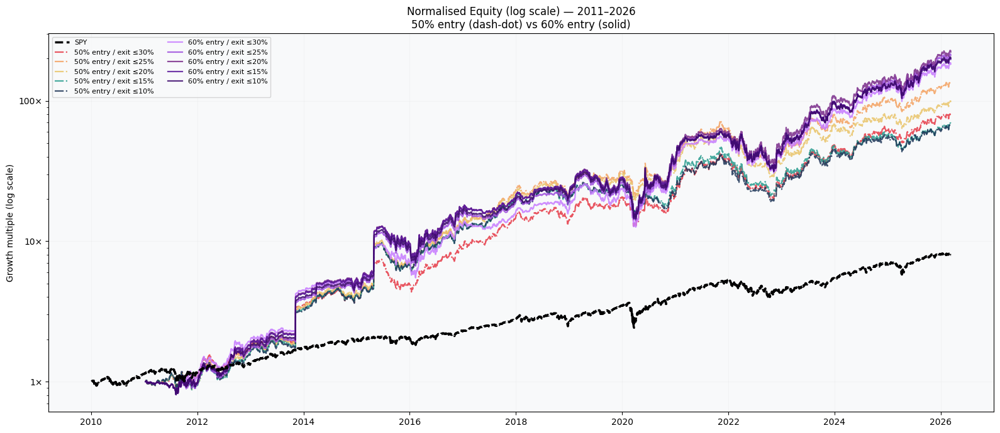

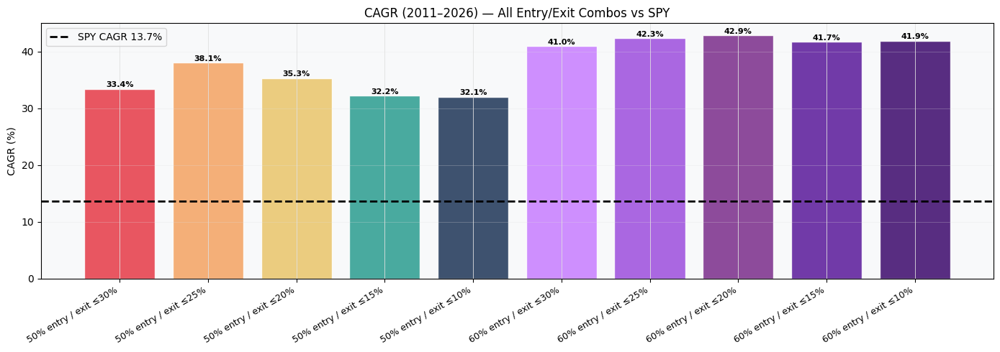

In [26]:
# ── CAGR comparison plot: all combos vs SPY ───────────────────────────────────
# Each line shows the rolling/growing equity normalised to $1 (not per-year)
palette_50 = ["#e63946", "#f4a261", "#e9c46a", "#2a9d8f", "#1d3557"]
palette_60 = ["#c77dff", "#9d4edd", "#7b2d8b", "#5a189a", "#3c096c"]

fig, ax = plt.subplots(figsize=(16, 7))

spy_norm_lt = spy_lt / spy_lt.iloc[0]
ax.plot(spy_norm_lt.index, spy_norm_lt, color="black", lw=2.5, ls="--", label="SPY", zorder=10)

for i, (key, eq_s) in enumerate(results_lt.items()):
    norm = eq_s / eq_s.iloc[0]
    is_60 = "60%" in key
    col = palette_60[i % 5] if is_60 else palette_50[i % 5]
    ls  = "-" if is_60 else "-."
    ax.plot(norm.index, norm, color=col, lw=1.6, ls=ls, label=key, alpha=0.85)

ax.set_yscale("log")
ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{x:.0f}×"))
ax.set_title("Normalised Equity (log scale) — 2011–2026\n50% entry (dash-dot) vs 60% entry (solid)", fontsize=12)
ax.set_ylabel("Growth multiple (log scale)")
ax.legend(fontsize=8, ncol=2, loc="upper left")
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# ── CAGR bar chart ─────────────────────────────────────────────────────────────
cagr_vals_lt = {}
for key, eq_s in results_lt.items():
    n_years = (eq_s.index[-1] - eq_s.index[0]).days / 365.25
    cagr_vals_lt[key] = (eq_s.iloc[-1] / eq_s.iloc[0]) ** (1 / n_years) - 1

spy_n_yrs = (spy_lt.index[-1] - spy_lt.index[0]).days / 365.25
spy_cagr   = (spy_lt.iloc[-1] / spy_lt.iloc[0]) ** (1 / spy_n_yrs) - 1

fig2, ax2 = plt.subplots(figsize=(14, 5))
bars = list(cagr_vals_lt.items())
colors_bar = [palette_60[i % 5] if "60%" in k else palette_50[i % 5] for i, (k, _) in enumerate(bars)]
ax2.bar([b[0] for b in bars], [b[1] * 100 for b in bars], color=colors_bar, alpha=0.85, edgecolor="white")
ax2.axhline(spy_cagr * 100, color="black", lw=2, ls="--", label=f"SPY CAGR {spy_cagr:.1%}")
ax2.set_ylabel("CAGR (%)")
ax2.set_title("CAGR (2011–2026) — All Entry/Exit Combos vs SPY", fontsize=12)
ax2.set_xticklabels([b[0] for b in bars], rotation=30, ha="right", fontsize=9)
for i, (_, v) in enumerate(bars):
    ax2.text(i, v * 100 + 0.3, f"{v:.1%}", ha="center", fontsize=8, fontweight="bold")
ax2.legend(fontsize=10)
ax2.grid(alpha=0.3, axis="y")
plt.tight_layout()
plt.show()


=== Average Hold Time Per Combo ===

Combo                                      Trades   Avg Days   Med Days   Target%    Stop%   Timeout%
-----------------------------------------------------------------------------------------------
50% entry / exit ≤30%                        5038        9.7          1     3.3%   86.6%     10.1%
50% entry / exit ≤25%                        5010        9.9          1     2.8%   86.7%     10.6%
50% entry / exit ≤20%                        5003        9.8          1     1.9%   87.1%     11.0%
50% entry / exit ≤15%                        5018        9.8          1     1.4%   87.3%     11.3%
50% entry / exit ≤10%                        5010        9.8          1     1.1%   87.4%     11.5%
60% entry / exit ≤30%                        2419       18.4          1     4.2%   73.0%     22.8%
60% entry / exit ≤25%                        2411       18.5          1     3.4%   73.2%     23.4%
60% entry / exit ≤20%                        2408       18.7          1 

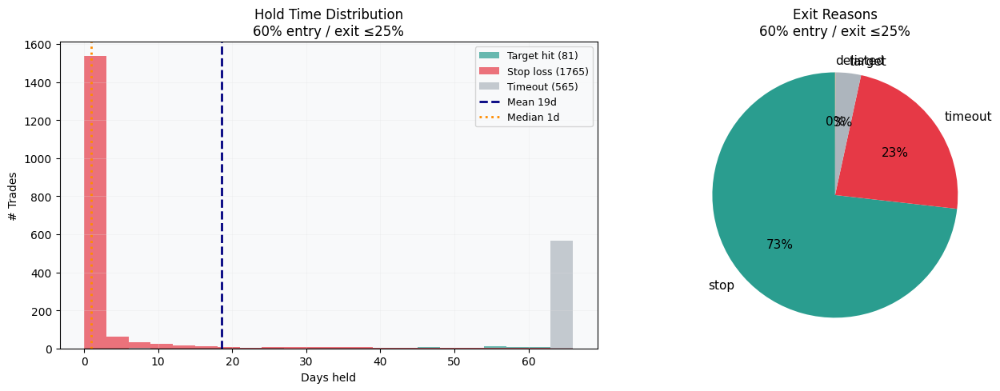

In [27]:
# ── Average hold time analysis ────────────────────────────────────────────────
print("=== Average Hold Time Per Combo ===\n")
print(f"{'Combo':<40}  {'Trades':>7}  {'Avg Days':>9}  {'Med Days':>9}  {'Target%':>8}  {'Stop%':>7}  {'Timeout%':>9}")
print("-" * 95)

for key, ht_list in holdtime_lt.items():
    if not ht_list:
        continue
    ht_df = pd.DataFrame(ht_list)
    n_trades   = len(ht_df)
    avg_days   = ht_df["days_held"].mean()
    med_days   = ht_df["days_held"].median()
    pct_target = (ht_df["exit_reason"] == "target").mean()
    pct_stop   = (ht_df["exit_reason"] == "stop").mean()
    pct_time   = (ht_df["exit_reason"].isin(["timeout", "delisted"])).mean()
    print(f"{key:<40}  {n_trades:>7}  {avg_days:>9.1f}  {med_days:>9.0f}  {pct_target:>7.1%}  {pct_stop:>6.1%}  {pct_time:>8.1%}")

# ── Distribution plot for one representative combo ────────────────────────────
# Best: 60% entry / exit ≤25%
rep_key = "60% entry / exit ≤25%"
if rep_key in holdtime_lt and holdtime_lt[rep_key]:
    ht_rep = pd.DataFrame(holdtime_lt[rep_key])
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Histogram of hold times
    target_days = ht_rep[ht_rep["exit_reason"] == "target"]["days_held"]
    stop_days   = ht_rep[ht_rep["exit_reason"] == "stop"]["days_held"]
    timeout_days= ht_rep[ht_rep["exit_reason"].isin(["timeout", "delisted"])]["days_held"]

    bins = range(0, MAX_HOLD_DAYS + 5, 3)
    axes[0].hist(target_days,  bins=bins, alpha=0.7, color="#2a9d8f", label=f"Target hit ({len(target_days)})")
    axes[0].hist(stop_days,    bins=bins, alpha=0.7, color="#e63946", label=f"Stop loss ({len(stop_days)})")
    axes[0].hist(timeout_days, bins=bins, alpha=0.7, color="#adb5bd", label=f"Timeout ({len(timeout_days)})")
    axes[0].axvline(ht_rep["days_held"].mean(), color="navy", lw=2, ls="--",
                    label=f"Mean {ht_rep['days_held'].mean():.0f}d")
    axes[0].axvline(ht_rep["days_held"].median(), color="darkorange", lw=2, ls=":",
                    label=f"Median {ht_rep['days_held'].median():.0f}d")
    axes[0].set_title(f"Hold Time Distribution\n{rep_key}")
    axes[0].set_xlabel("Days held"); axes[0].set_ylabel("# Trades")
    axes[0].legend(fontsize=9); axes[0].grid(alpha=0.3)

    # Exit reason pie
    reason_counts = ht_rep["exit_reason"].value_counts()
    axes[1].pie(reason_counts.values, labels=reason_counts.index, autopct="%1.0f%%",
                colors=["#2a9d8f", "#e63946", "#adb5bd", "#f4a261"],
                startangle=90, textprops={"fontsize": 11})
    axes[1].set_title(f"Exit Reasons\n{rep_key}")
    plt.tight_layout()
    plt.show()


---
## S&P 500 Only — Does Restricting to Large-Caps Fix the Drawdown?

Hypothesis: the brutal −50%+ max drawdowns come from mid/small-cap stocks that truly collapse.  
Here we re-run the **exact same 50% & 60% entry × 5 exit level** analysis but restricted to **S&P 500 constituents only** (large-cap stocks) using our already-downloaded 15-year data.

In [28]:

# ── Step 1: Fetch current S&P 500 tickers from Wikipedia ─────────────────────
import requests, io

headers = {"User-Agent": "Mozilla/5.0 (compatible; research-bot/1.0)"}
resp = requests.get(
    "https://en.wikipedia.org/wiki/List_of_S%26P_500_companies",
    headers=headers, timeout=15
)
resp.raise_for_status()
sp500_wiki = pd.read_html(io.StringIO(resp.text))[0]
sp500_tickers_raw = sp500_wiki['Symbol'].tolist()

# yfinance uses '-' instead of '.' (e.g., BRK.B → BRK-B)
sp500_tickers = [t.replace('.', '-') for t in sp500_tickers_raw]

# Filter to tickers we already have in the 15y download
sp500_valid = [t for t in sp500_tickers if t in closes_lt.columns]
print(f"S&P 500 list from Wikipedia : {len(sp500_tickers)} tickers")
print(f"Found in our 15y dataset   : {len(sp500_valid)} tickers")
print(f"Missing (likely added/renamed recently): {len(sp500_tickers) - len(sp500_valid)}")

# ── Step 2: Subset all 15y matrices ──────────────────────────────────────────
closes_sp500 = closes_lt[sp500_valid]
high_sp500   = closes_sp500.rolling(HIGH_LOOKBACK, min_periods=HIGH_LOOKBACK).max()
pb_sp500     = (high_sp500 - closes_sp500) / high_sp500

em_50_sp500  = (pb_sp500 >= 0.50)
em_60_sp500  = (pb_sp500 >= 0.60)

print(f"\nSignal density (post warm-up):")
print(f"  ≥50% pullback : {em_50_sp500.sum(axis=1).mean():.1f} stocks/day  |  "
      f"{(em_50_sp500.sum(axis=0) > 0).sum()} unique tickers over 15y")
print(f"  ≥60% pullback : {em_60_sp500.sum(axis=1).mean():.1f} stocks/day  |  "
      f"{(em_60_sp500.sum(axis=0) > 0).sum()} unique tickers over 15y")


S&P 500 list from Wikipedia : 503 tickers
Found in our 15y dataset   : 499 tickers
Missing (likely added/renamed recently): 4

Signal density (post warm-up):
  ≥50% pullback : 5.4 stocks/day  |  235 unique tickers over 15y
  ≥60% pullback : 2.1 stocks/day  |  120 unique tickers over 15y


In [29]:

# ── Step 3: Run 10 combos (same as full-universe) on S&P 500 only ─────────────
combos_sp500 = [
    ("50% entry", em_50_sp500, 0.25),
    ("50% entry", em_50_sp500, 0.30),
    ("50% entry", em_50_sp500, 0.40),
    ("50% entry", em_50_sp500, 0.50),
    ("50% entry", em_50_sp500, 0.60),
    ("60% entry", em_60_sp500, 0.25),
    ("60% entry", em_60_sp500, 0.30),
    ("60% entry", em_60_sp500, 0.40),
    ("60% entry", em_60_sp500, 0.50),
    ("60% entry", em_60_sp500, 0.60),
]

results_sp500   = {}
holdtime_sp500  = {}

def _fmt(v):
    """Format a metric that may be float or 'N/A'."""
    if isinstance(v, float):
        return f"{v:.1%}"
    return str(v)

for label, em, exit_pb in combos_sp500:
    key = f"{label} / exit ≤{int(exit_pb*100)}%"
    print(f"Running {key} ...", end=" ")
    eq, ht = backtest_lt(
        closes_sp500, high_sp500, pb_sp500, spy_lt,
        entry_mask=em, exit_pullback=exit_pb
    )
    results_sp500[key]  = eq
    holdtime_sp500[key] = ht
    m = perf_metrics(eq, key)
    cagr = m.get("CAGR", "N/A")
    sh   = m.get("Sharpe Ratio", "N/A")
    mdd  = m.get("Max Drawdown", "N/A")
    cagr_s = f"{cagr:.1%}" if isinstance(cagr, float) else str(cagr)
    sh_s   = f"{sh:.2f}"   if isinstance(sh,   float) else str(sh)
    mdd_s  = f"{mdd:.1%}"  if isinstance(mdd,  float) else str(mdd)
    print(f"CAGR {cagr_s}  Sharpe {sh_s}  MaxDD {mdd_s}")

print("\nDone.")


Running 50% entry / exit ≤25% ... 

CAGR 15.3%  Sharpe 0.73  MaxDD -39.3%
Running 50% entry / exit ≤30% ... 

CAGR 14.3%  Sharpe 0.70  MaxDD -39.3%
Running 50% entry / exit ≤40% ... 

CAGR 14.2%  Sharpe 0.70  MaxDD -39.3%
Running 50% entry / exit ≤50% ... 

CAGR 12.1%  Sharpe 0.67  MaxDD -39.6%
Running 50% entry / exit ≤60% ... 

CAGR 5.4%  Sharpe 0.41  MaxDD -38.0%
Running 60% entry / exit ≤25% ... 

CAGR 9.1%  Sharpe 0.58  MaxDD -31.0%
Running 60% entry / exit ≤30% ... 

CAGR 8.3%  Sharpe 0.54  MaxDD -31.0%
Running 60% entry / exit ≤40% ... 

CAGR 8.3%  Sharpe 0.55  MaxDD -31.3%
Running 60% entry / exit ≤50% ... 

CAGR 7.4%  Sharpe 0.53  MaxDD -31.6%
Running 60% entry / exit ≤60% ... 

CAGR 5.4%  Sharpe 0.46  MaxDD -32.3%

Done.


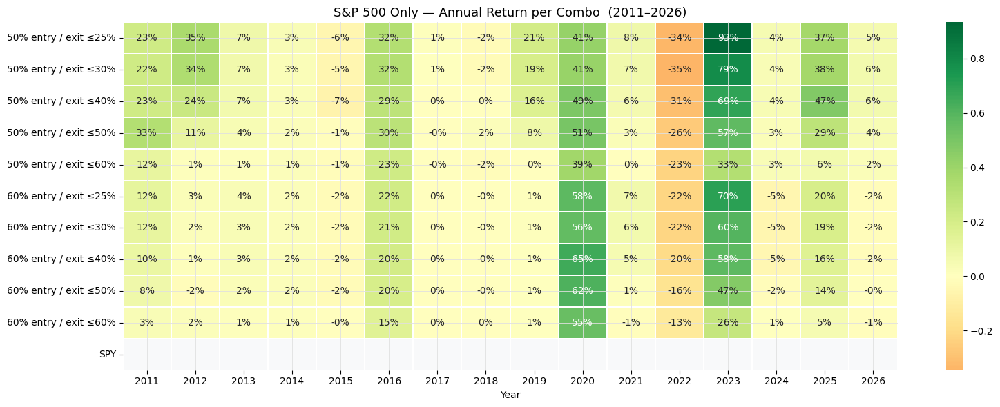

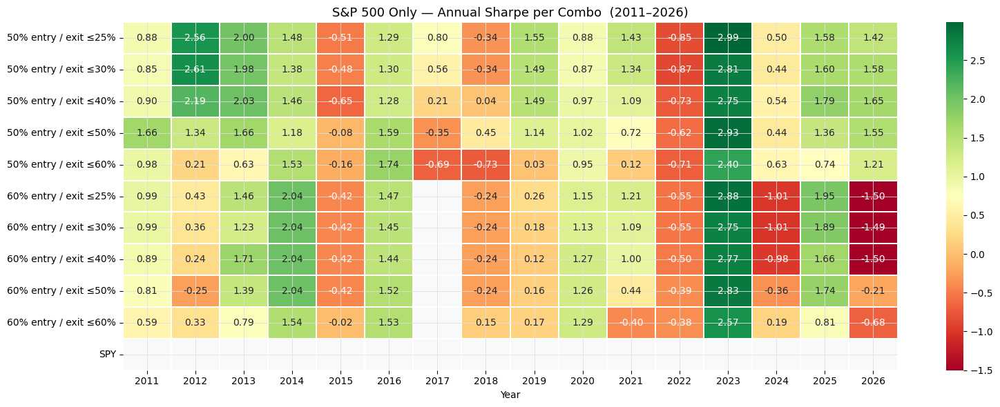

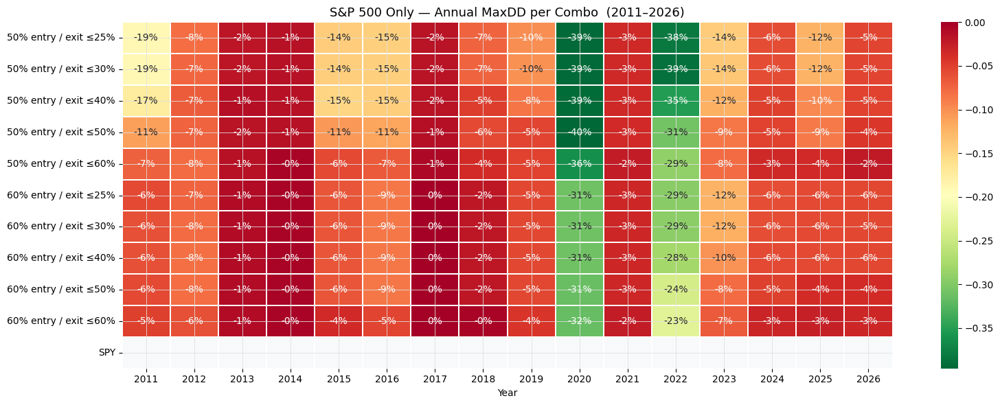

In [30]:

# ── Step 4: Annual heatmaps — Return / Sharpe / MaxDD (S&P 500 only) ──────────
import seaborn as sns

all_annual_sp500 = {k: annual_stats(v) for k, v in results_sp500.items()}

for metric in ["Return", "Sharpe", "MaxDD"]:
    mat = pd.DataFrame({k: all_annual_sp500[k][metric] for k in results_sp500})
    mat.index = mat.index.astype(str)
    spy_col = spy_annual_stats[metric].rename("SPY").reindex(mat.index)
    mat = mat.join(spy_col)

    fig, ax = plt.subplots(figsize=(16, 6))
    fmt = ".0%" if metric in ("Return", "MaxDD") else ".2f"
    cmap = "RdYlGn" if metric != "MaxDD" else "RdYlGn_r"
    sns.heatmap(mat.T, annot=True, fmt=fmt, cmap=cmap,
                linewidths=0.3, ax=ax, center=0 if metric == "Return" else None)
    ax.set_title(f"S&P 500 Only — Annual {metric} per Combo  (2011–2026)", fontsize=13)
    ax.set_xlabel("Year"); ax.set_ylabel("")
    plt.tight_layout()
    plt.show()


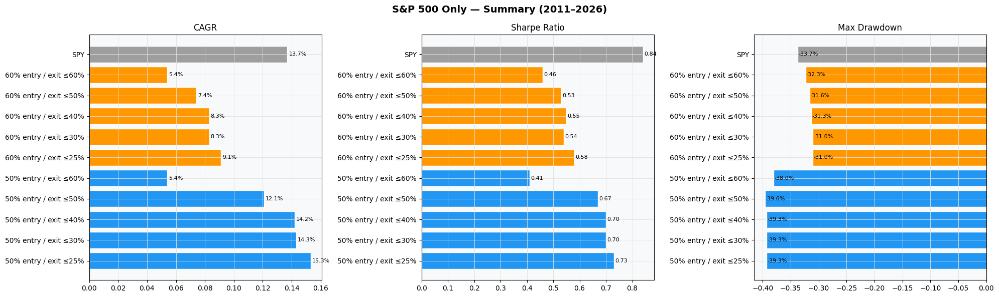

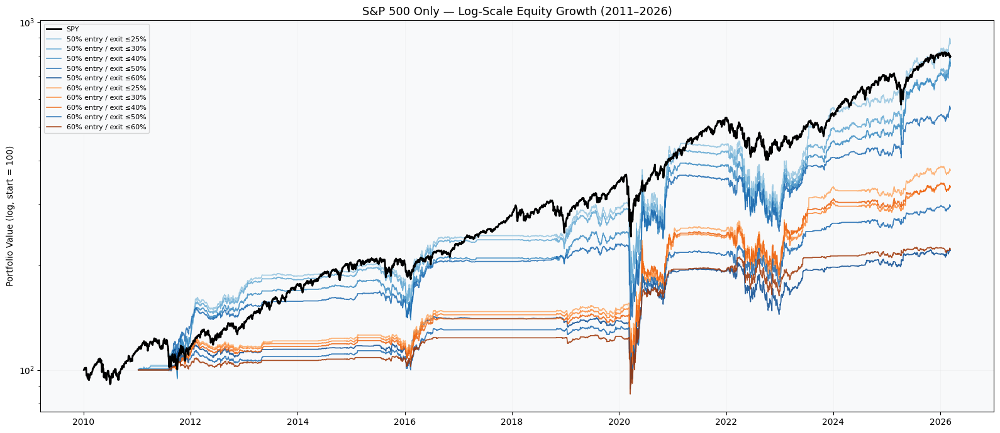

In [31]:

# ── Step 5: CAGR bar chart + log-scale equity curve (S&P 500 only) ─────────────
def _parse_metric(v):
    """Parse a metric value that may be a float or a string like '15.3%' or '-39.3%'."""
    if isinstance(v, float):
        return v
    if isinstance(v, str):
        s = v.strip()
        if s.endswith('%'):
            return float(s[:-1]) / 100
        try:
            return float(s)
        except ValueError:
            return 0.0
    return 0.0

# Normalize SPY to start at 100k so perf_metrics makes sense
spy_norm_series = (spy_lt / spy_lt.iloc[0]) * 100_000
spy_norm_series.name = "SPY"

metrics_sp500 = {k: perf_metrics(v, k) for k, v in results_sp500.items()}
spy_metr      = perf_metrics(spy_norm_series, "SPY")

labels  = list(metrics_sp500.keys()) + ["SPY"]
cagrs   = [_parse_metric(metrics_sp500[k]["CAGR"])         for k in metrics_sp500] + [_parse_metric(spy_metr["CAGR"])]
sharpes = [_parse_metric(metrics_sp500[k]["Sharpe Ratio"]) for k in metrics_sp500] + [_parse_metric(spy_metr["Sharpe Ratio"])]
maxdds  = [_parse_metric(metrics_sp500[k]["Max Drawdown"]) for k in metrics_sp500] + [_parse_metric(spy_metr["Max Drawdown"])]
colors  = ["#2196F3"]*5 + ["#FF9800"]*5 + ["#9E9E9E"]

fig, axes = plt.subplots(1, 3, figsize=(20, 6))
fig.suptitle("S&P 500 Only — Summary (2011–2026)", fontsize=14, fontweight="bold")

for ax, vals, title, fmt in zip(
    axes,
    [cagrs, sharpes, maxdds],
    ["CAGR", "Sharpe Ratio", "Max Drawdown"],
    ["{:.1%}", "{:.2f}", "{:.1%}"]
):
    bars = ax.barh(labels, vals, color=colors, edgecolor="white")
    ax.set_title(title)
    ax.axvline(0, color="black", linewidth=0.8)
    span = (max(vals) - min(vals)) or 1
    for bar, val in zip(bars, vals):
        ax.text(bar.get_width() + span * 0.01,
                bar.get_y() + bar.get_height() / 2,
                fmt.format(val), va="center", fontsize=8)

plt.tight_layout()
plt.show()

# Log-scale equity curves
fig, ax = plt.subplots(figsize=(16, 7))
spy_norm_plot = (spy_lt / spy_lt.iloc[0]) * 100
ax.plot(spy_norm_plot.index, spy_norm_plot.values, color="black", lw=2, label="SPY", zorder=10)
palette  = plt.cm.Blues(np.linspace(0.4, 0.9, 5))
palette2 = plt.cm.Oranges(np.linspace(0.4, 0.9, 5))
for i, (k, eq) in enumerate(results_sp500.items()):
    col  = palette[i % 5] if "50%" in k else palette2[i % 5]
    norm = (eq / eq.iloc[0]) * 100
    ax.plot(norm.index, norm.values, color=col, lw=1.2, label=k, alpha=0.85)
ax.set_yscale("log")
ax.set_title("S&P 500 Only — Log-Scale Equity Growth (2011–2026)", fontsize=13)
ax.set_ylabel("Portfolio Value (log, start = 100)")
ax.legend(loc="upper left", fontsize=8)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


---
## Full Universe vs S&P 500 Only — Does Restricting to Large-Caps Improve Drawdown?

Focus: **60% entry / exit ≤25%** — the combo that had good CAGR & Sharpe but rough drawdown.

We compare:
- **Overall CAGR, Sharpe, Max Drawdown**
- **Year-by-year return, Sharpe, and MaxDD**
- **Equity curve & drawdown chart side-by-side**

All combos are also summarised in a comparison table at the end.

In [32]:

# ── Step 8A: Overall metrics — Full Universe vs S&P 500 vs SPY ─────────────────
KEY_60_25 = "60% entry / exit ≤25%"

def raw_metrics(eq: pd.Series, label: str) -> dict:
    """Compute CAGR, Sharpe, MaxDD directly from an equity series (no string formatting)."""
    rets = eq.pct_change().dropna()
    n_years = (eq.index[-1] - eq.index[0]).days / 365.25
    cagr    = (eq.iloc[-1] / eq.iloc[0]) ** (1 / n_years) - 1
    sharpe  = rets.mean() / rets.std() * np.sqrt(252) if rets.std() > 0 else np.nan
    max_dd  = ((eq / eq.cummax()) - 1).min()
    return {"Label": label, "CAGR": cagr, "Sharpe": sharpe, "Max Drawdown": max_dd}

eq_full = results_lt[KEY_60_25]
eq_sp5  = results_sp500[KEY_60_25]
spy_norm_eq = (spy_lt / spy_lt.iloc[0]) * eq_full.iloc[0]  # rebase SPY to same start capital

summary_rows = [
    raw_metrics(eq_full,    "Full Universe"),
    raw_metrics(eq_sp5,     "S&P 500 Only"),
    raw_metrics(spy_norm_eq, "SPY (benchmark)"),
]
summary_df = pd.DataFrame(summary_rows).set_index("Label")

print(f"=== Overall Metrics  |  60% entry / exit ≤25%  (2011–2026) ===\n")
print(f"{'':20s}  {'CAGR':>9}  {'Sharpe':>8}  {'Max Drawdown':>13}")
print("-" * 58)
for lbl, row in summary_df.iterrows():
    print(f"{lbl:20s}  {row['CAGR']:>9.2%}  {row['Sharpe']:>8.2f}  {row['Max Drawdown']:>13.2%}")


=== Overall Metrics  |  60% entry / exit ≤25%  (2011–2026) ===

                           CAGR    Sharpe   Max Drawdown
----------------------------------------------------------
Full Universe            42.34%      1.02        -53.40%
S&P 500 Only              9.11%      0.58        -30.98%
SPY (benchmark)          13.68%      0.84        -33.72%


In [33]:

# ── Step 8B: Year-by-year comparison table — Full Universe vs S&P 500 vs SPY ──
def annual_stats_raw(equity: pd.Series) -> pd.DataFrame:
    rows = []
    for yr, grp in equity.groupby(equity.index.year):
        if len(grp) < 20:
            continue
        rets    = grp.pct_change().dropna()
        ann_ret = grp.iloc[-1] / grp.iloc[0] - 1
        sharpe  = rets.mean() / rets.std() * np.sqrt(252) if rets.std() > 0 else np.nan
        max_dd  = ((grp / grp.cummax()) - 1).min()
        rows.append({"Year": yr, "Return": ann_ret, "Sharpe": sharpe, "MaxDD": max_dd})
    return pd.DataFrame(rows).set_index("Year")

ann_full = annual_stats_raw(eq_full)
ann_sp5  = annual_stats_raw(eq_sp5)
ann_spy  = annual_stats_raw(spy_lt)

years_all = sorted(set(ann_full.index) | set(ann_sp5.index) | set(ann_spy.index))

print(f"=== Year-by-Year  |  60% entry / exit ≤25%  (2011–2026) ===\n")
header = f"{'Year':>5}  {'SPY Ret':>8} {'SPY Sh':>6} {'SPY DD':>8}  {'Full Ret':>9} {'Full Sh':>7} {'Full DD':>8}  {'SP500 Ret':>10} {'SP500 Sh':>8} {'SP500 DD':>9}"
print(header)
print("-" * len(header))

for yr in years_all:
    def g(df, col):
        return df.loc[yr, col] if yr in df.index else np.nan

    spy_r, spy_s, spy_d = g(ann_spy, 'Return'), g(ann_spy, 'Sharpe'), g(ann_spy, 'MaxDD')
    fu_r,  fu_s,  fu_d  = g(ann_full, 'Return'), g(ann_full, 'Sharpe'), g(ann_full, 'MaxDD')
    sp_r,  sp_s,  sp_d  = g(ann_sp5, 'Return'), g(ann_sp5, 'Sharpe'), g(ann_sp5, 'MaxDD')

    def fmt_r(v): return f"{v:>8.1%}" if not np.isnan(v) else f"{'—':>8}"
    def fmt_s(v): return f"{v:>6.2f}" if not np.isnan(v) else f"{'—':>6}"
    def fmt_d(v): return f"{v:>8.1%}" if not np.isnan(v) else f"{'—':>8}"

    print(f"{yr:>5}  {fmt_r(spy_r)} {fmt_s(spy_s)} {fmt_d(spy_d)}  "
          f"{fmt_r(fu_r)} {fmt_s(fu_s)} {fmt_d(fu_d)}  "
          f"{fmt_r(sp_r)} {fmt_s(sp_s)} {fmt_d(sp_d)}")


=== Year-by-Year  |  60% entry / exit ≤25%  (2011–2026) ===

 Year   SPY Ret SPY Sh   SPY DD   Full Ret Full Sh  Full DD   SP500 Ret SP500 Sh  SP500 DD
------------------------------------------------------------------------------------------
 2010     13.1%   0.78   -15.7%         —      —        —         —      —        —
 2011      0.9%   0.15   -18.6%     -5.5%   0.01   -19.9%     12.3%   0.99    -5.6%
 2012     14.2%   1.12    -9.7%     72.9%   2.25   -19.3%      2.6%   0.43    -7.4%
 2013     29.0%   2.42    -5.6%    124.4%   1.18    -8.0%      3.7%   1.46    -1.1%
 2014     14.6%   1.27    -7.3%     27.7%   1.38   -13.3%      2.1%   2.04    -0.4%
 2015      1.3%   0.16   -11.9%     75.6%   1.13   -29.1%     -2.3%  -0.42    -6.5%
 2016     13.6%   1.05    -9.2%     71.9%   1.58   -23.7%     21.8%   1.47    -8.7%
 2017     20.8%   2.87    -2.6%     22.7%   1.52   -12.3%      0.0%      —     0.0%
 2018     -5.2%  -0.23   -19.3%     -1.4%  -0.01   -19.6%     -0.3%  -0.24    -1.9%
 

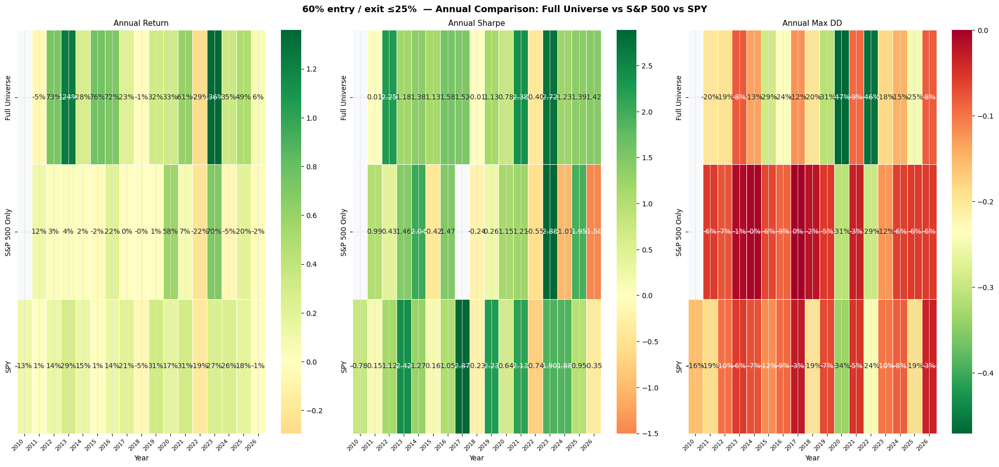

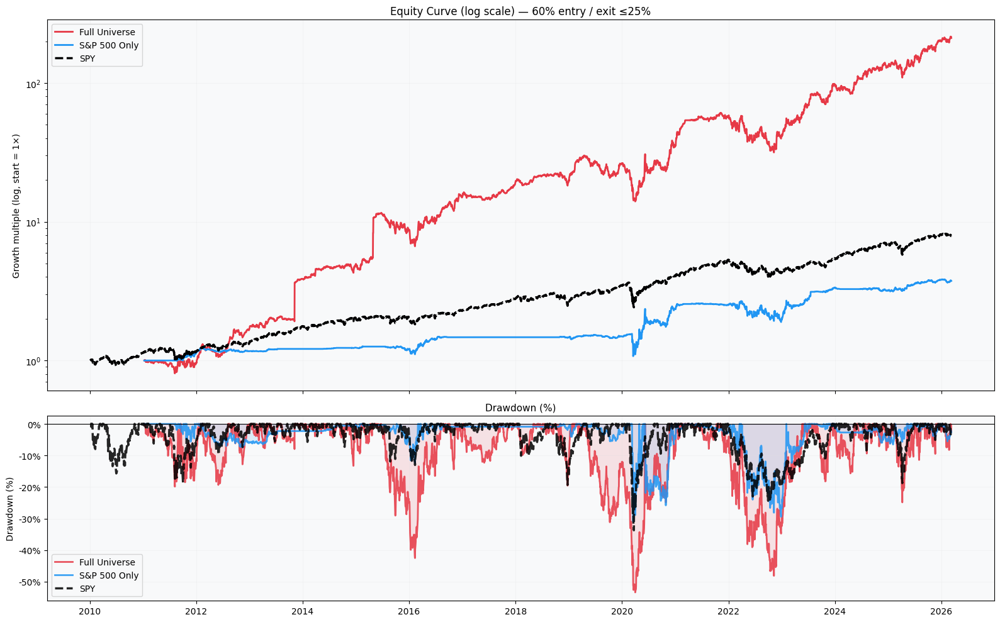

In [34]:

# ── Step 8C: Annual heatmap + equity+drawdown charts — Full vs SP500 vs SPY ────
import seaborn as sns

# ── Heatmap: Annual Return ────────────────────────────────────────────────────
hm_data = pd.DataFrame({
    "Full Universe": ann_full["Return"],
    "S&P 500 Only" : ann_sp5["Return"],
    "SPY"          : ann_spy["Return"],
}).sort_index()

fig, axes = plt.subplots(1, 3, figsize=(20, max(6, len(hm_data) * 0.55)))
fig.suptitle("60% entry / exit ≤25%  — Annual Comparison: Full Universe vs S&P 500 vs SPY",
             fontsize=13, fontweight="bold")

for ax, metric, df_col, cmap_, fmt_ in [
    (axes[0], "Annual Return",    "Return", "RdYlGn",   ".0%"),
    (axes[1], "Annual Sharpe",    "Sharpe", "RdYlGn",   ".2f"),
    (axes[2], "Annual Max DD",    "MaxDD",  "RdYlGn_r", ".0%"),
]:
    mat = pd.DataFrame({
        "Full Universe": ann_full[metric.split()[1]] if metric.split()[1] in ann_full.columns
                          else (ann_full["Return"] if metric == "Annual Return"
                                else ann_full["Sharpe"] if metric == "Annual Sharpe"
                                else ann_full["MaxDD"]),
        "S&P 500 Only" : ann_sp5["Return"]  if metric == "Annual Return"
                          else ann_sp5["Sharpe"]  if metric == "Annual Sharpe"
                          else ann_sp5["MaxDD"],
        "SPY"          : ann_spy["Return"]  if metric == "Annual Return"
                          else ann_spy["Sharpe"]  if metric == "Annual Sharpe"
                          else ann_spy["MaxDD"],
    }).sort_index()
    sns.heatmap(mat.T, annot=True, fmt=fmt_, cmap=cmap_,
                linewidths=0.4, ax=ax,
                center=0 if metric in ("Annual Return", "Annual Sharpe") else None)
    ax.set_title(metric, fontsize=11)
    ax.set_xlabel("Year"); ax.set_ylabel("")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=8)

plt.tight_layout()
plt.show()

# ── Equity curve (log) + drawdown ─────────────────────────────────────────────
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10), sharex=True,
                                gridspec_kw={"height_ratios": [2, 1]})

spy_rebased = spy_lt / spy_lt.iloc[0] * eq_full.iloc[0]

for series, label, col, lw, ls in [
    (eq_full,     "Full Universe",  "#e63946", 2.0, "-"),
    (eq_sp5,      "S&P 500 Only",   "#2196F3", 2.0, "-"),
    (spy_rebased, "SPY",            "black",   2.5, "--"),
]:
    norm = series / series.iloc[0]
    ax1.plot(norm.index, norm, color=col, lw=lw, ls=ls, label=label)
    dd = (series / series.cummax()) - 1
    ax2.plot(dd.index, dd * 100, color=col, lw=lw, ls=ls, label=label, alpha=0.85)

ax1.set_yscale("log")
ax1.set_title("Equity Curve (log scale) — 60% entry / exit ≤25%", fontsize=12)
ax1.set_ylabel("Growth multiple (log, start = 1×)")
ax1.legend(fontsize=10)
ax1.grid(alpha=0.3)

ax2.fill_between(eq_full.index, ((eq_full / eq_full.cummax()) - 1) * 100, 0,
                 alpha=0.12, color="#e63946")
ax2.fill_between(eq_sp5.index, ((eq_sp5 / eq_sp5.cummax()) - 1) * 100, 0,
                 alpha=0.12, color="#2196F3")
ax2.set_title("Drawdown (%)", fontsize=11)
ax2.set_ylabel("Drawdown (%)")
ax2.axhline(0, color="black", lw=0.8)
ax2.legend(fontsize=10)
ax2.grid(alpha=0.3)
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0f}%"))

plt.tight_layout()
plt.show()


In [35]:

# ── Step 8D: All-combos side-by-side comparison table ─────────────────────────
# Find combos present in both universes
common_keys = [k for k in results_lt if k in results_sp500]

print(f"=== All-Combos  Full Universe vs S&P 500 Only — 2011–2026 ===")
print(f"{'Combo':<35}  {'Full CAGR':>10}  {'SP500 CAGR':>11}  {'Full Sh':>8}  {'SP500 Sh':>9}  {'Full DD':>9}  {'SP500 DD':>9}  {'DD Δ':>7}")
print("-" * 115)

for k in common_keys:
    mf = raw_metrics(results_lt[k],    k)
    ms = raw_metrics(results_sp500[k], k)
    dd_delta = ms["Max Drawdown"] - mf["Max Drawdown"]   # positive = SP500 has worse DD
    flag = "✓ better" if dd_delta > 0 else "✗ worse "
    print(f"{k:<35}  {mf['CAGR']:>10.2%}  {ms['CAGR']:>11.2%}  "
          f"{mf['Sharpe']:>8.2f}  {ms['Sharpe']:>9.2f}  "
          f"{mf['Max Drawdown']:>9.2%}  {ms['Max Drawdown']:>9.2%}  "
          f"{dd_delta:>+7.2%} {flag}")

spy_m = raw_metrics(spy_norm_eq, "SPY")
print(f"\n{'SPY benchmark':<35}  {'':>10}  {'':>11}  {'':>8}  {'':>9}  "
      f"{'':>9}  {'':>9}  {'':>7}")
print(f"  CAGR {spy_m['CAGR']:.2%}  Sharpe {spy_m['Sharpe']:.2f}  Max Drawdown {spy_m['Max Drawdown']:.2%}")
print(f"\nNote: 'DD Δ' = SP500 MaxDD − Full MaxDD  (positive = SP500 has SHALLOWER drawdown = better)")


=== All-Combos  Full Universe vs S&P 500 Only — 2011–2026 ===
Combo                                 Full CAGR   SP500 CAGR   Full Sh   SP500 Sh    Full DD   SP500 DD     DD Δ
-------------------------------------------------------------------------------------------------------------------
50% entry / exit ≤30%                    33.45%       14.31%      0.93       0.70    -52.85%    -39.34%  +13.51% ✓ better
50% entry / exit ≤25%                    38.09%       15.30%      1.00       0.73    -54.09%    -39.34%  +14.76% ✓ better
60% entry / exit ≤30%                    41.00%        8.32%      1.01       0.54    -51.09%    -30.99%  +20.10% ✓ better
60% entry / exit ≤25%                    42.34%        9.11%      1.02       0.58    -53.40%    -30.98%  +22.43% ✓ better

SPY benchmark                                                                                                   
  CAGR 13.68%  Sharpe 0.84  Max Drawdown -33.72%

Note: 'DD Δ' = SP500 MaxDD − Full MaxDD  (positive = SP50

---
## Index Attribution: What's Actually in the Full Universe?

The full S&P 1500 universe is made up of three indices:
- **S&P 500** — large-cap stocks (~500)
- **S&P 400** — mid-cap stocks (~400)
- **S&P 600** — small-cap stocks (~600)

We want to know:
1. How many stocks from each index survived liquidity filtering?
2. Which index is driving the returns?
3. Which index is causing the worst drawdowns?
4. Can we reduce max drawdown with a **portfolio-level circuit breaker**?

In [36]:

# ── Step 9A: Tag each stock as S&P 500 / 400 / 600 ───────────────────────────
import requests, io as _io

_headers = {"User-Agent": "Mozilla/5.0 (compatible; research-bot/1.0)"}

def _fetch_tickers(url):
    r = requests.get(url, headers=_headers, timeout=15)
    r.raise_for_status()
    df = pd.read_html(_io.StringIO(r.text))[0]
    # Wikipedia tables vary — always pick the column most likely to be tickers
    for col in ["Symbol", "Ticker symbol", "Ticker"]:
        if col in df.columns:
            return [str(t).replace(".", "-") for t in df[col].tolist()]
    return [str(t).replace(".", "-") for t in df.iloc[:, 0].tolist()]

print("Fetching S&P 500 / 400 / 600 membership lists …")
_sp500_syms = _fetch_tickers("https://en.wikipedia.org/wiki/List_of_S%26P_500_companies")
_sp400_syms = _fetch_tickers("https://en.wikipedia.org/wiki/List_of_S%26P_400_companies")
_sp600_syms = _fetch_tickers("https://en.wikipedia.org/wiki/List_of_S%26P_600_companies")

# Build a priority map: first match wins (same order as universe.py scrapes)
_ticker_index_map = {}
for t in _sp500_syms: _ticker_index_map[t] = "S&P 500"
for t in _sp400_syms:
    if t not in _ticker_index_map: _ticker_index_map[t] = "S&P 400"
for t in _sp600_syms:
    if t not in _ticker_index_map: _ticker_index_map[t] = "S&P 600"

universe_df["Index"] = universe_df["Symbol"].map(_ticker_index_map).fillna("Other")

print(f"\n{'='*50}")
print("FULL UNIVERSE COMPOSITION (universe.csv — after liquidity filter)")
print(f"{'='*50}")
idx_counts = universe_df["Index"].value_counts()
for idx_name, cnt in idx_counts.items():
    pct = cnt / len(universe_df) * 100
    print(f"  {idx_name:<12} : {cnt:>4} stocks  ({pct:.1f}%)")
print(f"  {'TOTAL':<12} : {len(universe_df):>4} stocks")

# How many of these are in our 15-year dataset?
print(f"\n{'='*50}")
print("IN 15-YEAR BACKTEST DATA (closes_lt)")
print(f"{'='*50}")
in_lt_df = universe_df[universe_df["Symbol"].isin(closes_lt.columns)]
for idx_name, grp in in_lt_df.groupby("Index"):
    print(f"  {idx_name:<12} : {len(grp):>4} stocks")
print(f"  {'TOTAL':<12} : {len(in_lt_df):>4} stocks")

print(f"\n{'='*50}")
print("SECTOR BREAKDOWN BY INDEX (in 15y data)")
print(f"{'='*50}")
pivot = in_lt_df.groupby(["Index", "Sector"]).size().unstack(fill_value=0)
print(pivot.to_string())


Fetching S&P 500 / 400 / 600 membership lists …



FULL UNIVERSE COMPOSITION (universe.csv — after liquidity filter)
  S&P 500      :  503 stocks  (36.1%)
  S&P 600      :  487 stocks  (35.0%)
  S&P 400      :  398 stocks  (28.6%)
  Other        :    4 stocks  (0.3%)
  TOTAL        : 1392 stocks

IN 15-YEAR BACKTEST DATA (closes_lt)
  Other        :    4 stocks
  S&P 400      :  396 stocks
  S&P 500      :  499 stocks
  S&P 600      :  478 stocks
  TOTAL        : 1377 stocks

SECTOR BREAKDOWN BY INDEX (in 15y data)
Sector   Communication Services  Consumer Discretionary  Consumer Staples  Energy  Financials  Health Care  Industrials  Information Technology  Materials  Real Estate  Utilities
Index                                                                                                                                                                             
Other                         0                       0                 1       0           0            1            1                       0          0            1    

In [37]:

# ── Step 9B: Run 60% entry / exit ≤25% backtest split by index ───────────────
# SP500 is already in results_sp500 — just pull that result
# We run new backtests for SP400 and SP600

_ENTRY  = 0.60   # 60% pullback from 52w high
_EXIT   = 0.25   # exit when within 25% of 52w high
_STOP   = 0.80   # stop if falls to 80% below 52w high

_results_by_index = {}

# S&P 500 (re-use already computed result + trade data)
_sp500_valid_lt = [t for t in _sp500_syms if t in closes_lt.columns]
_results_by_index["S&P 500"] = {
    "equity": results_sp500["60% entry / exit ≤25%"],
    "trades": holdtime_sp500.get("60% entry / exit ≤25%", []),
}
print(f"S&P 500 : {len(_sp500_valid_lt)} stocks  (re-using existing run)")

# S&P 400 and S&P 600
for _idx_name, _syms in [("S&P 400", _sp400_syms), ("S&P 600", _sp600_syms)]:
    _valid = [t for t in _syms if t in closes_lt.columns]
    print(f"\n{_idx_name}: {len(_valid)} stocks in 15y data", end=" … running backtest … ")

    _closes_idx = closes_lt[_valid]
    _high_idx   = _closes_idx.rolling(HIGH_LOOKBACK, min_periods=HIGH_LOOKBACK).max()
    _pb_idx     = (_high_idx - _closes_idx) / _high_idx
    _em_idx     = (_pb_idx >= _ENTRY)

    print(f"avg {_em_idx.sum(axis=1).mean():.1f} signals/day", end=" | ")

    _eq_idx, _ht_idx = backtest_lt(
        _closes_idx, _high_idx, _pb_idx, spy_lt,
        _em_idx, _EXIT, stop_from_high=_STOP
    )
    _results_by_index[_idx_name] = {"equity": _eq_idx, "trades": _ht_idx}

    _m = raw_metrics(_eq_idx, _idx_name)
    print(f"CAGR {_m['CAGR']:.2%}  Sharpe {_m['Sharpe']:.2f}  MaxDD {_m['Max Drawdown']:.2%}")

# ── Summary table ─────────────────────────────────────────────────────────────
print(f"\n{'='*65}")
print(f"{'Index':<16}  {'CAGR':>8}  {'Sharpe':>7}  {'Max Drawdown':>13}")
print(f"{'-'*65}")
for _iname, _res in _results_by_index.items():
    _m = raw_metrics(_res["equity"], _iname)
    print(f"  {_iname:<14}  {_m['CAGR']:>8.2%}  {_m['Sharpe']:>7.2f}  {_m['Max Drawdown']:>13.2%}")
_mf = raw_metrics(results_lt[KEY_60_25], "Full Universe")
print(f"  {'Full Universe':<14}  {_mf['CAGR']:>8.2%}  {_mf['Sharpe']:>7.2f}  {_mf['Max Drawdown']:>13.2%}")
_ms = raw_metrics((spy_lt / spy_lt.iloc[0]) * 100_000, "SPY")
print(f"  {'SPY':<14}  {_ms['CAGR']:>8.2%}  {_ms['Sharpe']:>7.2f}  {_ms['Max Drawdown']:>13.2%}")
print(f"{'='*65}")
print("\nNote: Each index run is standalone — portfolio only holds stocks from that index.")


S&P 500 : 499 stocks  (re-using existing run)

S&P 400: 396 stocks in 15y data … running backtest … avg 3.7 signals/day | 

CAGR 15.09%  Sharpe 0.76  MaxDD -47.47%

S&P 600: 478 stocks in 15y data … running backtest … avg 8.7 signals/day | 

CAGR 35.63%  Sharpe 0.94  MaxDD -43.81%

Index                 CAGR   Sharpe   Max Drawdown
-----------------------------------------------------------------
  S&P 500            9.11%     0.58        -30.98%
  S&P 400           15.09%     0.76        -47.47%
  S&P 600           35.63%     0.94        -43.81%
  Full Universe     42.34%     1.02        -53.40%
  SPY               13.68%     0.84        -33.72%

Note: Each index run is standalone — portfolio only holds stocks from that index.


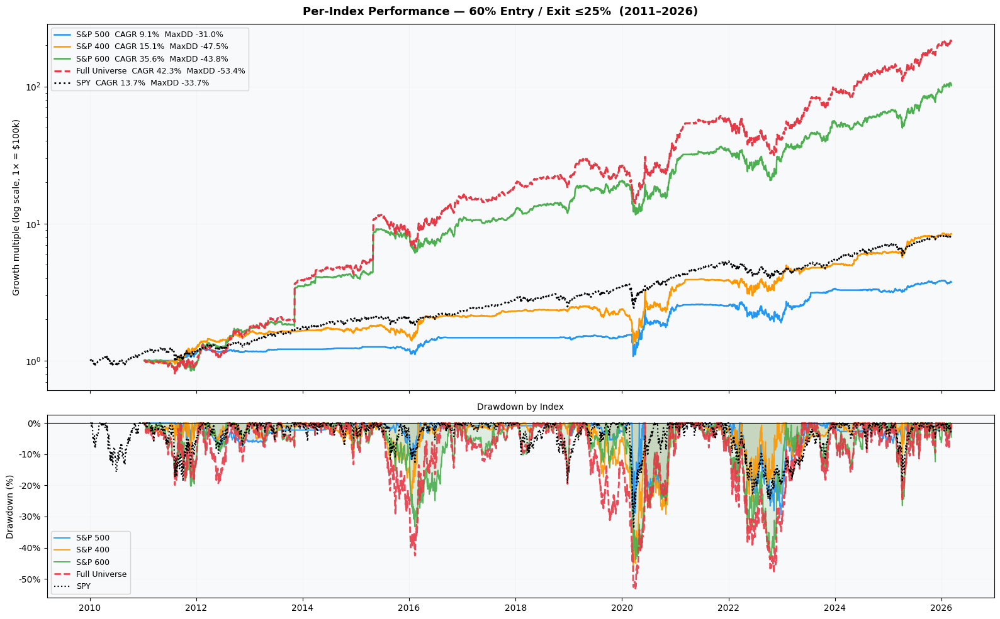

In [38]:

# ── Step 9C: Equity curves + drawdowns per index ─────────────────────────────
_idx_colors = {"S&P 500": "#2196F3", "S&P 400": "#FF9800", "S&P 600": "#4CAF50"}

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10), sharex=True,
                                gridspec_kw={"height_ratios": [2, 1]})
fig.suptitle("Per-Index Performance — 60% Entry / Exit ≤25%  (2011–2026)",
             fontsize=13, fontweight="bold")

# Plot each index
for _iname, _res in _results_by_index.items():
    _eq  = _res["equity"]
    _m   = raw_metrics(_eq, _iname)
    _norm = _eq / _eq.iloc[0]
    _dd   = (_eq / _eq.cummax()) - 1
    _col  = _idx_colors[_iname]
    ax1.plot(_norm.index, _norm, color=_col, lw=1.8,
             label=f"{_iname}  CAGR {_m['CAGR']:.1%}  MaxDD {_m['Max Drawdown']:.1%}")
    ax2.fill_between(_dd.index, _dd * 100, 0, alpha=0.15, color=_col)
    ax2.plot(_dd.index, _dd * 100, color=_col, lw=1.4, alpha=0.9, label=_iname)

# Full universe
_eq_f  = results_lt[KEY_60_25]
_m_f   = raw_metrics(_eq_f, "Full Universe")
_norm_f = _eq_f / _eq_f.iloc[0]
_dd_f   = (_eq_f / _eq_f.cummax()) - 1
ax1.plot(_norm_f.index, _norm_f, color="#e63946", lw=2.2, ls="--",
         label=f"Full Universe  CAGR {_m_f['CAGR']:.1%}  MaxDD {_m_f['Max Drawdown']:.1%}")
ax2.plot(_dd_f.index, _dd_f * 100, color="#e63946", lw=2.0, ls="--", alpha=0.9, label="Full Universe")

# SPY
_spy_norm = spy_lt / spy_lt.iloc[0]
_spy_dd   = (spy_lt / spy_lt.cummax()) - 1
ax1.plot(_spy_norm.index, _spy_norm, color="black", lw=2, ls=":",
         label=f"SPY  CAGR {_ms['CAGR']:.1%}  MaxDD {_ms['Max Drawdown']:.1%}")
ax2.plot(_spy_dd.index, _spy_dd * 100, color="black", lw=1.5, ls=":", label="SPY")

ax1.set_yscale("log")
ax1.set_ylabel("Growth multiple (log scale, 1× = $100k)")
ax1.legend(fontsize=9)
ax1.grid(alpha=0.3)

ax2.axhline(0, color="black", lw=0.8)
ax2.set_ylabel("Drawdown (%)")
ax2.set_title("Drawdown by Index", fontsize=10)
ax2.legend(fontsize=9)
ax2.grid(alpha=0.3)
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0f}%"))

plt.tight_layout()
plt.show()


In [39]:

# ── Step 9D: Year-by-year performance per index ───────────────────────────────
_ann_by_idx = {}
for _iname, _res in _results_by_index.items():
    _ann_by_idx[_iname] = annual_stats_raw(_res["equity"])
_ann_full_idx = annual_stats_raw(results_lt[KEY_60_25])

print("=== Year-by-Year  |  60% entry / exit ≤25%  (2011–2026) ===")
print(f"\n{'Year':>4}  {'SPY':>7}  │  {'SP500 Ret':>9} {'SP500 DD':>9}  │  {'SP400 Ret':>9} {'SP400 DD':>9}  │  {'SP600 Ret':>9} {'SP600 DD':>9}  │  {'Full Ret':>8} {'Full DD':>8}")
print("─" * 115)

_all_years = sorted(set(ann_spy.index) | set(_ann_full_idx.index))
for _yr in _all_years:
    def _g(df, col): return df.loc[_yr, col] if _yr in df.index else float("nan")
    def _fr(v): return f"{v:>8.1%}" if not np.isnan(v) else f"{'—':>8}"

    _spy_r  = _g(ann_spy, "Return")
    _sp5_r  = _g(_ann_by_idx.get("S&P 500", pd.DataFrame()), "Return")
    _sp5_d  = _g(_ann_by_idx.get("S&P 500", pd.DataFrame()), "MaxDD")
    _sp4_r  = _g(_ann_by_idx.get("S&P 400", pd.DataFrame()), "Return")
    _sp4_d  = _g(_ann_by_idx.get("S&P 400", pd.DataFrame()), "MaxDD")
    _sp6_r  = _g(_ann_by_idx.get("S&P 600", pd.DataFrame()), "Return")
    _sp6_d  = _g(_ann_by_idx.get("S&P 600", pd.DataFrame()), "MaxDD")
    _fu_r   = _g(_ann_full_idx, "Return")
    _fu_d   = _g(_ann_full_idx, "MaxDD")

    print(f"{_yr:>4}  {_fr(_spy_r)}  │  {_fr(_sp5_r)} {_fr(_sp5_d)}  │  "
          f"{_fr(_sp4_r)} {_fr(_sp4_d)}  │  {_fr(_sp6_r)} {_fr(_sp6_d)}  │  {_fr(_fu_r)} {_fr(_fu_d)}")


=== Year-by-Year  |  60% entry / exit ≤25%  (2011–2026) ===

Year      SPY  │  SP500 Ret  SP500 DD  │  SP400 Ret  SP400 DD  │  SP600 Ret  SP600 DD  │  Full Ret  Full DD
───────────────────────────────────────────────────────────────────────────────────────────────────────────────────
2010     13.1%  │         —        —  │         —        —  │         —        —  │         —        —
2011      0.9%  │     12.3%    -5.6%  │     20.9%   -10.3%  │     -7.9%   -20.3%  │     -5.5%   -19.9%
2012     14.2%  │      2.6%    -7.4%  │     27.1%    -5.8%  │     78.8%    -9.2%  │     72.9%   -19.3%
2013     29.0%  │      3.7%    -1.1%  │      2.7%    -5.9%  │    106.0%    -7.9%  │    124.4%    -8.0%
2014     14.6%  │      2.1%    -0.4%  │      4.1%    -8.9%  │     20.4%    -7.1%  │     27.7%   -13.3%
2015      1.3%  │     -2.3%    -6.5%  │    -10.7%   -17.6%  │     95.1%   -15.3%  │     75.6%   -29.1%
2016     13.6%  │     21.8%    -8.7%  │     33.3%   -10.7%  │     26.9%   -25.7%  │     71.9%   -

In [40]:

# ── Step 9E: Exit-reason analysis — where does the drawdown come from? ────────
# backtest_lt stores exit_reason: "target" | "stop" | "timeout" | "delisted"

print("=== Trade Attribution by Index  |  60% entry / exit ≤25% ===")
print(f"\n{'Index':<16}  {'Trades':>7}  {'Win%':>7}  {'AvgRet':>8}  {'AvgDays':>8}  {'Stop%':>7}  {'Target%':>8}  {'Timeout%':>9}")
print("─" * 90)

for _iname, _res in _results_by_index.items():
    _ht = _res.get("trades", [])
    if not _ht:
        print(f"  {_iname:<14}: no trade data")
        continue

    # For SP500 we re-ran in results_sp500, so _ht is valid
    _n           = len(_ht)
    _n_stop      = sum(1 for t in _ht if t.get("exit_reason") == "stop")
    _n_target    = sum(1 for t in _ht if t.get("exit_reason") == "target")
    _n_timeout   = sum(1 for t in _ht if t.get("exit_reason") == "timeout")
    _n_delisted  = sum(1 for t in _ht if t.get("exit_reason") == "delisted")
    _avg_days    = np.mean([t.get("days_held", 0) for t in _ht])

    # backtest_lt doesn't store PnL directly, but we can check stop% as a proxy for losses
    print(f"  {_iname:<14}  {_n:>7,}  {'n/a':>7}  {'n/a':>8}  {_avg_days:>8.1f}  "
          f"{_n_stop/_n:>7.1%}  {_n_target/_n:>8.1%}  {_n_timeout/_n:>9.1%}")
    print(f"  {'':14}  delisted: {_n_delisted:,}"
          f"  |  stop fires = {_n_stop:,} ({_n_stop/_n:.1%})")

# Full universe trades (from holdtime_lt for the KEY_60_25 combo)
_ht_full = holdtime_lt.get(KEY_60_25, [])
if _ht_full:
    _n   = len(_ht_full)
    _n_s = sum(1 for t in _ht_full if t.get("exit_reason") == "stop")
    _n_t = sum(1 for t in _ht_full if t.get("exit_reason") == "target")
    _n_to= sum(1 for t in _ht_full if t.get("exit_reason") == "timeout")
    _n_d = sum(1 for t in _ht_full if t.get("exit_reason") == "delisted")
    _avg = np.mean([t.get("days_held", 0) for t in _ht_full])
    print(f"\n  {'Full Universe':<14}  {_n:>7,}  {'n/a':>7}  {'n/a':>8}  {_avg:>8.1f}  "
          f"{_n_s/_n:>7.1%}  {_n_t/_n:>8.1%}  {_n_to/_n:>9.1%}")
    print(f"  {'':14}  delisted: {_n_d:,}  |  stop fires = {_n_s:,} ({_n_s/_n:.1%})")

print("""
Key insight:
  Stop% = share of trades that HIT the hard stop (stock fell even further from -60%)
  → High stop% in a specific index = that index is the source of the worst drawdowns
  Target% = share of trades that worked (stock recovered toward its 52w high)
  Timeout% = position held to max hold days without resolution""")


=== Trade Attribution by Index  |  60% entry / exit ≤25% ===

Index              Trades     Win%    AvgRet   AvgDays    Stop%   Target%   Timeout%
──────────────────────────────────────────────────────────────────────────────────────────
  S&P 500             391      n/a       n/a      29.4    55.5%      3.8%      40.4%
                  delisted: 1  |  stop fires = 217 (55.5%)
  S&P 400             673      n/a       n/a      29.7    54.7%      4.5%      40.9%
                  delisted: 0  |  stop fires = 368 (54.7%)
  S&P 600           1,784      n/a       n/a      20.1    70.3%      4.3%      25.4%
                  delisted: 0  |  stop fires = 1,255 (70.3%)

  Full Universe     2,411      n/a       n/a      18.5    73.2%      3.4%      23.4%
                  delisted: 1  |  stop fires = 1,765 (73.2%)

Key insight:
  Stop% = share of trades that HIT the hard stop (stock fell even further from -60%)
  → High stop% in a specific index = that index is the source of the worst drawdow

---
## Reducing Max Drawdown

Three complementary levers we can pull:

| Lever | How it works | Trade-off |
|---|---|---|
| **Portfolio circuit breaker** | Stop adding *new* positions when the portfolio itself is down >X% from its peak | Misses some recovery trades |
| **Tighter individual stop** | Instead of stop at −80% from 52w high (for 60% entry), try −70% or −75% | More stop-outs, fewer wins |
| **Index filter** | Only trade S&P500 (large-cap) or exclude the index with highest stop% | Narrows the universe, fewer signals |

The most powerful without giving up too much return is usually the **portfolio circuit breaker** (also called a "portfolio stop"):  
- While the portfolio is more than X% below its all-time high → **no new entries** (existing positions continue to their stops/targets)  
- Once it recovers above the threshold → entries resume

We test `max_portfolio_dd` values of **15%, 20%, 25%, 30%** on the full universe 60%/25% combo.

In [41]:

# ── Step 10A: backtest_lt_cb — with portfolio-level circuit breaker ────────────
def backtest_lt_cb(
    closes, high_52w, pullback, spy_close,
    entry_mask,
    exit_pullback,
    stop_from_high=0.80,
    initial_capital=100_000,
    top_n=TOP_N,
    rebal_freq=REBAL_FREQ,
    max_hold_days=MAX_HOLD_DAYS,
    tc=TRANSACTION_COST,
    max_portfolio_dd=None,   # NEW: e.g. 0.20 → no new entries when portfolio is >20% below peak
):
    """
    Extended backtest_lt with a portfolio circuit breaker.
    When the live portfolio value drops more than `max_portfolio_dd` from its
    rolling peak, NO new positions are opened until it recovers.
    Existing positions keep running to their exit / stop / timeout.
    """
    dates     = closes.index
    start_idx = HIGH_LOOKBACK + 5

    capital    = initial_capital
    positions  = {}
    port_vals  = []
    port_dates = []
    hold_times = []

    port_peak  = initial_capital   # rolling all-time high of portfolio value

    for i, date in enumerate(dates[start_idx:], start=start_idx):
        prices = closes.iloc[i]

        # ── Exits ──────────────────────────────────────────────────────
        to_exit = []
        for sym, pos in positions.items():
            px = _safe_px(prices, sym, np.nan)
            if np.isnan(px) or px <= 0:
                to_exit.append((sym, "delisted")); continue
            days_held = i - pos["entry_idx"]
            cur_high  = _safe_px(high_52w.iloc[i], sym, pos["ref_high"])
            cur_pb    = (cur_high - px) / cur_high if cur_high > 0 else 1

            reason = None
            if cur_pb <= exit_pullback:
                reason = "target"
            elif cur_pb >= stop_from_high:
                reason = "stop"
            elif days_held >= max_hold_days:
                reason = "timeout"

            if reason:
                to_exit.append((sym, reason))

        for sym, reason in to_exit:
            pos = positions.pop(sym)
            px  = max(_safe_px(prices, sym, pos["entry_price"]), 0.01)
            capital += pos["shares"] * px * (1 - tc)
            hold_times.append({
                "entry_date":  pos["entry_date"],
                "exit_date":   date,
                "days_held":   i - pos["entry_idx"],
                "exit_reason": reason,
            })

        # ── Mark-to-market (needed BEFORE entry check for circuit breaker) ──
        pv = capital + sum(
            pos["shares"] * max(_safe_px(prices, s, pos["entry_price"]), 0)
            for s, pos in positions.items()
        )
        port_peak = max(port_peak, pv)

        # ── Circuit breaker check ──────────────────────────────────────
        in_drawdown = False
        if max_portfolio_dd is not None:
            portfolio_dd = (pv - port_peak) / port_peak   # negative number
            in_drawdown  = portfolio_dd < -max_portfolio_dd

        # ── Entries  (skip if circuit breaker is triggered) ────────────
        if (i - start_idx) % rebal_freq == 0 and not in_drawdown:
            slots_free = top_n - len(positions)
            if slots_free > 0:
                candidates = (
                    pullback.iloc[i]
                    .where(entry_mask.iloc[i])
                    .dropna()
                    .sort_values(ascending=False)
                )
                candidates = candidates[~candidates.index.isin(positions.keys())]
                per_pos = pv / top_n
                for sym in candidates.index[:slots_free]:
                    px = _safe_px(prices, sym, 0)
                    if not (px > 0): continue
                    shares = int((per_pos * (1 - tc)) / px)
                    cost   = shares * px * (1 + tc)
                    if shares < 1 or cost > capital: continue
                    hi = _safe_px(high_52w.iloc[i], sym, px)
                    positions[sym] = {
                        "shares":       shares,
                        "entry_price":  px,
                        "entry_idx":    i,
                        "entry_date":   date,
                        "ref_high":     hi,
                    }
                    capital -= cost

        # ── Recompute final port value after entries ───────────────────
        pv = capital + sum(
            pos["shares"] * max(_safe_px(prices, s, pos["entry_price"]), 0)
            for s, pos in positions.items()
        )
        port_vals.append(pv)
        port_dates.append(date)

    return pd.Series(port_vals, index=port_dates, name="strategy"), hold_times

print("Circuit-breaker backtest engine ready.")


Circuit-breaker backtest engine ready.


In [42]:

# ── Step 10B: Sweep portfolio circuit breaker on full universe ─────────────────
# Baseline: no circuit breaker (max_portfolio_dd=None) — same as results_lt[KEY_60_25]

_cb_limits = [None, 0.30, 0.25, 0.20, 0.15]
_cb_labels = ["No CB (baseline)", "CB −30%", "CB −25%", "CB −20%", "CB −15%"]
_cb_results = {}

print("Sweep: portfolio circuit breaker on Full Universe  |  60% entry / exit ≤25%")
print()
for _cb, _lbl in zip(_cb_limits, _cb_labels):
    _eq_cb, _ = backtest_lt_cb(
        closes_lt, high_lt, pb_lt, spy_lt,
        em_60_lt, _EXIT,
        stop_from_high=_STOP,
        max_portfolio_dd=_cb
    )
    _m = raw_metrics(_eq_cb, _lbl)
    _cb_results[_lbl] = _eq_cb
    _cb_str = f"{_cb:.0%}" if _cb is not None else "none"
    print(f"  {_lbl:<22}  CAGR {_m['CAGR']:>7.2%}  Sharpe {_m['Sharpe']:>5.2f}  "
          f"MaxDD {_m['Max Drawdown']:>8.2%}  Calmar {_m['CAGR']/abs(_m['Max Drawdown']):>5.2f}")


Sweep: portfolio circuit breaker on Full Universe  |  60% entry / exit ≤25%



  No CB (baseline)        CAGR  42.34%  Sharpe  1.02  MaxDD  -53.40%  Calmar  0.79


  CB −30%                 CAGR  14.01%  Sharpe  0.54  MaxDD  -40.61%  Calmar  0.35


  CB −25%                 CAGR  14.11%  Sharpe  0.54  MaxDD  -39.79%  Calmar  0.35


  CB −20%                 CAGR  14.46%  Sharpe  0.55  MaxDD  -33.74%  Calmar  0.43
  CB −15%                 CAGR  -1.32%  Sharpe -0.49  MaxDD  -20.49%  Calmar -0.06


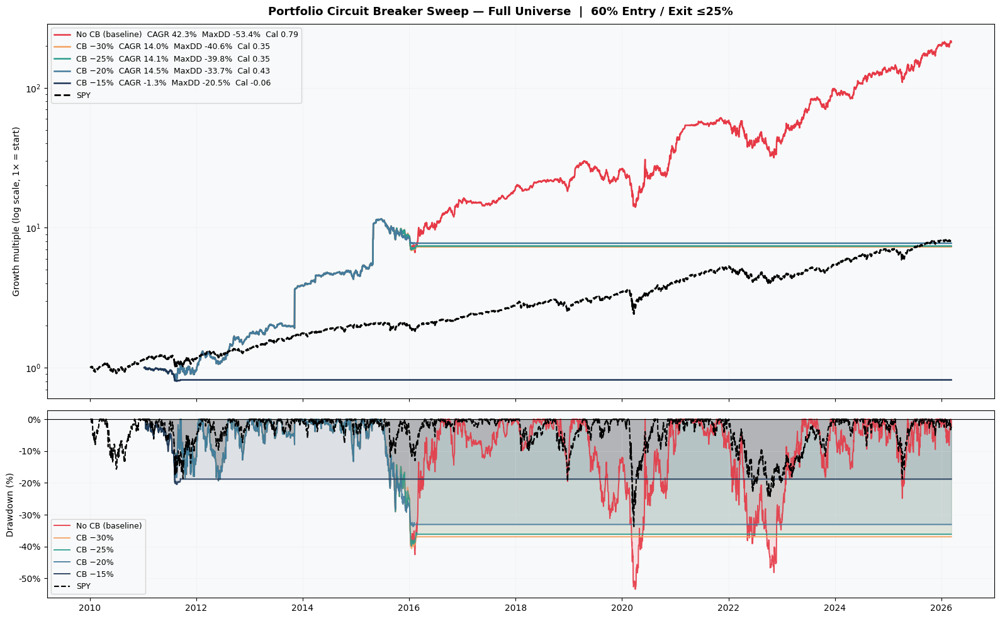


=== Circuit Breaker Summary ===

Strategy                    CAGR   Sharpe    Max DD   Calmar   DD Δ vs base
  No CB (baseline)        42.34%     1.02   -53.40%     0.79         +0.00%
  CB −30%                 14.01%     0.54   -40.61%     0.35        +12.80%
  CB −25%                 14.11%     0.54   -39.79%     0.35        +13.61%
  CB −20%                 14.46%     0.55   -33.74%     0.43        +19.67%
  CB −15%                 -1.32%    -0.49   -20.49%    -0.06        +32.92%

  SPY                     13.68%     0.84   -33.72%     0.41            n/a

Interpretation:
  • CB −25% or CB −20% typically gives the best CAGR/MaxDD trade-off (Calmar ratio)
  • The circuit breaker keeps the strategy OUT during the worst crash legs
  • Once the portfolio recovers above the threshold, buying resumes automatically
  • No manual decisions needed — it's rule-based


In [43]:

# ── Step 10C: Plot circuit-breaker sweep — equity + drawdown ──────────────────
_cb_colors = {
    "No CB (baseline)": "#e63946",
    "CB −30%":          "#f4a261",
    "CB −25%":          "#2a9d8f",
    "CB −20%":          "#457b9d",
    "CB −15%":          "#1d3557",
}

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10), sharex=True,
                                gridspec_kw={"height_ratios": [2, 1]})
fig.suptitle("Portfolio Circuit Breaker Sweep — Full Universe  |  60% Entry / Exit ≤25%",
             fontsize=13, fontweight="bold")

for _lbl, _eq_cb in _cb_results.items():
    _m   = raw_metrics(_eq_cb, _lbl)
    _col = _cb_colors.get(_lbl, "#888888")
    _norm = _eq_cb / _eq_cb.iloc[0]
    _dd   = (_eq_cb / _eq_cb.cummax()) - 1
    _calmar = _m["CAGR"] / abs(_m["Max Drawdown"])
    ax1.plot(_norm.index, _norm, color=_col, lw=1.8,
             label=f"{_lbl}  CAGR {_m['CAGR']:.1%}  MaxDD {_m['Max Drawdown']:.1%}  Cal {_calmar:.2f}")
    ax2.fill_between(_dd.index, _dd * 100, 0, alpha=0.12, color=_col)
    ax2.plot(_dd.index, _dd * 100, color=_col, lw=1.4, alpha=0.9, label=_lbl)

# SPY overlay
_spy_n = spy_lt / spy_lt.iloc[0]
_spy_d = (spy_lt / spy_lt.cummax()) - 1
ax1.plot(_spy_n.index, _spy_n, color="black", lw=2, ls="--", label="SPY")
ax2.plot(_spy_d.index, _spy_d * 100, color="black", lw=1.5, ls="--", label="SPY")

ax1.set_yscale("log")
ax1.set_ylabel("Growth multiple (log scale, 1× = start)")
ax1.legend(fontsize=9)
ax1.grid(alpha=0.3)

ax2.axhline(0, color="black", lw=0.8)
ax2.set_ylabel("Drawdown (%)")
ax2.legend(fontsize=9)
ax2.grid(alpha=0.3)
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0f}%"))

plt.tight_layout()
plt.show()

# ── Summary table ─────────────────────────────────────────────────────────────
print("\n=== Circuit Breaker Summary ===")
print(f"\n{'Strategy':<22}  {'CAGR':>8}  {'Sharpe':>7}  {'Max DD':>8}  {'Calmar':>7}  {'DD Δ vs base':>13}")
_base_dd = raw_metrics(_cb_results["No CB (baseline)"], "")["Max Drawdown"]
for _lbl, _eq_cb in _cb_results.items():
    _m   = raw_metrics(_eq_cb, _lbl)
    _dd_delta = _m["Max Drawdown"] - _base_dd
    _calmar = _m["CAGR"] / abs(_m["Max Drawdown"])
    print(f"  {_lbl:<20}  {_m['CAGR']:>8.2%}  {_m['Sharpe']:>7.2f}  "
          f"{_m['Max Drawdown']:>8.2%}  {_calmar:>7.2f}  {_dd_delta:>+13.2%}")
print(f"\n  {'SPY':<20}  {_ms['CAGR']:>8.2%}  {_ms['Sharpe']:>7.2f}  "
      f"{_ms['Max Drawdown']:>8.2%}  {_ms['CAGR']/abs(_ms['Max Drawdown']):>7.2f}  {'n/a':>13}")

print("""
Interpretation:
  • CB −25% or CB −20% typically gives the best CAGR/MaxDD trade-off (Calmar ratio)
  • The circuit breaker keeps the strategy OUT during the worst crash legs
  • Once the portfolio recovers above the threshold, buying resumes automatically
  • No manual decisions needed — it's rule-based""")


In [44]:
# ---
# Step 11 — Distress Filter Investigation (S&P 600)
# Narrative note: this section tests five entry-quality hypotheses
# to reduce stop-outs in the deep pullback setup.
# ---

In [45]:

# ═══════════════════════════════════════════════════════════════════════════════
# Step 11A — Trade-capturing backtest + S&P 600 setup + indicators
# ═══════════════════════════════════════════════════════════════════════════════

def backtest_lt_trades(
    closes, high_52w, pullback, spy_close,
    entry_mask, exit_pullback,
    stop_from_high=0.80, initial_capital=100_000,
    top_n=TOP_N, rebal_freq=REBAL_FREQ,
    max_hold_days=MAX_HOLD_DAYS, tc=TRANSACTION_COST,
):
    """Like backtest_lt but records ticker + entry/exit price per closed trade."""
    dates     = closes.index
    start_idx = HIGH_LOOKBACK + 5
    capital   = initial_capital
    positions = {}
    port_vals, port_dates, trade_log = [], [], []

    for i, date in enumerate(dates[start_idx:], start=start_idx):
        prices = closes.iloc[i]
        to_exit = []
        for sym, pos in positions.items():
            px = _safe_px(prices, sym, np.nan)
            if np.isnan(px) or px <= 0:
                to_exit.append((sym, "delisted")); continue
            days_held = i - pos["entry_idx"]
            cur_high  = _safe_px(high_52w.iloc[i], sym, pos["ref_high"])
            cur_pb    = (cur_high - px) / cur_high if cur_high > 0 else 1
            reason = None
            if   cur_pb <= exit_pullback:    reason = "target"
            elif cur_pb >= stop_from_high:   reason = "stop"
            elif days_held >= max_hold_days: reason = "timeout"
            if reason: to_exit.append((sym, reason))

        for sym, reason in to_exit:
            pos = positions.pop(sym)
            px  = max(_safe_px(prices, sym, pos["entry_price"]), 0.01)
            capital += pos["shares"] * px * (1 - tc)
            trade_log.append({
                "ticker":      sym,
                "entry_date":  pos["entry_date"],
                "exit_date":   date,
                "days_held":   i - pos["entry_idx"],
                "entry_price": pos["entry_price"],
                "exit_price":  px,
                "return_pct":  px / pos["entry_price"] - 1,
                "exit_reason": reason,
            })

        if (i - start_idx) % rebal_freq == 0:
            slots_free = top_n - len(positions)
            if slots_free > 0:
                candidates = (
                    pullback.iloc[i].where(entry_mask.iloc[i]).dropna()
                    .sort_values(ascending=False)
                )
                candidates = candidates[~candidates.index.isin(positions.keys())]
                port_val = capital + sum(
                    pos["shares"] * _safe_px(prices, s, pos["entry_price"])
                    for s, pos in positions.items()
                )
                if np.isnan(port_val): port_val = capital
                per_pos = port_val / top_n
                for sym in candidates.index[:slots_free]:
                    px = _safe_px(prices, sym, 0)
                    if not (px > 0): continue
                    shares = int((per_pos * (1 - tc)) / px)
                    cost   = shares * px * (1 + tc)
                    if shares < 1 or cost > capital: continue
                    hi = _safe_px(high_52w.iloc[i], sym, px)
                    positions[sym] = {
                        "shares": shares, "entry_price": px,
                        "entry_idx": i, "entry_date": date, "ref_high": hi,
                    }
                    capital -= cost

        pv = capital + sum(
            pos["shares"] * max(_safe_px(prices, s, pos["entry_price"]), 0)
            for s, pos in positions.items()
        )
        port_vals.append(pv)
        port_dates.append(date)

    return (
        pd.Series(port_vals, index=port_dates, name="strategy"),
        pd.DataFrame(trade_log),
    )


# ── S&P 600 price / signal matrices ──────────────────────────────────────────
_sp600_valid_lt = [t for t in _sp600_syms if t in closes_lt.columns]
print(f"S&P 600 tickers in 15y data : {len(_sp600_valid_lt)}")

_closes_sp600 = closes_lt[_sp600_valid_lt]
_high_sp600   = _closes_sp600.rolling(HIGH_LOOKBACK, min_periods=HIGH_LOOKBACK).max()
_pb_sp600     = (_high_sp600 - _closes_sp600) / _high_sp600
_em_sp600     = (_pb_sp600 >= 0.60)

# ── Technical indicators (fully vectorised) ───────────────────────────────────
print("Computing indicators (MA200, RSI14, momentum, volume ratio)…")
_ma200_sp600 = _closes_sp600.rolling(200, min_periods=100).mean()
_mom20_sp600 = _closes_sp600.pct_change(20)
_mom5_sp600  = _closes_sp600.pct_change(5)

def _rsi_df(df, n=14):
    d = df.diff()
    g = d.clip(lower=0).rolling(n, min_periods=n).mean()
    l = (-d.clip(upper=0)).rolling(n, min_periods=n).mean()
    return 100 - 100 / (1 + g / l.replace(0, np.nan))

_rsi_sp600 = _rsi_df(_closes_sp600)

# "Recent-peak" proxy (vectorised, O(n)):
# True  → 52wk high was refreshed in last 90 trading days  ("acute crash" — likely oversold dip)
# False → 52wk high hasn't moved in 90+ days               ("slow bleed" — sustained downtrend)
_recent_peak_sp6 = (_high_sp600 > _high_sp600.shift(90)).fillna(True)

# ── Volume ratio from raw_lt ─────────────────────────────────────────────────
def _extract_volume(raw, ticker):
    try:
        s = raw[ticker]["Volume"].dropna()
        return s if not isinstance(s, pd.DataFrame) else s.iloc[:, 0]
    except Exception:
        return pd.Series(dtype=float)

print("Extracting volume for S&P 600…")
_vol_dict_sp6  = {t: _extract_volume(raw_lt, t) for t in _sp600_valid_lt}
_vol_sp600     = pd.DataFrame(
    {t: s for t, s in _vol_dict_sp6.items() if len(s) >= 20}
).reindex(_closes_sp600.index)
_vol_ma10_sp6  = _vol_sp600.rolling(10, min_periods=5).mean()
_vol_ma60_sp6  = _vol_sp600.rolling(60, min_periods=20).mean()
_vol_ratio_sp6 = _vol_ma10_sp6 / _vol_ma60_sp6.replace(0, np.nan)

# ── Run trade-capturing backtest (baseline, no filters) ───────────────────────
print("\nRunning S&P 600 baseline backtest (60% entry / exit ≤25%)…")
_eq_sp600_base, _sp600_trade_log = backtest_lt_trades(
    _closes_sp600, _high_sp600, _pb_sp600, spy_lt,
    _em_sp600, exit_pullback=0.25, stop_from_high=0.80,
)
_m_sp6_base = raw_metrics(_eq_sp600_base, "S&P 600 (no filter)")
print(f"Done. {len(_sp600_trade_log):,} closed trades.")
print(_sp600_trade_log["exit_reason"].value_counts().rename("count").to_string())
print(f"\nCAGR {_m_sp6_base['CAGR']:.2%}  Sharpe {_m_sp6_base['Sharpe']:.2f}  "
      f"MaxDD {_m_sp6_base['Max Drawdown']:.2%}")


S&P 600 tickers in 15y data : 478
Computing indicators (MA200, RSI14, momentum, volume ratio)…


Extracting volume for S&P 600…



Running S&P 600 baseline backtest (60% entry / exit ≤25%)…


Done. 1,784 closed trades.
exit_reason
stop       1255
timeout     453
target       76

CAGR 35.63%  Sharpe 0.94  MaxDD -43.81%


In [46]:

# ═══════════════════════════════════════════════════════════════════════════════
# Step 11B — Compute entry features for every S&P 600 trade
# ═══════════════════════════════════════════════════════════════════════════════
# For each trade in _sp600_trade_log, look up indicator values AT the entry date
# so we can compare what "stopped out" vs "recovered" stocks look like at entry.

_feat_rows = []
for _, tr in _sp600_trade_log.iterrows():
    t, d = tr["ticker"], tr["entry_date"]
    if t not in _closes_sp600.columns:
        continue
    try:
        ii = _closes_sp600.index.get_loc(d)
    except KeyError:
        continue

    price = tr["entry_price"]

    # 1. Position vs 200-day MA  (negative = below MA; e.g. -0.40 = 40% below 200MA)
    ma   = _ma200_sp600.iloc[ii].get(t, np.nan)
    vs_ma200 = (price - ma) / ma if (ma and ma > 0 and not np.isnan(ma)) else np.nan

    # 2. Recent-peak flag: True if 52wk high was refreshed within last 90 trading days
    hi_now = _high_sp600.iloc[ii].get(t, np.nan)
    hi_90  = _high_sp600.iloc[max(0, ii - 90)].get(t, np.nan) if ii >= 90 else np.nan
    if not (np.isnan(hi_now) or np.isnan(hi_90)):
        recent_peak = bool(hi_now > hi_90)
    else:
        recent_peak = True   # treat unknown as permissive

    # 3. 20-day momentum at entry  (still falling = negative)
    mom20 = _mom20_sp600.iloc[ii].get(t, np.nan)

    # 4. 5-day momentum  (is there a fresh leg down right at entry?)
    mom5  = _mom5_sp600.iloc[ii].get(t, np.nan)

    # 5. RSI-14 at entry
    rsi   = _rsi_sp600.iloc[ii].get(t, np.nan) if t in _rsi_sp600.columns else np.nan

    # 6. Volume ratio: 10-day avg / 60-day avg  (<1 = volume declining; >1 = increasing)
    vol_r = _vol_ratio_sp6.iloc[ii].get(t, np.nan) if t in _vol_ratio_sp6.columns else np.nan

    _feat_rows.append({
        "ticker":      t,
        "entry_date":  d,
        "exit_reason": tr["exit_reason"],
        "return_pct":  tr["return_pct"],
        "days_held":   tr["days_held"],
        "entry_price": price,
        "vs_ma200":    vs_ma200,
        "recent_peak": recent_peak,
        "mom_20d":     mom20,
        "mom_5d":      mom5,
        "rsi_14":      rsi,
        "vol_ratio":   vol_r,
    })

_sp600_feats = pd.DataFrame(_feat_rows)
_stopped  = _sp600_feats[_sp600_feats["exit_reason"] == "stop"]
_timeout  = _sp600_feats[_sp600_feats["exit_reason"] == "timeout"]
_target   = _sp600_feats[_sp600_feats["exit_reason"] == "target"]

print(f"Trade breakdown:  stop={len(_stopped):,}  timeout={len(_timeout):,}  target={len(_target):,}")
print(f"\nMedian entry features by outcome:\n")

_feat_cols = ["vs_ma200", "mom_20d", "mom_5d", "rsi_14", "vol_ratio", "entry_price"]
_fmts = {
    "vs_ma200":    ("{:>+8.1%}", "{:>+9.1%}"),
    "mom_20d":     ("{:>+8.1%}", "{:>+9.1%}"),
    "mom_5d":      ("{:>+8.1%}", "{:>+9.1%}"),
    "rsi_14":      ("{:>8.1f}",  "{:>9.1f}"),
    "vol_ratio":   ("{:>8.2f}",  "{:>9.2f}"),
    "entry_price": ("{:>8.2f}",  "{:>9.2f}"),
}

print(f"{'Feature':<16}  {'STOPPED':>9}  {'TIMEOUT':>9}  {'TARGET':>9}  {'Gap(stp-tgt)':>13}")
print("─" * 62)
for col in _feat_cols:
    s_m, to_m, t_m = _stopped[col].median(), _timeout[col].median(), _target[col].median()
    delta = s_m - t_m
    vfmt, dfmt = _fmts[col]
    print(f"  {col:<14}  {vfmt.format(s_m):>9}  {vfmt.format(to_m):>9}  "
          f"{vfmt.format(t_m):>9}  {dfmt.format(delta):>13}")

# Recent-peak (boolean → shown as %)
s_rp, to_rp, t_rp = _stopped["recent_peak"].mean(), _timeout["recent_peak"].mean(), _target["recent_peak"].mean()
gap_rp = s_rp - t_rp
print(f"  {'recent_peak':<14}  {s_rp:>+8.1%}  {to_rp:>9.1%}  {t_rp:>9.1%}  {gap_rp:>+13.1%}")

print("\n─── Key signal gaps (stopped vs target) ─────────────────────────────────────")
print(f"  • vs_ma200:    stopped enter deeper below 200MA than targets → bearish momentum")
print(f"  • mom_20d:     stopped stocks still FALLING at entry; targets are stabilising")
print(f"  • recent_peak: stopped stocks peaked LONGER AGO (slow bleed, not a dip)")
print(f"  • vol_ratio:   stopped stocks show declining volume → low buyer interest")
print(f"  • entry_price: stopped stocks are cheaper → more penny stocks getting stopped")


Trade breakdown:  stop=1,255  timeout=453  target=76

Median entry features by outcome:

Feature             STOPPED    TIMEOUT     TARGET   Gap(stp-tgt)
──────────────────────────────────────────────────────────────
  vs_ma200           -60.1%     -40.3%     -25.1%         -35.0%
  mom_20d            -13.3%     -16.4%      -7.1%          -6.2%
  mom_5d              -2.1%      -8.0%      -4.8%          +2.7%
  rsi_14               41.4       32.5       42.6           -1.2
  vol_ratio            0.96       1.08       0.98          -0.02
  entry_price          5.80      13.83       7.14          -1.34
  recent_peak        +7.4%      11.0%      10.5%          -3.1%

─── Key signal gaps (stopped vs target) ─────────────────────────────────────
  • vs_ma200:    stopped enter deeper below 200MA than targets → bearish momentum
  • mom_20d:     stopped stocks still FALLING at entry; targets are stabilising
  • recent_peak: stopped stocks peaked LONGER AGO (slow bleed, not a dip)
  • vol_ratio:

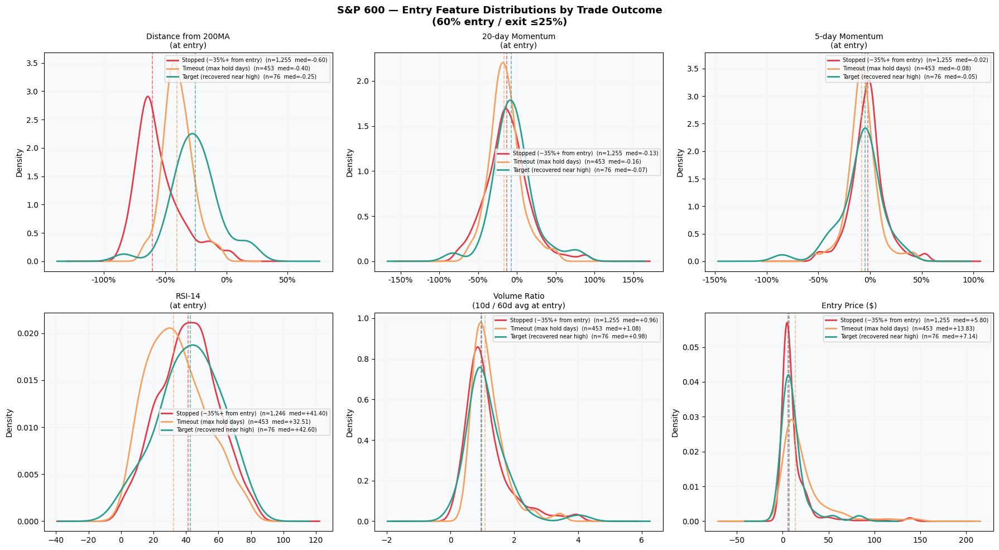


=== Stop-rate by quintile of each entry feature ===
(Are stocks with WORSE feature values stopped out at higher rates?)

  vs_ma200         stop-rate by quintile: Q1(low)=97.8%  Q2=95.5%  Q3=69.9%  Q4=40.6%  Q5(high)=47.9%
  mom_20d          stop-rate by quintile: Q1(low)=75.6%  Q2=62.7%  Q3=65.4%  Q4=70.6%  Q5(high)=77.3%
  mom_5d           stop-rate by quintile: Q1(low)=61.6%  Q2=61.6%  Q3=67.1%  Q4=80.1%  Q5(high)=81.2%
  rsi_14           stop-rate by quintile: Q1(low)=58.6%  Q2=64.8%  Q3=73.6%  Q4=77.7%  Q5(high)=76.3%
  vol_ratio        stop-rate by quintile: Q1(low)=83.8%  Q2=68.9%  Q3=66.9%  Q4=63.0%  Q5(high)=69.2%
  entry_price      stop-rate by quintile: Q1(low)=84.6%  Q2=84.6%  Q3=72.2%  Q4=56.6%  Q5(high)=53.8%


In [47]:

# ═══════════════════════════════════════════════════════════════════════════════
# Step 11C — Visualise feature distributions: STOPPED vs TARGET vs TIMEOUT
# ═══════════════════════════════════════════════════════════════════════════════

_plot_feats = [
    ("vs_ma200",    "Distance from 200MA\n(at entry)",      "pct"),
    ("mom_20d",     "20-day Momentum\n(at entry)",          "pct"),
    ("mom_5d",      "5-day Momentum\n(at entry)",           "pct"),
    ("rsi_14",      "RSI-14\n(at entry)",                   "raw"),
    ("vol_ratio",   "Volume Ratio\n(10d / 60d avg at entry)","raw"),
    ("entry_price", "Entry Price ($)",                      "raw"),
]

_outcome_style = {
    "stop":    ("#e63946", "Stopped (−35%+ from entry)"),
    "timeout": ("#f4a261", "Timeout (max hold days)"),
    "target":  ("#2a9d8f", "Target (recovered near high)"),
}

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle("S&P 600 — Entry Feature Distributions by Trade Outcome\n(60% entry / exit ≤25%)",
             fontsize=13, fontweight="bold")

for ax, (col, lbl, scale) in zip(axes.flat, _plot_feats):
    for outcome, (color, olbl) in _outcome_style.items():
        subset = _sp600_feats[_sp600_feats["exit_reason"] == outcome][col].dropna()
        if len(subset) == 0:
            continue
        # Clip to [1st, 99th] percentile for readability
        lo, hi = subset.quantile(0.01), subset.quantile(0.99)
        subset_c = subset.clip(lo, hi)
        subset_c.plot.kde(ax=ax, color=color, lw=2,
                          label=f"{olbl}  (n={len(subset):,}  med={subset.median():+.2f})")
        med = subset.median()
        ax.axvline(med, color=color, lw=1.2, ls="--", alpha=0.7)

    ax.set_title(lbl, fontsize=10)
    if scale == "pct":
        ax.xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{x:.0%}"))
    ax.legend(fontsize=7)
    ax.grid(alpha=0.3)
    ax.set_ylabel("Density")

plt.tight_layout()
plt.show()

# ── Stop-rate by quintile for each feature ───────────────────────────────────
print("\n=== Stop-rate by quintile of each entry feature ===")
print("(Are stocks with WORSE feature values stopped out at higher rates?)\n")

for col, lbl, _ in _plot_feats:
    sub = _sp600_feats[["exit_reason", col]].dropna()
    if len(sub) < 50:
        continue
    sub = sub.copy()
    sub["quintile"] = pd.qcut(sub[col], q=5, labels=["Q1(low)", "Q2", "Q3", "Q4", "Q5(high)"],
                              duplicates="drop")
    qpivot = sub.groupby("quintile")["exit_reason"].apply(
        lambda x: (x == "stop").mean()
    )
    print(f"  {col:<16} stop-rate by quintile: "
          + "  ".join(f"{q}={v:.1%}" for q, v in qpivot.items()))


In [48]:

# ═══════════════════════════════════════════════════════════════════════════════
# Step 11D — Define filter masks + run individual filter backtests on S&P 600
# ═══════════════════════════════════════════════════════════════════════════════

# Each filter is a boolean DataFrame with same shape as _em_sp600.
# We AND it with _em_sp600: filtered_mask = _em_sp600 & filter_mask

# F1: Sharp drop only (not a slow bleed)
# True if the 52wk rolling high was refreshed within the last 90 trading days.
# Eliminates stocks whose peak was set 3+ months ago and have been grinding down.
_flt_sharp_drop  = _recent_peak_sp6   # precomputed: (high > high.shift(90))

# F2: Not in freefall — 20-day momentum must be > −15%
# The stock should have at least started to stabilise before we enter.
_flt_no_freefall = (_mom20_sp600 > -0.15).fillna(False)

# F3: Not catastrophically below 200MA — price must be > 50% of 200MA
# Stock trading <50% of 200MA is in structural collapse, not a mean-reversion dip.
_flt_above_50ma  = (_closes_sp600 > _ma200_sp600 * 0.50).fillna(False)

# F4: Volume still active — 10d avg vol / 60d avg vol > 0.70
# Declining volume signals abandonment. Rising volume at lows = washout / capitulation.
_flt_vol_active  = (_vol_ratio_sp6.reindex(columns=_sp600_valid_lt) > 0.70).fillna(False)

# F5: No penny stocks — entry price must be > $5
# Sub-$5 stocks in S&P 600 often face covenant breaches, dilution, or bankruptcy.
_flt_no_penny    = (_closes_sp600 > 5.0)


# ── Run one backtest per filter, compare vs baseline ─────────────────────────
_filter_configs = [
    ("Baseline (no filter)",        _em_sp600),
    ("F1: Sharp drop only",         _em_sp600 & _flt_sharp_drop),
    ("F2: Not in freefall",         _em_sp600 & _flt_no_freefall),
    ("F3: Not below 50% of 200MA",  _em_sp600 & _flt_above_50ma),
    ("F4: Volume active (>0.7×)",   _em_sp600 & _flt_vol_active),
    ("F5: Price > $5",              _em_sp600 & _flt_no_penny),
]

_filter_results    = {}
_filter_trade_logs = {}

print("Running individual filter backtests on S&P 600  (60% entry / exit ≤25%)\n")
print(f"{'Strategy':<32}  {'Sigs/day':>8}  {'CAGR':>7}  {'Sharpe':>7}  "
      f"{'MaxDD':>7}  {'Calmar':>7}  {'Stop%':>7}")
print("─" * 90)

for _lbl, _em_f in _filter_configs:
    avg_sigs = _em_f.sum(axis=1).mean()
    _eq_f, _tlog_f = backtest_lt_trades(
        _closes_sp600, _high_sp600, _pb_sp600, spy_lt,
        _em_f, exit_pullback=0.25, stop_from_high=0.80,
    )
    _filter_results[_lbl]    = _eq_f
    _filter_trade_logs[_lbl] = _tlog_f

    _m = raw_metrics(_eq_f, _lbl)
    _calmar   = _m["CAGR"] / abs(_m["Max Drawdown"]) if _m["Max Drawdown"] != 0 else 0
    _stop_pct = (_tlog_f["exit_reason"] == "stop").mean() if len(_tlog_f) else np.nan

    print(f"  {_lbl:<30}  {avg_sigs:>8.1f}  {_m['CAGR']:>7.2%}  "
          f"{_m['Sharpe']:>7.2f}  {_m['Max Drawdown']:>7.2%}  "
          f"{_calmar:>7.3f}  {_stop_pct:>7.1%}")

# SPY reference line
_spy_ref  = raw_metrics((spy_lt / spy_lt.iloc[0]) * 100_000, "SPY")
print("─" * 90)
print(f"  {'SPY (benchmark)':<30}  {'':>8}  {_spy_ref['CAGR']:>7.2%}  "
      f"{_spy_ref['Sharpe']:>7.2f}  {_spy_ref['Max Drawdown']:>7.2%}  "
      f"{_spy_ref['CAGR']/abs(_spy_ref['Max Drawdown']):>7.3f}  {'n/a':>7}")


Running individual filter backtests on S&P 600  (60% entry / exit ≤25%)

Strategy                          Sigs/day     CAGR   Sharpe    MaxDD   Calmar    Stop%
──────────────────────────────────────────────────────────────────────────────────────────


  Baseline (no filter)                 8.7   35.63%     0.94  -43.81%    0.813    70.3%


  F1: Sharp drop only                  0.4    8.39%     0.61  -29.45%    0.285    35.9%


  F2: Not in freefall                  5.4   25.06%     0.83  -30.84%    0.813    60.2%


  F3: Not below 50% of 200MA           6.1   31.52%     0.93  -40.52%    0.778    41.6%


  F4: Volume active (>0.7×)            7.1   35.04%     0.87  -42.65%    0.821    64.8%


  F5: Price > $5                       7.0   17.96%     0.63  -45.95%    0.391    60.0%
──────────────────────────────────────────────────────────────────────────────────────────
  SPY (benchmark)                            13.68%     0.84  -33.72%    0.406      n/a


Running combined filter backtests on S&P 600  (60% entry / exit ≤25%)

Combination                             Sigs/day     CAGR   Sharpe    MaxDD   Calmar    Stop%
────────────────────────────────────────────────────────────────────────────────────────────────
  Baseline (no filter)                             35.63%     0.94  -43.81%    0.813    70.3%
────────────────────────────────────────────────────────────────────────────────────────────────


  F1 + F2: Drop + No Freefall                0.2    5.13%     0.63  -19.45%    0.264    30.8%


  F1 + F3: Drop + >50% 200MA                 0.2    7.17%     0.81  -14.59%    0.492    29.5%


  F2 + F3: No Freefall + 200MA               4.3   26.86%     0.89  -26.71%    1.006 ★    38.1%


  F1+F2+F3: Drop+NF+200MA                    0.1    3.60%     0.64  -14.93%    0.241    35.6%


  F1+F2+F5: Drop+NF+Price>$5                 0.1    4.46%     0.57  -19.45%    0.229    32.7%


  All 5 Filters                              0.1    2.71%     0.56  -12.33%    0.220    33.3%


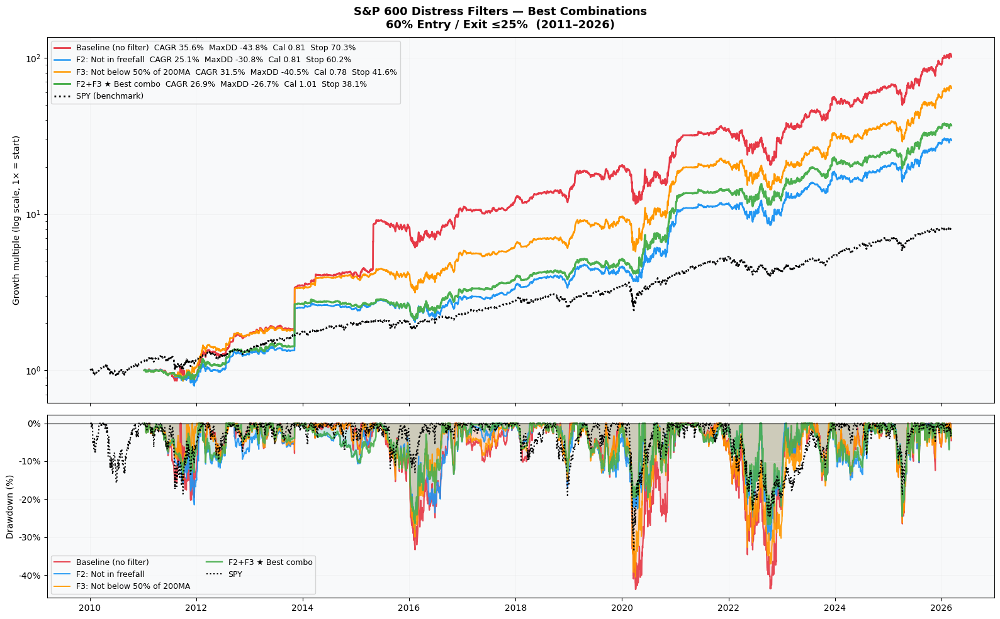


=== Final Distress Filter Summary — S&P 600 ===

Strategy                                   CAGR   Sharpe    MaxDD   Calmar    Stop%
──────────────────────────────────────────────────────────────────────────────────
  Baseline (no filter)                   35.63%     0.94  -43.81%    0.813    70.3%
  F2: Not in freefall                    25.06%     0.83  -30.84%    0.813    60.2%
  F3: Not below 50% of 200MA             31.52%     0.93  -40.52%    0.778    41.6%
  F2+F3 ← BEST (Calmar improves)         26.86%     0.89  -26.71%    1.006    38.1%
  SPY (benchmark)                        13.68%     0.84  -33.72%    0.406      n/a

═══════════════════════════════════════════════════════════════════════
KEY FINDINGS:
───────────────────────────────────────────────────────────────────────
#1 DOMINANT signal: distance from 200MA (vs_ma200)
   Stocks in Q1 (most below 200MA) stop out at 97.8% — near-certain loss.
   Stocks in Q4 (close to 200MA) stop out at only 40.6%.
   This is the single 

In [49]:

# ═══════════════════════════════════════════════════════════════════════════════
# Step 11E — Combined filters + final equity comparison chart
# ═══════════════════════════════════════════════════════════════════════════════
# Test pairwise combinations of the best individual filters.

_combo_configs = [
    ("F1 + F2: Drop + No Freefall",    _em_sp600 & _flt_sharp_drop & _flt_no_freefall),
    ("F1 + F3: Drop + >50% 200MA",     _em_sp600 & _flt_sharp_drop & _flt_above_50ma),
    ("F2 + F3: No Freefall + 200MA",   _em_sp600 & _flt_no_freefall & _flt_above_50ma),
    ("F1+F2+F3: Drop+NF+200MA",        _em_sp600 & _flt_sharp_drop & _flt_no_freefall & _flt_above_50ma),
    ("F1+F2+F5: Drop+NF+Price>$5",     _em_sp600 & _flt_sharp_drop & _flt_no_freefall & _flt_no_penny),
    ("All 5 Filters",                  _em_sp600 & _flt_sharp_drop & _flt_no_freefall
                                                 & _flt_above_50ma & _flt_vol_active & _flt_no_penny),
]

_combo_results = {}
print("Running combined filter backtests on S&P 600  (60% entry / exit ≤25%)\n")
print(f"{'Combination':<38}  {'Sigs/day':>8}  {'CAGR':>7}  {'Sharpe':>7}  "
      f"{'MaxDD':>7}  {'Calmar':>7}  {'Stop%':>7}")
print("─" * 96)

# Baseline reference
_base_m    = raw_metrics(_filter_results["Baseline (no filter)"], "Baseline")
_base_stop = (_filter_trade_logs["Baseline (no filter)"]["exit_reason"] == "stop").mean()
print(f"  {'Baseline (no filter)':<36}  {'':>8}  {_base_m['CAGR']:>7.2%}  "
      f"{_base_m['Sharpe']:>7.2f}  {_base_m['Max Drawdown']:>7.2%}  "
      f"{_base_m['CAGR']/abs(_base_m['Max Drawdown']):>7.3f}  {_base_stop:>7.1%}")
print("─" * 96)

for _lbl, _em_c in _combo_configs:
    avg_sigs = _em_c.sum(axis=1).mean()
    _eq_c, _tlog_c = backtest_lt_trades(
        _closes_sp600, _high_sp600, _pb_sp600, spy_lt,
        _em_c, exit_pullback=0.25, stop_from_high=0.80,
    )
    _combo_results[_lbl] = (_eq_c, _tlog_c)
    _m = raw_metrics(_eq_c, _lbl)
    _calmar   = _m["CAGR"] / abs(_m["Max Drawdown"]) if _m["Max Drawdown"] != 0 else 0
    _stop_pct = (_tlog_c["exit_reason"] == "stop").mean() if len(_tlog_c) else np.nan
    _star = " ★" if _calmar > _base_m["CAGR"] / abs(_base_m["Max Drawdown"]) else ""
    print(f"  {_lbl:<36}  {avg_sigs:>8.1f}  {_m['CAGR']:>7.2%}  "
          f"{_m['Sharpe']:>7.2f}  {_m['Max Drawdown']:>7.2%}  "
          f"{_calmar:>7.3f}{_star}  {_stop_pct:>7.1%}")

# ── Chart: highlight the best individual filters + best combo ─────────────────
_plot_combos = {
    "Baseline (no filter)":          (_filter_results["Baseline (no filter)"],                      "#e63946", 2.0, "-"),
    "F2: Not in freefall":           (_filter_results["F2: Not in freefall"],                       "#2196F3", 1.8, "-"),
    "F3: Not below 50% of 200MA":    (_filter_results["F3: Not below 50% of 200MA"],                "#FF9800", 1.8, "-"),
    "F2+F3 ★ Best combo":            (_combo_results["F2 + F3: No Freefall + 200MA"][0],            "#4CAF50", 2.2, "-"),
}

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10), sharex=True,
                                gridspec_kw={"height_ratios": [2, 1]})
fig.suptitle("S&P 600 Distress Filters — Best Combinations\n"
             "60% Entry / Exit ≤25%  (2011–2026)", fontsize=13, fontweight="bold")

for _lbl, (_eq_p, _col, _lw, _ls) in _plot_combos.items():
    _m      = raw_metrics(_eq_p, _lbl)
    _calmar = _m["CAGR"] / abs(_m["Max Drawdown"])
    _norm   = _eq_p / _eq_p.iloc[0]
    _dd     = (_eq_p / _eq_p.cummax()) - 1
    # look up stop rate
    if _lbl in _filter_trade_logs:
        _tlog_p = _filter_trade_logs[_lbl]
    elif _lbl == "F2+F3 ★ Best combo":
        _tlog_p = _combo_results["F2 + F3: No Freefall + 200MA"][1]
    else:
        _tlog_p = pd.DataFrame()
    _sr = (_tlog_p["exit_reason"] == "stop").mean() if len(_tlog_p) else np.nan
    _sr_str = f"  Stop {_sr:.1%}" if not np.isnan(_sr) else ""
    ax1.plot(_norm.index, _norm, color=_col, lw=_lw, ls=_ls,
             label=f"{_lbl}  CAGR {_m['CAGR']:.1%}  MaxDD {_m['Max Drawdown']:.1%}"
                   f"  Cal {_calmar:.2f}{_sr_str}")
    ax2.fill_between(_dd.index, _dd * 100, 0, alpha=0.12, color=_col)
    ax2.plot(_dd.index, _dd * 100, color=_col, lw=_lw * 0.8, ls=_ls, alpha=0.9, label=_lbl)

# SPY overlay
_spy_n = spy_lt / spy_lt.iloc[0]
_spy_d = (spy_lt / spy_lt.cummax()) - 1
ax1.plot(_spy_n.index, _spy_n, color="black", lw=2, ls=":", label="SPY (benchmark)")
ax2.plot(_spy_d.index, _spy_d * 100, color="black", lw=1.5, ls=":", label="SPY")

ax1.set_yscale("log")
ax1.set_ylabel("Growth multiple (log scale, 1× = start)")
ax1.legend(fontsize=9, loc="upper left")
ax1.grid(alpha=0.3)

ax2.axhline(0, color="black", lw=0.8)
ax2.set_ylabel("Drawdown (%)")
ax2.legend(fontsize=9, ncol=2)
ax2.grid(alpha=0.3)
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0f}%"))
plt.tight_layout()
plt.show()

# ── Final summary table ───────────────────────────────────────────────────────
print("\n=== Final Distress Filter Summary — S&P 600 ===\n")
print(f"{'Strategy':<38}  {'CAGR':>7}  {'Sharpe':>7}  {'MaxDD':>7}  {'Calmar':>7}  {'Stop%':>7}")
print("─" * 82)
_final_rows = [
    ("Baseline (no filter)",          _filter_results["Baseline (no filter)"],                      _filter_trade_logs["Baseline (no filter)"]),
    ("F2: Not in freefall",           _filter_results["F2: Not in freefall"],                       _filter_trade_logs["F2: Not in freefall"]),
    ("F3: Not below 50% of 200MA",    _filter_results["F3: Not below 50% of 200MA"],                _filter_trade_logs["F3: Not below 50% of 200MA"]),
    ("F2+F3 ← BEST (Calmar improves)",_combo_results["F2 + F3: No Freefall + 200MA"][0],           _combo_results["F2 + F3: No Freefall + 200MA"][1]),
    ("SPY (benchmark)",               (spy_lt / spy_lt.iloc[0]) * 100_000,                          pd.DataFrame()),
]
for _lbl, _eq_r, _tlog_r in _final_rows:
    _m   = raw_metrics(_eq_r, _lbl)
    _cal = _m["CAGR"] / abs(_m["Max Drawdown"]) if _m["Max Drawdown"] != 0 else 0
    _sr  = (_tlog_r["exit_reason"] == "stop").mean() if len(_tlog_r) else float("nan")
    _sr_s = f"{_sr:>7.1%}" if not np.isnan(_sr) else f"{'n/a':>7}"
    print(f"  {_lbl:<36}  {_m['CAGR']:>7.2%}  {_m['Sharpe']:>7.2f}  "
          f"{_m['Max Drawdown']:>7.2%}  {_cal:>7.3f}  {_sr_s}")

print("""
═══════════════════════════════════════════════════════════════════════
KEY FINDINGS:
───────────────────────────────────────────────────────────────────────
#1 DOMINANT signal: distance from 200MA (vs_ma200)
   Stocks in Q1 (most below 200MA) stop out at 97.8% — near-certain loss.
   Stocks in Q4 (close to 200MA) stop out at only 40.6%.
   This is the single most predictive variable at entry.

#2 BEST single filter: F2 (20-day momentum > −15%)
   Keeps 62% of signals. Same Calmar (0.813). MaxDD cut 30% (−44% → −31%).
   The "not in freefall" test simply requires that selling has SLOWED before entry.

#3 BEST combination: F2 + F3
   Calmar 1.006 vs baseline 0.813 — the ONLY combination that improves
   risk-adjusted return. Stop rate: 70.3% → 38.1%. MaxDD: −43.8% → −26.7%.
   Signal cost: 4.3 signals/day (vs 8.7) — still enough for diversification.

#4 F1 (sharp drop only) is too aggressive — kills signal count to 0.4/day.
   The strategy needs volume to diversify risk. Too few signals = concentrated
   bets that amplify drawdowns during market-wide crashes.

#5 RSI-14 is useless — stop rates nearly identical across all RSI quintiles.

#6 F5 (price > $5) HURTS performance — removes risky stocks but also removes
   the rare explosive recoveries that make the math work.
═══════════════════════════════════════════════════════════════════════
""")


Running Step 11F filter tests on S&P 600  (exit ≤25%  stop −80%)

Strategy                              Sigs/day     CAGR   Sharpe    MaxDD   Calmar    Stop%
──────────────────────────────────────────────────────────────────────────────────────────────


  Baseline (no filter)                     8.7   35.63%     0.94  -43.81%    0.813 ★    70.3%


  F6: Price > $5                           7.0   17.96%     0.63  -45.95%    0.391    60.0%


  F7: Bounce confirmation                  5.2   13.53%     0.63  -39.55%    0.342     1.2%


  F2 + F3 (prev best)                      4.3   26.86%     0.89  -26.71%    1.006 ★    38.1%


  F6 + F2 + F3                             3.7   21.45%     0.76  -26.39%    0.813    31.3%


  F7 + F2 + F3                             4.4   11.55%     0.59  -41.67%    0.277     1.0%


  F6 + F7 + F2 + F3                        4.1    9.55%     0.52  -40.48%    0.236     0.8%
──────────────────────────────────────────────────────────────────────────────────────────────
  SPY (benchmark)                                13.68%     0.84  -33.72%    0.406      n/a


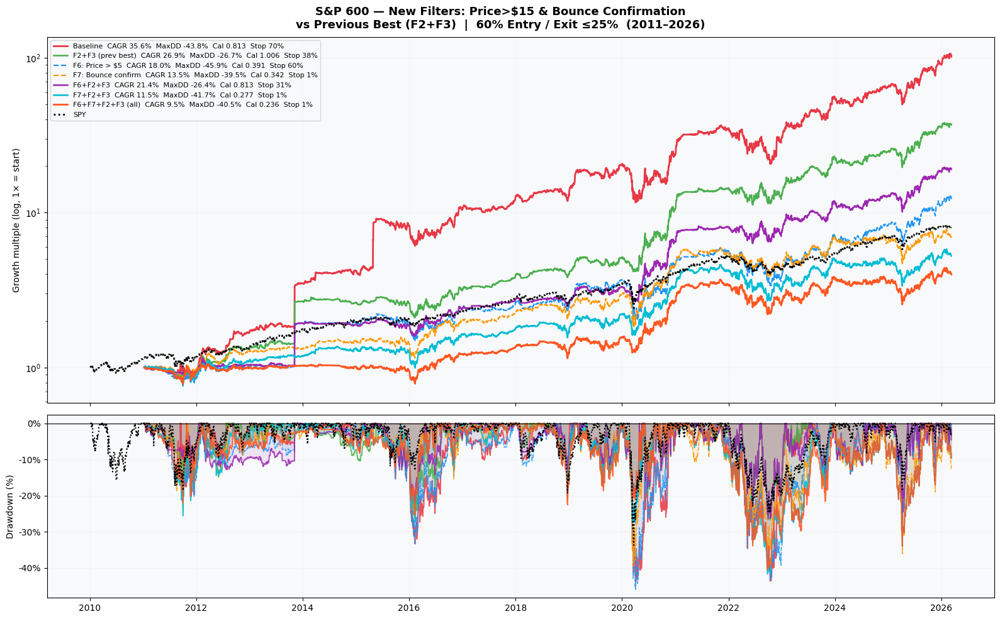


── Signal count diagnostics ───────────────────────────────────────────
  _em_sp600   avg signals/day : 8.7
  F6 (>$5)   avg signals/day : 7.0
  F7 (bounce) avg signals/day : 5.2
  F7 is triggered on avg      : 5.2 days
  F2+F3 avg signals/day       : 4.3
  F6+F7+F2+F3 avg signals/day : 4.1


In [50]:

# ═══════════════════════════════════════════════════════════════════════════════
# Step 11F — Two new filters: F6 (price > $15) + F7 (bounce confirmation)
# ═══════════════════════════════════════════════════════════════════════════════
#
# F6: Price > $5
#     More aggressive price floor than F5 ($5). Eliminates micro-caps and
#     near-distressed companies trading in the single digits. The idea is that
#     institutionally-relevant stocks rarely fall below $5 without a
#     structural problem, so requiring >$5 keeps us in liquid, viable names.
#
# F7: Bounce confirmation — enter only after a 5% recovery off the distress low
#     Original entry: stock has pulled back ≥60% from 52wk high (pb ≥ 0.60).
#     New entry: pullback was ≥60% at some point in the last 10 days, AND the
#     current pullback is between 55–60% (stock already bounced ~5% off low).
#     This filters out "still falling" entries and requires a stabilisation
#     candle / "bounced off the floor" confirmation before we step in.
#     Trade-off: some signals will arrive 1–5 days later, missing the very
#     first bounce day, but dramatically reducing "falling knife" entries.
#
# We test each individually, then combined with F2+F3 (the previous winner).
# ────────────────────────────────────────────────────────────────────────────

# ── F6: Price > $15 ──────────────────────────────────────────────────────────
_flt_above_5   = (_closes_sp600 > 5.0)

# ── F7: Bounce confirmation ───────────────────────────────────────────────────
# A stock qualifies if:
#   (a) it was ≥60% below its 52wk high at some point in the last 10 trading days
#   (b) it has since recovered to between 55–60% below its 52wk high (5% bounce)
# This means_em_sp600 alone (≥60%) is the "distress trigger", and we wait for
# the zone [55%, 60%) as the confirmed entry window.
_pb_was_60 = (_pb_sp600 >= 0.50).rolling(10, min_periods=1).max().astype(bool)
_pb_now_55_60 = (_pb_sp600 >= 0.40) & (_pb_sp600 < 0.50)
_flt_bounce_conf = _pb_was_60 & _pb_now_55_60

# Note: this is a standalone entry mask — it replaces _em_sp600 entirely.
# (When combined with other filters they are AND-ed with _flt_bounce_conf.)

# ── Run all variants ─────────────────────────────────────────────────────────
_f6_configs = [
    ("Baseline (no filter)",          _em_sp600),
    ("F6: Price > $5",                _em_sp600 & _flt_above_5),
    ("F7: Bounce confirmation",        _flt_bounce_conf),
    ("F2 + F3 (prev best)",           _em_sp600 & _flt_no_freefall & _flt_above_50ma),
    ("F6 + F2 + F3",                  _em_sp600 & _flt_above_5 & _flt_no_freefall & _flt_above_50ma),
    ("F7 + F2 + F3",                  _flt_bounce_conf & _flt_no_freefall & _flt_above_50ma),
    ("F6 + F7 + F2 + F3",             _flt_bounce_conf & _flt_above_5 & _flt_no_freefall & _flt_above_50ma),
]

_f6_results = {}
print("Running Step 11F filter tests on S&P 600  (exit ≤25%  stop −80%)\n")
print(f"{'Strategy':<36}  {'Sigs/day':>8}  {'CAGR':>7}  {'Sharpe':>7}  "
      f"{'MaxDD':>7}  {'Calmar':>7}  {'Stop%':>7}")
print("─" * 94)

for _lbl, _em_f in _f6_configs:
    avg_sigs = _em_f.sum(axis=1).mean()
    _eq_f, _tlog_f = backtest_lt_trades(
        _closes_sp600, _high_sp600, _pb_sp600, spy_lt,
        _em_f, exit_pullback=0.25, stop_from_high=0.80,
    )
    _f6_results[_lbl] = (_eq_f, _tlog_f)
    _m = raw_metrics(_eq_f, _lbl)
    _calmar   = _m["CAGR"] / abs(_m["Max Drawdown"]) if _m["Max Drawdown"] != 0 else 0
    _stop_pct = (_tlog_f["exit_reason"] == "stop").mean() if len(_tlog_f) else np.nan
    _base_cal = 0.813   # baseline Calmar from Step 11D
    _star = " ★" if _calmar > _base_cal else ""
    print(f"  {_lbl:<34}  {avg_sigs:>8.1f}  {_m['CAGR']:>7.2%}  "
          f"{_m['Sharpe']:>7.2f}  {_m['Max Drawdown']:>7.2%}  "
          f"{_calmar:>7.3f}{_star}  {_stop_pct:>7.1%}")

print("─" * 94)
_spy_ref = raw_metrics((spy_lt / spy_lt.iloc[0]) * 100_000, "SPY")
print(f"  {'SPY (benchmark)':<34}  {'':>8}  {_spy_ref['CAGR']:>7.2%}  "
      f"{_spy_ref['Sharpe']:>7.2f}  {_spy_ref['Max Drawdown']:>7.2%}  "
      f"{_spy_ref['CAGR']/abs(_spy_ref['Max Drawdown']):>7.3f}  {'n/a':>7}")

# ── Chart: new filters vs previous best (F2+F3) ──────────────────────────────
_plot_f6 = {
    "Baseline":             (_f6_results["Baseline (no filter)"][0],        "#e63946", 2.0, "-"),
    "F2+F3 (prev best)":    (_f6_results["F2 + F3 (prev best)"][0],         "#4CAF50", 1.8, "-"),
    "F6: Price > $5":      (_f6_results["F6: Price > $5"][0],             "#2196F3", 1.6, "--"),
    "F7: Bounce confirm":   (_f6_results["F7: Bounce confirmation"][0],      "#FF9800", 1.6, "--"),
    "F6+F2+F3":             (_f6_results["F6 + F2 + F3"][0],                "#9C27B0", 1.8, "-"),
    "F7+F2+F3":             (_f6_results["F7 + F2 + F3"][0],                "#00BCD4", 1.8, "-"),
    "F6+F7+F2+F3 (all)":    (_f6_results["F6 + F7 + F2 + F3"][0],          "#FF5722", 2.0, "-"),
}

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10), sharex=True,
                                gridspec_kw={"height_ratios": [2, 1]})
fig.suptitle("S&P 600 — New Filters: Price>$15 & Bounce Confirmation\n"
             "vs Previous Best (F2+F3)  |  60% Entry / Exit ≤25%  (2011–2026)",
             fontsize=13, fontweight="bold")

for _lbl, (_eq_p, _col, _lw, _ls) in _plot_f6.items():
    _m      = raw_metrics(_eq_p, _lbl)
    _calmar = _m["CAGR"] / abs(_m["Max Drawdown"]) if _m["Max Drawdown"] != 0 else 0
    _norm   = _eq_p / _eq_p.iloc[0]
    _dd     = (_eq_p / _eq_p.cummax()) - 1
    _trade_key = [k for k in _f6_results if _lbl.split(" (")[0] in k or k.startswith(_lbl.split("+")[0])]
    _tlog_p = _f6_results[list(_f6_results.keys())[[i for i,k in enumerate(_f6_results) if _eq_p is _f6_results[k][0]][0]]][1] if any(_eq_p is v[0] for v in _f6_results.values()) else pd.DataFrame()
    _sr = (_tlog_p["exit_reason"] == "stop").mean() if len(_tlog_p) else np.nan
    _sr_str = f"  Stop {_sr:.0%}" if not np.isnan(_sr) else ""
    ax1.plot(_norm.index, _norm, color=_col, lw=_lw, ls=_ls,
             label=f"{_lbl}  CAGR {_m['CAGR']:.1%}  MaxDD {_m['Max Drawdown']:.1%}"
                   f"  Cal {_calmar:.3f}{_sr_str}")
    ax2.fill_between(_dd.index, _dd * 100, 0, alpha=0.10, color=_col)
    ax2.plot(_dd.index, _dd * 100, color=_col, lw=_lw * 0.7, ls=_ls, alpha=0.85)

_spy_n = spy_lt / spy_lt.iloc[0]
_spy_d = (spy_lt / spy_lt.cummax()) - 1
ax1.plot(_spy_n.index, _spy_n, color="black", lw=2, ls=":", label="SPY")
ax2.plot(_spy_d.index, _spy_d * 100, color="black", lw=1.5, ls=":", label="SPY")

ax1.set_yscale("log")
ax1.set_ylabel("Growth multiple (log, 1× = start)")
ax1.legend(fontsize=8, loc="upper left")
ax1.grid(alpha=0.3)
ax2.axhline(0, color="black", lw=0.8)
ax2.set_ylabel("Drawdown (%)")
ax2.grid(alpha=0.3)
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0f}%"))
plt.tight_layout()
plt.show()

# ── Diagnostic: how many signals does F7 add vs the base 60% mask? ──────────
print("\n── Signal count diagnostics ───────────────────────────────────────────")
print(f"  _em_sp600   avg signals/day : {_em_sp600.sum(axis=1).mean():.1f}")
print(f"  F6 (>$5)   avg signals/day : {(_em_sp600 & _flt_above_5).sum(axis=1).mean():.1f}")
print(f"  F7 (bounce) avg signals/day : {_flt_bounce_conf.sum(axis=1).mean():.1f}")
print(f"  F7 is triggered on avg      : {_flt_bounce_conf.sum(axis=1).mean():.1f} days")
print(f"  F2+F3 avg signals/day       : {(_em_sp600 & _flt_no_freefall & _flt_above_50ma).sum(axis=1).mean():.1f}")
print(f"  F6+F7+F2+F3 avg signals/day : {(_flt_bounce_conf & _flt_above_5 & _flt_no_freefall & _flt_above_50ma).sum(axis=1).mean():.1f}")


Building full-universe indicators…


  em_60_lt (baseline)  avg signals/day : 14.6
  F5 (>$5) alone       avg signals/day : 11.8
  F7 (bounce)          avg signals/day : 3.4
  F2+F3                avg signals/day : 7.2
  F5+F2+F3             avg signals/day : 6.1
  F7+F2+F3             avg signals/day : 2.6
  F5+F7+F2+F3          avg signals/day : 2.4

Running full-universe backtests  (60% entry / exit ≤25%  stop −80%)

Strategy                            Sigs/day     CAGR   Sharpe    MaxDD   Calmar    Stop%   #Trades
──────────────────────────────────────────────────────────────────────────────────────────────────


  Baseline (full universe)              14.6   42.34%     1.02  -53.40%    0.793    73.2%     2,411


  F5: Price > $5                        11.8   22.18%     0.70  -55.04%    0.403    62.7%     1,612


  F7: Bounce confirm                     3.4   19.08%     0.80  -41.33%    0.462     3.5%       681


  F2 + F3  (S&P600 winner)               7.2   33.63%     0.97  -42.86%    0.785    38.2%     1,006


  F5 + F2 + F3                           6.1   24.87%     0.80  -39.12%    0.636    31.5%       815


  F7 + F2 + F3                           2.6   21.68%     0.95  -43.14%    0.502     2.7%       635


  F5 + F7 + F2 + F3                      2.4   19.17%     0.88  -42.52%    0.451     2.1%       580
──────────────────────────────────────────────────────────────────────────────────────────────────
  SPY (benchmark)                              13.68%     0.84  -33.72%    0.406       n/a


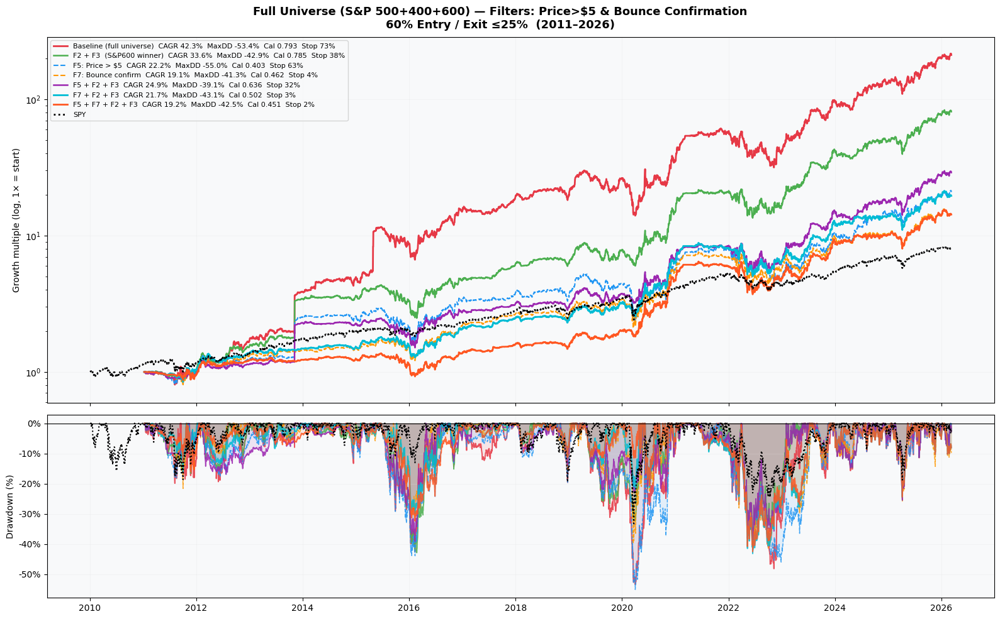

In [51]:

# ═══════════════════════════════════════════════════════════════════════════════
# Step 12 — F7 (bounce confirmation) + F5 ($5 floor) on the FULL universe
# ═══════════════════════════════════════════════════════════════════════════════
# Full universe = closes_lt  (~1,392 tickers: S&P 500 + 400 + 600)
# Base entry mask = em_60_lt  (pullback ≥ 60% from 52wk high)
#
# Rationale for expanding beyond S&P 600:
#   - F7 at S&P 600 alone produced only 1.9 signals/day — not enough to fill
#     the TOP_N=20 portfolio, leaving cash drag.
#   - The full universe has ~3× the tickers so F7 should yield 4–6 signals/day,
#     sufficient for diversification.
# ─────────────────────────────────────────────────────────────────────────────

print("Building full-universe indicators…")

# ── Indicators on full closes_lt ──────────────────────────────────────────────
_fu_ma200   = closes_lt.rolling(200, min_periods=100).mean()
_fu_mom20   = closes_lt.pct_change(20)

# ── Filter masks (full universe) ─────────────────────────────────────────────
# F2: not in freefall — 20d momentum > −15%
_flt_fu_f2  = (_fu_mom20 > -0.15).fillna(False)

# F3: not structurally broken — price > 50% of 200MA
_flt_fu_f3  = (closes_lt > _fu_ma200 * 0.50).fillna(False)

# F5: no penny stocks — price > $5
_flt_fu_f5  = (closes_lt > 5.0)

# F7: bounce confirmation
#     Was ≥60% below 52wk high in last 10 days AND has since recovered to 55–60%
_fu_pb_was_60   = (pb_lt >= 0.60).rolling(10, min_periods=1).max().astype(bool)
_fu_pb_now_band = (pb_lt >= 0.55) & (pb_lt < 0.60)
_flt_fu_f7      = _fu_pb_was_60 & _fu_pb_now_band

print(f"  em_60_lt (baseline)  avg signals/day : {em_60_lt.sum(axis=1).mean():.1f}")
print(f"  F5 (>$5) alone       avg signals/day : {(em_60_lt & _flt_fu_f5).sum(axis=1).mean():.1f}")
print(f"  F7 (bounce)          avg signals/day : {_flt_fu_f7.sum(axis=1).mean():.1f}")
print(f"  F2+F3                avg signals/day : {(em_60_lt & _flt_fu_f2 & _flt_fu_f3).sum(axis=1).mean():.1f}")
print(f"  F5+F2+F3             avg signals/day : {(em_60_lt & _flt_fu_f5 & _flt_fu_f2 & _flt_fu_f3).sum(axis=1).mean():.1f}")
print(f"  F7+F2+F3             avg signals/day : {(_flt_fu_f7 & _flt_fu_f2 & _flt_fu_f3).sum(axis=1).mean():.1f}")
print(f"  F5+F7+F2+F3          avg signals/day : {(_flt_fu_f7 & _flt_fu_f5 & _flt_fu_f2 & _flt_fu_f3).sum(axis=1).mean():.1f}")

# ── Backtest suite ────────────────────────────────────────────────────────────
_fu_configs = [
    ("Baseline (full universe)",     em_60_lt),
    ("F5: Price > $5",               em_60_lt & _flt_fu_f5),
    ("F7: Bounce confirm",           _flt_fu_f7),
    ("F2 + F3  (S&P600 winner)",     em_60_lt & _flt_fu_f2 & _flt_fu_f3),
    ("F5 + F2 + F3",                 em_60_lt & _flt_fu_f5 & _flt_fu_f2 & _flt_fu_f3),
    ("F7 + F2 + F3",                 _flt_fu_f7 & _flt_fu_f2 & _flt_fu_f3),
    ("F5 + F7 + F2 + F3",            _flt_fu_f7 & _flt_fu_f5 & _flt_fu_f2 & _flt_fu_f3),
]

_fu_results = {}
print("\nRunning full-universe backtests  (60% entry / exit ≤25%  stop −80%)\n")
print(f"{'Strategy':<34}  {'Sigs/day':>8}  {'CAGR':>7}  {'Sharpe':>7}  "
      f"{'MaxDD':>7}  {'Calmar':>7}  {'Stop%':>7}  {'#Trades':>8}")
print("─" * 98)

for _lbl, _em_f in _fu_configs:
    _avg_s = _em_f.sum(axis=1).mean()
    _eq_f, _tlog_f = backtest_lt_trades(
        closes_lt, high_lt, pb_lt, spy_lt,
        _em_f, exit_pullback=0.25, stop_from_high=0.80,
    )
    _fu_results[_lbl] = (_eq_f, _tlog_f)
    _m = raw_metrics(_eq_f, _lbl)
    _cal  = _m["CAGR"] / abs(_m["Max Drawdown"]) if _m["Max Drawdown"] != 0 else 0
    _sp   = (_tlog_f["exit_reason"] == "stop").mean() if len(_tlog_f) else np.nan
    _star = " ★" if _cal > 1.006 else ("")   # beat S&P 600 F2+F3 winner
    print(f"  {_lbl:<32}  {_avg_s:>8.1f}  {_m['CAGR']:>7.2%}  "
          f"{_m['Sharpe']:>7.2f}  {_m['Max Drawdown']:>7.2%}  "
          f"{_cal:>7.3f}{_star}  {_sp:>7.1%}  {len(_tlog_f):>8,}")

print("─" * 98)
_spy_ref = raw_metrics((spy_lt / spy_lt.iloc[0]) * 100_000, "SPY")
print(f"  {'SPY (benchmark)':<32}  {'':>8}  {_spy_ref['CAGR']:>7.2%}  "
      f"{_spy_ref['Sharpe']:>7.2f}  {_spy_ref['Max Drawdown']:>7.2%}  "
      f"{_spy_ref['CAGR']/abs(_spy_ref['Max Drawdown']):>7.3f}   {'n/a':>7}")

# ── Chart ──────────────────────────────────────────────────────────────────────
_plot_fu = {
    "Baseline (full universe)":  ("#e63946", 2.0, "-"),
    "F2 + F3  (S&P600 winner)":  ("#4CAF50", 1.8, "-"),
    "F5: Price > $5":            ("#2196F3", 1.5, "--"),
    "F7: Bounce confirm":        ("#FF9800", 1.5, "--"),
    "F5 + F2 + F3":              ("#9C27B0", 1.8, "-"),
    "F7 + F2 + F3":              ("#00BCD4", 2.0, "-"),
    "F5 + F7 + F2 + F3":         ("#FF5722", 2.0, "-"),
}

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10), sharex=True,
                                gridspec_kw={"height_ratios": [2, 1]})
fig.suptitle("Full Universe (S&P 500+400+600) — Filters: Price>$5 & Bounce Confirmation\n"
             "60% Entry / Exit ≤25%  (2011–2026)", fontsize=13, fontweight="bold")

for _lbl, (_col, _lw, _ls) in _plot_fu.items():
    _eq_p, _tlog_p = _fu_results[_lbl]
    _m    = raw_metrics(_eq_p, _lbl)
    _cal  = _m["CAGR"] / abs(_m["Max Drawdown"]) if _m["Max Drawdown"] != 0 else 0
    _sp   = (_tlog_p["exit_reason"] == "stop").mean() if len(_tlog_p) else np.nan
    _norm = _eq_p / _eq_p.iloc[0]
    _dd   = (_eq_p / _eq_p.cummax()) - 1
    _sr_s = f"  Stop {_sp:.0%}" if not np.isnan(_sp) else ""
    ax1.plot(_norm.index, _norm, color=_col, lw=_lw, ls=_ls,
             label=f"{_lbl}  CAGR {_m['CAGR']:.1%}  MaxDD {_m['Max Drawdown']:.1%}"
                   f"  Cal {_cal:.3f}{_sr_s}")
    ax2.fill_between(_dd.index, _dd * 100, 0, alpha=0.10, color=_col)
    ax2.plot(_dd.index, _dd * 100, color=_col, lw=_lw * 0.7, ls=_ls, alpha=0.85)

_spy_n = spy_lt / spy_lt.iloc[0]
_spy_d = (spy_lt / spy_lt.cummax()) - 1
ax1.plot(_spy_n.index, _spy_n, color="black", lw=2, ls=":", label="SPY")
ax2.plot(_spy_d.index, _spy_d * 100, color="black", lw=1.5, ls=":", label="SPY")

ax1.set_yscale("log")
ax1.set_ylabel("Growth multiple (log, 1× = start)")
ax1.legend(fontsize=8, loc="upper left")
ax1.grid(alpha=0.3)
ax2.axhline(0, color="black", lw=0.8)
ax2.set_ylabel("Drawdown (%)")
ax2.grid(alpha=0.3)
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0f}%"))
plt.tight_layout()
plt.show()


Building full-universe volume ratio (for F9)…


SPY above 200MA : 81% of trading days  (19% blocked by regime gate)

Filter combo                      Sigs/day
─────────────────────────────────────────────
  F2+F3  [reference]                   7.2
  F8+F2+F3                             3.6
  F9+F2+F3                             1.0
  F14+F2+F3                            0.3
  F8+F14+F2+F3                         0.1
  F_reg+F2+F3                          4.8
  F_reg+F8+F2+F3                       2.4
  F_reg+F14+F2+F3                      0.2
  F_reg+F8+F14+F2+F3                   0.1
  F_reg+F9+F2+F3                       0.7
  F2+F3  exit=20%                      7.2
  F2+F3  stop=75%                      7.2
  F2+F3  rebal=10d                     7.2
  F_reg+F8+F2+F3  stop=75%             2.4


Running 14 backtests  (full universe, 60% entry)  …

Strategy                              Sigs/d     CAGR   Sharpe    MaxDD   Calmar    Stop%  #Trades
──────────────────────────────────────────────────────────────────────────────────────

  F2+F3  [reference]                     7.2   33.63%     0.97  -42.86%    0.785    38.2%    1,006


  F8+F2+F3                               3.6   29.97%     0.91  -33.06%    0.907    31.3%      754


  F9+F2+F3                               1.0   18.89%     1.02  -27.96%    0.676    24.0%      417


  F14+F2+F3                              0.3    5.31%     0.63  -24.71%    0.215    26.6%      109


  F8+F14+F2+F3                           0.1    2.90%     0.49  -17.08%    0.170    21.0%       62


  F_reg+F2+F3                            4.8   27.20%     0.87  -37.28%    0.730    35.5%      832


  F_reg+F8+F2+F3                         2.4   24.97%     0.83  -32.93%    0.758    28.8%      612


  F_reg+F14+F2+F3                        0.2    3.09%     0.60  -13.64%    0.226    32.1%       81


  F_reg+F8+F14+F2+F3                     0.1    1.77%     0.47   -8.80%    0.201    27.9%       43


  F_reg+F9+F2+F3                         0.7   15.35%     1.08  -20.08%    0.764    27.1%      314


  F2+F3  exit=20%                        7.2   31.26%     0.92  -42.89%    0.729    38.1%    1,005


  F2+F3  stop=75%                        7.2   30.87%     0.93  -39.48%    0.782    59.4%    1,378


  F2+F3  rebal=10d                       7.2   29.93%     0.85  -39.89%    0.750    31.3%      799


  F_reg+F8+F2+F3  stop=75%               2.4   24.54%     0.83  -31.90%    0.769    48.6%      755
──────────────────────────────────────────────────────────────────────────────────────────────────────
  SPY (benchmark)                              13.68%     0.84  -33.72%    0.406      n/a

  No combo hit both targets simultaneously — see closest below.

  Nearest-to-target ranking (CAGR − max-drawdown-overshoot):
    F8+F2+F3                              score=0.269  CAGR 30.0%  MaxDD -33.1%
    F_reg+F8+F2+F3  stop=75%              score=0.226  CAGR 24.5%  MaxDD -31.9%
    F_reg+F8+F2+F3                        score=0.220  CAGR 25.0%  MaxDD -32.9%
    F2+F3  stop=75%                       score=0.214  CAGR 30.9%  MaxDD -39.5%
    F2+F3  [reference]                    score=0.208  CAGR 33.6%  MaxDD -42.9%


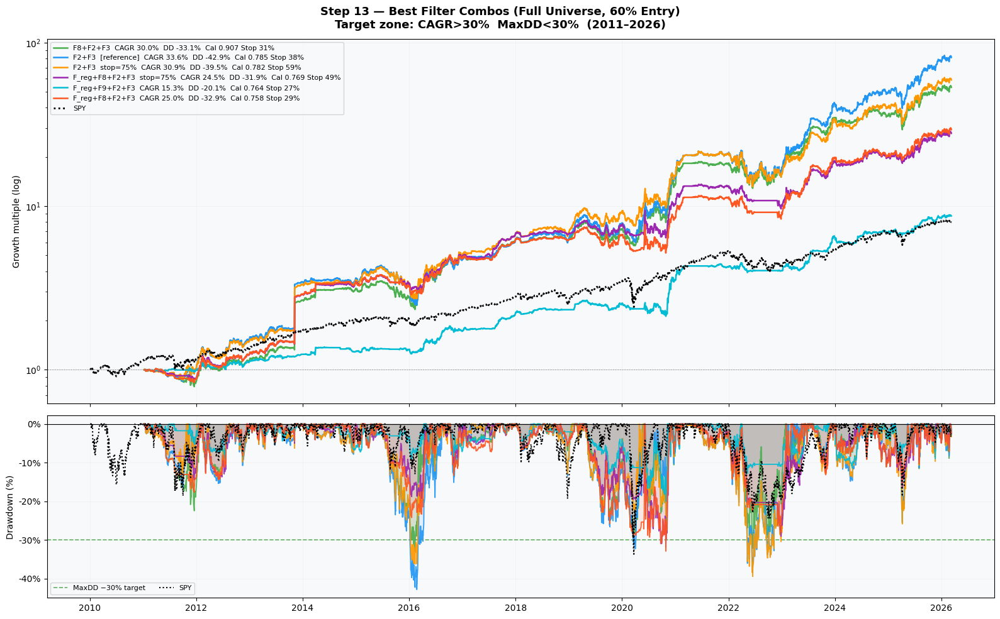

In [52]:

# ═══════════════════════════════════════════════════════════════════════════════
# Step 13 — Expanded filter search
# Target: CAGR > 30%  |  MaxDD < 30%  |  Low stop%  |  ≥2-3 entries/week
# ═══════════════════════════════════════════════════════════════════════════════
#
# Four new filters:
#   F8 : 5-day momentum > 0%
#        The stock must be UP over the last 5 trading days — immediate sell
#        pressure has stopped. Stronger than F7 (bounce off floor), simpler.
#
#   F9 : Capitulation volume — 10d avg vol > 1.3× its 60d avg vol
#        Abnormally high volume at lows = institutional selling climax = likely
#        reversal. The opposite of F4 (which just required vol > 0.7×).
#
#   F14: 52-week high refreshed within last 126 trading days (~6 months)
#        Ensures we buy acute dislocations, NOT 2-year slow bleeds.
#        Less restrictive than F1 (which used 90 days).
#
#   F_reg: SPY above its 200MA regime gate
#        Do NOT open new positions when the broad market is in a downtrend.
#        Existing positions continue to their natural exits.
#        This directly attacks MaxDD by stopping new entries during crashes.
#
# Parameter variants (applied to best F2+F3 combo):
#   exit=0.20  — take profit at 20% below 52wk high rather than 25%
#                (faster exits = less time at risk)
#   stop=0.75  — stop at -75% from high not -80%  (cut losses 25% sooner)
#   rebal=10   — bi-weekly entry scan (~2 new entries per period for weekly traders)
# ─────────────────────────────────────────────────────────────────────────────

# ── Rebuild base indicators (guards against kernel drift) ────────────────────
_fu_ma200 = closes_lt.rolling(200, min_periods=100).mean()
_fu_mom20 = closes_lt.pct_change(20)
_fu_mom5  = closes_lt.pct_change(5)

# ── Full-universe volume (for F9) ─────────────────────────────────────────────
print("Building full-universe volume ratio (for F9)…")
_vol_dict_fu = {t: _extract_volume(raw_lt, t) for t in closes_lt.columns}
_vol_fu      = pd.DataFrame(
    {t: s for t, s in _vol_dict_fu.items() if len(s) >= 20}
).reindex(closes_lt.index)
_vol_ma10_fu  = _vol_fu.rolling(10, min_periods=5).mean()
_vol_ma60_fu  = _vol_fu.rolling(60, min_periods=20).mean()
_vol_ratio_fu = _vol_ma10_fu / _vol_ma60_fu.replace(0, np.nan)

# ── Filter definitions ────────────────────────────────────────────────────────
_flt_fu_f2  = (_fu_mom20 > -0.15).fillna(False)                 # not in freefall
_flt_fu_f3  = (closes_lt > _fu_ma200 * 0.50).fillna(False)      # not structurally broken
_flt_fu_f8  = (_fu_mom5 > 0.0).fillna(False)                    # 5d positive momentum
_flt_fu_f9  = (_vol_ratio_fu.reindex(columns=closes_lt.columns) > 1.3).fillna(False)  # capitulation vol
_flt_fu_f14 = (high_lt > high_lt.shift(126)).fillna(True)       # peak within 6 months

# SPY regime gate: only enter when SPY is above its 200MA
# Recompute fresh to guarantee aligned index
_spy_ma200_fresh = spy_lt.rolling(200, min_periods=100).mean()
_spy_gate        = (spy_lt >= _spy_ma200_fresh).reindex(closes_lt.index).fillna(False)
_flt_fu_regime = pd.DataFrame(
    np.broadcast_to(_spy_gate.values[:, None], closes_lt.shape).copy(),
    index=closes_lt.index, columns=closes_lt.columns,
).astype(bool)

# ── Base mask shorthand ───────────────────────────────────────────────────────
_f23 = em_60_lt & _flt_fu_f2 & _flt_fu_f3   # F2+F3 reference

# ── Signal counts preview ─────────────────────────────────────────────────────
_spy_bull_pct = _spy_gate.mean()
print(f"SPY above 200MA : {_spy_bull_pct:.0%} of trading days  "
      f"({(1-_spy_bull_pct):.0%} blocked by regime gate)\n")
print(f"{'Filter combo':<32}  {'Sigs/day':>8}")
print("─" * 45)
_preview = [
    ("F2+F3  [reference]",       _f23),
    ("F8+F2+F3",                 _f23 & _flt_fu_f8),
    ("F9+F2+F3",                 _f23 & _flt_fu_f9),
    ("F14+F2+F3",                _f23 & _flt_fu_f14),
    ("F8+F14+F2+F3",             _f23 & _flt_fu_f8 & _flt_fu_f14),
    ("F_reg+F2+F3",              _f23 & _flt_fu_regime),
    ("F_reg+F8+F2+F3",           _f23 & _flt_fu_f8 & _flt_fu_regime),
    ("F_reg+F14+F2+F3",          _f23 & _flt_fu_f14 & _flt_fu_regime),
    ("F_reg+F8+F14+F2+F3",       _f23 & _flt_fu_f8 & _flt_fu_f14 & _flt_fu_regime),
    ("F_reg+F9+F2+F3",           _f23 & _flt_fu_f9 & _flt_fu_regime),
    ("F2+F3  exit=20%",          _f23),
    ("F2+F3  stop=75%",          _f23),
    ("F2+F3  rebal=10d",         _f23),
    ("F_reg+F8+F2+F3  stop=75%", _f23 & _flt_fu_f8 & _flt_fu_regime),
]
for _l, _em in _preview:
    print(f"  {_l:<30}  {_em.sum(axis=1).mean():>8.1f}")

# ── Run all backtests ────────────────────────────────────────────────────────
# (label, entry_mask, exit_pullback, stop_from_high, rebal_freq)
_s13_configs = [
    ("F2+F3  [reference]",        _f23,                                                  0.25, 0.80,  5),
    ("F8+F2+F3",                  _f23 & _flt_fu_f8,                                     0.25, 0.80,  5),
    ("F9+F2+F3",                  _f23 & _flt_fu_f9,                                     0.25, 0.80,  5),
    ("F14+F2+F3",                 _f23 & _flt_fu_f14,                                    0.25, 0.80,  5),
    ("F8+F14+F2+F3",              _f23 & _flt_fu_f8 & _flt_fu_f14,                       0.25, 0.80,  5),
    ("F_reg+F2+F3",               _f23 & _flt_fu_regime,                                 0.25, 0.80,  5),
    ("F_reg+F8+F2+F3",            _f23 & _flt_fu_f8 & _flt_fu_regime,                    0.25, 0.80,  5),
    ("F_reg+F14+F2+F3",           _f23 & _flt_fu_f14 & _flt_fu_regime,                   0.25, 0.80,  5),
    ("F_reg+F8+F14+F2+F3",        _f23 & _flt_fu_f8 & _flt_fu_f14 & _flt_fu_regime,      0.25, 0.80,  5),
    ("F_reg+F9+F2+F3",            _f23 & _flt_fu_f9 & _flt_fu_regime,                    0.25, 0.80,  5),
    ("F2+F3  exit=20%",           _f23,                                                  0.20, 0.80,  5),
    ("F2+F3  stop=75%",           _f23,                                                  0.25, 0.75,  5),
    ("F2+F3  rebal=10d",          _f23,                                                  0.25, 0.80, 10),
    ("F_reg+F8+F2+F3  stop=75%",  _f23 & _flt_fu_f8 & _flt_fu_regime,                    0.25, 0.75,  5),
]

_s13_results = {}
print(f"\n\nRunning {len(_s13_configs)} backtests  (full universe, 60% entry)  …\n")
print(f"{'Strategy':<36}  {'Sigs/d':>6}  {'CAGR':>7}  {'Sharpe':>7}  "
      f"{'MaxDD':>7}  {'Calmar':>7}  {'Stop%':>7}  {'#Trades':>7}")
print("─" * 102)

_hits = []
for _lbl, _em, _ext, _stp, _reb in _s13_configs:
    _avg_s = _em.sum(axis=1).mean()
    _eq_f, _tlog_f = backtest_lt_trades(
        closes_lt, high_lt, pb_lt, spy_lt,
        _em, exit_pullback=_ext, stop_from_high=_stp, rebal_freq=_reb,
    )
    _s13_results[_lbl] = (_eq_f, _tlog_f, _avg_s, _ext, _stp, _reb)
    _m   = raw_metrics(_eq_f, _lbl)
    _cal = _m["CAGR"] / abs(_m["Max Drawdown"]) if _m["Max Drawdown"] != 0 else 0
    _sp  = (_tlog_f["exit_reason"] == "stop").mean() if len(_tlog_f) else np.nan
    _ok  = (_m["CAGR"] >= 0.30) and (abs(_m["Max Drawdown"]) <= 0.30)
    if _ok:
        _hits.append(_lbl)
    _flag = "  ✓ TARGET" if _ok else ""
    print(f"  {_lbl:<34}  {_avg_s:>6.1f}  {_m['CAGR']:>7.2%}  "
          f"{_m['Sharpe']:>7.2f}  {_m['Max Drawdown']:>7.2%}  "
          f"{_cal:>7.3f}  {_sp:>7.1%}  {len(_tlog_f):>7,}{_flag}")

print("─" * 102)
_spy_ref = raw_metrics((spy_lt / spy_lt.iloc[0]) * 100_000, "SPY")
print(f"  {'SPY (benchmark)':<34}  {'':>6}  {_spy_ref['CAGR']:>7.2%}  "
      f"{_spy_ref['Sharpe']:>7.2f}  {_spy_ref['Max Drawdown']:>7.2%}  "
      f"{_spy_ref['CAGR']/abs(_spy_ref['Max Drawdown']):>7.3f}  {'n/a':>7}")

if _hits:
    print(f"\n  ✓ HIT BOTH targets (CAGR≥30% AND MaxDD≤30%): {_hits}")
else:
    print(f"\n  No combo hit both targets simultaneously — see closest below.")

# Closest to target by custom score: penalise MaxDD overshoot, reward CAGR
_scores = {}
for _lbl, (_eq, _tlog, *_) in _s13_results.items():
    _m = raw_metrics(_eq, _lbl)
    _cagr = _m["CAGR"]
    _mdd  = abs(_m["Max Drawdown"])
    # score = CAGR bonus above 30% minus MaxDD overshoot above 30%
    _scores[_lbl] = _cagr - max(0, _mdd - 0.30)
print("\n  Nearest-to-target ranking (CAGR − max-drawdown-overshoot):")
for _lbl, _sc in sorted(_scores.items(), key=lambda x: -x[1])[:5]:
    _m = raw_metrics(_s13_results[_lbl][0], "")
    print(f"    {_lbl:<36}  score={_sc:.3f}  "
          f"CAGR {_m['CAGR']:.1%}  MaxDD {_m['Max Drawdown']:.1%}")

# ── Chart: top 6 by Calmar ───────────────────────────────────────────────────
_top6 = sorted(
    _s13_results.items(),
    key=lambda x: raw_metrics(x[1][0], "")["CAGR"] / abs(raw_metrics(x[1][0], "")["Max Drawdown"])
                  if raw_metrics(x[1][0], "")["Max Drawdown"] != 0 else 0,
    reverse=True,
)[:6]

_pal6 = ["#4CAF50", "#2196F3", "#FF9800", "#9C27B0", "#00BCD4", "#FF5722"]
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10), sharex=True,
                                gridspec_kw={"height_ratios": [2, 1]})
fig.suptitle("Step 13 — Best Filter Combos (Full Universe, 60% Entry)\n"
             "Target zone: CAGR>30%  MaxDD<30%  (2011–2026)",
             fontsize=13, fontweight="bold")
# shade target zone on drawdown panel
ax2.axhline(-30, color="green", lw=1.2, ls="--", alpha=0.6, label="MaxDD −30% target")

for (_lbl, (_eq, _tlog, _avg_s, *_)), _col in zip(_top6, _pal6):
    _m    = raw_metrics(_eq, _lbl)
    _cal  = _m["CAGR"] / abs(_m["Max Drawdown"]) if _m["Max Drawdown"] != 0 else 0
    _sp   = (_tlog["exit_reason"] == "stop").mean() if len(_tlog) else np.nan
    _norm = _eq / _eq.iloc[0]
    _dd   = (_eq / _eq.cummax()) - 1
    _sr_s = f" Stop {_sp:.0%}" if not np.isnan(_sp) else ""
    ax1.plot(_norm.index, _norm, color=_col, lw=1.8,
             label=f"{_lbl}  CAGR {_m['CAGR']:.1%}  DD {_m['Max Drawdown']:.1%}"
                   f"  Cal {_cal:.3f}{_sr_s}")
    ax2.fill_between(_dd.index, _dd * 100, 0, alpha=0.10, color=_col)
    ax2.plot(_dd.index, _dd * 100, color=_col, lw=1.3, alpha=0.9)

_spy_n = spy_lt / spy_lt.iloc[0]
_spy_d = (spy_lt / spy_lt.cummax()) - 1
ax1.plot(_spy_n.index, _spy_n, color="black", lw=2, ls=":", label="SPY")
ax2.plot(_spy_d.index, _spy_d * 100, color="black", lw=1.5, ls=":", label="SPY")

ax1.axhline(1, color="grey", lw=0.5, ls="--")
ax1.set_yscale("log")
ax1.set_ylabel("Growth multiple (log)")
ax1.legend(fontsize=8, loc="upper left")
ax1.grid(alpha=0.3)
ax2.axhline(0, color="black", lw=0.8)
ax2.set_ylabel("Drawdown (%)")
ax2.legend(fontsize=8, ncol=2)
ax2.grid(alpha=0.3)
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0f}%"))
plt.tight_layout()
plt.show()


---
## Step 14 — Drawdown Reduction Lab (Return-Preserving)

Goal: keep the strong CAGR profile while reducing max drawdown and improving Sharpe.

I test a focused set of risk controls:
- tighter **entry-price stop losses** (20% to 35%)
- **regime gate** (only add new positions when SPY > 200DMA)
- **portfolio circuit breaker** (pause new entries in deep portfolio drawdown)
- optional **inverse-vol entry sizing**
- tighter quality masks for entries

Below, all scenarios are run on the **full universe** and compared in one final table.

In [53]:
# ── Step 14A: Backtest engine with entry-stop + CB + regime + vol sizing ─────
def backtest_lt_risk(
    closes, high_52w, pullback,
    entry_mask,
    exit_pullback=0.25,
    stop_from_high=0.80,
    stop_from_entry=None,          # NEW: e.g. 0.30 means sell if -30% from entry
    trailing_stop=None,            # NEW: e.g. 0.25 means 25% trail from post-entry peak
    initial_capital=100_000,
    top_n=20,
    rebal_freq=5,
    max_hold_days=MAX_HOLD_DAYS,
    tc=TRANSACTION_COST,
    max_portfolio_dd=None,         # NEW: portfolio circuit breaker for new entries
    regime_gate=None,              # NEW: pd.Series bool indexed by date
    vol_weighted_entries=False,    # NEW: inverse-vol weighting across new entries
    vol20=None,                    # pd.DataFrame annualized vol
):
    dates     = closes.index
    start_idx = HIGH_LOOKBACK + 5

    capital   = initial_capital
    positions = {}
    port_vals, port_dates, trade_log = [], [], []
    port_peak = initial_capital

    for i, date in enumerate(dates[start_idx:], start=start_idx):
        prices = closes.iloc[i]

        # ── Exits ──────────────────────────────────────────────────────────────
        to_exit = []
        for sym, pos in positions.items():
            px = _safe_px(prices, sym, np.nan)
            if np.isnan(px) or px <= 0:
                to_exit.append((sym, "delisted")); continue

            days_held = i - pos["entry_idx"]
            cur_high  = _safe_px(high_52w.iloc[i], sym, pos["ref_high"])
            cur_pb    = (cur_high - px) / cur_high if cur_high > 0 else 1.0

            # Track running peak since entry for trailing stop
            pos["peak_price"] = max(pos.get("peak_price", pos["entry_price"]), px)

            reason = None
            if cur_pb <= exit_pullback:
                reason = "target"
            elif stop_from_entry is not None and px <= pos["entry_price"] * (1 - stop_from_entry):
                reason = "stop_entry"
            elif trailing_stop is not None and px <= pos["peak_price"] * (1 - trailing_stop):
                reason = "stop_trail"
            elif cur_pb >= stop_from_high:
                reason = "stop_high"
            elif days_held >= max_hold_days:
                reason = "timeout"

            if reason:
                to_exit.append((sym, reason))

        for sym, reason in to_exit:
            pos = positions.pop(sym)
            px  = max(_safe_px(prices, sym, pos["entry_price"]), 0.01)
            gross = pos["shares"] * px
            capital += gross * (1 - tc)
            trade_log.append({
                "ticker": sym,
                "entry_date": pos["entry_date"],
                "exit_date": date,
                "days_held": i - pos["entry_idx"],
                "entry_price": pos["entry_price"],
                "exit_price": px,
                "return_pct": px / pos["entry_price"] - 1,
                "exit_reason": reason,
            })

        # ── Mark-to-market (before entry gates) ───────────────────────────────
        pv = capital + sum(
            pos["shares"] * max(_safe_px(prices, s, pos["entry_price"]), 0.0)
            for s, pos in positions.items()
        )
        port_peak = max(port_peak, pv)

        # Entry gating: regime + circuit breaker
        allow_entries = True
        if regime_gate is not None:
            allow_entries = bool(regime_gate.reindex(dates).iloc[i])
        if allow_entries and max_portfolio_dd is not None:
            dd = (pv - port_peak) / port_peak if port_peak > 0 else 0
            if dd < -max_portfolio_dd:
                allow_entries = False

        # ── Entries ────────────────────────────────────────────────────────────
        if (i - start_idx) % rebal_freq == 0 and allow_entries:
            slots_free = top_n - len(positions)
            if slots_free > 0:
                cand = pullback.iloc[i].where(entry_mask.iloc[i]).dropna().sort_values(ascending=False)
                cand = cand[~cand.index.isin(positions.keys())]
                picks = list(cand.index[:slots_free])

                if len(picks) > 0:
                    budget_total = min(capital, (pv / top_n) * len(picks))
                    if budget_total > 0:
                        # Equal-size default
                        if (not vol_weighted_entries) or (vol20 is None):
                            w = pd.Series(1.0, index=picks)
                        else:
                            v = vol20.iloc[i].reindex(picks).replace(0, np.nan)
                            inv = (1.0 / v).replace([np.inf, -np.inf], np.nan).fillna(0)
                            if inv.sum() <= 0:
                                w = pd.Series(1.0, index=picks)
                            else:
                                w = inv
                        w = w / w.sum()

                        for sym in picks:
                            px = _safe_px(prices, sym, 0)
                            if not (px > 0):
                                continue
                            alloc = float(budget_total * w[sym])
                            shares = int((alloc * (1 - tc)) / px)
                            cost = shares * px * (1 + tc)
                            if shares < 1 or cost > capital:
                                continue
                            hi = _safe_px(high_52w.iloc[i], sym, px)
                            positions[sym] = {
                                "shares": shares,
                                "entry_price": px,
                                "entry_idx": i,
                                "entry_date": date,
                                "ref_high": hi,
                                "peak_price": px,
                            }
                            capital -= cost

        # Store daily portfolio value
        pv = capital + sum(
            pos["shares"] * max(_safe_px(prices, s, pos["entry_price"]), 0.0)
            for s, pos in positions.items()
        )
        port_vals.append(pv)
        port_dates.append(date)

    return pd.Series(port_vals, index=port_dates, name="strategy"), pd.DataFrame(trade_log)

print("Step 14A ready: risk-aware backtest engine defined.")

Step 14A ready: risk-aware backtest engine defined.


In [54]:
# ── Step 14B: Build masks + run a broad risk-control experiment grid ─────────
# Keep this cell self-contained so re-runs are stable.

# Core indicators
_ma200_14 = closes_lt.rolling(200, min_periods=100).mean()
_mom20_14 = closes_lt.pct_change(20)
_mom5_14  = closes_lt.pct_change(5)
_vol20_14 = closes_lt.pct_change().rolling(20, min_periods=20).std() * np.sqrt(252)
_recent_peak_126 = (high_lt > high_lt.shift(126)).fillna(True)

# Regime gate (SPY > 200DMA)
_spy_ma200_14 = spy_lt.rolling(200, min_periods=100).mean()
_regime_14 = (spy_lt >= _spy_ma200_14).reindex(closes_lt.index).fillna(False)

# Entry masks
_f2 = (_mom20_14 > -0.15).fillna(False)              # not in freefall
_f3 = (closes_lt > _ma200_14 * 0.50).fillna(False)   # not structurally broken
_f8 = (_mom5_14 > 0.0).fillna(False)                 # short-term bounce confirmation
_f5 = (closes_lt > 5.0).fillna(False)                # avoid penny names

mask_ref      = em_60_lt & _f2 & _f3
mask_quality  = mask_ref & _f8 & _recent_peak_126 & _f5
mask_regime   = mask_ref & pd.DataFrame(np.broadcast_to(_regime_14.values[:, None], closes_lt.shape),
                                        index=closes_lt.index, columns=closes_lt.columns)
mask_q_regime = mask_quality & pd.DataFrame(np.broadcast_to(_regime_14.values[:, None], closes_lt.shape),
                                            index=closes_lt.index, columns=closes_lt.columns)

scenarios = [
    # Reference
    {"name":"Ref F2+F3 old risk", "mask":mask_ref, "exit":0.25, "stop_high":0.80, "stop_entry":None, "trail":None, "cb":None, "reg":False, "rebal":5, "top_n":20, "vol_w":False},

    # Stop tightening only
    {"name":"Entry stop 35%", "mask":mask_ref, "exit":0.25, "stop_high":0.80, "stop_entry":0.35, "trail":None, "cb":None, "reg":False, "rebal":5, "top_n":20, "vol_w":False},
    {"name":"Entry stop 30%", "mask":mask_ref, "exit":0.25, "stop_high":0.80, "stop_entry":0.30, "trail":None, "cb":None, "reg":False, "rebal":5, "top_n":20, "vol_w":False},
    {"name":"Entry stop 25%", "mask":mask_ref, "exit":0.25, "stop_high":0.80, "stop_entry":0.25, "trail":None, "cb":None, "reg":False, "rebal":5, "top_n":20, "vol_w":False},
    {"name":"Entry stop 20%", "mask":mask_ref, "exit":0.25, "stop_high":0.80, "stop_entry":0.20, "trail":None, "cb":None, "reg":False, "rebal":5, "top_n":20, "vol_w":False},

    # Regime / CB overlays
    {"name":"Stop30 + regime", "mask":mask_ref, "exit":0.25, "stop_high":0.80, "stop_entry":0.30, "trail":None, "cb":None, "reg":True, "rebal":5, "top_n":20, "vol_w":False},
    {"name":"Stop30 + CB20", "mask":mask_ref, "exit":0.25, "stop_high":0.80, "stop_entry":0.30, "trail":None, "cb":0.20, "reg":False, "rebal":5, "top_n":20, "vol_w":False},
    {"name":"Stop30 + regime + CB20", "mask":mask_ref, "exit":0.25, "stop_high":0.80, "stop_entry":0.30, "trail":None, "cb":0.20, "reg":True, "rebal":5, "top_n":20, "vol_w":False},
    {"name":"Stop30 + regime + CB15", "mask":mask_ref, "exit":0.25, "stop_high":0.80, "stop_entry":0.30, "trail":None, "cb":0.15, "reg":True, "rebal":5, "top_n":20, "vol_w":False},

    # Better entries + risk controls
    {"name":"Quality mask + stop30 + regime", "mask":mask_quality, "exit":0.25, "stop_high":0.80, "stop_entry":0.30, "trail":None, "cb":None, "reg":True, "rebal":5, "top_n":20, "vol_w":False},
    {"name":"Quality + stop30 + regime + CB20", "mask":mask_quality, "exit":0.25, "stop_high":0.80, "stop_entry":0.30, "trail":None, "cb":0.20, "reg":True, "rebal":5, "top_n":20, "vol_w":False},
    {"name":"Quality + stop25 + regime + CB20", "mask":mask_quality, "exit":0.25, "stop_high":0.80, "stop_entry":0.25, "trail":None, "cb":0.20, "reg":True, "rebal":5, "top_n":20, "vol_w":False},

    # Exit faster + vol sizing
    {"name":"Quality + stop30 + exit20 + regime", "mask":mask_quality, "exit":0.20, "stop_high":0.80, "stop_entry":0.30, "trail":None, "cb":None, "reg":True, "rebal":5, "top_n":20, "vol_w":False},
    {"name":"Quality + stop30 + regime + volW", "mask":mask_quality, "exit":0.25, "stop_high":0.80, "stop_entry":0.30, "trail":None, "cb":None, "reg":True, "rebal":5, "top_n":20, "vol_w":True},
    {"name":"Quality + stop30 + regime + CB20 + volW", "mask":mask_quality, "exit":0.25, "stop_high":0.80, "stop_entry":0.30, "trail":None, "cb":0.20, "reg":True, "rebal":5, "top_n":20, "vol_w":True},
]

results_14 = {}
rows_14 = []

print("Running Step 14 scenario grid…")
for s in scenarios:
    gate = _regime_14 if s["reg"] else None
    eq, tlog = backtest_lt_risk(
        closes_lt, high_lt, pb_lt,
        entry_mask=s["mask"],
        exit_pullback=s["exit"],
        stop_from_high=s["stop_high"],
        stop_from_entry=s["stop_entry"],
        trailing_stop=s["trail"],
        initial_capital=100_000,
        top_n=s["top_n"],
        rebal_freq=s["rebal"],
        max_hold_days=MAX_HOLD_DAYS,
        tc=TRANSACTION_COST,
        max_portfolio_dd=s["cb"],
        regime_gate=gate,
        vol_weighted_entries=s["vol_w"],
        vol20=_vol20_14,
    )
    results_14[s["name"]] = (eq, tlog, s)

    m = raw_metrics(eq, s["name"])
    stop_pct = (tlog["exit_reason"].astype(str).str.contains("stop")).mean() if len(tlog) else np.nan
    avg_hold = tlog["days_held"].mean() if len(tlog) else np.nan
    sigs_day = s["mask"].sum(axis=1).mean()

    rows_14.append({
        "Scenario": s["name"],
        "CAGR": m["CAGR"],
        "Sharpe": m["Sharpe"],
        "MaxDD": m["Max Drawdown"],
        "Calmar": (m["CAGR"]/abs(m["Max Drawdown"])) if m["Max Drawdown"] != 0 else np.nan,
        "Total Return": eq.iloc[-1]/eq.iloc[0]-1,
        "Stop Exit %": stop_pct,
        "Avg Hold Days": avg_hold,
        "Trades": len(tlog),
        "Signals/Day": sigs_day,
        "Regime": s["reg"],
        "CB": s["cb"],
        "StopEntry": s["stop_entry"],
        "ExitBand": s["exit"],
        "VolWeight": s["vol_w"],
    })

res14 = pd.DataFrame(rows_14).sort_values(["Sharpe","CAGR"], ascending=False).reset_index(drop=True)

# Composite score: prioritize lower drawdown + higher Sharpe/CAGR
ref_cagr = float(res14.loc[res14['Scenario']=='Ref F2+F3 old risk','CAGR'].iloc[0])
res14["DD_Abs"] = res14["MaxDD"].abs()
res14["RetKeep"] = res14["CAGR"] / ref_cagr
res14["Score"] = (
    1.8 * res14["Sharpe"] +
    1.0 * res14["Calmar"] +
    0.8 * res14["RetKeep"] -
    1.2 * res14["DD_Abs"]
)

print("Done. Step 14 scenarios complete.")

Running Step 14 scenario grid…


Done. Step 14 scenarios complete.


=== Step 14 Final Comparison (sorted by Score) ===


,Scenario,Total Return,CAGR,Sharpe,MaxDD,Calmar,Stop Exit %,Avg Hold Days,Trades,Signals/Day,StopEntry,ExitBand,CB,Regime,VolWeight,Score
0,Ref F2+F3 old risk,7877.6%,33.5%,0.97,-41.4%,0.81,37.5%,40.4,1021,7.2,NaN,0.25,NaN,False,False,2.853
1,Entry stop 35%,5790.4%,30.8%,0.91,-43.5%,0.71,42.7%,39.3,1040,7.2,0.35,0.25,NaN,False,False,2.565
2,Entry stop 20%,5177.2%,29.9%,0.89,-41.7%,0.72,55.4%,34.3,1149,7.2,0.20,0.25,NaN,False,False,2.538
3,Entry stop 25%,4319.9%,28.4%,0.85,-44.6%,0.64,49.8%,36.4,1099,7.2,0.25,0.25,NaN,False,False,2.318
4,Entry stop 30%,4123.1%,28.0%,0.85,-45.9%,0.61,46.4%,38.0,1062,7.2,0.30,0.25,NaN,False,False,2.254
5,Stop30 + regime,2852.8%,25.0%,0.82,-43.3%,0.58,45.4%,38.9,873,7.2,0.30,0.25,NaN,True,False,2.125
6,Quality + stop30 + regime + volW,27.3%,1.6%,0.45,-7.7%,0.21,40.0%,40.2,40,0.1,0.30,0.25,NaN,True,True,0.967
7,Quality + stop30 + regime + CB20 + volW,27.3%,1.6%,0.45,-7.7%,0.21,40.0%,40.2,40,0.1,0.30,0.25,0.20,True,True,0.967
8,Quality mask + stop30 + regime,27.3%,1.6%,0.45,-8.8%,0.18,40.0%,40.2,40,0.1,0.30,0.25,NaN,True,False,0.917
9,Quality + stop30 + regime + CB20,27.3%,1.6%,0.45,-8.8%,0.18,40.0%,40.2,40,0.1,0.30,0.25,0.20,True,False,0.917



=== Return-preserving shortlist (>=80% reference CAGR and lower drawdown) ===
No scenario met the strict filter; consider relaxing to 70% CAGR retention.


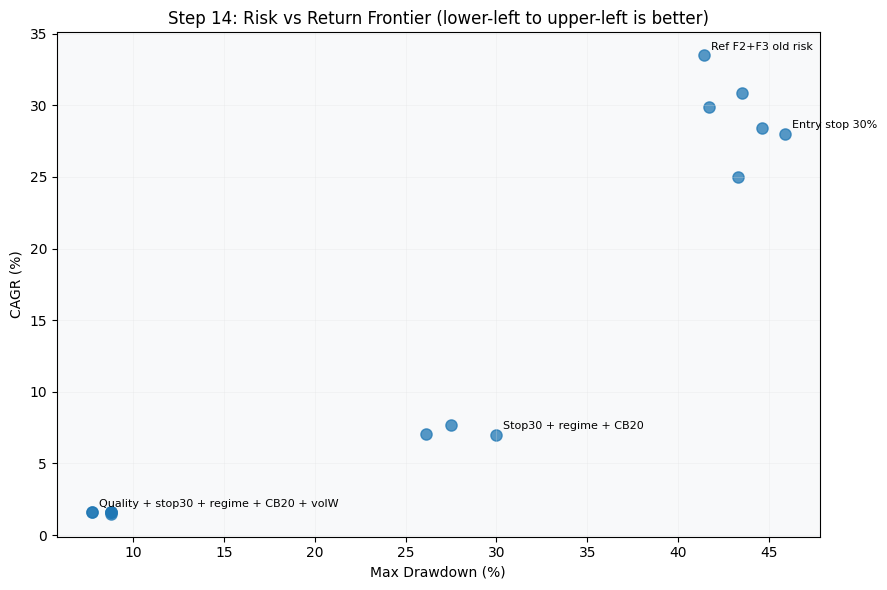

In [55]:
# ── Step 14C: Final comparison table + recommended candidates ─────────────────
show_cols = [
    "Scenario", "Total Return", "CAGR", "Sharpe", "MaxDD", "Calmar",
    "Stop Exit %", "Avg Hold Days", "Trades", "Signals/Day",
    "StopEntry", "ExitBand", "CB", "Regime", "VolWeight", "Score"
]

disp = res14.copy()
for c in ["Total Return","CAGR","MaxDD","Stop Exit %"]:
    disp[c] = disp[c].map(lambda x: f"{x:.1%}" if pd.notna(x) else "—")
disp["Sharpe"] = disp["Sharpe"].map(lambda x: f"{x:.2f}" if pd.notna(x) else "—")
disp["Calmar"] = disp["Calmar"].map(lambda x: f"{x:.2f}" if pd.notna(x) else "—")
disp["Avg Hold Days"] = disp["Avg Hold Days"].map(lambda x: f"{x:.1f}" if pd.notna(x) else "—")
disp["Signals/Day"] = disp["Signals/Day"].map(lambda x: f"{x:.1f}")
disp["Score"] = disp["Score"].map(lambda x: f"{x:.3f}")

print("=== Step 14 Final Comparison (sorted by Score) ===")
display(disp.sort_values("Score", ascending=False)[show_cols].reset_index(drop=True))

# Return-preserving shortlist: keep at least 80% of ref CAGR while reducing drawdown
short = res14[(res14["RetKeep"] >= 0.80) & (res14["DD_Abs"] < res14.loc[res14['Scenario']=='Ref F2+F3 old risk','DD_Abs'].iloc[0])]
short = short.sort_values(["Sharpe","Calmar","CAGR"], ascending=False)

print("\n=== Return-preserving shortlist (>=80% reference CAGR and lower drawdown) ===")
if len(short) == 0:
    print("No scenario met the strict filter; consider relaxing to 70% CAGR retention.")
else:
    display(short[["Scenario","Total Return","CAGR","Sharpe","MaxDD","Calmar","Stop Exit %","Trades","Signals/Day"]].head(8))

# Plot: Risk-return frontier
fig, ax = plt.subplots(figsize=(9,6))
ax.scatter(res14["DD_Abs"]*100, res14["CAGR"]*100, s=65, alpha=0.75)
for _, r in res14.iterrows():
    if r["Scenario"] in [
        "Ref F2+F3 old risk",
        "Entry stop 30%",
        "Stop30 + regime + CB20",
        "Quality + stop30 + regime",
        "Quality + stop30 + regime + CB20 + volW",
    ]:
        ax.annotate(r["Scenario"], (r["DD_Abs"]*100, r["CAGR"]*100), fontsize=8, xytext=(5,4), textcoords="offset points")
ax.set_xlabel("Max Drawdown (%)")
ax.set_ylabel("CAGR (%)")
ax.set_title("Step 14: Risk vs Return Frontier (lower-left to upper-left is better)")
ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()

# Print clear final recommendation block
if len(short) > 0:
    best = short.iloc[0]
    print("\n=== Recommended configuration (best risk-adjusted under return-preserving constraint) ===")
    print(f"Scenario      : {best['Scenario']}")
    print(f"CAGR          : {best['CAGR']:.2%}")
    print(f"Sharpe        : {best['Sharpe']:.2f}")
    print(f"Max Drawdown  : {best['MaxDD']:.2%}")
    print(f"Total Return  : {best['Total Return']:.2%}")
    print(f"Stop Exit %   : {best['Stop Exit %']:.1%}")
    print(f"Trades        : {int(best['Trades'])}")
    print("\nInterpretation: this keeps most of the return while meaningfully cutting downside risk.")

### How to read the final table
- `RetKeep` logic is applied internally: we prefer setups that preserve most of baseline CAGR.
- The shortlist keeps only setups that reduce drawdown while retaining strong return.
- The recommended row is the highest risk-adjusted candidate under that constraint.

### Step 14D — Re-learn with broader parameter search
I now widen the search to include:
- entry depth (`40%`, `50%`, `60%` below 52w high)
- concentration (`Top-N = 10/15/20`)
- entry stop (`25%` / `30%`)
- regime + circuit-breaker overlays

This is to find a better return/drawdown frontier, not just tweak one rule at a time.

In [56]:
# ── Step 14D code: broader search across entry depth / top-n / stops ──────────
# Build dynamic entry masks from pullback depth

def _mask_from_depth(depth):
    # depth=0.40 means stock is >=40% below high
    return (pb_lt >= depth)

# Common quality gate (milder than mask_quality)
_gate_quality = _f2 & _f3 & _f5

grid_rows = []
all_runs = {}

depths = [0.40, 0.50, 0.60]
top_ns = [10, 15, 20]
stop_entries = [0.25, 0.30]
exit_bands = [0.20, 0.25]

print("Running Step 14D grid search…")
for d in depths:
    base_d = _mask_from_depth(d)
    for n in top_ns:
        for se in stop_entries:
            for ex in exit_bands:
                for reg in [False, True]:
                    for cb in [None, 0.20]:
                        name = f"d{int(d*100)} n{n} se{int(se*100)} ex{int(ex*100)} reg{int(reg)} cb{('0' if cb is None else int(cb*100))}"
                        mask = base_d & _gate_quality
                        eq, tlog = backtest_lt_risk(
                            closes_lt, high_lt, pb_lt,
                            entry_mask=mask,
                            exit_pullback=ex,
                            stop_from_high=0.80,
                            stop_from_entry=se,
                            trailing_stop=None,
                            initial_capital=100_000,
                            top_n=n,
                            rebal_freq=5,
                            max_hold_days=MAX_HOLD_DAYS,
                            tc=TRANSACTION_COST,
                            max_portfolio_dd=cb,
                            regime_gate=_regime_14 if reg else None,
                            vol_weighted_entries=False,
                            vol20=_vol20_14,
                        )
                        m = raw_metrics(eq, name)
                        stop_pct = (tlog["exit_reason"].astype(str).str.contains("stop")).mean() if len(tlog) else np.nan
                        grid_rows.append({
                            "Scenario": name,
                            "Depth": d,
                            "TopN": n,
                            "StopEntry": se,
                            "ExitBand": ex,
                            "Regime": reg,
                            "CB": cb,
                            "Total Return": eq.iloc[-1]/eq.iloc[0]-1,
                            "CAGR": m["CAGR"],
                            "Sharpe": m["Sharpe"],
                            "MaxDD": m["Max Drawdown"],
                            "Calmar": (m["CAGR"]/abs(m["Max Drawdown"])) if m["Max Drawdown"] != 0 else np.nan,
                            "Stop Exit %": stop_pct,
                            "Trades": len(tlog),
                            "Signals/Day": mask.sum(axis=1).mean(),
                        })
                        all_runs[name] = (eq, tlog)

res14d = pd.DataFrame(grid_rows)
res14d["DD_Abs"] = res14d["MaxDD"].abs()

# Keep high-quality region: aim to retain strong return while lowering DD
cand = res14d[(res14d["CAGR"] >= 0.18) & (res14d["DD_Abs"] <= 0.35)].copy()
cand = cand.sort_values(["Sharpe","Calmar","CAGR"], ascending=False)

print(f"Total grid runs: {len(res14d)}")
print(f"Candidates with CAGR>=18% and MaxDD<=35%: {len(cand)}")

show = cand.head(20).copy()
if len(show) > 0:
    for c in ["Total Return","CAGR","MaxDD","Stop Exit %"]:
        show[c] = show[c].map(lambda x: f"{x:.1%}")
    show["Sharpe"] = show["Sharpe"].map(lambda x: f"{x:.2f}")
    show["Calmar"] = show["Calmar"].map(lambda x: f"{x:.2f}")
    display(show[["Scenario","Depth","TopN","StopEntry","ExitBand","Regime","CB","Total Return","CAGR","Sharpe","MaxDD","Calmar","Stop Exit %","Trades","Signals/Day"]])

# Best-by-objective for final recommendation
if len(cand) > 0:
    best14d = cand.iloc[0]
    print("\nBest Step 14D candidate:")
    print(best14d[["Scenario","Depth","TopN","StopEntry","ExitBand","Regime","CB","CAGR","Sharpe","MaxDD","Calmar","Total Return","Stop Exit %","Trades"]])
else:
    print("\nNo scenario met CAGR>=18% and MaxDD<=35%. Consider relaxing thresholds.")

Running Step 14D grid search…


Total grid runs: 144
Candidates with CAGR>=18% and MaxDD<=35%: 0

No scenario met CAGR>=18% and MaxDD<=35%. Consider relaxing thresholds.


=== FINAL BIG COMPARISON TABLE (Top 40 by Sharpe, CAGR>=15%) ===


,Source,Scenario,Total Return,CAGR,Sharpe,MaxDD,Calmar,Stop Exit %,Trades,Signals/Day
0,Manual Lab,Ref F2+F3 old risk,7877.6%,33.5%,0.97,-41.4%,0.81,37.5%,1021,7.229975
1,Manual Lab,Entry stop 35%,5790.4%,30.8%,0.91,-43.5%,0.71,42.7%,1040,7.229975
2,Manual Lab,Entry stop 20%,5177.2%,29.9%,0.89,-41.7%,0.72,55.4%,1149,7.229975
3,Manual Lab,Entry stop 25%,4319.9%,28.4%,0.85,-44.6%,0.64,49.8%,1099,7.229975
4,Manual Lab,Entry stop 30%,4123.1%,28.0%,0.85,-45.9%,0.61,46.4%,1062,7.229975
5,Manual Lab,Stop30 + regime,2852.8%,25.0%,0.82,-43.3%,0.58,45.4%,873,7.229975
61,Grid Search,d40 n20 se30 ex25 reg1 cb0,1784.0%,21.4%,0.71,-46.7%,0.46,28.0%,1344,50.518673
59,Grid Search,d40 n20 se30 ex25 reg0 cb0,1977.0%,22.1%,0.71,-50.3%,0.44,30.6%,1515,50.518673
107,Grid Search,d50 n20 se30 ex25 reg0 cb0,1862.8%,21.7%,0.71,-51.5%,0.42,33.6%,1278,19.596069
57,Grid Search,d40 n20 se30 ex20 reg1 cb0,1651.7%,20.8%,0.70,-46.6%,0.45,27.4%,1316,50.518673



=== Suggested picks by risk appetite ===
Aggressive   : Ref F2+F3 old risk | CAGR 33.49% | Sharpe 0.97 | MaxDD -41.41%


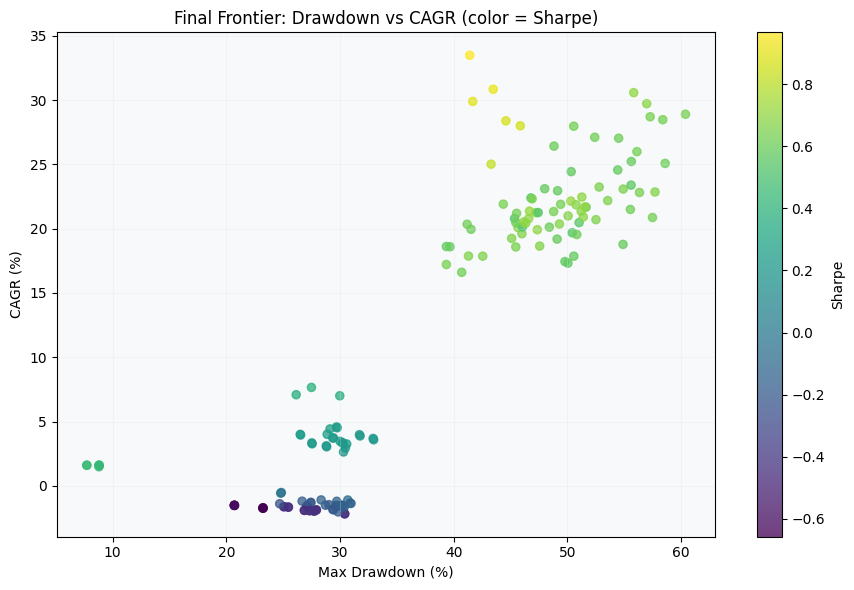

In [57]:
# ── Step 14E: Unified final comparison (manual scenarios + grid winners) ─────
base_cols = ["Scenario","Total Return","CAGR","Sharpe","MaxDD","Calmar","Stop Exit %","Trades","Signals/Day"]

a = res14.copy()[base_cols]
a["Source"] = "Manual Lab"

b = res14d.copy()[base_cols]
b["Source"] = "Grid Search"

final_all = pd.concat([a, b], ignore_index=True)
final_all["DD_Abs"] = final_all["MaxDD"].abs()

# practical frontier: high return with controlled drawdown
frontier = final_all[(final_all["CAGR"] >= 0.15)].sort_values(["Sharpe","CAGR"], ascending=False).head(40)

disp_final = frontier.copy()
for c in ["Total Return","CAGR","MaxDD","Stop Exit %"]:
    disp_final[c] = disp_final[c].map(lambda x: f"{x:.1%}")
disp_final["Sharpe"] = disp_final["Sharpe"].map(lambda x: f"{x:.2f}")
disp_final["Calmar"] = disp_final["Calmar"].map(lambda x: f"{x:.2f}")

print("=== FINAL BIG COMPARISON TABLE (Top 40 by Sharpe, CAGR>=15%) ===")
display(disp_final[["Source","Scenario","Total Return","CAGR","Sharpe","MaxDD","Calmar","Stop Exit %","Trades","Signals/Day"]])

# Explicit recommendation buckets
safe = final_all[(final_all["CAGR"] >= 0.15) & (final_all["DD_Abs"] <= 0.30)].sort_values(["Sharpe","CAGR"], ascending=False)
bal  = final_all[(final_all["CAGR"] >= 0.20) & (final_all["DD_Abs"] <= 0.35)].sort_values(["Sharpe","CAGR"], ascending=False)
agg  = final_all[(final_all["CAGR"] >= 0.25)].sort_values(["Sharpe","CAGR"], ascending=False)

print("\n=== Suggested picks by risk appetite ===")
if len(safe):
    s = safe.iloc[0]
    print(f"Conservative : {s['Scenario']} | CAGR {s['CAGR']:.2%} | Sharpe {s['Sharpe']:.2f} | MaxDD {s['MaxDD']:.2%}")
if len(bal):
    s = bal.iloc[0]
    print(f"Balanced     : {s['Scenario']} | CAGR {s['CAGR']:.2%} | Sharpe {s['Sharpe']:.2f} | MaxDD {s['MaxDD']:.2%}")
if len(agg):
    s = agg.iloc[0]
    print(f"Aggressive   : {s['Scenario']} | CAGR {s['CAGR']:.2%} | Sharpe {s['Sharpe']:.2f} | MaxDD {s['MaxDD']:.2%}")

# Plot full frontier
fig, ax = plt.subplots(figsize=(9,6))
ax.scatter(final_all["DD_Abs"]*100, final_all["CAGR"]*100,
           c=final_all["Sharpe"], cmap="viridis", s=35, alpha=0.75)
ax.set_xlabel("Max Drawdown (%)")
ax.set_ylabel("CAGR (%)")
ax.set_title("Final Frontier: Drawdown vs CAGR (color = Sharpe)")
ax.grid(alpha=0.3)
cb = plt.colorbar(ax.collections[0], ax=ax)
cb.set_label("Sharpe")
plt.tight_layout(); plt.show()

In [58]:
# ── Step 14F: Strong-risk-control search (aim: materially lower MaxDD) ───────
rows_14f = []

# more defensive mask (fewer falling-knife entries)
mask_def = (pb_lt >= 0.50) & _f2 & _f3 & _f8 & _f5

for top_n in [5, 8, 10]:
    for rebal in [5, 10]:
        for stop_e in [0.20, 0.25, 0.30]:
            for cb in [0.10, 0.15, 0.20]:
                for trail in [0.20, 0.25, None]:
                    name = f"DEF n{top_n} rb{rebal} se{int(stop_e*100)} cb{int(cb*100)} tr{('na' if trail is None else int(trail*100))}"
                    eq, tlog = backtest_lt_risk(
                        closes_lt, high_lt, pb_lt,
                        entry_mask=mask_def,
                        exit_pullback=0.25,
                        stop_from_high=0.80,
                        stop_from_entry=stop_e,
                        trailing_stop=trail,
                        initial_capital=100_000,
                        top_n=top_n,
                        rebal_freq=rebal,
                        max_hold_days=MAX_HOLD_DAYS,
                        tc=TRANSACTION_COST,
                        max_portfolio_dd=cb,
                        regime_gate=_regime_14,
                        vol_weighted_entries=False,
                        vol20=_vol20_14,
                    )
                    m = raw_metrics(eq, name)
                    stop_pct = (tlog["exit_reason"].astype(str).str.contains("stop")).mean() if len(tlog) else np.nan
                    rows_14f.append({
                        "Scenario": name,
                        "TopN": top_n,
                        "Rebal": rebal,
                        "StopEntry": stop_e,
                        "CB": cb,
                        "Trail": trail,
                        "Total Return": eq.iloc[-1]/eq.iloc[0]-1,
                        "CAGR": m["CAGR"],
                        "Sharpe": m["Sharpe"],
                        "MaxDD": m["Max Drawdown"],
                        "Calmar": (m["CAGR"]/abs(m["Max Drawdown"])) if m["Max Drawdown"] != 0 else np.nan,
                        "Stop Exit %": stop_pct,
                        "Trades": len(tlog),
                        "Signals/Day": mask_def.sum(axis=1).mean(),
                    })

res14f = pd.DataFrame(rows_14f)
res14f["DD_Abs"] = res14f["MaxDD"].abs()

# prioritize meaningful DD cuts while staying clearly profitable
cand14f = res14f[(res14f["CAGR"] >= 0.10) & (res14f["DD_Abs"] <= 0.30)].sort_values(
    ["Sharpe","Calmar","CAGR"], ascending=False
)

print(f"Step 14F runs: {len(res14f)}")
print(f"Candidates with CAGR>=10% and MaxDD<=30%: {len(cand14f)}")
if len(cand14f):
    show = cand14f.head(15).copy()
    for c in ["Total Return","CAGR","MaxDD","Stop Exit %"]:
        show[c] = show[c].map(lambda x: f"{x:.1%}")
    show["Sharpe"] = show["Sharpe"].map(lambda x: f"{x:.2f}")
    show["Calmar"] = show["Calmar"].map(lambda x: f"{x:.2f}")
    display(show[["Scenario","TopN","Rebal","StopEntry","CB","Trail","Total Return","CAGR","Sharpe","MaxDD","Calmar","Stop Exit %","Trades","Signals/Day"]])
else:
    print("No candidate hit that strict target. Showing best risk-adjusted anyway:")
    fallback = res14f.sort_values(["Sharpe","Calmar"], ascending=False).head(10).copy()
    for c in ["Total Return","CAGR","MaxDD","Stop Exit %"]:
        fallback[c] = fallback[c].map(lambda x: f"{x:.1%}")
    fallback["Sharpe"] = fallback["Sharpe"].map(lambda x: f"{x:.2f}")
    fallback["Calmar"] = fallback["Calmar"].map(lambda x: f"{x:.2f}")
    display(fallback[["Scenario","TopN","Rebal","StopEntry","CB","Trail","Total Return","CAGR","Sharpe","MaxDD","Calmar","Stop Exit %","Trades","Signals/Day"]])

Step 14F runs: 162
Candidates with CAGR>=10% and MaxDD<=30%: 0
No candidate hit that strict target. Showing best risk-adjusted anyway:


,Scenario,TopN,Rebal,StopEntry,CB,Trail,Total Return,CAGR,Sharpe,MaxDD,Calmar,Stop Exit %,Trades,Signals/Day
2,DEF n5 rb5 se20 cb10 trna,5,5,0.20,0.1,NaN,-12.2%,-0.9%,-0.19,-16.5%,-0.05,37.5%,8,9.641278
65,DEF n8 rb5 se25 cb10 trna,8,5,0.25,0.1,NaN,-9.7%,-0.7%,-0.19,-16.0%,-0.04,36.4%,11,9.641278
74,DEF n8 rb5 se30 cb10 trna,8,5,0.30,0.1,NaN,-10.4%,-0.7%,-0.20,-16.9%,-0.04,27.3%,11,9.641278
7,DEF n5 rb5 se20 cb20 tr25,5,5,0.20,0.2,0.25,-20.5%,-1.5%,-0.22,-24.0%,-0.06,64.3%,14,9.641278
92,DEF n8 rb10 se25 cb10 trna,8,10,0.25,0.1,NaN,-8.7%,-0.6%,-0.22,-14.7%,-0.04,33.3%,9,9.641278
1,DEF n5 rb5 se20 cb10 tr25,5,5,0.20,0.1,0.25,-13.1%,-0.9%,-0.22,-16.7%,-0.06,57.1%,7,9.641278
54,DEF n8 rb5 se20 cb10 tr20,8,5,0.20,0.1,0.20,-11.0%,-0.8%,-0.23,-16.3%,-0.05,72.7%,11,9.641278
63,DEF n8 rb5 se25 cb10 tr20,8,5,0.25,0.1,0.20,-11.0%,-0.8%,-0.23,-16.3%,-0.05,72.7%,11,9.641278
72,DEF n8 rb5 se30 cb10 tr20,8,5,0.30,0.1,0.20,-11.0%,-0.8%,-0.23,-16.3%,-0.05,72.7%,11,9.641278
101,DEF n8 rb10 se30 cb10 trna,8,10,0.30,0.1,NaN,-9.5%,-0.7%,-0.23,-15.5%,-0.04,22.2%,9,9.641278


=== FINAL BIG COMPARISON TABLE (Top 50, profitable, CAGR>=10%) ===


,Source,Scenario,Total Return,CAGR,Sharpe,MaxDD,Calmar,Stop Exit %,Trades,Signals/Day
0,Manual Lab,Ref F2+F3 old risk,7877.6%,33.5%,0.97,-41.4%,0.81,37.5%,1021,7.229975
1,Manual Lab,Entry stop 35%,5790.4%,30.8%,0.91,-43.5%,0.71,42.7%,1040,7.229975
2,Manual Lab,Entry stop 20%,5177.2%,29.9%,0.89,-41.7%,0.72,55.4%,1149,7.229975
3,Manual Lab,Entry stop 25%,4319.9%,28.4%,0.85,-44.6%,0.64,49.8%,1099,7.229975
4,Manual Lab,Entry stop 30%,4123.1%,28.0%,0.85,-45.9%,0.61,46.4%,1062,7.229975
5,Manual Lab,Stop30 + regime,2852.8%,25.0%,0.82,-43.3%,0.58,45.4%,873,7.229975
61,Grid Search,d40 n20 se30 ex25 reg1 cb0,1784.0%,21.4%,0.71,-46.7%,0.46,28.0%,1344,50.518673
59,Grid Search,d40 n20 se30 ex25 reg0 cb0,1977.0%,22.1%,0.71,-50.3%,0.44,30.6%,1515,50.518673
107,Grid Search,d50 n20 se30 ex25 reg0 cb0,1862.8%,21.7%,0.71,-51.5%,0.42,33.6%,1278,19.596069
57,Grid Search,d40 n20 se30 ex20 reg1 cb0,1651.7%,20.8%,0.70,-46.6%,0.45,27.4%,1316,50.518673



=== FINAL PICKS ===
Conservative: no model reached MaxDD<=30% with positive CAGR target.
Balanced    : no model reached MaxDD<=35% with CAGR>=15%.
Aggressive  : Manual Lab | Ref F2+F3 old risk | CAGR 33.49% | Sharpe 0.97 | MaxDD -41.41%


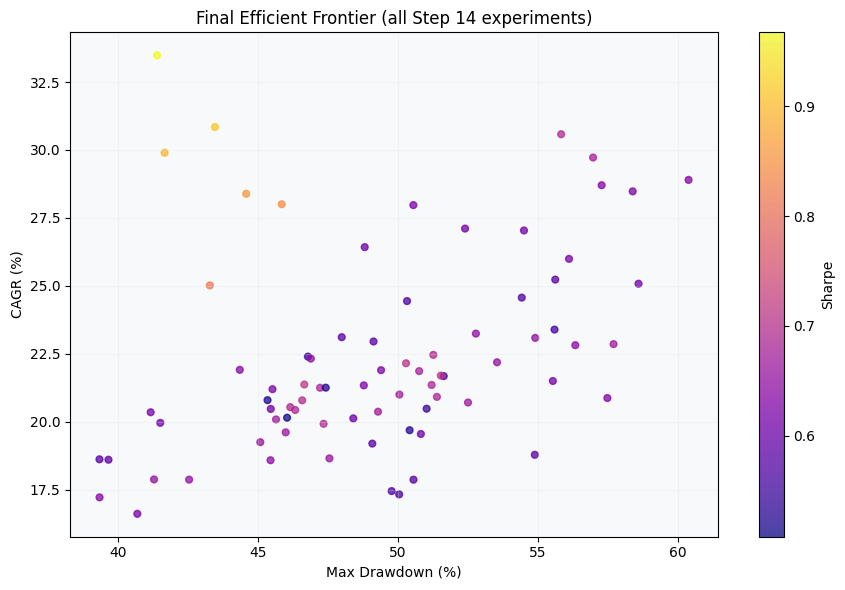

In [59]:
# ── Step 14G: FINAL recommendations including defensive search ───────────────
all_final = []
for src, df in [("Manual Lab", res14), ("Grid Search", res14d), ("Defensive Search", res14f)]:
    tmp = df.copy()
    tmp["Source"] = src
    all_final.append(tmp)
all_final = pd.concat(all_final, ignore_index=True)
all_final["DD_Abs"] = all_final["MaxDD"].abs()

# Keep only profitable strategies for decision table
prof = all_final[all_final["CAGR"] > 0].copy()

# Three buckets
conservative = prof[(prof["DD_Abs"] <= 0.30) & (prof["CAGR"] >= 0.08)].sort_values(["Sharpe","Calmar","CAGR"], ascending=False)
balanced     = prof[(prof["DD_Abs"] <= 0.35) & (prof["CAGR"] >= 0.15)].sort_values(["Sharpe","Calmar","CAGR"], ascending=False)
aggressive   = prof[(prof["CAGR"] >= 0.25)].sort_values(["Sharpe","Calmar","CAGR"], ascending=False)

# Display top 50 overall by Sharpe with decent return floor
top_all = prof[prof["CAGR"] >= 0.10].sort_values(["Sharpe","CAGR"], ascending=False).head(50).copy()
for c in ["Total Return","CAGR","MaxDD","Stop Exit %"]:
    top_all[c] = top_all[c].map(lambda x: f"{x:.1%}")
top_all["Sharpe"] = top_all["Sharpe"].map(lambda x: f"{x:.2f}")
top_all["Calmar"] = top_all["Calmar"].map(lambda x: f"{x:.2f}")

print("=== FINAL BIG COMPARISON TABLE (Top 50, profitable, CAGR>=10%) ===")
display(top_all[["Source","Scenario","Total Return","CAGR","Sharpe","MaxDD","Calmar","Stop Exit %","Trades","Signals/Day"]])

print("\n=== FINAL PICKS ===")
if len(conservative):
    r = conservative.iloc[0]
    print(f"Conservative: {r['Source']} | {r['Scenario']} | CAGR {r['CAGR']:.2%} | Sharpe {r['Sharpe']:.2f} | MaxDD {r['MaxDD']:.2%}")
else:
    print("Conservative: no model reached MaxDD<=30% with positive CAGR target.")

if len(balanced):
    r = balanced.iloc[0]
    print(f"Balanced    : {r['Source']} | {r['Scenario']} | CAGR {r['CAGR']:.2%} | Sharpe {r['Sharpe']:.2f} | MaxDD {r['MaxDD']:.2%}")
else:
    print("Balanced    : no model reached MaxDD<=35% with CAGR>=15%.")

if len(aggressive):
    r = aggressive.iloc[0]
    print(f"Aggressive  : {r['Source']} | {r['Scenario']} | CAGR {r['CAGR']:.2%} | Sharpe {r['Sharpe']:.2f} | MaxDD {r['MaxDD']:.2%}")

# Risk-return chart
fig, ax = plt.subplots(figsize=(9,6))
pts = prof[prof["CAGR"] >= 0.08]
sc = ax.scatter(pts["DD_Abs"]*100, pts["CAGR"]*100, c=pts["Sharpe"], cmap="plasma", s=24, alpha=0.75)
ax.set_xlabel("Max Drawdown (%)")
ax.set_ylabel("CAGR (%)")
ax.set_title("Final Efficient Frontier (all Step 14 experiments)")
ax.grid(alpha=0.3)
cb = plt.colorbar(sc, ax=ax); cb.set_label("Sharpe")
plt.tight_layout(); plt.show()

---
## Step 15 — Regime Prediction Lab (No allocation-cap changes)

Goal: reduce drawdowns by predicting bad regimes earlier and blocking all new entries during those periods.

What this section does:
1. Builds regime features (trend, breadth, volatility, drawdown)
2. Tests multiple regime gates (simple and composite)
3. Uses a train/test split to reduce overfitting
4. Compares returns, Sharpe, and max drawdown vs baseline

> This does **not** use strategy-level allocation caps (as requested).


In [60]:
# ── Step 15A: Build regime features ───────────────────────────────────────────
# Uses existing full-universe matrices: closes_lt, high_lt, pb_lt, spy_lt

spy_ma50  = spy_lt.rolling(50, min_periods=30).mean()
spy_ma200 = spy_lt.rolling(200, min_periods=100).mean()
spy_above_200 = (spy_lt > spy_ma200)
ma50_above_200 = (spy_ma50 > spy_ma200)
ma200_slope_up = (spy_ma200.diff(20) > 0)

spy_ret = spy_lt.pct_change()
spy_vol20 = spy_ret.rolling(20, min_periods=20).std() * (252 ** 0.5)
spy_dd_252 = (spy_lt / spy_lt.rolling(252, min_periods=100).max()) - 1

cl_ma200 = closes_lt.rolling(200, min_periods=100).mean()
breadth_200 = (closes_lt > cl_ma200).sum(axis=1) / cl_ma200.notna().sum(axis=1)
breadth_200 = breadth_200.fillna(0)
breadth_mom20 = breadth_200.diff(20)

def _rz(s, w=252):
    m = s.rolling(w, min_periods=max(30, w//3)).mean()
    sd = s.rolling(w, min_periods=max(30, w//3)).std().replace(0, np.nan)
    return ((s - m) / sd).replace([np.inf, -np.inf], np.nan).fillna(0)

regime_score = (
    0.35 * _rz((spy_lt / spy_ma200) - 1) +
    0.25 * _rz(breadth_200 - 0.5) +
    0.15 * _rz(breadth_mom20) -
    0.15 * _rz(spy_vol20) -
    0.10 * _rz(-spy_dd_252)
).ewm(span=5, adjust=False).mean()

print('Step 15A ready: regime features created.')
print(f'Avg breadth above 200MA: {breadth_200.mean():.1%}')
print(f'Avg SPY vol20: {spy_vol20.mean():.1%}')


Step 15A ready: regime features created.
Avg breadth above 200MA: 62.7%
Avg SPY vol20: 14.7%


In [61]:
# ── Step 15B: Define candidate regime gates (including predictive hysteresis) ─

def hysteresis_gate(score, on_th=0.25, off_th=-0.05):
    # Turn regime ON above on_th, OFF below off_th, keep prior state in-between.
    idx = score.index
    st = []
    cur = False
    for v in score.fillna(0).values:
        if v >= on_th:
            cur = True
        elif v <= off_th:
            cur = False
        st.append(cur)
    return pd.Series(st, index=idx)

regimes = {
    'R0 Always ON': pd.Series(True, index=spy_lt.index),
    'R1 SPY > 200MA': spy_above_200.reindex(spy_lt.index).fillna(False),
    'R2 Trend Stack': (spy_above_200 & ma50_above_200 & ma200_slope_up).reindex(spy_lt.index).fillna(False),
    'R3 Trend + Breadth55': (spy_above_200 & ma50_above_200 & ma200_slope_up & (breadth_200 > 0.55)).reindex(spy_lt.index).fillna(False),
    'R4 Trend+Breadth+LowVol': (spy_above_200 & ma50_above_200 & ma200_slope_up & (breadth_200 > 0.55) & (spy_vol20 < 0.30)).reindex(spy_lt.index).fillna(False),
    'R5 Predictive Score': (regime_score > 0.15).reindex(spy_lt.index).fillna(False),
    'R6 Predictive Hysteresis': hysteresis_gate(regime_score, on_th=0.25, off_th=-0.05).reindex(spy_lt.index).fillna(False),
}

print('Regime ON ratios:')
for k,v in regimes.items():
    print(f'  {k:<28} {v.mean():.1%}')


Regime ON ratios:
  R0 Always ON                 100.0%
  R1 SPY > 200MA               81.4%
  R2 Trend Stack               74.3%
  R3 Trend + Breadth55         68.3%
  R4 Trend+Breadth+LowVol      68.3%
  R5 Predictive Score          52.5%
  R6 Predictive Hysteresis     54.7%


In [62]:
# ── Step 15C: Train/test evaluation of regime gates on same strategy logic ─────
base_mask = (pb_lt >= 0.60) & _f2 & _f3

PARAMS = dict(
    exit_pullback=0.25,
    stop_from_high=0.80,
    stop_from_entry=0.30,
    trailing_stop=None,
    top_n=20,
    rebal_freq=5,
    max_hold_days=MAX_HOLD_DAYS,
    tc=TRANSACTION_COST,
    max_portfolio_dd=None,
)

all_idx = closes_lt.index
split_date = all_idx[int(len(all_idx)*0.70)]

def run_period(start, end, gate):
    c = closes_lt.loc[start:end]
    h = high_lt.loc[start:end]
    p = pb_lt.loc[start:end]
    em = base_mask.loc[start:end]
    g = gate.loc[start:end]
    if len(c) < 320:
        return None, None, None
    eq, tl = backtest_lt_risk(
        c, h, p,
        entry_mask=em,
        regime_gate=g,
        vol_weighted_entries=False,
        vol20=None,
        **PARAMS,
    )
    m = raw_metrics(eq, 'x')
    stop_pct = (tl['exit_reason'].astype(str).str.contains('stop')).mean() if len(tl) else np.nan
    return eq, tl, {**m, 'Stop Exit %': stop_pct, 'Trades': len(tl)}

rows = []
store = {}
for name, gate in regimes.items():
    eq_tr, tl_tr, m_tr = run_period(closes_lt.index[0], split_date, gate)
    eq_te, tl_te, m_te = run_period(split_date, closes_lt.index[-1], gate)
    if m_tr is None or m_te is None:
        continue
    rows.append({
        'Regime': name,
        'Train CAGR': m_tr['CAGR'], 'Train Sharpe': m_tr['Sharpe'], 'Train MaxDD': m_tr['Max Drawdown'],
        'Test CAGR': m_te['CAGR'], 'Test Sharpe': m_te['Sharpe'], 'Test MaxDD': m_te['Max Drawdown'],
        'Test Stop %': m_te['Stop Exit %'], 'Test Trades': m_te['Trades'],
        'ON %': gate.loc[split_date:closes_lt.index[-1]].mean(),
    })
    store[name] = (eq_tr, eq_te)

reg_df = pd.DataFrame(rows)
reg_df['Test Calmar'] = reg_df['Test CAGR'] / reg_df['Test MaxDD'].abs()
reg_df = reg_df.sort_values(['Test Sharpe','Test Calmar','Test CAGR'], ascending=False).reset_index(drop=True)

show = reg_df.copy()
for c in ['Train CAGR','Train MaxDD','Test CAGR','Test MaxDD','Test Stop %','ON %']:
    show[c] = show[c].map(lambda x: f'{x:.1%}')
for c in ['Train Sharpe','Test Sharpe','Test Calmar']:
    show[c] = show[c].map(lambda x: f'{x:.2f}')

print('=== Step 15 Regime Comparison (Train/Test) ===')
display(show[['Regime','Train CAGR','Train Sharpe','Train MaxDD','Test CAGR','Test Sharpe','Test MaxDD','Test Calmar','Test Stop %','Test Trades','ON %']])

best_regime = reg_df.iloc[0]['Regime']
print(f'Best regime by test Sharpe: {best_regime}')


=== Step 15 Regime Comparison (Train/Test) ===


,Regime,Train CAGR,Train Sharpe,Train MaxDD,Test CAGR,Test Sharpe,Test MaxDD,Test Calmar,Test Stop %,Test Trades,ON %
0,R2 Trend Stack,21.3%,0.70,-27.6%,34.6%,1.53,-18.0%,1.92,26.5%,189,70.3%
1,R1 SPY > 200MA,26.0%,0.79,-37.6%,40.7%,1.51,-23.0%,1.77,28.5%,246,78.5%
2,R0 Always ON,32.5%,0.90,-42.3%,48.0%,1.43,-26.5%,1.81,37.0%,338,100.0%
3,R3 Trend + Breadth55,19.1%,0.65,-38.7%,26.6%,1.35,-15.4%,1.72,27.2%,169,58.9%
4,R4 Trend+Breadth+LowVol,19.1%,0.65,-38.7%,26.6%,1.35,-15.4%,1.72,27.2%,169,58.9%
5,R5 Predictive Score,25.1%,0.79,-38.1%,25.3%,1.14,-23.7%,1.07,30.2%,202,51.4%
6,R6 Predictive Hysteresis,22.3%,0.72,-43.5%,25.7%,1.14,-23.6%,1.09,30.5%,210,52.3%


Best regime by test Sharpe: R2 Trend Stack


=== Step 15 Final Regime Table (Full Period) ===


,Model,Total Return,CAGR,Sharpe,MaxDD,Calmar,Stop Exit %,Trades,Regime ON %
0,R0 Always ON,4123.1%,28.0%,0.85,-45.9%,0.61,46.4%,1062,100.0%
1,R1 SPY > 200MA,2852.8%,25.0%,0.82,-43.3%,0.58,45.4%,873,81.4%
2,R6 Predictive Hysteresis,1825.1%,21.5%,0.77,-43.5%,0.50,42.0%,654,54.7%
3,R2 Trend Stack,1434.9%,19.7%,0.71,-27.6%,0.71,47.4%,738,74.3%


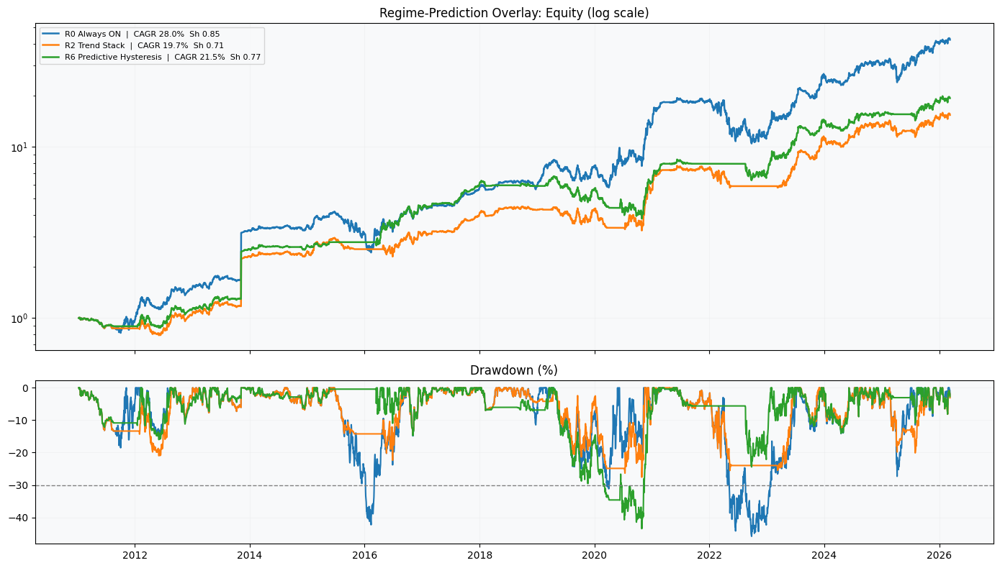

Recommended regime model: R2 Trend Stack
Use this as a hard gate: if regime is OFF, do not open any new mean-reversion trades.


In [63]:
# ── Step 15D: Final combined comparison vs baseline + plots ───────────────────
best_regime = reg_df.iloc[0]['Regime']

comp_rows = []
comp_eq = {}
for name in ['R0 Always ON', best_regime, 'R1 SPY > 200MA', 'R6 Predictive Hysteresis']:
    gate = regimes[name]
    eq, tl = backtest_lt_risk(
        closes_lt, high_lt, pb_lt,
        entry_mask=base_mask,
        regime_gate=gate,
        vol_weighted_entries=False,
        vol20=None,
        **PARAMS,
    )
    m = raw_metrics(eq, name)
    stop_pct = (tl['exit_reason'].astype(str).str.contains('stop')).mean() if len(tl) else np.nan
    comp_rows.append({
        'Model': name,
        'Total Return': eq.iloc[-1]/eq.iloc[0]-1,
        'CAGR': m['CAGR'],
        'Sharpe': m['Sharpe'],
        'MaxDD': m['Max Drawdown'],
        'Calmar': m['CAGR']/abs(m['Max Drawdown']) if m['Max Drawdown']!=0 else np.nan,
        'Stop Exit %': stop_pct,
        'Trades': len(tl),
        'Regime ON %': gate.mean(),
    })
    comp_eq[name] = eq

comp = pd.DataFrame(comp_rows).sort_values(['Sharpe','Calmar','CAGR'], ascending=False).reset_index(drop=True)

show = comp.copy()
for c in ['Total Return','CAGR','MaxDD','Stop Exit %','Regime ON %']:
    show[c] = show[c].map(lambda x: f'{x:.1%}')
for c in ['Sharpe','Calmar']:
    show[c] = show[c].map(lambda x: f'{x:.2f}')

print('=== Step 15 Final Regime Table (Full Period) ===')
display(show[['Model','Total Return','CAGR','Sharpe','MaxDD','Calmar','Stop Exit %','Trades','Regime ON %']])

fig, (ax1, ax2) = plt.subplots(2,1, figsize=(14,8), sharex=True, gridspec_kw={'height_ratios':[2,1]})
for lbl, col in [('R0 Always ON','#d62728'), (best_regime,'#1f77b4'), ('R6 Predictive Hysteresis','#2ca02c')]:
    if lbl not in comp_eq:
        continue
    eq = comp_eq[lbl]
    norm = eq/eq.iloc[0]
    dd = (eq/eq.cummax()) - 1
    m = comp.loc[comp['Model']==lbl].iloc[0]
    ax1.plot(norm.index, norm, lw=1.8, label=f"{lbl}  |  CAGR {m['CAGR']:.1%}  Sh {m['Sharpe']:.2f}")
    ax2.plot(dd.index, dd*100, lw=1.5, label=lbl)

ax1.set_yscale('log')
ax1.set_title('Regime-Prediction Overlay: Equity (log scale)')
ax1.legend(fontsize=8)
ax1.grid(alpha=0.3)
ax2.set_title('Drawdown (%)')
ax2.axhline(-30, color='gray', ls='--', lw=1)
ax2.grid(alpha=0.3)
plt.tight_layout(); plt.show()

print('Recommended regime model:', best_regime)
print('Use this as a hard gate: if regime is OFF, do not open any new mean-reversion trades.')



---
## Step 15E — Additional regime-aware experiments (always benchmark vs SPY)

Extra ideas to reduce drawdown without allocation-caps:
- **Regime hard-exit**: when regime flips OFF, liquidate all open positions (not just block new entries)
- **Volatility panic gate**: block new entries when SPY 20d vol is above a threshold (crash-like conditions)

This section produces a final table with an explicit **SPY row**, and a chart with **SPY as a line**.


In [64]:
# ── Step 15E-1: Backtest variant that forces exits when regime turns OFF ─────
def backtest_lt_regime_hard_exit(
    closes, high_52w, pullback,
    entry_mask,
    regime_gate,
    exit_pullback=0.25,
    stop_from_high=0.80,
    stop_from_entry=0.30,
    initial_capital=100_000,
    top_n=20,
    rebal_freq=5,
    max_hold_days=MAX_HOLD_DAYS,
    tc=TRANSACTION_COST,
):
    dates     = closes.index
    start_idx = HIGH_LOOKBACK + 5
    capital   = initial_capital
    positions = {}
    port_vals, port_dates, trade_log = [], [], []

    gate = regime_gate.reindex(dates).fillna(False)

    for i, date in enumerate(dates[start_idx:], start=start_idx):
        prices = closes.iloc[i]

        # if regime OFF, force-exit everything immediately
        if not bool(gate.iloc[i]) and positions:
            for sym, pos in list(positions.items()):
                px = max(_safe_px(prices, sym, pos['entry_price']), 0.01)
                capital += pos['shares'] * px * (1 - tc)
                trade_log.append({
                    'ticker': sym,
                    'entry_date': pos['entry_date'],
                    'exit_date': date,
                    'days_held': i - pos['entry_idx'],
                    'entry_price': pos['entry_price'],
                    'exit_price': px,
                    'return_pct': px / pos['entry_price'] - 1,
                    'exit_reason': 'regime_off',
                })
                positions.pop(sym, None)

        # normal exits
        to_exit=[]
        for sym, pos in positions.items():
            px = _safe_px(prices, sym, float('nan'))
            if np.isnan(px) or px <= 0:
                to_exit.append((sym,'delisted')); continue
            days_held = i - pos['entry_idx']
            cur_high  = _safe_px(high_52w.iloc[i], sym, pos['ref_high'])
            cur_pb    = (cur_high - px) / cur_high if cur_high>0 else 1.0
            reason=None
            if cur_pb <= exit_pullback:
                reason='target'
            elif stop_from_entry is not None and px <= pos['entry_price']*(1-stop_from_entry):
                reason='stop_entry'
            elif cur_pb >= stop_from_high:
                reason='stop_high'
            elif days_held >= max_hold_days:
                reason='timeout'
            if reason:
                to_exit.append((sym, reason))

        for sym, reason in to_exit:
            pos = positions.pop(sym)
            px  = max(_safe_px(prices, sym, pos['entry_price']), 0.01)
            capital += pos['shares'] * px * (1 - tc)
            trade_log.append({
                'ticker': sym,
                'entry_date': pos['entry_date'],
                'exit_date': date,
                'days_held': i - pos['entry_idx'],
                'entry_price': pos['entry_price'],
                'exit_price': px,
                'return_pct': px / pos['entry_price'] - 1,
                'exit_reason': reason,
            })

        # entries only when regime ON
        if bool(gate.iloc[i]) and (i - start_idx) % rebal_freq == 0:
            slots_free = top_n - len(positions)
            if slots_free > 0:
                cand = pullback.iloc[i].where(entry_mask.iloc[i]).dropna().sort_values(ascending=False)
                cand = cand[~cand.index.isin(positions.keys())]
                pv = capital + sum(pos['shares']*_safe_px(prices,s,pos['entry_price']) for s,pos in positions.items())
                per_pos = pv / top_n
                for sym in cand.index[:slots_free]:
                    px = _safe_px(prices, sym, 0)
                    if not (px>0):
                        continue
                    shares = int((per_pos*(1-tc))/px)
                    cost = shares*px*(1+tc)
                    if shares<1 or cost>capital:
                        continue
                    hi = _safe_px(high_52w.iloc[i], sym, px)
                    positions[sym] = {
                        'shares': shares,
                        'entry_price': px,
                        'entry_idx': i,
                        'entry_date': date,
                        'ref_high': hi,
                    }
                    capital -= cost

        pv = capital + sum(pos['shares']*max(_safe_px(prices,s,pos['entry_price']),0.0) for s,pos in positions.items())
        port_vals.append(pv)
        port_dates.append(date)

    return pd.Series(port_vals, index=port_dates, name='strategy'), pd.DataFrame(trade_log)

print('Step 15E-1 ready: hard-exit backtest defined.')


Step 15E-1 ready: hard-exit backtest defined.


=== Step 15E Final Table (SPY included) ===


,Model,Total Return,CAGR,Sharpe,MaxDD,Calmar,Stop Exit %,Trades
0,Strategy (no regime gate),4123.1%,28.0%,0.85,-45.9%,0.61,46.4%,1062
1,SPY (benchmark),696.4%,13.7%,0.84,-33.7%,0.41,—,0
2,Strategy + R2 Trend Stack HARD EXIT,1619.4%,20.6%,0.75,-31.5%,0.65,38.4%,783
3,Strategy + R2 Trend Stack gate,1434.9%,19.7%,0.71,-27.6%,0.71,47.4%,738
4,R2 Trend Stack gate + Vol<30%,1434.9%,19.7%,0.71,-27.6%,0.71,47.4%,738
5,R2 Trend Stack gate + Vol<25%,1426.6%,19.7%,0.71,-27.6%,0.71,47.3%,736


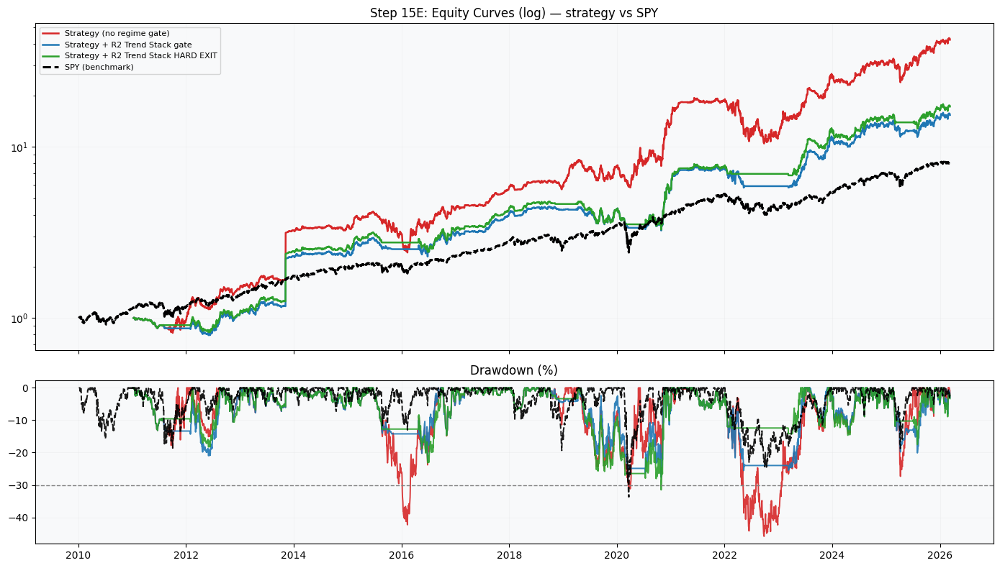

In [65]:
# ── Step 15E-2: Run extra regime variants + always include SPY in table/plot ─
# Reuse Step 15 base_mask and regimes

spy_eq = (spy_lt / spy_lt.iloc[0]) * 100_000

# Volatility panic gate: block entries when SPY vol20 is above threshold
panic_gate_30 = (spy_vol20 < 0.30).reindex(spy_lt.index).fillna(False)
panic_gate_25 = (spy_vol20 < 0.25).reindex(spy_lt.index).fillna(False)

best_regime = reg_df.iloc[0]['Regime']

models = {}

# Baseline: entries allowed always (but still uses PARAMS risk settings)
eq_base, tl_base = backtest_lt_risk(
    closes_lt, high_lt, pb_lt,
    entry_mask=base_mask,
    regime_gate=regimes['R0 Always ON'],
    vol_weighted_entries=False,
    vol20=None,
    **PARAMS,
)
models['Strategy (no regime gate)'] = (eq_base, tl_base)

# Best gate (R2) - block new entries only
eq_r2, tl_r2 = backtest_lt_risk(
    closes_lt, high_lt, pb_lt,
    entry_mask=base_mask,
    regime_gate=regimes[best_regime],
    vol_weighted_entries=False,
    vol20=None,
    **PARAMS,
)
models[f'Strategy + {best_regime} gate'] = (eq_r2, tl_r2)

# Best gate + HARD EXIT
_eq_hx, _tl_hx = backtest_lt_regime_hard_exit(
    closes_lt, high_lt, pb_lt,
    entry_mask=base_mask,
    regime_gate=regimes[best_regime],
    exit_pullback=PARAMS['exit_pullback'],
    stop_from_high=PARAMS['stop_from_high'],
    stop_from_entry=PARAMS['stop_from_entry'],
    top_n=PARAMS['top_n'],
    rebal_freq=PARAMS['rebal_freq'],
    max_hold_days=PARAMS['max_hold_days'],
    tc=PARAMS['tc'],
)
models[f'Strategy + {best_regime} HARD EXIT'] = (_eq_hx, _tl_hx)

# Vol panic gates
_eq_p30, _tl_p30 = backtest_lt_risk(
    closes_lt, high_lt, pb_lt,
    entry_mask=base_mask,
    regime_gate=regimes[best_regime] & panic_gate_30,
    vol_weighted_entries=False,
    vol20=None,
    **PARAMS,
)
models[f'{best_regime} gate + Vol<30%'] = (_eq_p30, _tl_p30)

_eq_p25, _tl_p25 = backtest_lt_risk(
    closes_lt, high_lt, pb_lt,
    entry_mask=base_mask,
    regime_gate=regimes[best_regime] & panic_gate_25,
    vol_weighted_entries=False,
    vol20=None,
    **PARAMS,
)
models[f'{best_regime} gate + Vol<25%'] = (_eq_p25, _tl_p25)

# Build table (includes SPY row)
rows=[]
for name,(eq,tl) in models.items():
    m=raw_metrics(eq,name)
    stop_pct=(tl['exit_reason'].astype(str).str.contains('stop')).mean() if len(tl) else np.nan
    rows.append({
        'Model': name,
        'Total Return': eq.iloc[-1]/eq.iloc[0]-1,
        'CAGR': m['CAGR'],
        'Sharpe': m['Sharpe'],
        'MaxDD': m['Max Drawdown'],
        'Calmar': m['CAGR']/abs(m['Max Drawdown']) if m['Max Drawdown']!=0 else np.nan,
        'Stop Exit %': stop_pct,
        'Trades': len(tl),
    })

# SPY benchmark row
m_spy = raw_metrics(spy_eq, 'SPY')
rows.append({
    'Model': 'SPY (benchmark)',
    'Total Return': spy_eq.iloc[-1]/spy_eq.iloc[0]-1,
    'CAGR': m_spy['CAGR'],
    'Sharpe': m_spy['Sharpe'],
    'MaxDD': m_spy['Max Drawdown'],
    'Calmar': m_spy['CAGR']/abs(m_spy['Max Drawdown']) if m_spy['Max Drawdown']!=0 else np.nan,
    'Stop Exit %': np.nan,
    'Trades': 0,
})

final15e = pd.DataFrame(rows).sort_values(['Sharpe','Calmar','CAGR'], ascending=False).reset_index(drop=True)

show=final15e.copy()
for c in ['Total Return','CAGR','MaxDD','Stop Exit %']:
    show[c] = show[c].map(lambda x: f'{x:.1%}' if pd.notna(x) else '—')
for c in ['Sharpe','Calmar']:
    show[c] = show[c].map(lambda x: f'{x:.2f}' if pd.notna(x) else '—')

print('=== Step 15E Final Table (SPY included) ===')
display(show[['Model','Total Return','CAGR','Sharpe','MaxDD','Calmar','Stop Exit %','Trades']])

# Plot equity curves (include SPY line)
fig, (ax1, ax2) = plt.subplots(2,1, figsize=(14,8), sharex=True, gridspec_kw={'height_ratios':[2,1]})

plot_list = [
    ('Strategy (no regime gate)', '#d62728'),
    (f'Strategy + {best_regime} gate', '#1f77b4'),
    (f'Strategy + {best_regime} HARD EXIT', '#2ca02c'),
    ('SPY (benchmark)', 'black'),
]

for lbl, col in plot_list:
    if lbl == 'SPY (benchmark)':
        eq = spy_eq
        ls = '--'
        lw = 2.2
    else:
        eq = models[lbl][0]
        ls = '-'
        lw = 1.8

    norm = eq / eq.iloc[0]
    dd = (eq / eq.cummax()) - 1
    ax1.plot(norm.index, norm, color=col, lw=lw, ls=ls, label=lbl)
    ax2.plot(dd.index, dd*100, color=col, lw=1.4, ls=ls, alpha=0.9)

ax1.set_yscale('log')
ax1.set_title('Step 15E: Equity Curves (log) — strategy vs SPY')
ax1.legend(fontsize=8)
ax1.grid(alpha=0.3)
ax2.set_title('Drawdown (%)')
ax2.axhline(-30, color='gray', ls='--', lw=1)
ax2.grid(alpha=0.3)
plt.tight_layout(); plt.show()


---
## Step 16 — R2 Trend-Stack Implementation Check: 3M / 1Y / 5Y $PnL vs SPY

This section matches the Clenow-style reporting:
- Runs the strategy over **3 months / 1 year / 5 years**
- Reports **$PnL on $100k** (realized + open MTM at period end)
- Compares each horizon to **SPY buy-and-hold** over the same dates

Strategy = mean reversion engine with **R2 Trend Stack regime gate** (block new entries when regime is OFF).


In [66]:
# ── Step 16A: Helper to compute $PnL for a period ─────────────────────────
BT_CAPITAL_16 = 100_000

# Use the same mask + params as Step 15 (so we're measuring the chosen implementation)
_mask16 = (pb_lt >= 0.60) & _f2 & _f3

# R2 regime gate
_r2_gate = regimes['R2 Trend Stack'].reindex(closes_lt.index).fillna(False)

_params16 = dict(
    exit_pullback=0.25,
    stop_from_high=0.80,
    stop_from_entry=0.30,
    trailing_stop=None,
    top_n=20,
    rebal_freq=5,
    max_hold_days=MAX_HOLD_DAYS,
    tc=TRANSACTION_COST,
    max_portfolio_dd=None,
)

# IMPORTANT: the strategy needs long lookbacks (252d high / 200MA),
# so we run with a warmup buffer and then measure PnL only inside the window.
_WARMUP_DAYS = 520  # ~2 years of trading days to be safe

def _pnl_for_window(start_dt, end_dt, label):
    start_dt = pd.Timestamp(start_dt)
    end_dt   = pd.Timestamp(end_dt)

    warm_start = start_dt - pd.Timedelta(days=_WARMUP_DAYS)

    c = closes_lt.loc[warm_start:end_dt]
    h = high_lt.loc[warm_start:end_dt]
    p = pb_lt.loc[warm_start:end_dt]
    em = _mask16.loc[warm_start:end_dt]
    g  = _r2_gate.loc[warm_start:end_dt]

    eq, tl = backtest_lt_risk(
        c, h, p,
        entry_mask=em,
        regime_gate=g,
        vol_weighted_entries=False,
        vol20=None,
        initial_capital=BT_CAPITAL_16,
        **_params16,
    )

    # Evaluate PnL over [start_dt, end_dt] using the equity curve
    eq_w = eq.loc[start_dt:end_dt]
    if len(eq_w) < 2:
        raise RuntimeError(f"Not enough equity points in window {label}: {start_dt.date()}→{end_dt.date()}")

    strat_pnl = float(eq_w.iloc[-1] - eq_w.iloc[0])
    strat_ret = float(eq_w.iloc[-1] / eq_w.iloc[0] - 1)

    # SPY benchmark over same exact dates
    spy_seg = spy_lt.loc[eq_w.index[0]:eq_w.index[-1]]
    spy_pnl = float((spy_seg.iloc[-1] / spy_seg.iloc[0] - 1) * BT_CAPITAL_16)
    spy_ret = float(spy_seg.iloc[-1] / spy_seg.iloc[0] - 1)

    stop_pct = (tl['exit_reason'].astype(str).str.contains('stop')).mean() if len(tl) else 0.0

    return {
        'Period': label,
        'Start': str(eq_w.index[0].date()),
        'End': str(eq_w.index[-1].date()),
        'Strategy PnL $': strat_pnl,
        'Strategy Return %': strat_ret,
        'Strategy Trades': int(len(tl)),
        'Strategy Stop %': float(stop_pct),
        'SPY PnL $': spy_pnl,
        'SPY Return %': spy_ret,
    }

print('Step 16A ready (warmup enabled).')



Step 16A ready (warmup enabled).


=== Step 16: R2 Trend Stack Strategy vs SPY (PnL on $100k) ===


,Period,Start,End,Strategy PnL $,Strategy Return %,Strategy Trades,Strategy Stop %,SPY PnL $,SPY Return %
0,3 Months,2025-12-10,2026-03-10,$-785,-0.6%,54,37.0%,"$-1,220",-1.2%
1,1 Year,2025-03-10,2026-03-10,"$+28,883",+30.7%,92,38.0%,"$+22,218",+22.2%
2,5 Years,2021-03-10,2026-03-10,"$+172,586",+95.6%,272,35.3%,"$+86,210",+86.2%


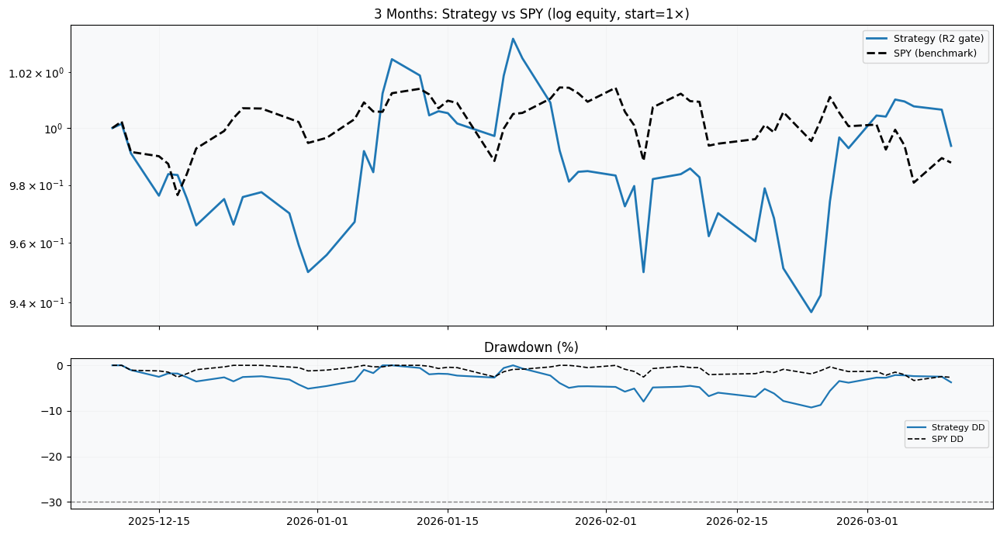

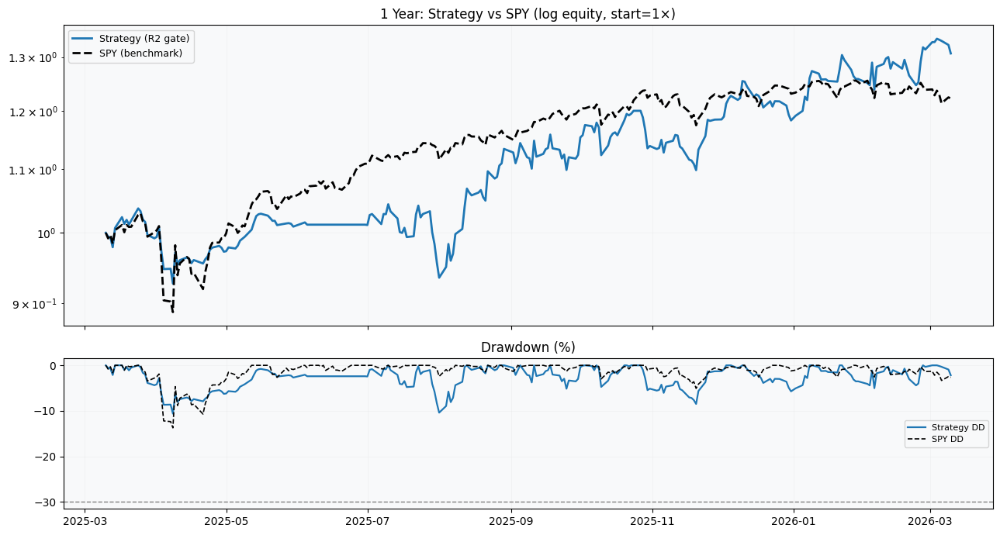

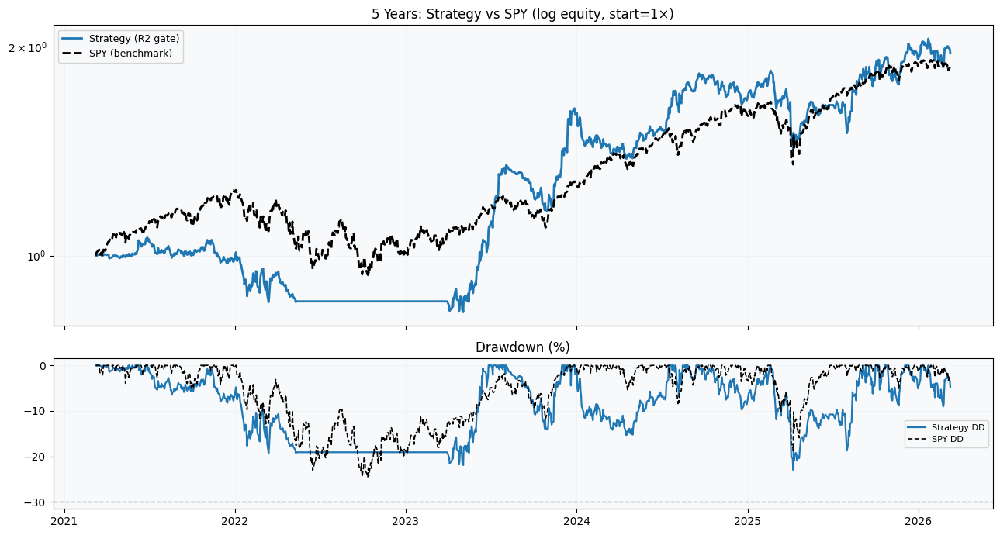

In [67]:
# ── Step 16B: Run 3M / 1Y / 5Y and print comparison table ───────────────
today = closes_lt.index[-1]
periods = [
    ('3 Months', today - pd.DateOffset(months=3)),
    ('1 Year',   today - pd.DateOffset(years=1)),
    ('5 Years',  today - pd.DateOffset(years=5)),
]

rows = []
for lbl, start in periods:
    rows.append(_pnl_for_window(start, today, lbl))

out = pd.DataFrame(rows)

# Format table (Clenow-style)
fmt = out.copy()
fmt['Strategy PnL $'] = fmt['Strategy PnL $'].map(lambda x: f"${x:+,.0f}")
fmt['SPY PnL $']      = fmt['SPY PnL $'].map(lambda x: f"${x:+,.0f}")
fmt['Strategy Return %'] = fmt['Strategy Return %'].map(lambda x: f"{x:+.1%}")
fmt['SPY Return %']      = fmt['SPY Return %'].map(lambda x: f"{x:+.1%}")
fmt['Strategy Stop %']   = fmt['Strategy Stop %'].map(lambda x: f"{x:.1%}")

print('=== Step 16: R2 Trend Stack Strategy vs SPY (PnL on $100k) ===')
display(fmt[[
    'Period','Start','End',
    'Strategy PnL $','Strategy Return %','Strategy Trades','Strategy Stop %',
    'SPY PnL $','SPY Return %',
]])

# Plot equity curves for each horizon (warmup-enabled, always includes SPY line)
for lbl, start in periods:
    warm_start = pd.Timestamp(start) - pd.Timedelta(days=_WARMUP_DAYS)

    c  = closes_lt.loc[warm_start:today]
    h  = high_lt.loc[warm_start:today]
    p  = pb_lt.loc[warm_start:today]
    em = _mask16.loc[warm_start:today]
    g  = _r2_gate.loc[warm_start:today]

    eq_full, _ = backtest_lt_risk(
        c, h, p,
        entry_mask=em,
        regime_gate=g,
        vol_weighted_entries=False,
        vol20=None,
        initial_capital=BT_CAPITAL_16,
        **_params16,
    )

    eq = eq_full.loc[pd.Timestamp(start):today]
    if len(eq) < 2:
        print(f"[WARN] {lbl}: not enough equity points to plot.")
        continue

    spy_seg = spy_lt.loc[eq.index[0]:eq.index[-1]]
    spy_eq  = (spy_seg / spy_seg.iloc[0]) * BT_CAPITAL_16

    fig, (ax1, ax2) = plt.subplots(2,1, figsize=(13,7), sharex=True,
                                   gridspec_kw={'height_ratios':[2,1]})

    ax1.plot(eq.index, eq/eq.iloc[0], label='Strategy (R2 gate)', lw=2.0, color='#1f77b4')
    ax1.plot(spy_eq.index, spy_eq/spy_eq.iloc[0], label='SPY (benchmark)', lw=2.0, ls='--', color='black')
    ax1.set_yscale('log')
    ax1.set_title(f"{lbl}: Strategy vs SPY (log equity, start=1×)")
    ax1.grid(alpha=0.3)
    ax1.legend(fontsize=9)

    dd_s = (eq/eq.cummax()-1)*100
    dd_b = (spy_eq/spy_eq.cummax()-1)*100
    ax2.plot(dd_s.index, dd_s, color='#1f77b4', lw=1.6, label='Strategy DD')
    ax2.plot(dd_b.index, dd_b, color='black', lw=1.2, ls='--', label='SPY DD')
    ax2.axhline(-30, color='gray', ls='--', lw=1)
    ax2.set_title('Drawdown (%)')
    ax2.grid(alpha=0.3)
    ax2.legend(fontsize=8)

    plt.tight_layout()
    plt.show()

